# Case Study One

In [1]:
# Authors: 
# Elton Pan, Antonio del Rio Chanona

import pylab
import pandas as pd
import scipy.integrate as scp
import numpy as np
import seaborn as sns
from pylab import *
import csv
import os
import sys
import copy
import torch
from sklearn.preprocessing import StandardScaler
import collections
import numpy.random as rnd
from scipy.spatial.distance import cdist
import sobol_seq
from scipy.optimize import minimize
eps  = np.finfo(float).eps
import random
import time
import pickle
import imageio
matplotlib.rcParams['font.sans-serif'] = "Helvetica"
matplotlib.rcParams['font.family'] = "Helvetica"
matplotlib.rcParams['font.size'] = 20
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from IPython.display import Audio # Import sound alert dependencies
from IPython import display # For live plots
from mpl_toolkits import mplot3d
from ipywidgets import interact
from __future__ import print_function
import sys
import threading
from time import sleep
try:
    import thread
except ImportError:
    import _thread as thread
    
def quit_function(fn_name):
    # print to stderr, unbuffered in Python 2.
    print('@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@{0} TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@'.format(fn_name), file=sys.stderr)
    sys.stderr.flush() # Python 3 stderr is likely buffered.
    thread.interrupt_main() # raises KeyboardInterrupt
def exit_after(s):
    '''
    use as decorator to exit process if 
    function takes longer than s seconds
    '''
    def outer(fn):
        def inner(*args, **kwargs):
            timer = threading.Timer(s, quit_function, args=[fn.__name__])
            timer.start()
            try:
                result = fn(*args, **kwargs)
            finally:
                timer.cancel()
            return result
        return inner
    return outer

def Done():
    display(Audio(url='https://sound.peal.io/ps/audios/000/000/537/original/woo_vu_luvub_dub_dub.wav', autoplay=True))
# Insert whatever audio file you want above

############ Defining Environment ##############

class Model_env: 
    
    # --- initializing model --- #
    def __init__(self, parameters, tf):
        
        # Object variable definitions
        self.parameters       = parameters
        self.tf = tf  
        
    # --- dynamic model definition --- #    
    # model takes state and action of previous time step and integrates -- definition of ODE system at time, t
    def model(self, t, state):
        # internal definitions
        params = self.parameters
        u_L  = self.u0[0] # Control for light intensity
        u_Fn = self.u0[1] # Control for nitrate input
                
        # state vector # Added Cq as the third state element
        Cx  = state[0]
        Cn  = state[1]
        Cq  = state[2]
        
        # parameters # Updated with new params
        u_m = params['u_m']; k_s = params['k_s'];
        k_i = params['k_i']; K_N = params['K_N'];
        u_d = params['u_d']; Y_nx = params['Y_nx'];
        k_m = params['k_m']; k_sq = params['k_sq'];
        k_iq = params['k_iq']; k_d = params['k_d'];
        K_Np = params['K_Np'];
        
        # algebraic equations
        
        # variable rate equations
        dev_Cx = (u_m * u_L * Cx * Cn/(Cn+K_N))/(u_L+k_s+u_L**2/k_i) - u_d*Cx
        dev_Cn = (- Y_nx*u_m* u_L * Cx * Cn/(Cn+K_N))/(u_L+k_s+u_L**2/k_i) + u_Fn
        dev_Cq = (k_m * u_L * Cx)/(u_L+k_sq+u_L**2/k_iq) - k_d * Cq/(Cn+K_Np)

        return np.array([dev_Cx, dev_Cn, dev_Cq],dtype='float64') # Added Cq

    def simulation(self, x0, controls):
        # internal definitions
        model, tf     = self.model, self.tf
        self.controls = controls
        
        # initialize simulation
        current_state = x0
        
        # simulation #ONLY ONE STEP unlike the previous code shown above
        self.u0   = controls
        ode       = scp.ode(model)                      # define ode
        ode.set_integrator('lsoda', nsteps=3000)        # define integrator
        ode.set_initial_value(current_state, tf)         # set initial value
        current_state = list(ode.integrate(ode.t + tf)) # integrate system
        xt            = current_state                   # add current state Note: here we can add randomnes as: + RandomNormal noise
        
        return xt

    def MDP_simulation(self, x0, controls): #simulate ONLY ONE STEP
        xt          = self.simulation(x0, controls) #simulate
####         xt_discrete = self.discrete_env(xt) # make output state discrete
####         return xt_discrete
        return xt #remove this if you want to discretize

    def reward(self, state):
        reward = 100*state[-1][0] - state[-1][1]              # objective function 1
        return reward

p = {'u_m' : 0.0923*0.62, 'k_s' : 178.85, 'k_i' : 447.12, 'K_N' : 393.10,
'u_d' : 0.001, 'Y_nx' : 504.49, 'k_m' : 2.544*0.62*1e-4,  'k_sq' : 23.51,
'k_iq' : 800.0, 'k_d' : 0.281, 'K_Np' : 16.89}

tf       = 240./12. # assuming 12 steps, we divide the whole horizon (240 h) over 12 for one step


# Creating the model
MDP_BioEnv = Model_env(p, tf)


def transition(old_state, action):
    '''Gives the new state given the current state and action
       Arguments
       old state : [Cx, Cn, Cq, t] 
       action    : [u_L, u_Fn]
    
       Output 
       new state : [Cx, Cn, Cq, t]
       reward    : [Cq_Terminal]
       '''
    # If terminal state is reached (episode in final step)
    if abs(old_state[3] - 240.) < 0.1:
        reward    = copy.deepcopy(old_state[2])           # Reward at terminal state is concentration of q
        new_state = MDP_BioEnv.MDP_simulation(old_state[:-1], action)  # Take action and evolve using model
        new_state.append(old_state[-1] + tf)                           # Increment time by tf (20 h)
    
    # Else if past terminal state (episode has ended)
    elif (old_state[3] > 240.):
        reward    = 0         # Zero reward given
        new_state = old_state # Loop back to itself (no evolution)
    
    # Else non-terminal state (episode has not ended)
    else:
        reward    = 0         # Zero reward given
        new_state = MDP_BioEnv.MDP_simulation(old_state[:-1], action) # Take action and evolve using model
        new_state.append(old_state[-1] + tf)                          # Increment time by tf (20 h)

    return new_state, reward

def generate_random_episode(initial_state): 
    '''Generates an episode [
                             [ [Cx, Cn, Cq, t], [u_L, u_Fn], reward ]
                             ...
                             ...
                             ]
    with random policy with
    an initial state
    '''
    # Initial state
    state  = initial_state # initial state
    episode = []
    
    # Simulate 13 steps (not 12 because we want to exit the terminal step)
    for step in range(13):
        old_state = state                  # Save old state
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        action = [u_L, u_Fn]
        
        state, reward = transition(state, action)
        episode       += [[old_state, action, reward]]
    return episode
# generate_random_episode(initial_state = [1.0,150.0,0,0]) # Test generate_random_episode


def extract_data_from_episode(episode, discount_factor = 0.9):
    '''
    Argument: An episode generated using the generate_random_episode() function
    
    Output: 13 Datapoints in the form of [[Cx, Cn, Cq, t, u_L, u_Fn], Q] for training 
            the Q-network
    '''
    Q_data = []
    for step in reversed(range(13)): # Each episode has 13 entries, and Q table is updated in reversed order
        state, action, reward = episode[step] 

        if step == 12: # If terminal state i.e. t = 240
            G = reward # Return = reward at terminal state
        else:
            G = reward + discount_factor * G  # Return = reward + discounted return of the PREVIOUS state
        
        u_L, u_Fn = action     #  Unpack controls
        state.append(u_L)       # Append u_L
        state.append(u_Fn)      # Append u_Fn
        data_point = [state, G] # Construct datapoint where state is index 0, and return is index 1
        Q_data += [data_point]
    return Q_data
# episode = generate_random_episode(initial_state = [1.0,150.0,0,0])
# extract_data_from_episode(episode, discount_factor = 0.9) # Test function

def standardize_state_Q(state): # For Q-network
    '''Argument: Un-standardized [Cx, Cn, Cq, t, u_L, u_Fn]
    Output: Standardized [Cx, Cn, Cq, t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_Q)): 
        state[feature] = (state[feature] - x_mean_Q[feature])/x_std_Q[feature]
    return state

def unstandardize_state_Q(state): # For Q-network
    '''Argument: Standardized [Cx, Cn, Cq, t, u_L, u_Fn]
    Output: Un-standardized [Cx, Cn, Cq, t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_Q)): 
        state[feature] = (state[feature] * x_std_Q[feature]) + x_mean_Q[feature]
    return state

def standardize_state_C(state): # For C-network
    '''Argument: Un-standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn]
    Output: Standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_C)): 
        state[feature] = (state[feature] - x_mean_C[feature])/x_std_C[feature]
    return state

def unstandardize_state_C(state): # For C-network
    '''Argument: Standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn]
    Output: Un-standardized [Cx, Cn, Cq, t_f - t, u_L, u_Fn] using previously determined mean and std values''' 
    for feature in range(len(x_mean_C)): 
        state[feature] = (state[feature] * x_std_C[feature]) + x_mean_C[feature]
    return state

def take_random_action(epsilon): # Epsilon represents the probability of taking a random action
    if np.random.uniform(0,1) < epsilon:
        return True
    else:
        return False
    

def max_action(state):
    '''Argument: State   [Cx, Cn, Cq, t]
       Output  : Control [u_L, u_Fn] that maximizes Q_value using stochastic optimization'''
    
    # ROUND ONE: Get a ROUGH estimate of max action
    action_distribution = []
    for i in range(200): # Take 100 actions
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        action_distribution += [[u_L, u_Fn]]

    inputs = []
    for a in action_distribution:
        s = state.copy()
        s.append(a[0]) # Append u_L
        s.append(a[1]) # Append u_Fn
        s = standardize_state_Q(s) # Standardize the input using function defined
        inputs += [s]
    inputs          = torch.tensor(inputs)
    index_of_highest_Q = np.argmax(Q_net(inputs).detach().numpy()) 

    # Unstandardize controls
    max_u_L  = (inputs[index_of_highest_Q][4] * x_std_Q[4]).item() + x_mean_Q[4]
    max_u_Fn = (inputs[index_of_highest_Q][5] * x_std_Q[5]).item() + x_mean_Q[5]
    max_control = [max_u_L, max_u_Fn]

    # ROUND TWO: Get a PRECISE estimate of max action
    action_distribution = []
    for i in range(200): # Take 100 actions
        u_L  = np.random.uniform(max(max_control[0]-50, 120), min(max_control[0]+50, 400))
        u_Fn = np.random.uniform(max(max_control[1]-5, 0), min(max_control[1]+5, 40))
        action_distribution += [[u_L, u_Fn]]

    inputs = []
    for a in action_distribution:
        s = state.copy()
        s.append(a[0]) # Append u_L
        s.append(a[1]) # Append u_Fn
        s = standardize_state_Q(s) # Standardize the input using function defined
        inputs += [s]

    inputs          = torch.tensor(inputs)
    index_of_highest_Q = np.argmax(Q_net(inputs).detach().numpy()) 

    # Unstandardize controls
    max_u_L  = (inputs[index_of_highest_Q][4] * x_std_Q[4]).item() + x_mean_Q[4]
    max_u_Fn = (inputs[index_of_highest_Q][5] * x_std_Q[5]).item() + x_mean_Q[5]
    max_control = [max_u_L, max_u_Fn] # Predict action with the highest Q value

    return max_control
# max_action([1.0, 150.0, 0, 0]) # Test function

@exit_after(10)
def score_NN_policy(NN, initial_state, num_iterations = 10, get_control = False, g1_threshold = None, g2_threshold = None):
    total_score = 0
    sum_of_policies = []
    if g1_threshold == None: # If no threshold is given (non constrained NN)
        for j in range(num_iterations): 
            state     = initial_state.copy() # Initial state
            x_data    = [state[0]] # Store initial data
            N_data    = [state[1]]
            q_data    = [state[2]]
            t_data    = [state[3]]
            my_policy = []
            for i in range(12): #take ten steps
                action     = NN(state) # Predict action using NN
                state      = transition(state, action)[0]
                my_policy += [action]
                x_data    += [state[0]]
                N_data    += [state[1]]
                q_data    += [state[2]]
                t_data    += [state[3]]
            sum_of_policies += [my_policy] # Create list of lists
            score            = q_data[12]
            total_score     += score
    elif g1_threshold != None: # If threshold given (NN with constrained)
        for j in range(num_iterations): 
            state     = initial_state.copy() # Initial state
            x_data    = [state[0]] # Store initial data
            N_data    = [state[1]]
            q_data    = [state[2]]
            t_data    = [state[3]]
            my_policy = []
            for i in range(12): #take ten steps
#                 print('state after action:', state)
                state_for_NN = state.copy()
                action     = NN(state_for_NN, g1_threshold = g1_threshold, g2_threshold = g2_threshold) # Predict action using NN
#                 print('state before action:', state)
                state      = transition(state, action)[0]
                my_policy += [action]
                x_data    += [state[0]]
                N_data    += [state[1]]
                q_data    += [state[2]]
                t_data    += [state[3]]
            sum_of_policies += [my_policy] # Create list of lists
            score            = q_data[12]
            total_score     += score
    if get_control == True:
        return total_score/num_iterations, np.array(sum_of_policies)
    else:
        return total_score/num_iterations
# score_NN_policy(max_action, [1.0, 150.0, 0, 0], num_iterations = 10)

@exit_after(5)
def generate_episode_with_NN(NN, initial_state, epsilon, g1_threshold = None, g2_threshold = None): 
    '''Generates an episode with the chosen action of each step having:
    Probability of epsilon       ---> random action
    Probability of (1 - epsilon) ---> greedy action (according to neural network)
    '''
    episode = []
    state = initial_state # Initial state
    
    if g1_threshold == None: # IF CONSTRAINTS ARE SWITCHED OFF
        for i in range(13): #take (12 + 1) steps
#             old_state = state # Old state for storing into episode
            old_state = copy.deepcopy(state)
    
            if take_random_action(epsilon): # Take random action
                u_L  = np.random.uniform(120, 400) # Pick random u_L
                u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
                action = [u_L, u_Fn]

            else:                           # Else take greedy action
                action = list(NN(old_state))

            state, reward  = transition(state, action)     # Evolve to get new state 
            episode       += [[old_state, action, reward]] # Update step
    
    elif g1_threshold != None: # IF CONSTRAINTS ARE SWITCHED ON
        for i in range(13): #take (12 + 1) steps
#             print('state at the start of each step:', state)
#             old_state_copy = copy.deepcopy(state)  # THIS IS IMPORTANT BCOS THE NN BELOW SOMEHOW DISTORTS OLD_STATE
            if take_random_action(epsilon): # Take random action
                u_L  = np.random.uniform(120, 400) # Pick random u_L
                u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
                action = [u_L, u_Fn]
            else:                           # Else take greedy action
                if i == 12: # If transition out of the terminal state, pick any action
                    action = action
#                     print('13th transition')
                else:
                    state_for_NN = copy.copy(state)
                    
#                     print('state_for_nn:', state_for_NN)
#                     print('state before acion:', state)
                    
                    action = list(NN(state_for_NN, g1_threshold = g1_threshold, g2_threshold = g2_threshold)) # APPLY THRESHOLD
#                     print('state after acion:', state)
#                     print(i)
                #                     print('old_state:', old_state)
#                 print('done')

            old_state = state.copy() # Old state for storing into episode
#             print('old_state_1:', old_state)
#             print('state before evolution:', state)
            state, reward  = transition(state, action)     # Evolve to get new state
#             print('state after evolution:', state)
#             print('')
            episode       += [[old_state, action, reward]] # Update step
    return episode
# generate_episode_with_NN(max_action, [1.0, 150.0, 0, 0], epsilon = 0.1)

def update_replay_buffer(replay_buffer, episode, discount_factor = 0.9):
    '''Argument: replay buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t, u_L, u_Fn], Q] for training NN into replay buffer
    '''
    data = extract_data_from_episode(episode, discount_factor = discount_factor) # Extract data points from episode
    for data_point in data:
        X, y = data_point # Unpack datapoint
        X = standardize_state_Q(X) # Standardize X
        y = ((y - y_mean_Q)/y_std_Q)[0] # Standardize y
        data_point = [X, y] # Repack datapoint
        replay_buffer.extend([data_point]) # Add to replay buffer
    
    return replay_buffer
# replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000
# episode = generate_episode_with_NN(max_action, [1.0, 150.0, 0, 0], epsilon = 0.1)
# update_replay_buffer(replay_buffer, episode)

def plot_episode(episode):
    '''Plots an episode and corresponding score'''
    x_list = []
    N_list =[]
    q_list =[]
    t_list =[]
    u_L_list= []
    u_Fn_list = []
    reward_list = []
    t = 0
    for step in episode:
        [Cx, Cn, Cq, t], [u_L, u_Fn], reward = step
        x_list += [Cx]
        N_list += [Cn]
        q_list += [Cq]
        t_list += [t]
        u_L_list+= [u_L]
        u_Fn_list += [u_Fn]
        reward_list += [reward]
        t += tf

    plt.figure(figsize=(10,10))

    plt.subplot(3,2,1)
    plt.plot(t_list, x_list, label = 'x trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,2)
    plt.plot(t_list, N_list, label = 'N trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,3)
    plt.plot(t_list, q_list, label = 'q trajectory', color = 'b')
    plt.legend(fontsize = 15)

    plt.subplot(3,2,5)
    plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'r')
    plt.ylim(100,420)
    plt.legend(fontsize = 15)

    plt.subplot(3,2,6)
    plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'r')
    plt.ylim(0,43)
    plt.legend(fontsize = 15)

    plt.show()
    print('Score:', q_list[-1])
    # print('x_list:', x_list)
    # print('n_list:', N_list)
    # print('q_list:', q_list)
    # print('reward_list:', reward_list)
    # print('t_list:', t_list)
# episode = generate_episode_with_NN(NN = max_action, initial_state = [1.0, 150.0, 0, 0], epsilon = 0)
# plot_episode(episode)

def plot_episode_pool(episode_pool):
    '''Plots an episode pool (n number of episodes) and corresponding score'''
    
    plt.figure(figsize=(10,10))
    x_pool = []
    N_pool = []
    q_pool = []
    t_pool = []
    u_L_pool = []
    u_Fn_pool = []
    
    for idx in range(len(episode_pool)): # Idx refers to nth episode in episode pool
        episode = episode_pool[idx]
        x_list = []
        N_list = []
        q_list = []
        t_list = []
        u_L_list = []
        u_Fn_list = []
        reward_list = []
        t = 0
        
        for step in episode:
            [Cx, Cn, Cq, t], [u_L, u_Fn], reward = step
            x_list += [Cx]
            N_list += [Cn]
            q_list += [Cq]
            t_list += [t]
            u_L_list += [u_L]
            u_Fn_list += [u_Fn]
            reward_list += [reward]
            t += tf
        
        x_pool += [x_list]
        N_pool += [N_list]
        q_pool += [q_list]
        u_L_pool += [u_L_list]
        u_Fn_pool += [u_Fn_list]
        
        plt.subplot(3,2,1)
        if idx == 0:
            plt.plot(t_list, x_list, label = 'x trajectory', color = 'grey')
            
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, x_list, label = 'x trajectory', color = 'grey')

        plt.subplot(3,2,2)
        if idx == 0:
            plt.plot(t_list, N_list, label = 'N trajectory', color = 'grey')
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, N_list, label = 'N trajectory', color = 'grey')

        plt.subplot(3,2,3)
        if idx == 0:
            plt.plot(t_list, q_list, label = 'q trajectory', color = 'grey')
            plt.legend(fontsize = 15)
        else:
            plt.plot(t_list, q_list, label = 'q trajectory', color = 'grey')

        plt.subplot(3,2,5)
        if idx == 0:
            plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'grey')
            plt.ylim(100,420)
            plt.legend(fontsize = 15)
        else:
            plt.step(t_list, u_L_list, label = 'u_L trajectory', color = 'grey')
            plt.ylim(100,420)

        plt.subplot(3,2,6)
        if idx == 0:
            plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'grey')
            plt.ylim(0,43)
            plt.legend(fontsize = 15)
        else:
            plt.step(t_list, u_Fn_list, label = 'u_Fn trajectory', color = 'grey')
            plt.ylim(0,43)
        
    x_pool = np.array(x_pool)
    N_pool = np.array(N_pool)
    q_pool = np.array(q_pool)
    u_L_pool = np.array(u_L_pool)
    u_Fn_pool = np.array(u_Fn_pool)
        
    # Take mean of all columns (all time steps)
    x_avg_list = x_pool.mean(axis=0)
    N_avg_list = N_pool.mean(axis=0)
    q_avg_list = q_pool.mean(axis=0)
    u_L_avg_list  = u_L_pool.mean(axis=0)
    u_Fn_avg_list = u_Fn_pool.mean(axis=0)
        
    plt.subplot(3,2,1)
    plt.plot(t_list, x_avg_list, label = 'x trajectory', color = 'r')

    plt.subplot(3,2,2)
    plt.plot(t_list, N_avg_list, label = 'N trajectory', color = 'r')

    plt.subplot(3,2,3)
    plt.plot(t_list, q_avg_list, label = 'q trajectory', color = 'r')

    plt.subplot(3,2,5)
    plt.step(t_list, u_L_avg_list, label = 'u_L trajectory', color = 'r')
    plt.ylim(100,420)

    plt.subplot(3,2,6)
    plt.step(t_list, u_Fn_avg_list, label = 'u_Fn trajectory', color = 'r')
    plt.ylim(0,43)
            
    plt.show()
    print('Score:', q_list[-1])
# episode_pool = []
# for i in range(10):
#     episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
#                                    g1_threshold = 0 
#                                    g2_threshold = 0) 
#     episode_pool += [episode]
# plot_episode_pool(episode_pool)

def extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150):
    '''Arguments : 1 episode and N_limit
       Output    : Index 0 gives input data in terms of [Cx, Cn, Cq, t-t_f, u_L, u_Fn]
                   Index 1 gives target constraint values'''

    state_action = [] # Initialize inputs
    g1_target   = [] # Initialize target value (constraints)
    g2_target   = [] # Initialize target value (constraints)
    g3_target   = [] # Initialize target value (constraints)
    targets = [] # Initialize target values [[g1, g2 g3], ...]
    
    num_transitions = 12
    for i in range(num_transitions): # Index 0 to 11 instead of 12 because we consider the 1st 12 transitions
        step             = episode[i]       # Choose a specific step
        new_step         = episode[i+1]     # and the corresponding subsequent step
        
        state, action, _ = step             # Unpack state & action
        state            = list(state)
        state[3]         = 240. - state[3]   # IMPORTANT: Modify t to (t_f - t)
        state           += action           # Append u_L and u_Fn
        
        # INPUT for training
        state_action += [state]
        
        new_state, _, _  = new_step         # Unpack subsequent state
        Cx               = new_state[0]     # Biomass of SUBSEQUENT step (for g2)
        Cn               = new_state[1]     # Nitrate of SUBSEQUENT step (for g1)
        Cq               = new_state[2]     # Bioproduct of SUBSEQUENT step (for g2)
        
        if i == (num_transitions-1): # If final transition
            Cn_T         = new_state[1]     # Nitrate of TERMINAL state (for g3)

        # TARGETS for path constraint 1 (g1) where Cn - 800 =< 0
        g1           = Cn - N_limit # Calculate constraint value (+ve for exceeding limit)
        g1_target   += [[g1]]      # TARGET OUTPUT (IMPORTANT TO USE A NESTED LIST hence the DOUBLE square brackets)

        # TARGETS for path constraint 2 (g2) where Cq - 0.011*Cx =< 0
        g2           = Cq - 0.011 * Cx # Calculate constraint value (+ve for exceeding limit)
        g2_target   += [[g2]]      # TARGET OUTPUT (IMPORTANT TO USE A NESTED LIST hence the DOUBLE square brackets)
        
    # TARGETS for terminal constraint 2 (g3) where Cq - 0.011*Cx =< 0
    g3           = Cn_T - terminal_N_limit # Calculate constraint value (+ve for exceeding limit)
    g3_target   += [[g3]*num_transitions] # End constraint violation same for all steps in same episode
    
    # Update constraints using "Crystal Ball/Oracle": Highest/Worst constraint value from current and future steps
    for j in range(num_transitions - 1): # Index of constraint value to be checked (11 instead of 12 bcos the 12th value is terminal and has no future)
        for k in range(num_transitions-j): # Number of steps into the future
            if g1_target[j] < g1_target[j+k]: # If future g1 value is LARGER than current value
                g1_target[j] = g1_target[j+k]  # Replace current value with future value
        
#         # ===== DISCOUNTED ORACLE FOR g2====
#         alpha = (j+1)/12 # Degree of contribution by terminal g2 (low for early states, high for late states)
#         g2_target[j][0] = alpha*g2_target[-1][0] + (1 - alpha)*g2_target[j][0]
        
#             if g2_target[j] < g2_target[j+k]: # If future g2 value is LARGER than current value
#                 g2_target[j] = g2_target[j+k]  # Replace current value with future value
            
    
#     for m in range(num_transitions): # Pack into a nested list
#         g1 = g1_target[m]
#         g2 = g2_target[m]
#         g3 = g3_target[m]
#         targets += [[g1]] # g1 only - NEEDS TO BE NESTED LIST
#         targets += [[g1, g2]] # g1 and g2 only - NEEDS TO BE NESTED LIST
#         targets += [[g1, g2, g3]] # g1, g2 and g3 - NEEDS TO BE NESTED LIST
        
#     print('g1:', g1_target)
#     print('')
#     print('g2:', g2_target)
#     print('')
#     print('g3:', g3_target)  
    return state_action, g1_target, g2_target, g3_target
# episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
# extract_constraint_values_from_episode(episode)

def update_g1_buffer(g1_buffer, episode):
    '''Argument: g1 buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t_f-f, u_L, u_Fn], g1] for training g1_net into replay buffer
    '''
    state_action, g1_constraint, g2_constraint, g3_constraint = extract_constraint_values_from_episode(episode) # Extract data points from episode
#     print('state_action:', state_action)

#     print('constraint:', constraint)
    for idx in range(len(state_action)):
        state_action[idx] = standardize_state_C(state_action[idx])
        g1_constraint[idx] = (np.array(g1_constraint[idx]) - y_mean_C[0])/y_std_C[0]
        data_point = [list(state_action[idx]), g1_constraint[idx].item()] # Repack datapoint
        g1_buffer.extend([data_point]) # Add to replay buffer
    
    return g1_buffer
# episode   = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
# g1_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000
# g1_buffer = update_g1_buffer(g1_buffer, episode)

def update_g2_buffer(g2_buffer, episode):
    '''Argument: g2 buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t_f-f, u_L, u_Fn], g1] for training g1_net into replay buffer
    '''
    state_action, g1_constraint, g2_constraint, g3_constraint = extract_constraint_values_from_episode(episode) # Extract data points from episode
#     print('state_action:', state_action)

#     print('constraint:', constraint)
    for idx in range(len(state_action)):
        state_action[idx] = standardize_state_C(state_action[idx])
        g2_constraint[idx] = (np.array(g2_constraint[idx]) - y_mean_C[1])/y_std_C[1]
        data_point = [list(state_action[idx]), g2_constraint[idx].item()] # Repack datapoint
        g2_buffer.extend([data_point]) # Add to replay buffer
    
    return g2_buffer

def update_g3_buffer(g3_buffer, episode):
    '''Argument: g3 buffer (a collections.deque object) and ONE episode
    Output: Adds standardized datapoints [[Cx, Cn, Cq, t_f-f, u_L, u_Fn], g1] for training g1_net into replay buffer
    '''
    state_action, g1_constraint, g2_constraint, g3_constraint = extract_constraint_values_from_episode(episode) # Extract data points from episode
#     print('state_action:', state_action)

#     print('constraint:', constraint)
    for idx in range(len(state_action)):
        state_action[idx] = standardize_state_C(state_action[idx])
        g3_constraint[idx] = (np.array(g3_constraint[idx]) - y_mean_C[2])/y_std_C[2]
        data_point = [list(state_action[idx]), g3_constraint[idx].item()] # Repack datapoint
        g3_buffer.extend([data_point]) # Add to replay buffer
    
    return g3_buffer

In [978]:
episode = generate_random_episode(initial_state = [1.0,150.0,0,0])

In [728]:
# TEST DISCOUNTED ORACLE FOR G2
extract_constraint_values_from_episode(episode)

([[1.0, 150.0, 0, 240.0, 184.12766135981542, 27.848280385659958],
  [1.2302775900425211,
   579.7160773580995,
   0.002534770636314746,
   220.0,
   242.57003121957925,
   1.0558028448184054],
  [1.5933658037154794,
   403.43864817011297,
   0.0056639483607934474,
   200.0,
   322.9398927536897,
   18.86805832809935],
  [2.0552705806160656,
   529.5159747837388,
   0.009444978461410156,
   180.0,
   308.3539010960419,
   19.32129627327818],
  [2.706477480189214,
   563.5573467968829,
   0.01443199743968542,
   160.0,
   276.6659481541226,
   36.2194553002806],
  [3.6566282940755053,
   776.8408691319937,
   0.021232243254751627,
   140.0,
   299.34253204114134,
   3.0004604586705597],
  [4.727562236358853,
   254.0248093995772,
   0.03007752615259195,
   120.0,
   184.62986353345968,
   13.13171855727106],
  [5.389406885838948,
   131.5057019817623,
   0.040831740439243175,
   100.0,
   121.23872066135547,
   36.124759921841616],
  [6.251376104779194,
   360.9455955479613,
   0.0534078

## Generate random MC episodes for standardizing training set

In [2]:
# Generate data
Q_network_training_data = []
for i in range(10000):
    episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    
    Q_network_training_data += data # Add datapoints to training set
Q_network_training_data

[[[10.75574330325601,
   55.064942681692955,
   0.11713530370657392,
   240.0,
   217.78907300732374,
   1.277092491204841],
  0.11713530370657392],
 [[10.14323991656356,
   140.6722928199951,
   0.10192620741771732,
   220.0,
   325.15934374568593,
   16.465841739191486],
  0.10542177333591653],
 [[8.975780964237883,
   169.88004615477053,
   0.08428381125130541,
   200.0,
   303.48971742567,
   32.81263319084137],
  0.09487959600232487],
 [[8.220330979441345,
   11.361870552417344,
   0.06762338436543476,
   180.0,
   146.4010087707533,
   31.282506161744287],
  0.0853916364020924],
 [[8.171552635286734,
   63.268014912421535,
   0.060889726290729196,
   160.0,
   368.5449432153311,
   2.7850788813387117],
  0.07685247276188316],
 [[7.205514495169148,
   407.23371022767355,
   0.046463612122444486,
   140.0,
   337.39771398635014,
   11.106987627045033],
  0.06916722548569484],
 [[5.580427223277656,
   527.4790490496126,
   0.0326165457221393,
   120.0,
   250.01396868349372,
   38.1

In [3]:
# Random policy score
total_score = 0
for i in range(100):
    total_score += generate_random_episode(initial_state = [1.0,150.0,0,0])[-1][-1]
total_score/100

0.10547294626999883

In [3]:
# Extract data
state_and_action = [] # A list of lists for input
Q_value          = [] # A list of lists for target values 

for datapoint in Q_network_training_data: # Iterate over states
    s_a, Q            = datapoint # Unpack [Cx, Cn, Cq, t, u_L, u_Fn], Q
    state_and_action += [s_a]
    Q_value          += [[Q]]

state_and_action = np.array(state_and_action) # Convert list to tensor
Q_value          = np.array(Q_value)          # Convert list to tensor

state_and_action[:3], Q_value[:3] # View first three examples

(array([[1.07557433e+01, 5.50649427e+01, 1.17135304e-01, 2.40000000e+02,
         2.17789073e+02, 1.27709249e+00],
        [1.01432399e+01, 1.40672293e+02, 1.01926207e-01, 2.20000000e+02,
         3.25159344e+02, 1.64658417e+01],
        [8.97578096e+00, 1.69880046e+02, 8.42838113e-02, 2.00000000e+02,
         3.03489717e+02, 3.28126332e+01]]),
 array([[0.1171353 ],
        [0.10542177],
        [0.0948796 ]]))

In [4]:
# Standardize data
X = state_and_action
y = Q_value

scaler_X = StandardScaler().fit(X)
scaler_y = StandardScaler().fit(y)

# Get mean and std
x_mean_Q = scaler_X.mean_
x_std_Q  = scaler_X.scale_
y_mean_Q = scaler_y.mean_
y_std_Q  = scaler_y.scale_

# Scale x
X_scaled = np.zeros(X.shape)
for feature in range(len(x_mean_Q)): 
    X_scaled[:,feature] = (X[:,feature] - x_mean_Q[feature])/x_std_Q[feature]

# Scale y
y_scaled = (y - y_mean_Q)/y_std_Q

# Convert into tensors
X_scaled = torch.tensor(X_scaled)
y_scaled = torch.tensor(y_scaled)
X_scaled, y_scaled

(tensor([[ 1.8913, -0.9768,  2.1380,  1.6036, -0.5183, -1.6177],
         [ 1.6933, -0.7134,  1.7144,  1.3363,  0.8084, -0.3047],
         [ 1.3160, -0.6235,  1.2230,  1.0690,  0.5406,  1.1083],
         ...,
         [-1.0343,  0.7474, -0.9658, -1.0690, -0.3603, -0.4212],
         [-1.1786,  1.3242, -1.0527, -1.3363,  0.7651, -1.5004],
         [-1.2618, -0.6847, -1.1245, -1.6036, -1.1270,  1.7038]],
        dtype=torch.float64),
 tensor([[ 2.1975],
         [ 1.7403],
         [ 1.3287],
         ...,
         [-0.8360],
         [-0.9899],
         [-1.1284]], dtype=torch.float64))

## Pre-training the Q-network with MC samples

In [5]:
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

In [ ]:
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, y_scaled)

# def weights_init_uniform(m): # For initializing uniform weights
#     classname = m.__class__.__name__
#     # for every Linear layer in a model..
#     if classname.find('Linear') != -1:
#         # apply a uniform distribution to the weights and a bias=0
#         m.weight.data.uniform_(0.0, 1.0)
#         m.bias.data.fill_(0)

#Define a network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

# Q_net.apply(weights_init_uniform) # Initialize uniform weights

optimizer = torch.optim.Adam(Q_net.parameters(), lr = 1e-3) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss

BATCH_SIZE = 1000 # Batch size
EPOCH      = 50   # No. of epochs

# Splitting dataset into batches
loader = torch.utils.data.DataLoader(dataset     = torch_dataset, 
                         batch_size  = BATCH_SIZE, 
                         shuffle     = True, 
                         num_workers = 0)

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        prediction = Q_net(batch_x.double())          # input x and predict based on x

        loss       = loss_func(prediction, batch_y) # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients

        if step == 1:
            # plot and show learning process
            plt.cla()
            loss_list += [loss.data.numpy()]
            plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
            plt.xlabel('Epoch', fontsize = 20)
            plt.ylabel('Loss', fontsize = 20)
            plt.xticks(fontsize = 20)
            plt.yticks(fontsize = 20)
            plt.legend(fontsize = 20, frameon= 0)
            
            display.clear_output(wait = True) #these two lines plots the data in real time
            display.display(fig)
            print('Current Epoch =', epoch)
            print('Latest Loss =', loss.data.numpy())

In [7]:
predictions = (Q_net(X_scaled).detach().numpy() * y_std_Q) + y_mean_Q
predictions[:10], y[:10]

(array([[0.05920017],
        [0.0616099 ],
        [0.06053861],
        [0.06136958],
        [0.06040576],
        [0.0605373 ],
        [0.06111837],
        [0.06044293],
        [0.05836715],
        [0.05714367]]),
 array([[0.12340387],
        [0.11106349],
        [0.09995714],
        [0.08996142],
        [0.08096528],
        [0.07286875],
        [0.06558188],
        [0.05902369],
        [0.05312132],
        [0.04780919]]))

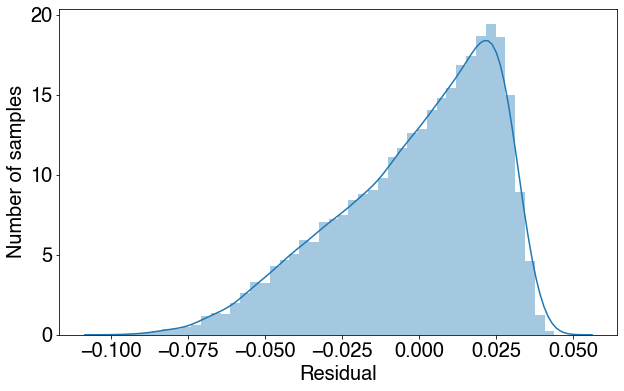

In [8]:
# Plot histogram of errors
residual = predictions - y
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(residual)
ax.set(xlabel= 'Residual', ylabel = 'Number of samples')
plt.show()

In [2751]:
score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 20)

0.21132967139852585

## Training the UNCONSTRAINED Q-network

In [1427]:
# Initialize Q-network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

In [1429]:
# ========== 1) GENERATING INITIAL BATCH OF SAMPLES FOR REPLAY BUFFER ==========
epsilon       = 0.99
replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3000

for i in range(100): # Generate 100 episodes
    episode       = generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon)
    replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
print(len(replay_buffer))

# ================================= 2) TRAINING THE Q-NETWORK =================================
epsilon            = 0.99 # Initial epsilon
score_list         = [] # For plotting score of policy visited over time
iteration_list     = []
policy_mean_list   = [] # For plotting evolution of policy visited over time
policy_std_list    = [] # For plotting evolution of policy visited over time
training_loss_list = [] # For plotting loss of NN (after 20 epochs) over time
episode_bank       = [] # A list of list of lists - Tertiary list  -> Iterations
                        #                         - Secondary list -> Episodes
                        #                         - Primary list   -> Steps
                        #                         For plotting evolution of states visited over time            

for iteration in range(1000):
    # SCORE EXISTING POLICY
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
    print('Current epsilon = ', epsilon)
    current_score = score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 10)
    print('AVERAGE SCORE = '  , current_score)
    print('')
    
    # GENERATE EPISODES & ADD TO REPLAY BUFFER
    for j in range(100):
        episode       = generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon)
        replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
    
    # SAMPLE EPISODES FROM REPLAY BUFFER
    combined_inputs  = [] # List of lists to be converted into input tensor
    combined_targets = [] # List to be converted into target tensor
    samples          = random.sample(replay_buffer, 100) # Draw random samples from replay buffer
    
    for inputs, target in samples:
        combined_inputs  += [inputs]
        combined_targets += [[target]]
    combined_inputs  = torch.tensor(combined_inputs)  # Convert list to tensor
    combined_targets = torch.tensor(combined_targets) # Convert list to tensor
    
    # TRAIN THE NEURAL NETWORK
    optimizer = torch.optim.Adam(Q_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    

    for epoch in range(20):
        prediction = Q_net(combined_inputs)                    # Input x and predict based on x
        loss       = loss_func(prediction, combined_targets) # Must be (1. nn output, 2. target)

        optimizer.zero_grad()   # Clear gradients for next train
        loss.backward()         # Backpropagation, compute gradients
        optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % loss.data.numpy())

    score_list         += [current_score] # Store score for each iteration
    training_loss_list += [loss.data.numpy()]                                # Store training loss after 20 epochs for each iteration
    iteration_list     += [iteration]                                        # Store iteration
    
    # INVESTIGATING EVOLUTION OF POLICY OVER TRAINING ITERATIONS
    if iteration in np.arange(0,5000,10): # Every 10 iterations
        list_of_policies  = score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 100, get_control = True)[1] # add policies
        policy_mean       = np.mean(list_of_policies, axis = 0) # Calculate mean of policies
        policy_std        = np.std(list_of_policies, axis = 0)  # Calculate std of policies
        policy_mean_list += [policy_mean] # Save mean policy for plotting
        policy_std_list  += [policy_std]  # Save std of policy for plotting
    
    # INVESTIGATING EVOLUTION OF STATES VISITED OVER TRAINING ITERATIONS
    if iteration in np.arange(0, 5000, 10): # Every 10 iterations
        pool_of_episodes = [] # A *list of lists* of episodes
        for i in range(10):   # Generate 10 sample episodes and store them
            pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = 0)]
        episode_bank         += [pool_of_episodes]
    
    epsilon *= 0.99 # Decay epsilon

1300
=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
AVERAGE SCORE =  0.0469546594969021

=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
AVERAGE SCORE =  0.16681827477301764

=========== TRAINING ITERATION 2 ===========
Current epsilon =  0.9702989999999999
AVERAGE SCORE =  0.19205790737200937

=========== TRAINING ITERATION 3 ===========
Current epsilon =  0.96059601
AVERAGE SCORE =  0.18985025321303653

=========== TRAINING ITERATION 4 ===========
Current epsilon =  0.9509900498999999
AVERAGE SCORE =  0.18041386964774603

=========== TRAINING ITERATION 5 ===========
Current epsilon =  0.9414801494009999
AVERAGE SCORE =  0.15763484392269506

=========== TRAINING ITERATION 6 ===========
Current epsilon =  0.9320653479069899
AVERAGE SCORE =  0.17876313476791444

=========== TRAINING ITERATION 7 ===========
Current epsilon =  0.92274469442792
AVERAGE SCORE =  0.1879825664556811

=========== TRAINING ITERATION 8 ===========
Current epsilon =  0

=========== TRAINING ITERATION 68 ===========
Current epsilon =  0.4998370298991989
AVERAGE SCORE =  0.14499011185800872

=========== TRAINING ITERATION 69 ===========
Current epsilon =  0.49483865960020695
AVERAGE SCORE =  0.19109135181282338

=========== TRAINING ITERATION 70 ===========
Current epsilon =  0.4898902730042049
AVERAGE SCORE =  0.19266918256626392

=========== TRAINING ITERATION 71 ===========
Current epsilon =  0.48499137027416284
AVERAGE SCORE =  0.1827263907719213

=========== TRAINING ITERATION 72 ===========
Current epsilon =  0.4801414565714212
AVERAGE SCORE =  0.20556556462326245

=========== TRAINING ITERATION 73 ===========
Current epsilon =  0.475340042005707
AVERAGE SCORE =  0.18792382614325404

=========== TRAINING ITERATION 74 ===========
Current epsilon =  0.47058664158564995
AVERAGE SCORE =  0.11991360549959693

=========== TRAINING ITERATION 75 ===========
Current epsilon =  0.4658807751697934
AVERAGE SCORE =  0.20907992513573834

=========== TRAINING IT

=========== TRAINING ITERATION 135 ===========
Current epsilon =  0.2549097606963092
AVERAGE SCORE =  0.19598761962654887

=========== TRAINING ITERATION 136 ===========
Current epsilon =  0.2523606630893461
AVERAGE SCORE =  0.20643233414048603

=========== TRAINING ITERATION 137 ===========
Current epsilon =  0.24983705645845267
AVERAGE SCORE =  0.18109045547332098

=========== TRAINING ITERATION 138 ===========
Current epsilon =  0.24733868589386815
AVERAGE SCORE =  0.20132286763000637

=========== TRAINING ITERATION 139 ===========
Current epsilon =  0.24486529903492946
AVERAGE SCORE =  0.20272155205906506

=========== TRAINING ITERATION 140 ===========
Current epsilon =  0.24241664604458016
AVERAGE SCORE =  0.1732398984525862

=========== TRAINING ITERATION 141 ===========
Current epsilon =  0.23999247958413436
AVERAGE SCORE =  0.20665608134948737

=========== TRAINING ITERATION 142 ===========
Current epsilon =  0.23759255478829303
AVERAGE SCORE =  0.1908332305985928

=========== 

AVERAGE SCORE =  0.20037246469258174

=========== TRAINING ITERATION 202 ===========
Current epsilon =  0.13000034453500542
AVERAGE SCORE =  0.19177357707606135

=========== TRAINING ITERATION 203 ===========
Current epsilon =  0.12870034108965536
AVERAGE SCORE =  0.046627288519461005

=========== TRAINING ITERATION 204 ===========
Current epsilon =  0.12741333767875881
AVERAGE SCORE =  0.17289461487222185

=========== TRAINING ITERATION 205 ===========
Current epsilon =  0.12613920430197123
AVERAGE SCORE =  0.18844508288745707

=========== TRAINING ITERATION 206 ===========
Current epsilon =  0.12487781225895152
AVERAGE SCORE =  0.18439494697994932

=========== TRAINING ITERATION 207 ===========
Current epsilon =  0.123629034136362
AVERAGE SCORE =  0.180330619307194

=========== TRAINING ITERATION 208 ===========
Current epsilon =  0.12239274379499838
AVERAGE SCORE =  0.1700309922285809

=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
AVERAGE SCORE

=========== TRAINING ITERATION 268 ===========
Current epsilon =  0.066968002747864
AVERAGE SCORE =  0.21074476243223916

=========== TRAINING ITERATION 269 ===========
Current epsilon =  0.06629832272038537
AVERAGE SCORE =  0.20237130507933804

=========== TRAINING ITERATION 270 ===========
Current epsilon =  0.06563533949318151
AVERAGE SCORE =  0.2065661430709293

=========== TRAINING ITERATION 271 ===========
Current epsilon =  0.06497898609824969
AVERAGE SCORE =  0.20910766967862848

=========== TRAINING ITERATION 272 ===========
Current epsilon =  0.0643291962372672
AVERAGE SCORE =  0.20704087901108995

=========== TRAINING ITERATION 273 ===========
Current epsilon =  0.06368590427489453
AVERAGE SCORE =  0.20722168868023552

=========== TRAINING ITERATION 274 ===========
Current epsilon =  0.06304904523214558
AVERAGE SCORE =  0.19556671777952297

=========== TRAINING ITERATION 275 ===========
Current epsilon =  0.06241855477982412
AVERAGE SCORE =  0.20425263981791955

=========== 

AVERAGE SCORE =  0.20104055559055017

=========== TRAINING ITERATION 335 ===========
Current epsilon =  0.03415272685621234
AVERAGE SCORE =  0.19942217510100232

=========== TRAINING ITERATION 336 ===========
Current epsilon =  0.03381119958765021
AVERAGE SCORE =  0.187965981685881

=========== TRAINING ITERATION 337 ===========
Current epsilon =  0.03347308759177371
AVERAGE SCORE =  0.2061193898832568

=========== TRAINING ITERATION 338 ===========
Current epsilon =  0.03313835671585597
AVERAGE SCORE =  0.19933948174270813

=========== TRAINING ITERATION 339 ===========
Current epsilon =  0.03280697314869741
AVERAGE SCORE =  0.20771141166906712

=========== TRAINING ITERATION 340 ===========
Current epsilon =  0.032478903417210436
AVERAGE SCORE =  0.1753608385010424

=========== TRAINING ITERATION 341 ===========
Current epsilon =  0.032154114383038335
AVERAGE SCORE =  0.20691204133620006

=========== TRAINING ITERATION 342 ===========
Current epsilon =  0.03183257323920795
AVERAGE SC

AVERAGE SCORE =  0.20449874225409914

=========== TRAINING ITERATION 401 ===========
Current epsilon =  0.017593337264871736
AVERAGE SCORE =  0.20666303482484077

=========== TRAINING ITERATION 402 ===========
Current epsilon =  0.01741740389222302
AVERAGE SCORE =  0.20791857397087585

=========== TRAINING ITERATION 403 ===========
Current epsilon =  0.01724322985330079
AVERAGE SCORE =  0.018461449446759703

=========== TRAINING ITERATION 404 ===========
Current epsilon =  0.017070797554767782
AVERAGE SCORE =  0.20763752526957982

=========== TRAINING ITERATION 405 ===========
Current epsilon =  0.016900089579220106
AVERAGE SCORE =  0.2086089471643548

=========== TRAINING ITERATION 406 ===========
Current epsilon =  0.016731088683427906
AVERAGE SCORE =  0.207874782331263

=========== TRAINING ITERATION 407 ===========
Current epsilon =  0.016563777796593626
AVERAGE SCORE =  0.208491827291342

=========== TRAINING ITERATION 408 ===========
Current epsilon =  0.016398140018627688
AVERAG

AVERAGE SCORE =  0.20760825137800382

=========== TRAINING ITERATION 467 ===========
Current epsilon =  0.009062981044490808
AVERAGE SCORE =  0.2081075821107287

=========== TRAINING ITERATION 468 ===========
Current epsilon =  0.0089723512340459
AVERAGE SCORE =  0.20608738668856366

=========== TRAINING ITERATION 469 ===========
Current epsilon =  0.00888262772170544
AVERAGE SCORE =  0.2087566524153436

=========== TRAINING ITERATION 470 ===========
Current epsilon =  0.008793801444488386
AVERAGE SCORE =  0.2088697832124855

=========== TRAINING ITERATION 471 ===========
Current epsilon =  0.008705863430043502
AVERAGE SCORE =  0.21027367606766276

=========== TRAINING ITERATION 472 ===========
Current epsilon =  0.008618804795743068
AVERAGE SCORE =  0.20515877237480568

=========== TRAINING ITERATION 473 ===========
Current epsilon =  0.008532616747785637
AVERAGE SCORE =  0.20747332062609553

=========== TRAINING ITERATION 474 ===========
Current epsilon =  0.00844729058030778
AVERAGE

AVERAGE SCORE =  0.21072660204234

=========== TRAINING ITERATION 533 ===========
Current epsilon =  0.004668677930525566
AVERAGE SCORE =  0.21122025610946177

=========== TRAINING ITERATION 534 ===========
Current epsilon =  0.00462199115122031
AVERAGE SCORE =  0.20974069582616095

=========== TRAINING ITERATION 535 ===========
Current epsilon =  0.004575771239708107
AVERAGE SCORE =  0.21145900400775947

=========== TRAINING ITERATION 536 ===========
Current epsilon =  0.004530013527311026
AVERAGE SCORE =  0.20963145872900749

=========== TRAINING ITERATION 537 ===========
Current epsilon =  0.004484713392037916
AVERAGE SCORE =  0.20871608458265728

=========== TRAINING ITERATION 538 ===========
Current epsilon =  0.004439866258117537
AVERAGE SCORE =  0.21132278700480325

=========== TRAINING ITERATION 539 ===========
Current epsilon =  0.004395467595536362
AVERAGE SCORE =  0.21017113992695027

=========== TRAINING ITERATION 540 ===========
Current epsilon =  0.004351512919580998
AVER

AVERAGE SCORE =  0.2093140501580144

=========== TRAINING ITERATION 599 ===========
Current epsilon =  0.002405009291311067
AVERAGE SCORE =  0.21086975085021073

=========== TRAINING ITERATION 600 ===========
Current epsilon =  0.0023809591983979563
AVERAGE SCORE =  0.2113904384886678

=========== TRAINING ITERATION 601 ===========
Current epsilon =  0.0023571496064139765
AVERAGE SCORE =  0.21007166968476326

=========== TRAINING ITERATION 602 ===========
Current epsilon =  0.0023335781103498367
AVERAGE SCORE =  0.2104672490807626

=========== TRAINING ITERATION 603 ===========
Current epsilon =  0.002310242329246338
AVERAGE SCORE =  0.21033370630311882

=========== TRAINING ITERATION 604 ===========
Current epsilon =  0.002287139905953875
AVERAGE SCORE =  0.21054415062685541

=========== TRAINING ITERATION 605 ===========
Current epsilon =  0.0022642685068943362
AVERAGE SCORE =  0.2099763011637478

=========== TRAINING ITERATION 606 ===========
Current epsilon =  0.002241625821825393


AVERAGE SCORE =  0.21005227810572485

=========== TRAINING ITERATION 665 ===========
Current epsilon =  0.0012389095537034477
AVERAGE SCORE =  0.21031491714524644

=========== TRAINING ITERATION 666 ===========
Current epsilon =  0.0012265204581664133
AVERAGE SCORE =  0.21112732845251053

=========== TRAINING ITERATION 667 ===========
Current epsilon =  0.0012142552535847491
AVERAGE SCORE =  0.21075533238213923

=========== TRAINING ITERATION 668 ===========
Current epsilon =  0.0012021127010489016
AVERAGE SCORE =  0.21101650125520152

=========== TRAINING ITERATION 669 ===========
Current epsilon =  0.0011900915740384126
AVERAGE SCORE =  0.21095368646002655

=========== TRAINING ITERATION 670 ===========
Current epsilon =  0.0011781906582980285
AVERAGE SCORE =  0.21085091528119343

=========== TRAINING ITERATION 671 ===========
Current epsilon =  0.0011664087517150481
AVERAGE SCORE =  0.21095719547080405

=========== TRAINING ITERATION 672 ===========
Current epsilon =  0.001154744664

=========== TRAINING ITERATION 730 ===========
Current epsilon =  0.0006446548446905099
AVERAGE SCORE =  0.21129893415219456

=========== TRAINING ITERATION 731 ===========
Current epsilon =  0.0006382082962436048
AVERAGE SCORE =  0.21141170892381167

=========== TRAINING ITERATION 732 ===========
Current epsilon =  0.0006318262132811687
AVERAGE SCORE =  0.211325272027935

=========== TRAINING ITERATION 733 ===========
Current epsilon =  0.000625507951148357
AVERAGE SCORE =  0.21161544657393166

=========== TRAINING ITERATION 734 ===========
Current epsilon =  0.0006192528716368734
AVERAGE SCORE =  0.21134544764650348

=========== TRAINING ITERATION 735 ===========
Current epsilon =  0.0006130603429205046
AVERAGE SCORE =  0.2116032931666504

=========== TRAINING ITERATION 736 ===========
Current epsilon =  0.0006069297394912996
AVERAGE SCORE =  0.2117574610722539

=========== TRAINING ITERATION 737 ===========
Current epsilon =  0.0006008604420963866
AVERAGE SCORE =  0.2115666701780454

AVERAGE SCORE =  0.21156848209156381

=========== TRAINING ITERATION 796 ===========
Current epsilon =  0.00033208563842715866
AVERAGE SCORE =  0.21172827481566836

=========== TRAINING ITERATION 797 ===========
Current epsilon =  0.0003287647820428871
AVERAGE SCORE =  0.2107966511379626

=========== TRAINING ITERATION 798 ===========
Current epsilon =  0.00032547713422245825
AVERAGE SCORE =  0.21169908056548975

=========== TRAINING ITERATION 799 ===========
Current epsilon =  0.00032222236288023367
AVERAGE SCORE =  0.21135760296421405

=========== TRAINING ITERATION 800 ===========
Current epsilon =  0.00031900013925143135
AVERAGE SCORE =  0.21117413230927246

=========== TRAINING ITERATION 801 ===========
Current epsilon =  0.000315810137858917
AVERAGE SCORE =  0.21132857310765857

=========== TRAINING ITERATION 802 ===========
Current epsilon =  0.00031265203648032783
AVERAGE SCORE =  0.19376442471358227

=========== TRAINING ITERATION 803 ===========
Current epsilon =  0.000309525

AVERAGE SCORE =  0.21193954756885472

=========== TRAINING ITERATION 861 ===========
Current epsilon =  0.0001727976146638485
AVERAGE SCORE =  0.21152636429716973

=========== TRAINING ITERATION 862 ===========
Current epsilon =  0.00017106963851721
AVERAGE SCORE =  0.2113786987388974

=========== TRAINING ITERATION 863 ===========
Current epsilon =  0.0001693589421320379
AVERAGE SCORE =  0.21105830588625607

=========== TRAINING ITERATION 864 ===========
Current epsilon =  0.00016766535271071751
AVERAGE SCORE =  0.2118100813898281

=========== TRAINING ITERATION 865 ===========
Current epsilon =  0.00016598869918361034
AVERAGE SCORE =  0.21207468891859982

=========== TRAINING ITERATION 866 ===========
Current epsilon =  0.00016432881219177425
AVERAGE SCORE =  0.2061149751454371

=========== TRAINING ITERATION 867 ===========
Current epsilon =  0.0001626855240698565
AVERAGE SCORE =  0.2116392713333588

=========== TRAINING ITERATION 868 ===========
Current epsilon =  0.000161058668829

AVERAGE SCORE =  0.21148865692800517

=========== TRAINING ITERATION 926 ===========
Current epsilon =  8.991360112691314e-05
AVERAGE SCORE =  0.21136074062071253

=========== TRAINING ITERATION 927 ===========
Current epsilon =  8.901446511564401e-05
AVERAGE SCORE =  0.21137258371632045

=========== TRAINING ITERATION 928 ===========
Current epsilon =  8.812432046448757e-05
AVERAGE SCORE =  0.21122309126124733

=========== TRAINING ITERATION 929 ===========
Current epsilon =  8.72430772598427e-05
AVERAGE SCORE =  0.21163699002445174

=========== TRAINING ITERATION 930 ===========
Current epsilon =  8.637064648724426e-05
AVERAGE SCORE =  0.21126158194708125

=========== TRAINING ITERATION 931 ===========
Current epsilon =  8.550694002237182e-05
AVERAGE SCORE =  0.21188241673232772

=========== TRAINING ITERATION 932 ===========
Current epsilon =  8.46518706221481e-05
AVERAGE SCORE =  0.2121672750438774

=========== TRAINING ITERATION 933 ===========
Current epsilon =  8.380535191592662

=========== TRAINING ITERATION 991 ===========
Current epsilon =  4.678569020374915e-05
AVERAGE SCORE =  0.21174987079748106

=========== TRAINING ITERATION 992 ===========
Current epsilon =  4.6317833301711654e-05
AVERAGE SCORE =  0.21135094346972277

=========== TRAINING ITERATION 993 ===========
Current epsilon =  4.585465496869454e-05
AVERAGE SCORE =  0.21141235796553265

=========== TRAINING ITERATION 994 ===========
Current epsilon =  4.5396108419007594e-05
AVERAGE SCORE =  0.21088885583500255

=========== TRAINING ITERATION 995 ===========
Current epsilon =  4.494214733481752e-05
AVERAGE SCORE =  0.21154166104775074

=========== TRAINING ITERATION 996 ===========
Current epsilon =  4.449272586146935e-05
AVERAGE SCORE =  0.2112963030776213

=========== TRAINING ITERATION 997 ===========
Current epsilon =  4.404779860285465e-05
AVERAGE SCORE =  0.21153776693169882

=========== TRAINING ITERATION 998 ===========
Current epsilon =  4.36073206168261e-05
AVERAGE SCORE =  0.21152043007

In [2975]:
# # Save neural network
# torch.save(Q_net, './NN_models/CS1_Q_net_unconstrained')

# # Load pre-trained neural network
# Q_net = torch.load('./NN_models/CS1_Q_net_unconstrained')
# Q_net.eval()

Sequential(
  (0): Linear(in_features=6, out_features=200, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=200, out_features=200, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=200, out_features=1, bias=True)
)

No handles with labels found to put in legend.


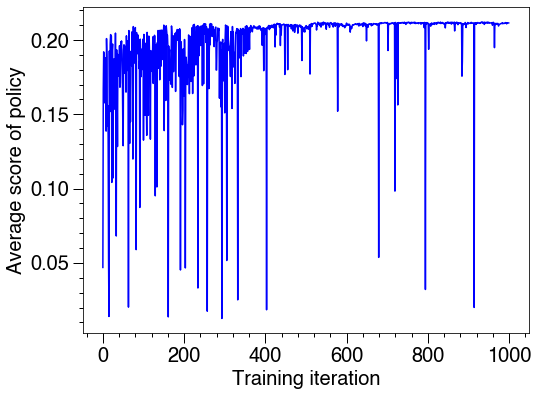

No handles with labels found to put in legend.


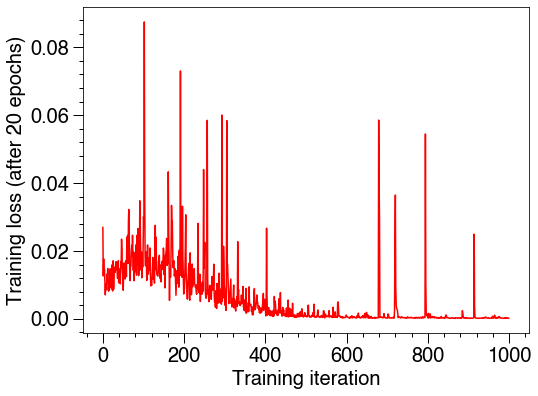

In [2753]:
# Save data
# with open('./Data/CS1_score_GA_unconstrained', 'wb') as f:
#     pickle.dump(score_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_loss_GA_unconstrained', 'wb') as f:
#     pickle.dump(training_loss_list, f, pickle.HIGHEST_PROTOCOL)

# Load pre-run data
# with open('./Data/CS1_score_GA_unconstrained', 'rb') as f:
#     score_list = pickle.load(f)
# with open('./Data/CS1_loss_GA_unconstrained', 'rb') as f:
#     training_loss_list = pickle.load(f)

# Plot score vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, score_list, color = 'b')
plt.legend(frameon =  0)
plt.ylabel('Average score of policy', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

# Plot training loss vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list, training_loss_list, color = 'r')
plt.legend(frameon =  0)
plt.ylabel('Training loss (after 20 epochs)', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [14]:
# Q_net = torch.nn.Sequential(
#         torch.nn.Linear(6,   200, bias = True), # 6 input nodes
#         torch.nn.LeakyReLU(),    # apply ReLU activation function
#         torch.nn.Linear(200, 200, bias = True), 
#         torch.nn.LeakyReLU(),    # apply ReLU activation function
#         torch.nn.Linear(200,   1, bias = True), # 1 output node
#     ).double()

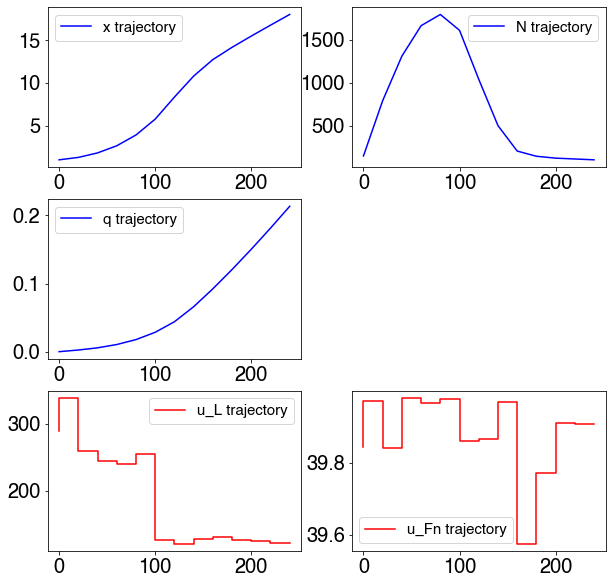

Score: 0.2132957972354426


In [3089]:
episode = generate_episode_with_NN(NN = max_action, initial_state = [1.0, 150.0, 0, 0], epsilon = 0)
plot_episode(episode) 

In [1298]:
score_NN_policy(GA_optimize, [1.0, 150.0, 0, 0], num_iterations = 100)

0.20795865725499407

## Genetic algorithm

In [5]:
# Source: Ahmed Gad - https://github.com/ahmedfgad/GeneticAlgorithmPython/tree/master/Tutorial%20Project
def cal_pop_fitness(population, initial_state):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function calulates the sum of products between each input and its corresponding weight.
    state = []
    population = population.tolist() # convert 2D array to list of lists
    for i in range(len(population)):
        s = initial_state + population[i] # Append action to state 
        s = standardize_state_Q(s) # Standardize
        state += [s]
    state = torch.tensor(state).double()
    fitness = Q_net(state).detach().numpy()
    return fitness

def cal_pop_fitness_constrained(population, initial_state, g1_threshold, g2_threshold):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function calulates the sum of products between each input and its corresponding weight.
    
    # CALCULATE Q-FITNESS
    state = []
    population = population.tolist() # convert 2D array to list of lists
    for i in range(len(population)):
        s = initial_state + population[i] # Append action to state 
        s = standardize_state_Q(s) # Standardize using Q-network mean & std
        state += [s]
    state = torch.tensor(state).double()
    fitness_Q = (Q_net(state).detach().numpy() * y_std_Q) + y_mean_Q # Unstandardized Q-network fitness
#     print('fitness_Q:', fitness_Q)
    # CALCULATE C-FITNESS 
    state = []
    
    initial_state_for_C = copy.deepcopy(initial_state) 
    initial_state_for_C[3] = 240. - initial_state_for_C[3] #### NEED TO TRANSFORM T TO T_F- T #####
#     print('population:', population)
    for i in range(len(population)):
        s = initial_state_for_C + population[i] # Append action to state 
#         print('non-standardized state:',s)
        s = standardize_state_C(s) # Standardize using C-network mean & std
#         print('standardized state:',s)
        state += [s]
    state = torch.tensor(state).double()
    state_copy = copy.deepcopy(state) # Just to be sure
    
    fitness_g1 = -1*((g1_net(state).detach().numpy() * y_std_C[0]) + y_mean_C[0])  # Unstandardized C-network fitness - NEGATIVE SIGN because -ve g1_net values denote higher fitness!
    fitness_g2 = -1*((g2_net(state_copy).detach().numpy() * y_std_C[1]) + y_mean_C[1])
#     print('fitness_g1:', fitness_g1)
#     print('fitness_g2:', fitness_g2)
    # COMBINE Q-FITNESS AND C-FITNESS
    fitness_overall = []
    for i in range(len(population)):
        
        # include gl and g2 only for now
        f = max(0, fitness_Q[i].item()) + 100*min(0, fitness_g1[i].item() + g1_threshold) + 10000*min(0, fitness_g2[i].item() + g2_threshold)
        fitness_overall += [f]
    
    return fitness_overall

def select_mating_pool(pop, fitness, num_parents):
    # Selecting the best individuals in the current generation as parents for producing the offspring of the next generation.
    parents = np.empty((num_parents, pop.shape[1]))
    for parent_num in range(num_parents):
        max_fitness_idx = np.where(fitness == np.max(fitness))
        max_fitness_idx = max_fitness_idx[0][0]
        parents[parent_num, :] = pop[max_fitness_idx, :]
        fitness[max_fitness_idx] = -99999999999     # Make the current parent the most unfit
    return parents

def crossover(parents, offspring_size):
    offspring = np.empty(offspring_size)
    # The point at which crossover takes place between two parents. Usually, it is at the center.
    crossover_point = np.uint8(offspring_size[1]/2) # Returns 1 in this case (because 2 values)

    for k in range(offspring_size[0]):
        # Index of the first parent to mate.
        parent1_idx = k%parents.shape[0]
        # Index of the second parent to mate.
        parent2_idx = (k+1)%parents.shape[0]
        # The new offspring will have its first half of its genes taken from the first parent.
        offspring[k, 0:crossover_point] = parents[parent1_idx, 0:crossover_point]
        # The new offspring will have its second half of its genes taken from the second parent.
        offspring[k, crossover_point:] = parents[parent2_idx, crossover_point:]
    return offspring

def mutation(offspring_crossover, mut_percen):

    for idx in range(offspring_crossover.shape[0]): # Iterate over individual offspring
        for feature in range(offspring_crossover.shape[1]): # Iterate over its features 
            r = np.random.uniform(0, 1)
            
            if r < mut_percen: # If mutation occurs
#                 print('Mutated')
                if feature == 0: # If u_L 
                    offspring_crossover[idx, feature] = np.random.uniform(120, 400) # Pick random u_L
                else:            # Else u_Fn
                    offspring_crossover[idx, feature] = np.random.uniform(0, 40) # Pick random u_Fn
    return offspring_crossover

def generate_random_episode_constrained(initial_state, g1_threshold = 0): 
    '''Generates an episode using RANDOM policy
    threshold is the tolerance of the limit, where 
    0            : Limit itself (as per defined in extract_constraint_values_from_episode() function)
    +ve threshold: Looser limit   
    -ve threshold: Stricter limit 
    '''
    episode = []
    state = initial_state  # Initial state
    for i in range(13):   # Take (12 + 1) steps
        predicted_c = np.inf # Initialize constraint
        while predicted_c > g1_threshold: # Keep choosing a different action this until constraint is LESS THAN zero
            old_state = state # Old state for storing into episode
            old_state_without_action = old_state
            old_state = list(old_state)
            old_state[3] = 240.0 - old_state[3] # Convert to t to (t - t_f)
            u_L  = np.random.uniform(120, 400) # Pick random u_L
            u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
            action = [u_L, u_Fn]
            old_state += action     # Append action to state

            old_state_standardized = old_state.copy()
            old_state_standardized = standardize_state_C(old_state_standardized)

            old_state_standardized = torch.tensor(old_state_standardized)
            predicted_c = ((g1_net(old_state_standardized).detach().numpy())*y_std_C) + y_mean_C # Update predicted constraint
#             print('predicted_c:', predicted_c)
        state, reward  = transition(state, action)     # Evolve to get new state 
        episode       += [[list(old_state_without_action), action, reward]] # Update step
    return episode
# generate_random_episode_constrained(initial_state = [1.0,150.0,0.,0.], g1_threshold = 0)

def GA_optimize(state, mut_percen = 0.1):
    '''Argument: State [Cx, Cn, Cq, t]
       Output: Control [u_L, u_Fn] that maximizes Q 
    '''
    num_features       = 2  # Number of features (u_L and u_Fn)
    sol_per_pop        = 10 # Number of individuals per population
    num_parents_mating = 5  # Numbers of parents selected from each generation
    num_generations    = 10 # Number of generations
    
    mut_percen = mut_percen # Initial probability of mutation

    #Creating the initial population.
    new_pop = []
    for i in range(200): # Initial pop
        u_L  = np.random.uniform(120, 400) # Pick random u_L
        u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
        new_pop += [[u_L, u_Fn]]
    new_pop = np.array(new_pop)
#     print('new_pop',new_pop)

    decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen

    state = state
    avg_fitness_list = [] # Store average fitness scores
    max_fitness_list = [] # Store max fitness scores
    generation_list = []  # Store generation index

    for generation in range(num_generations):
        
        # Measuring the fitness of each chromosome in the population.
        fitness = cal_pop_fitness(new_pop, state)

        avg_fit = np.mean(fitness) # Average fitness
        max_fit = np.max(fitness)  # Max fitness of the generation
    #     print('==== Generation %.0f ====' % generation)
    #     print('Average fitness:', avg_fit)
    #     print('Max fitness:', max_fit)
    #     print('')
        avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
        max_fitness_list += [max_fit]    # Save average fitness score for plotting
        generation_list  += [generation] # Save generation index

        # Selecting the best parents in the population for mating
        parents = select_mating_pool(new_pop, fitness, num_parents_mating)
#         print('parents:',parents)

        # Generating next generation using crossover
        offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
#         print('offspring_crossover',offspring_crossover)

        offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
#         print('offspring_mutation',offspring_mutation)

        # Creating the new population based on the parents and offspring
        new_pop[0:parents.shape[0], :] = parents
        new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

        # Cull excess initial population
        new_pop = new_pop[0:sol_per_pop,:]

    #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
        mut_percen *= decay_factor
    
    max_action = new_pop[0] # Select the fittest action from final population
    return max_action
# GA_optimize([1.0, 150.0, 0, 0], mut_percen = 0.25) # Test function

# def GA_optimize_constrained(state, g1_threshold, g2_threshold, init_mut_percen = 0.01):
#     '''Argument: State [Cx, Cn, Cq, t]
#        Output: Control [u_L, u_Fn] that maximizes Q and avoids violation of constraints
#     '''
#     num_features       = 2  # Number of features (u_L and u_Fn)
#     sol_per_pop        = 10 # Number of individuals per population
#     num_parents_mating = 5  # Numbers of parents selected from each generation
#     num_generations    = 10 # Number of generations
    
#     max_fitness = -np.inf # Initialize fitness
    
#     while max_fitness < 0: # Keep running this loop until no violations (no -ve fitness) occurs
    
#         mut_percen = init_mut_percen # Initial probability of mutation

#         #Creating the initial population.
#         new_pop = []
#         for i in range(200): # Initial pop
#             u_L  = np.random.uniform(120, 400) # Pick random u_L
#             u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
#             new_pop += [[u_L, u_Fn]]
#         new_pop = np.array(new_pop)
#     #     print('new_pop',new_pop)

#         decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen

#         state = state
#         avg_fitness_list = [] # Store average fitness scores
#         max_fitness_list = [] # Store max fitness scores
#         generation_list = []  # Store generation index

#         for generation in range(num_generations):

#             # Measuring the fitness of each chromosome in the population.
#             fitness = cal_pop_fitness_constrained(new_pop, state, g1_threshold = g1_threshold, g2_threshold = g2_threshold)

#             avg_fit = np.mean(fitness) # Average fitness
#             max_fit = np.max(fitness)  # Max fitness of the generation
#         #     print('==== Generation %.0f ====' % generation)
#         #     print('Average fitness:', avg_fit)
#         #     print('Max fitness:', max_fit)
#         #     print('')
#             avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
#             max_fitness_list += [max_fit]    # Save average fitness score for plotting
#             generation_list  += [generation] # Save generation index

#             # Selecting the best parents in the population for mating
#             parents = select_mating_pool(new_pop, fitness, num_parents_mating)
#     #         print('parents:',parents)

#             # Generating next generation using crossover
#             offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
#     #         print('offspring_crossover',offspring_crossover)

#             offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
#     #         print('offspring_mutation',offspring_mutation)

#             # Creating the new population based on the parents and offspring
#             new_pop[0:parents.shape[0], :] = parents
#             new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

#             # Cull excess initial population
#             new_pop = new_pop[0:sol_per_pop,:]

#         #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
#     #         mut_percen *= decay_factor

#         max_action = new_pop[0] # Select the fittest action from final population
#         max_fitness = max_fitness_list[-1] # Update max_fitness
# #     plt.figure()
# #     plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
# #     plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%max_fitness_list[-1])
# #     plt.legend()
# #     plt.show()
# #     print(max_fitness)
    
#     return max_action
# GA_optimize_constrained([1.0, 150.0, 0, 0], g1_threshold = g1_threshold, g2_threshold = g2_threshold ) # Test function

def GA_optimize_constrained(state, g1_threshold, g2_threshold, init_mut_percen = 0.01):
    '''Argument: State [Cx, Cn, Cq, t]
       Output: Control [u_L, u_Fn] that maximizes Q and avoids violation of constraints
    '''
    max_fitness = -np.inf # Initialize fitness
    
    while max_fitness < 0: # Keep running this loop until no violations (no -ve fitness) occurs
    
        #Creating the initial population.
        new_pop = []
        for i in range(1000): # Initial pop
            u_L  = np.random.uniform(120, 400) # Pick random u_L
            u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
            new_pop += [[u_L, u_Fn]]
            
        new_pop = np.array(new_pop)

        fitness = cal_pop_fitness_constrained(new_pop, state, g1_threshold = g1_threshold, g2_threshold = g2_threshold)
        max_idx = np.argmax(fitness)
        max_action  = new_pop[max_idx]
        max_fitness = fitness[max_idx]
            
    return max_action
# GA_optimize_constrained([1.0, 150.0, 0, 0], g1_threshold = 1000, g2_threshold = 100 ) # Test function

In [4]:
episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   g1_threshold = g1_threshold,
                                   g2_threshold = g2_threshold)
episode

NameError: name 'g1_threshold' is not defined

In [431]:
#test constrained
sol_per_pop = 200 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
num_parents_mating = 2
num_generations = 10
mut_percen = 0.1
state = [1.0, 150.0, 0, 0]
new_pop = []
for i in range(sol_per_pop): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print(new_pop)

[[2.93083547e+02 3.22624666e+01]
 [1.92780699e+02 2.48295058e+01]
 [1.70116380e+02 1.35786097e+01]
 [3.95616952e+02 1.95813957e+01]
 [2.26379559e+02 1.31499445e+01]
 [3.76940597e+02 1.48982379e+01]
 [2.45815655e+02 3.23222244e+01]
 [3.09199664e+02 3.62348922e+01]
 [2.48453206e+02 3.15649529e+01]
 [1.52743026e+02 2.35441583e+01]
 [3.74621151e+02 4.93943561e+00]
 [1.78878158e+02 2.54669460e+01]
 [1.56592445e+02 1.22421087e+01]
 [1.20397320e+02 3.81016335e+01]
 [1.74228325e+02 1.13460636e+01]
 [1.57770204e+02 3.69530870e+01]
 [3.45485678e+02 3.20157658e+01]
 [3.05767360e+02 3.96142016e+01]
 [2.00637825e+02 1.70570328e+01]
 [2.54826611e+02 1.68495815e+01]
 [3.33773245e+02 1.34065968e+01]
 [2.27877233e+02 2.56301383e+01]
 [3.32913952e+02 2.61600912e+01]
 [3.15734581e+02 5.82722733e+00]
 [1.76222790e+02 1.18058624e+01]
 [3.31161743e+02 2.56055826e+00]
 [2.84323212e+02 1.00010402e+01]
 [2.59571498e+02 1.90416854e+01]
 [2.24235810e+02 1.87460198e+01]
 [2.13090921e+02 3.88554490e+01]
 [2.959237

In [441]:
fitness = cal_pop_fitness_constrained(new_pop, [1.0, 150.0, 0, 0], 
                                      g1_threshold = 500, 
                                      g2_threshold = 0.004)
fitness

[0.037545224516673525,
 0.038041887948617736,
 0.033701583910184116,
 0.03284086624562786,
 0.03464541243430473,
 0.032629542530599534,
 0.03993464557353284,
 0.03743482060722952,
 0.03971201100151314,
 0.035876401010263965,
 0.029402192981725604,
 0.0378770853863862,
 0.0334460492910301,
 0.04170221364391549,
 0.033896381163334724,
 0.04196719823427368,
 0.035056844019289546,
 0.038026168554077214,
 0.03486844935201707,
 0.03576804116716378,
 0.034038533870605736,
 0.038455156978232284,
 0.03603086253066762,
 0.03242237291550744,
 0.033898605963132614,
 0.030699379944658753,
 0.03398200897998137,
 0.036593294399123025,
 0.03593544409303877,
 0.04200490042781145,
 0.03594523049051178,
 0.04077513846466409,
 0.03386702414222559,
 0.032693039115608113,
 0.03759436916645501,
 0.03651310377419087,
 0.033734576681278494,
 0.0370703564709844,
 0.035323519389704267,
 0.03349651844360801,
 0.03440611635847486,
 0.034441130002026074,
 0.0372495440561936,
 0.03527813277260091,
 0.041189014707151

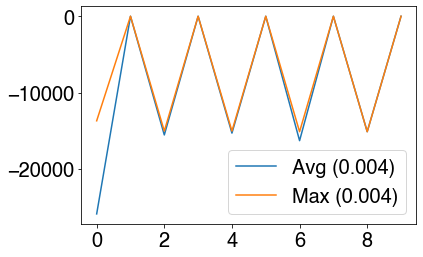

array([379.75412521,   2.26208791])

In [440]:
GA_optimize_constrained([1.0, 150.0, 0, 0], g1_threshold = 0, g2_threshold = 0, init_mut_percen = 0.01)

new_pop [[1.81211496e+02 3.05246017e+01]
 [3.66489746e+02 1.58744306e+00]
 [2.92928939e+02 5.79655101e+00]
 [3.07457448e+02 2.80108055e+01]
 [2.43509642e+02 1.30770081e+00]
 [3.83399417e+02 3.82602683e-01]
 [3.98013401e+02 2.68004595e+01]
 [2.15331826e+02 1.50913508e+01]
 [2.72530442e+02 3.74622065e+01]
 [1.80721262e+02 1.23045924e+01]
 [1.27394965e+02 3.03444751e+01]
 [1.95803695e+02 3.30698993e+01]
 [2.44791102e+02 7.54029615e+00]
 [2.42028887e+02 1.98059296e+01]
 [2.00782451e+02 5.80052282e+00]
 [2.73956813e+02 1.45351603e+01]]
parents: [[195.80369457  33.06989933]
 [181.21149575  30.52460172]
 [127.39496493  30.34447507]
 [242.02888667  19.80592958]
 [272.53044246  37.46220653]
 [215.3318256   15.09135077]
 [273.95681302  14.53516025]
 [307.45744796  28.01080548]]
offspring_crossover [[195.80369457  30.52460172]
 [181.21149575  30.34447507]
 [127.39496493  19.80592958]
 [242.02888667  37.46220653]
 [272.53044246  15.09135077]
 [215.3318256   14.53516025]
 [273.95681302  28.01080548

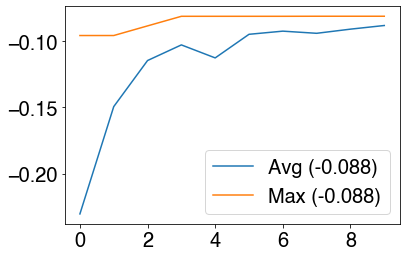

In [1405]:
sol_per_pop = 16 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
num_parents_mating = 8
num_generations = 10
mut_percen = 0.1

decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen
state = [1.0, 150.0, 0, 0]
avg_fitness_list = []
max_fitness_list = []
generation_list = []

#Creating the initial population.
new_pop = []
for i in range(sol_per_pop): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print('new_pop',new_pop)

for generation in range(num_generations):
        # Measuring the fitness of each chromosome in the population.
    fitness = cal_pop_fitness(new_pop, state)
    
    avg_fit = np.mean(fitness)
    max_fit = np.max(fitness)
    avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
    max_fitness_list += [max_fit]    # Save average fitness score for plotting
    generation_list  += [generation] # Save generation index

        # Selecting the best parents in the population for mating.
    parents = select_mating_pool(new_pop, fitness, num_parents_mating)
    print('parents:',parents)

        # Generating next generation using crossover.
    offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
    print('offspring_crossover',offspring_crossover)

    offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
    print('offspring_mutation',offspring_mutation)

        # Creating the new population based on the parents and offspring.
    new_pop[0:parents.shape[0], :] = parents
    new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

        # Cull excess
    new_pop = new_pop[0:sol_per_pop,:]

    #     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
    #     mut_percen *= decay_factor
    print('Mut_percen:', mut_percen)
    print('new_pop',new_pop)

plt.figure()
plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%avg_fitness_list[-1])
plt.legend()
plt.show()

new_pop [[1.20763215e+02 3.63771522e+01]
 [1.82185173e+02 9.79185940e-03]
 [1.88919402e+02 7.96462500e+00]
 [2.70810444e+02 2.25450981e+01]
 [2.64681597e+02 1.42065928e+01]
 [3.36304174e+02 2.97004334e+01]
 [3.89137778e+02 2.75539665e+01]
 [1.92059897e+02 4.41183515e+00]
 [1.59832108e+02 1.05676672e+01]
 [1.20815316e+02 1.76080594e+01]
 [2.83246277e+02 1.96534382e+01]
 [2.51090465e+02 3.92791381e+01]
 [3.79864022e+02 1.86859345e+01]
 [1.50971979e+02 1.98787630e+01]
 [1.37434996e+02 2.64851089e+01]
 [1.52077675e+02 1.82547963e+01]
 [1.62411976e+02 1.75672305e+01]
 [2.18755770e+02 2.81747050e+01]
 [2.42040546e+02 2.42773980e+01]
 [2.23823086e+02 3.82709577e+01]
 [2.31444400e+02 2.36154036e+01]
 [2.36698413e+02 3.14414183e+01]
 [3.31266643e+02 1.19902283e+01]
 [3.74656737e+02 2.31034703e+01]
 [3.96874623e+02 3.44678898e+00]
 [2.18969961e+02 3.71700072e+01]
 [1.24125990e+02 9.14123330e+00]
 [3.85618627e+02 1.89360889e+01]
 [3.24492800e+02 3.06438990e+01]
 [2.54405934e+02 3.94357322e+00]
 [

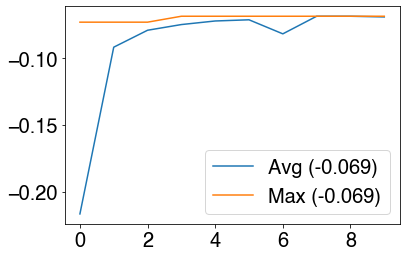

In [1352]:
sol_per_pop = 10 # Number of individuals per population
num_features = 2 # Number of features (u_L and u_Fn)
mut_percen = 0.1

#Creating the initial population.
new_pop = []
for i in range(200): # Initial pop
    u_L  = np.random.uniform(120, 400) # Pick random u_L
    u_Fn = np.random.uniform(0, 40)    # Pick random u_Fn
    new_pop += [[u_L, u_Fn]]
new_pop = np.array(new_pop)
print('new_pop',new_pop)

num_generations = 10
decay_factor = (0.01/mut_percen)**(1/num_generations) # Define decay factor for mut_percen
num_parents_mating = 5
state = [1.0, 150.0, 0, 0]
avg_fitness_list = []
max_fitness_list = []
generation_list = []

for generation in range(num_generations):
    # Measuring the fitness of each chromosome in the population.
    fitness = cal_pop_fitness(new_pop, state)
    
    avg_fit = np.mean(fitness)
    max_fit = np.max(fitness)
#     print('==== Generation %.0f ====' % generation)
#     print('Average fitness:', avg_fit)
#     print('Max fitness:', max_fit)
#     print('')
    avg_fitness_list += [avg_fit]    # Save average fitness score for plotting
    max_fitness_list += [max_fit]    # Save average fitness score for plotting
    generation_list  += [generation] # Save generation index
    
    # Selecting the best parents in the population for mating.
    parents = select_mating_pool(new_pop, fitness, num_parents_mating)
    print('parents:',parents)

    # Generating next generation using crossover.
    offspring_crossover = crossover(parents, offspring_size=(sol_per_pop-parents.shape[0], num_features))
    print('offspring_crossover',offspring_crossover)

    offspring_mutation = mutation(offspring_crossover, mut_percen = mut_percen)
    print('offspring_mutation',offspring_mutation)

    # Creating the new population based on the parents and offspring.
    new_pop[0:parents.shape[0], :] = parents
    new_pop[parents.shape[0]:sol_per_pop, :] = offspring_mutation

    # Cull excess
    new_pop = new_pop[0:sol_per_pop,:]
    
#     mut_percen = 0.5*e**(-1*generation/(num_generations/3)) # Decay
#     mut_percen *= decay_factor
    print('Mut_percen:', mut_percen)
    print('new_pop',new_pop)
plt.figure()
plt.plot(generation_list, avg_fitness_list, label = 'Avg (%.3f)'%avg_fitness_list[-1])
plt.plot(generation_list, max_fitness_list, label = 'Max (%.3f)'%avg_fitness_list[-1])
plt.legend()
plt.show()

In [26]:
# Inspecting the spread of actions predicted by GA
start = time.time()  # For timing purposes
u_L_pool  = []
u_Fn_pool = []
for i in range(500):
    u_L, u_Fn = GA_optimize_constrained([1.0, 150.0, 0, 0], g1_threshold = 0, g2_threshold = 0, init_mut_percen = 0.01)
    u_L_pool  += [u_L]
    u_Fn_pool += [u_Fn]
end = time.time()  # For timing purposes
print(end - start)
plt.figure()
plt.scatter(u_L_pool, u_Fn_pool, s = 0.5)
plt.scatter(np.mean(u_L_pool), np.mean(u_Fn_pool), color = 'r')
plt.xlim(120, 400)
plt.ylim(0,40)
plt.xlabel('u_L')
plt.ylabel('u_Fn')

KeyboardInterrupt: 

6.305979013442993


Text(0, 0.5, 'u_Fn')

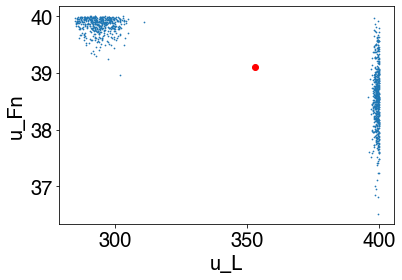

In [2513]:
# Inspecting the spread of predicted max_actions
start = time.time()  # For timing purposes
u_L_pool  = []
u_Fn_pool = []
for i in range(1000):
    u_L, u_Fn = max_action([1.0, 150.0, 0, 0])
    u_L_pool += [u_L]
    u_Fn_pool += [u_Fn]
end = time.time()  # For timing purposes
print(end - start)
plt.figure()
plt.scatter(u_L_pool, u_Fn_pool, s = 0.5)
plt.scatter(np.mean(u_L_pool), np.mean(u_Fn_pool), color = 'r')
# plt.xlim(120, 250)
# plt.ylim(35,41)
plt.xlabel('u_L')
plt.ylabel('u_Fn')

# Introducing constraints
The goal is to train a 2nd neural network to predict a constraint value given a state-action pair. The data used to train this NN will generated using a random policy in the cells below.

### Method 1: Training Q-network and C-network separately

In [21]:
episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) 
episode

[[[1.0, 150.0, 0, 0], [385.4330527694228, 36.399866325867045], 0],
 [[1.2629873326272418, 734.1180076369025, 0.0022591486173569424, 20.0],
  [327.3480304392167, 37.83984025977543],
  0],
 [[1.7705310171678752, 1219.7687709662446, 0.005425173423517918, 40.0],
  [242.8729189316441, 39.80906742415014],
  0],
 [[2.5705898324392567, 1590.71859577154, 0.0102199775116497, 60.0],
  [155.27021477664582, 9.36741882515777],
  0],
 [[3.6056781743526196, 1224.9582762313864, 0.017350016817213855, 80.0],
  [307.43150425886483, 17.668442168358904],
  0],
 [[5.081510563136995, 790.222419702922, 0.026552656986763967, 100.0],
  [362.7597371424092, 5.300944151141134],
  0],
 [[6.4120112274561345, 166.38445688572796, 0.0381378940667493, 120.0],
  [206.67455273872355, 18.053441092983466],
  0],
 [[7.104322201605452, 109.84581744266178, 0.05196450239966164, 140.0],
  [254.50527662905523, 12.923384489451767],
  0],
 [[7.561283963505287, 63.595085207028546, 0.06482769085473657, 160.0],
  [134.0729855950401, 11

In [29]:
extract_constraint_values_from_episode(episode)

([[1.0, 150.0, 0, 240.0, 277.52653196864594, 22.921261254187563],
  [1.2256781055078272,
   483.5064687923391,
   0.0023996740391579443,
   220.0,
   152.234967369794,
   28.720160064144054],
  [1.599495664251366,
   855.2229494437751,
   0.00564623822616382,
   200.0,
   383.331025006073,
   8.273743522048518],
  [2.1775647957117257,
   710.130564408416,
   0.009437127172721927,
   180.0,
   344.63098300356273,
   25.94075399958331],
  [2.970936733826186,
   802.9596938639012,
   0.014720127254524523,
   160.0,
   310.53872115558977,
   24.686594042275907],
  [4.0650384031407265,
   709.4793141830538,
   0.0221174414872079,
   140.0,
   338.87620021837836,
   28.73924481629919],
  [5.431507278547316,
   547.19563778063,
   0.031874167156737736,
   120.0,
   342.15010614129505,
   0.13852803574633477],
  [6.316053563835549,
   43.280718578899275,
   0.04316470324241774,
   100.0,
   342.0278444279795,
   4.284494435939212],
  [6.399453696845697,
   22.645843774163087,
   0.050575409411

In [6]:
# Generate UNCONSTRAINED data for training the constraint neural network

start = time.time()  # For timing purposes
state_action = []    # To store state and action [Cx, Cn, Cq, t-t_f, u_L, u_Fn]
g1_constraint   = []    # To store g1 constraint 
g2_constraint   = []    # To store g1 constraint 
num_episodes = 10000 # Number of episodes to generate

for j in range(num_episodes):
    generated_episode = generate_random_episode(initial_state = [1.0,150.0,0,0])  # Generate one episode
#     generated_episode = generate_episode_with_NN(GA_optimize, [1.0, 150.0, 0, 0], epsilon = 0.5)  # Generate one episode    
#     generated_episode = generate_random_episode_constrained(initial_state = [1.0,150.0,0,0], g1_threshold = 60)
    s_a, g1, g2, g3   = extract_constraint_values_from_episode(generated_episode)            # Extract data from episode
    
    state_action += s_a             # Append state and action 
    g1_constraint   += g1           # Append g1 constraint
    g2_constraint   += g2           # Append g1 constraint

end = time.time() # For timing purposes

state_action = np.array(state_action)
g1_constraint   = np.array(g1_constraint)
g2_constraint   = np.array(g2_constraint)
print('')
print('Time taken:', end - start)
print('==========INPUT [Cx, Cn, Cq, t_f-t, u_L, u_Fn]==========')
print(state_action)
print('')
print('==========TARGET VALUES [g1]==========')
print(g1_constraint)
print('==========TARGET VALUES [g2]==========')
print(g2_constraint)


Time taken: 97.57543015480042
==========INPUT [Cx, Cn, Cq, t_f-t, u_L, u_Fn]==========
[[1.00000000e+00 1.50000000e+02 0.00000000e+00 2.40000000e+02
  3.84540230e+02 2.17557150e+01]
 [1.21470818e+00 4.65774256e+02 2.21871360e-03 2.20000000e+02
  1.49756749e+02 1.04263196e+01]
 [1.52957958e+00 5.01676950e+02 5.38101763e-03 2.00000000e+02
  3.24488221e+02 2.72679626e+01]
 ...
 [7.27517861e+00 3.11977562e+02 6.34706555e-02 6.00000000e+01
  2.94982638e+02 1.40048017e+01]
 [8.14876959e+00 7.26644290e+01 7.76065157e-02 4.00000000e+01
  2.96467211e+02 5.21216689e+00]
 [8.29299008e+00 2.09046388e+01 8.54840591e-02 2.00000000e+01
  3.58720831e+02 1.37007551e+01]]

==========TARGET VALUES [g1]==========
[[ -31.77325409]
 [ -31.77325409]
 [ -31.77325409]
 ...
 [-727.33557102]
 [-742.74639749]
 [-742.74639749]]
==========TARGET VALUES [g2]==========
[[-0.01114308]
 [-0.01144436]
 [-0.01342077]
 ...
 [-0.01202995]
 [-0.00573883]
 [ 0.00074732]]


No handles with labels found to put in legend.


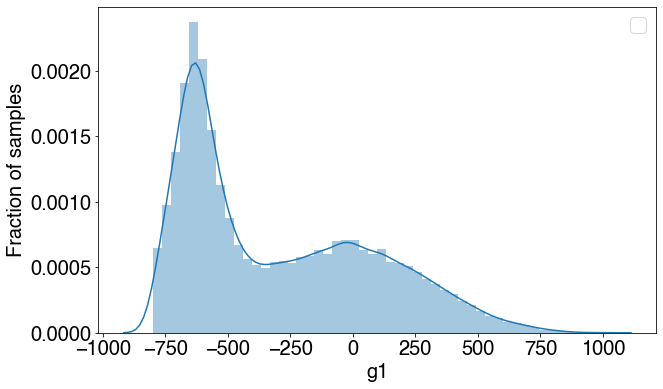

No handles with labels found to put in legend.


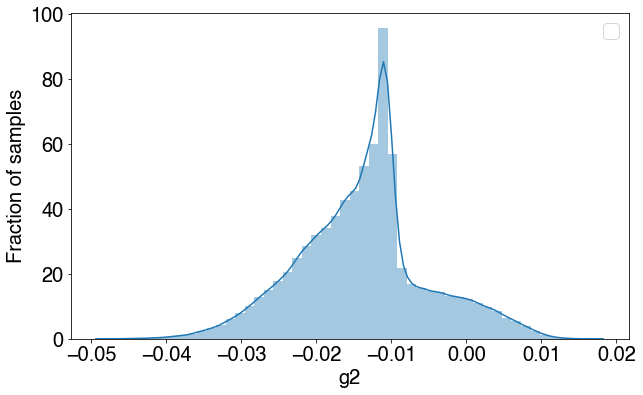

In [7]:
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(g1_constraint)
ax.set(xlabel= 'g1', ylabel = 'Fraction of samples')
plt.legend()
plt.show()

fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(g2_constraint)
ax.set(xlabel= 'g2', ylabel = 'Fraction of samples')
plt.legend()
plt.show()

In [8]:
# Combine g1_constraint and g2_constraint into a (n x 2) array for standardization purposes
g1g2_constraint = []
for i in range(len(g1_constraint)):
    g1g2_constraint += [[g1_constraint[i][0], g2_constraint[i][0]]]
g1g2_constraint = np.array(g1g2_constraint)
g1g2_constraint

array([[-3.17732541e+01, -1.11430764e-02],
       [-3.17732541e+01, -1.14443578e-02],
       [-3.17732541e+01, -1.34207740e-02],
       ...,
       [-7.27335571e+02, -1.20299498e-02],
       [-7.42746397e+02, -5.73883172e-03],
       [-7.42746397e+02,  7.47320728e-04]])

In [9]:
# Standardize data for C-network
X = state_action
y = g1g2_constraint

scaler_X = StandardScaler().fit(X)
scaler_y = StandardScaler().fit(y)

# Get mean and std
x_mean_C = scaler_X.mean_
x_std_C  = scaler_X.scale_
y_mean_C = scaler_y.mean_
y_std_C  = scaler_y.scale_

# Scale x
X_scaled = np.zeros(X.shape)
for feature in range(len(x_mean_C)): 
    X_scaled[:,feature] = (X[:,feature] - x_mean_C[feature])/x_std_C[feature]

# Scale g1
g1_scaled = np.zeros([y.shape[0],1])
g1_scaled[:] = (g1_constraint[:] - y_mean_C[0])/y_std_C[0] # Use 0th index of y_mean and y_std

# Scale g2
g2_scaled = np.zeros([y.shape[0],1])
g2_scaled[:] = (g2_constraint[:] - y_mean_C[1])/y_std_C[1] # Use 1st index of y_mean and y_std

# Convert into tensors
X_scaled = torch.tensor(X_scaled)
g1_scaled = torch.tensor(g1_scaled)
g2_scaled = torch.tensor(g2_scaled)
X_scaled, g1_scaled, g2_scaled

(tensor([[-1.2219, -0.7502, -1.1121,  1.5933,  1.5373,  0.1566],
         [-1.1472,  0.2174, -1.0413,  1.3036, -1.3677, -0.8253],
         [-1.0378,  0.3274, -0.9403,  1.0139,  0.7942,  0.6343],
         ...,
         [ 0.9591, -0.2539,  0.9137, -1.0139,  0.4292, -0.5151],
         [ 1.2628, -0.9872,  1.3649, -1.3036,  0.4475, -1.2772],
         [ 1.3129, -1.1458,  1.6163, -1.5933,  1.2178, -0.5415]],
        dtype=torch.float64),
 tensor([[ 0.6989],
         [ 0.6989],
         [ 0.6989],
         ...,
         [-1.1325],
         [-1.1731],
         [-1.1731]], dtype=torch.float64),
 tensor([[0.3013],
         [0.2664],
         [0.0369],
         ...,
         [0.1984],
         [0.9287],
         [1.6817]], dtype=torch.float64))

In [10]:
len(X_scaled), len(g1_scaled), len(g2_scaled)

(120000, 120000, 120000)

### Training g1-net

In [748]:
g1_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 6 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

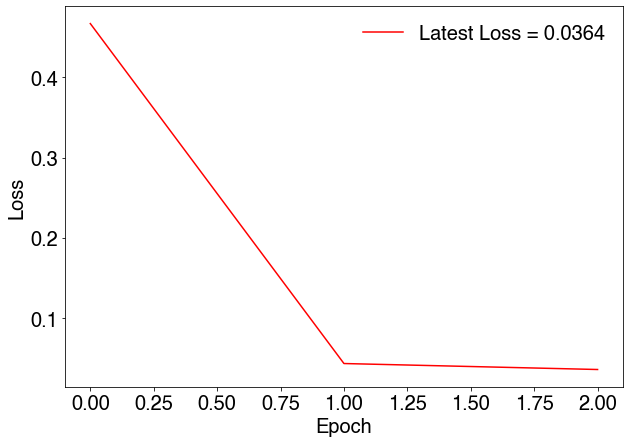

Current Epoch = 2
Latest Loss = 0.03641895434408924


KeyboardInterrupt: 

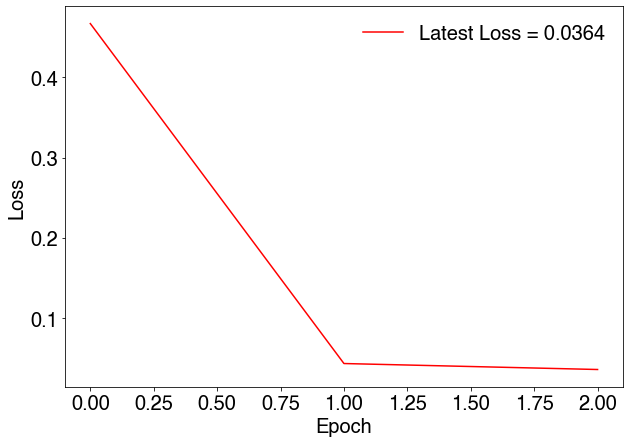

In [749]:
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, g1_scaled)

optimizer = torch.optim.Adam(g1_net.parameters(), lr = 1e-4, amsgrad= True) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss

BATCH_SIZE = 200 # Batch size
EPOCH      = 500   # No. of epochs

# Splitting dataset into batches
loader = torch.utils.data.DataLoader(dataset     = torch_dataset, 
                         batch_size  = BATCH_SIZE, 
                         shuffle     = True, 
                         num_workers = 0)

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        prediction = g1_net(batch_x.double())          # input x and predict based on x

        loss       = loss_func(prediction, batch_y) # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients

        if step == 1:
            # plot and show learning process
            plt.cla()
            loss_list += [loss.data.numpy()]
            plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
            plt.xlabel('Epoch', fontsize = 20)
            plt.ylabel('Loss', fontsize = 20)
            plt.xticks(fontsize = 20)
            plt.yticks(fontsize = 20)
            plt.legend(fontsize = 20, frameon= 0)
            
            display.clear_output(wait = True) #these two lines plots the data in real time
            display.display(fig)
            print('Current Epoch =', epoch)
            print('Latest Loss =', loss.data.numpy())

In [2982]:
# # Save neural network
# torch.save(g1_net, './NN_models/CS1_g1_combined')

# # Load pre-trained neural network
# g1_net = torch.load('./NN_models/CS1_g1_combined')
# g1_net.eval()

Sequential(
  (0): Linear(in_features=6, out_features=200, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=200, out_features=200, bias=True)
  (3): LeakyReLU(negative_slope=0.01)
  (4): Linear(in_features=200, out_features=100, bias=True)
  (5): LeakyReLU(negative_slope=0.01)
  (6): Linear(in_features=100, out_features=50, bias=True)
  (7): LeakyReLU(negative_slope=0.01)
  (8): Linear(in_features=50, out_features=1, bias=True)
)

Very poor prediction of first transition [1.0, 150.0, 0, 240, u_L, u_Fn] --> cannot predict -ve values of g1

In [220]:
print('g1_net predictions of g1:',  (g1_net(X_scaled[0:200:12]).detach().numpy()*y_std_C[0])+y_mean_C[0]   )
print('Actual labels:',  g1_constraint[0:200:12]   )

g1_net predictions of g1: [[169.88598475]
 [192.16665927]
 [277.96121581]
 [168.94059048]
 [ 49.9956065 ]
 [ 19.36737399]
 [105.84107779]
 [339.76878869]
 [ 47.18078534]
 [281.01348606]
 [ 24.07480609]
 [109.42772014]
 [297.25347707]
 [ 37.70378133]
 [181.43995365]
 [163.2190903 ]
 [143.60078228]]
Actual labels: [[  77.73519622]
 [ 638.94362711]
 [ 176.46875385]
 [ 431.98459369]
 [ 401.34313084]
 [ 587.24721208]
 [ 338.53076033]
 [ 294.07330344]
 [-137.29324356]
 [ 278.98456649]
 [  17.84313246]
 [  12.3166078 ]
 [ 301.80490414]
 [ -22.61426158]
 [ 157.30346801]
 [ -50.66123331]
 [  62.18762976]]


### Training g2-net

In [753]:
g2_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 6 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

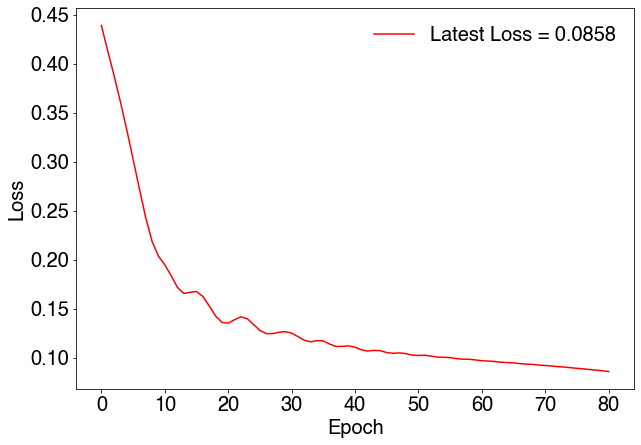

Current Epoch = 80
Latest Loss = 0.08576015739642467


KeyboardInterrupt: 

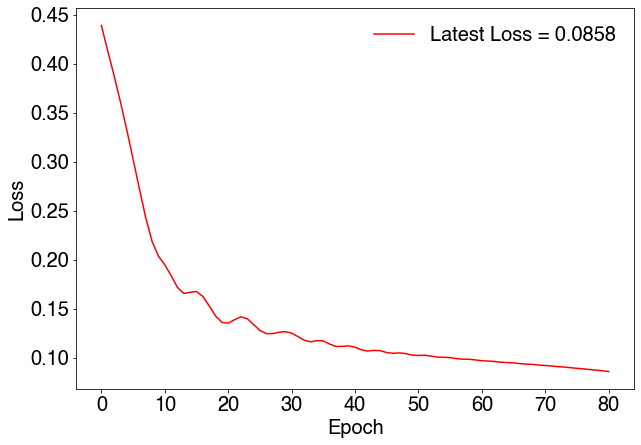

In [751]:
# for overfitting
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, g2_scaled)

optimizer = torch.optim.Adam(g2_net.parameters(), lr = 1e-3, amsgrad= True) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss


EPOCH      = 1000   # No. of epochs

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    

    prediction = g2_net(X_scaled)          # input x and predict based on x

    loss       = loss_func(prediction, g2_scaled) # must be (1. nn output, 2. target)

    optimizer.zero_grad()   # clear gradients for next train
    loss.backward()         # backpropagation, compute gradients
    optimizer.step()        # apply gradients


            # plot and show learning process
    plt.cla()
    loss_list += [loss.data.numpy()]
    plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
    plt.xlabel('Epoch', fontsize = 20)
    plt.ylabel('Loss', fontsize = 20)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.legend(fontsize = 20, frameon= 0)
            
    display.clear_output(wait = True) #these two lines plots the data in real time
    display.display(fig)
    print('Current Epoch =', epoch)
    print('Latest Loss =', loss.data.numpy())

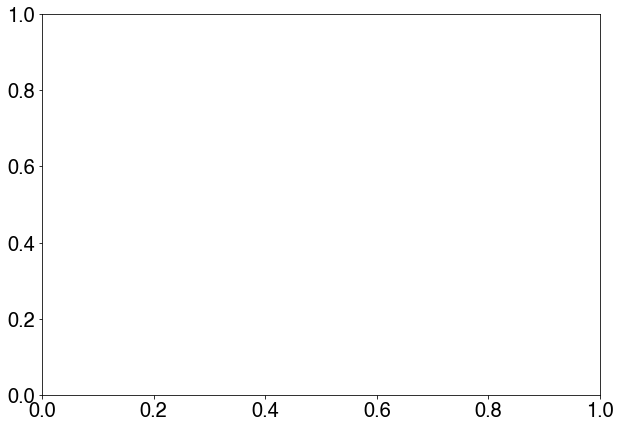

In [488]:
# Define dataset
torch_dataset = torch.utils.data.TensorDataset(X_scaled, g2_scaled)

optimizer = torch.optim.Adam(g2_net.parameters(), lr = 1e-4, amsgrad= True) # Initialize Adam optimizer
loss_func = torch.nn.SmoothL1Loss()  # this is for regression mean squared loss

BATCH_SIZE = 200 # Batch size
EPOCH      = 500   # No. of epochs

# Splitting dataset into batches
loader = torch.utils.data.DataLoader(dataset     = torch_dataset, 
                         batch_size  = BATCH_SIZE, 
                         shuffle     = True, 
                         num_workers = 0)

# my_images = []  # For saving into gif
fig, ax = plt.subplots(figsize=(10,7))

epoch_list = [] # Save epoch for plotting
loss_list  = [] # Save loss for plotting

# Start training
for epoch in range(EPOCH):
    epoch_list += [epoch]
    for step, (batch_x, batch_y) in enumerate(loader): # for each training step

        prediction = g2_net(batch_x.double())          # input x and predict based on x

        loss       = loss_func(prediction, batch_y) # must be (1. nn output, 2. target)

        optimizer.zero_grad()   # clear gradients for next train
        loss.backward()         # backpropagation, compute gradients
        optimizer.step()        # apply gradients

        if step == 1:
            # plot and show learning process
            plt.cla()
            loss_list += [loss.data.numpy()]
            plt.plot(epoch_list, loss_list, label = 'Latest Loss = %.4f' % loss.data.numpy(), color = 'r')
            plt.xlabel('Epoch', fontsize = 20)
            plt.ylabel('Loss', fontsize = 20)
            plt.xticks(fontsize = 20)
            plt.yticks(fontsize = 20)
            plt.legend(fontsize = 20, frameon= 0)
            
            display.clear_output(wait = True) #these two lines plots the data in real time
            display.display(fig)
            print('Current Epoch =', epoch)
            print('Latest Loss =', loss.data.numpy())

Poor prediction by g2_net in general (as shown by the high losses above)

In [228]:
print('g2_net predictions of g2:',  (g2_net(X_scaled[20:40]).detach().numpy()*y_std_C[1])+y_mean_C[1]   )
print('Actual labels:',  g2_constraint[20:40]   )

g2_net predictions of g2: [[ 0.00234046]
 [ 0.00488032]
 [ 0.002773  ]
 [ 0.00406091]
 [ 0.0047795 ]
 [ 0.00485463]
 [ 0.00445504]
 [ 0.0033243 ]
 [ 0.00295055]
 [ 0.00388676]
 [ 0.00386802]
 [ 0.00216321]
 [-0.00125155]
 [-0.00067009]
 [-0.00247181]
 [-0.00452562]
 [ 0.00319862]
 [ 0.00496048]
 [ 0.00425856]
 [ 0.00403404]]
Actual labels: [[ 0.00425832]
 [ 0.00425832]
 [ 0.00425832]
 [ 0.00425832]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [-0.00551784]
 [ 0.00548473]
 [ 0.00548473]
 [ 0.00548473]
 [ 0.00548473]]


In [427]:
min(g2_net(X_scaled).detach().numpy()*y_std_C[1])+y_mean_C[1]

array([-0.01654878])

## Plotting state space and visualize violation of constraints

### Random **unconstrained** policy

In [236]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_random_episode(initial_state = [1.0,150.0,0,0]) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=30)
    plt.ylabel('$C_n$', labelpad=50)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    plt.xlim(0,16)
    plt.ylim(0,2200)
    ax.set_zlim(0, 0.25)
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 13000
No. of states where g1 violated: 1639
No. of states where g2 violated: 909
No. of states where g3 violated: 191


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Random **g1-constrained** policy

In [2463]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_random_episode_constrained(initial_state = [1.0,150.0,0,0], g1_threshold = 0) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.title('States visited by random constrained policy')
    plt.xlabel('Cx', labelpad=20)
    plt.ylabel('Cn', labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 1300
No. of states where g1 violated: 0
No. of states where g2 violated: 44
No. of states where g3 violated: 36


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Trained **unconstrained** policy

In [2746]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    episode = generate_episode_with_NN(GA_optimize, [1.0, 150.0, 0, 0], epsilon = 0) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=20)
    plt.ylabel('$C_n$', labelpad=20)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 13000
No. of states where g1 violated: 5004
No. of states where g2 violated: 1000
No. of states where g3 violated: 0


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

### Trained **g1-constrained** policy

In [660]:
# Generate data using random policy
plotting_state_data = []
for i in range(1):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0,
                                      g1_threshold = g1_threshold,
                                      g2_threshold = g2_threshold) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set
# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)
plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

Cx_all = plotting_state_data[0]
Cn_all = plotting_state_data[1]
Cq_all = plotting_state_data[2]

Cx_g1 = plotting_state_data_g1_violated[0]
Cn_g1 = plotting_state_data_g1_violated[1]
Cq_g1 = plotting_state_data_g1_violated[2]

Cx_g2 = plotting_state_data_g2_violated[0]
Cn_g2 = plotting_state_data_g2_violated[1]
Cq_g2 = plotting_state_data_g2_violated[2]

Cx_g3 = plotting_state_data_g3_violated[0]
Cn_g3 = plotting_state_data_g3_violated[1]
Cq_g3 = plotting_state_data_g3_violated[2]

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=20)
    plt.ylabel('$C_n$', labelpad=20)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    # plt.zlabel('Cq')
    ax.view_init(ns,ew)
    plt.show()

KeyboardInterrupt: 

### Method 2: Training Q-network and C-network simultaneously

In [13]:
# Initialize Q-network
Q_net = torch.nn.Sequential(
        torch.nn.Linear(6,   200, bias = True), # 6 input nodes
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),    # apply ReLU activation function
        torch.nn.Linear(200,   1, bias = True), # 1 output node
    ).double()

# Initialize g1_network
g1_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 4 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

# Initialize g2_network
g2_net = torch.nn.Sequential(
        torch.nn.Linear(6, 200, bias = True), # 4 input nodes (Cx, Cn, Cq, t_f - t, u_L, u_Fn)
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 200, bias = True), 
        torch.nn.LeakyReLU(),                
        torch.nn.Linear(200, 100, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(100, 50, bias = True), 
        torch.nn.LeakyReLU(),
        torch.nn.Linear(50, 1, bias = True), # 1 output node
    ).double()

In [14]:
start = time.time()  # For timing purposes
reset_count = 0
# ========== 1) GENERATING INITIAL BATCH OF SAMPLES FOR REPLAY BUFFER ==========
epsilon       = 0.99 # Initial epsilon
g1_threshold  = 500  # Initial g1_threshold
g2_threshold  = 0.050  # Initial g2_threshold
replay_buffer = collections.deque(maxlen = 3000) # Max capacity of 3k
g1_buffer     = collections.deque(maxlen = 30000) # Max capacity of 30k
g2_buffer     = collections.deque(maxlen = 30000) # Max capacity of 30k

for i in range(100): # Generate 100 episodes
    episode       = generate_episode_with_NN(NN = GA_optimize_constrained,
                                             initial_state = [1.0, 150.0, 0, 0],
                                             epsilon = epsilon, 
                                             g1_threshold = g1_threshold,
                                             g2_threshold = g2_threshold)
    episode_copy  = copy.deepcopy(episode) # Copied to ensure same episodes are fed into Q and C
    episode_copy2 = copy.deepcopy(episode) # Copied to ensure same episodes are fed into Q and C
    replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
    g1_buffer     = update_g1_buffer(g1_buffer, episode_copy) # Add to g1 buffer
    g2_buffer     = update_g2_buffer(g2_buffer, episode_copy2) # Add to g2 buffer
print('Initial size of replay buffer:', len(replay_buffer))
print('Initial size of g1 buffer:', len(g1_buffer))
print('Initial size of g2 buffer:', len(g2_buffer))

# ================================= 2) TRAINING THE Q-NETWORK =================================
g1_threshold_list  = []
g2_threshold_list  = []
epsilon_list       = []
score_list         = [] # For plotting score of policy visited over time
iteration_list     = []
policy_mean_list   = [] # For plotting evolution of policy visited over time
policy_std_list    = [] # For plotting evolution of policy visited over time
training_loss_list = [] # For plotting loss of NN (after 20 epochs) over time
episode_bank       = [] # A list of list of lists - Tertiary list  -> Iterations
                        #                         - Secondary list -> Episodes
                        #                         - Primary list   -> Steps
                        #                         For plotting evolution of states visited over time            


for iteration in range(2000):
    
    # SCORE EXISTING POLICY
    print('=========== TRAINING ITERATION %.0f ===========' % iteration)
    print('Current epsilon = ', epsilon)
    print('Current g1_threshold = ', g1_threshold)
    print('Current g2_threshold = ', g2_threshold)
    try:
        current_score = score_NN_policy(GA_optimize_constrained, 
                                        initial_state = [1.0, 150.0, 0, 0], 
                                        num_iterations = 1, 
                                        get_control = False, 
                                        g1_threshold = g1_threshold,
                                        g2_threshold = g2_threshold)
    except KeyboardInterrupt: 
        try:
            current_score = score_NN_policy(GA_optimize_constrained, 
                                        initial_state = [1.0, 150.0, 0, 0], 
                                        num_iterations = 1, 
                                        get_control = False, 
                                        g1_threshold = g1_threshold,
                                        g2_threshold = g2_threshold)
        except KeyboardInterrupt:
            anneal_NN()
            
    print('AVERAGE SCORE = ', current_score)
    print('')
    
    # GENERATE EPISODES & ADD TO REPLAY BUFFER
    for j in range(100):
        try: # generate_episode_with_NN has timeout of 5 seconds
            episode      = generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = epsilon, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)
        except KeyboardInterrupt: # 2nd chance if first try fails
            try: # generate_episode_with_NN has timeout of 5 seconds
                episode      = generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = epsilon, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)
            except KeyboardInterrupt: # 2nd chance if first try fails
                try: # generate_episode_with_NN has timeout of 5 seconds
                    episode      = generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = epsilon, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)
                except KeyboardInterrupt:
                    anneal_NN()
                    
        if episode != None:                
            episode_copy  = copy.deepcopy(episode) # Copied to ensure same episodes are fed into Q and C
            episode_copy2 = copy.deepcopy(episode)
            replay_buffer = update_replay_buffer(replay_buffer, episode, discount_factor = 0.9) # Add to replay buffer
            g1_buffer     = update_g1_buffer(g1_buffer, episode_copy) # Add to g1 buffer
            g2_buffer     = update_g2_buffer(g2_buffer, episode_copy2) # Add to g2 buffer
            if j in np.arange(0, 100, 10):
                print('%.0f th episode generated' % j)
            
    # === TRAIN Q_NETWORK NETWORK ===
    combined_inputs_Q  = [] # List of lists to be converted into input tensor
    combined_targets_Q = [] # List to be converted into target tensor
    samples_Q          = random.sample(replay_buffer, 100) # Draw random samples from replay buffer
    
    for inputs, target in samples_Q:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_Q  += [inputs]
            combined_targets_Q += [[target]]
    combined_inputs_Q  = torch.tensor(combined_inputs_Q).double()  # Convert list to tensor
    combined_targets_Q = torch.tensor(combined_targets_Q).double() # Convert list to tensor

    Q_optimizer = torch.optim.Adam(Q_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    
    for epoch in range(20):
        prediction = Q_net(combined_inputs_Q)                    # Input x and predict based on x
        Q_loss     = loss_func(prediction, combined_targets_Q) # Must be (1. nn output, 2. target)

        Q_optimizer.zero_grad()   # Clear gradients for next train
        Q_loss.backward()         # Backpropagation, compute gradients
        Q_optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % Q_loss.data.numpy())
    print('Q-network trained')
    # === TRAIN g1_NETWORK ===
    combined_inputs_g1  = [] # List of lists to be converted into input tensor
    combined_targets_g1 = [] # List to be converted into target tensor
    samples_g1          = random.sample(g1_buffer, 500) # Draw random samples from replay buffer
    
    for inputs, target in samples_g1:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_g1  += [inputs]
            combined_targets_g1 += [[target]]

    combined_inputs_g1  = torch.tensor(combined_inputs_g1).double()  # Convert list to tensor
    combined_targets_g1 = torch.tensor(combined_targets_g1).double() # Convert list to tensor

    g1_optimizer = torch.optim.Adam(g1_net.parameters(), lr=1e-4) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    
    for epoch in range(10):
        prediction = g1_net(combined_inputs_g1)                    # Input x and predict based on x
        g1_loss    = loss_func(prediction, combined_targets_g1) # Must be (1. nn output, 2. target)

        g1_optimizer.zero_grad()   # Clear gradients for next train
        g1_loss.backward()         # Backpropagation, compute gradients
        g1_optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % g1_loss.data.numpy())
    print('g1-network trained')
    # === TRAIN g2_NETWORK ===
    combined_inputs_g2  = [] # List of lists to be converted into input tensor
    combined_targets_g2 = [] # List to be converted into target tensor
    samples_g2          = random.sample(g2_buffer, 1000) # Draw random samples from replay buffer
    
    for inputs, target in samples_g2:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_g2  += [inputs]
            combined_targets_g2 += [[target]]

    combined_inputs_g2  = torch.tensor(combined_inputs_g2).double()  # Convert list to tensor
    combined_targets_g2 = torch.tensor(combined_targets_g2).double() # Convert list to tensor

    g2_optimizer = torch.optim.Adam(g2_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    
    for epoch in range(100):
        prediction = g2_net(combined_inputs_g2)                    # Input x and predict based on x
        g2_loss    = loss_func(prediction, combined_targets_g2) # Must be (1. nn output, 2. target)

        g2_optimizer.zero_grad()   # Clear gradients for next train
        g2_loss.backward()         # Backpropagation, compute gradients
        g2_optimizer.step()        # Apply gradients
#         print('Epoch = ', epoch, 'Loss = %.4f' % g2_loss.data.numpy())
    print('g2-network trained')
    # Save information
    g1_threshold_list  += [g1_threshold]
    g2_threshold_list  += [g2_threshold]
    epsilon_list       += [epsilon]
    score_list         += [current_score] # Store score for each iteration
    training_loss_list += [Q_loss.data.numpy()]                                # Store training loss after 20 epochs for each iteration
    iteration_list     += [iteration]                                        # Store iteration
    

    # INVESTIGATING EVOLUTION OF STATES VISITED OVER TRAINING ITERATIONS
    if iteration in np.arange(0, 5000, 10): # Every 10 iterations
        pool_of_episodes = [] # A *list of lists* of episodes
        for i in range(10):   # Generate 10 sample episodes and store them
            try:
                pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = 0, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)]
            except KeyboardInterrupt:
                try:
                    pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = 0, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)]
                except KeyboardInterrupt:
                    try:
                        pool_of_episodes += [generate_episode_with_NN(NN = GA_optimize_constrained,
                                                 initial_state = [1.0, 150.0, 0, 0],
                                                 epsilon = 0, 
                                                 g1_threshold = g1_threshold,
                                                 g2_threshold = g2_threshold)]
                    except KeyboardInterrupt:
                        anneal_NN()
        episode_bank         += [pool_of_episodes]
    
    epsilon      *= 0.99 # Decay epsilon
    g1_threshold *= 0.995 # Decay threshold
    g2_threshold *= 0.995 # Decay threshold
end = time.time()  # For timing purposes
print('TIME TAKEN:', end - start)

Initial size of replay buffer: 1300
Initial size of g1 buffer: 1200
Initial size of g2 buffer: 1200
=========== TRAINING ITERATION 0 ===========
Current epsilon =  0.99
Current g1_threshold =  500
Current g2_threshold =  0.05
AVERAGE SCORE =  0.135442586214403

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1 ===========
Current epsilon =  0.9801
Current g1_threshold =  497.5
Current g2_threshold =  0.04975
AVERAGE SCORE =  0.1606779339710864

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network train

AVERAGE SCORE =  0.16920391728377845

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 17 ===========
Current epsilon =  0.8345137614500874
Current g1_threshold =  459.1582341771825
Current g2_threshold =  0.04591582341771825
AVERAGE SCORE =  0.18181797390595325

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 18 ===========
Current epsilon =  0.8261686238355865
Current g1_threshold =  456.8624430062966
Current g2_threshold =  0.045686244300

50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 33 ===========
Current epsilon =  0.7105532272722921
Current g1_threshold =  423.77142515117254
Current g2_threshold =  0.042377142515117254
AVERAGE SCORE =  0.19252060535944168

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 34 ===========
Current epsilon =  0.7034476949995692
Current g1_threshold =  421.65256802541666
Current g2_threshold =  0.04216525680254167
AVERAGE SCORE =  0.18333383096317957

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode g

g2-network trained
=========== TRAINING ITERATION 49 ===========
Current epsilon =  0.6050060671375365
Current g1_threshold =  391.11183772293555
Current g2_threshold =  0.03911118377229358
AVERAGE SCORE =  0.17111702429036366

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 50 ===========
Current epsilon =  0.5989560064661611
Current g1_threshold =  389.15627853432085
Current g2_threshold =  0.03891562785343211
AVERAGE SCORE =  0.17106049481901556

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network 

AVERAGE SCORE =  0.17402652999586837

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 66 ===========
Current epsilon =  0.5099857462495653
Current g1_threshold =  359.1644415493117
Current g2_threshold =  0.03591644415493119
AVERAGE SCORE =  0.1826591262903866

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 67 ===========
Current epsilon =  0.5048858887870696
Current g1_threshold =  357.36861934156514
Current g2_threshold =  0.035736861934

50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 82 ===========
Current epsilon =  0.4342313267918117
Current g1_threshold =  331.4840417306851
Current g2_threshold =  0.033148404173068524
AVERAGE SCORE =  0.17618969599657958

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 83 ===========
Current epsilon =  0.4298890135238936
Current g1_threshold =  329.82662152203164
Current g2_threshold =  0.032982662152203183
AVERAGE SCORE =  0.18210861047055674

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode g

g2-network trained
=========== TRAINING ITERATION 98 ===========
Current epsilon =  0.36972963764972655
Current g1_threshold =  305.9369392140238
Current g2_threshold =  0.0305936939214024
AVERAGE SCORE =  0.1775877126888309

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 99 ===========
Current epsilon =  0.36603234127322926
Current g1_threshold =  304.4072545179537
Current g2_threshold =  0.030440725451795388
AVERAGE SCORE =  0.15863098228234992

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network t

AVERAGE SCORE =  0.13818663361589958

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 115 ===========
Current epsilon =  0.3116610814491425
Current g1_threshold =  280.94692955816635
Current g2_threshold =  0.028094692955816652
AVERAGE SCORE =  0.17734902270300182

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 116 ===========
Current epsilon =  0.30854447063465107
Current g1_threshold =  279.5421949103755
Current g2_threshold =  0.0279542

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 131 ===========
Current epsilon =  0.2653662497477053
Current g1_threshold =  259.294665474229
Current g2_threshold =  0.02592946654742292
AVERAGE SCORE =  0.15170974267452986

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 132 ===========
Current epsilon =  0.2627125872502282
Current g1_threshold =  257.9981921468579
Current g2_threshold =  0.025799819214685805
AVERAGE SCORE =  0.15905641239516416

0 th episode generated
10 th episode generated
20 th episode ge

80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 147 ===========
Current epsilon =  0.22594815553398728
Current g1_threshold =  239.31111704665372
Current g2_threshold =  0.023931111704665393
AVERAGE SCORE =  0.10313928308257815

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 148 ===========
Current epsilon =  0.22368867397864742
Current g1_threshold =  238.11456146142046
Current g2_threshold =  0.023811456146142065
AVERAGE SCORE =  0.1585922912702465

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episo

AVERAGE SCORE =  0.15967679331211626

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 164 ===========
Current epsilon =  0.19046145976502743
Current g1_threshold =  219.76333984422112
Current g2_threshold =  0.021976333984422135
AVERAGE SCORE =  0.04575704925402019

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 165 ===========
Current epsilon =  0.18855684516737714
Current g1_threshold =  218.664523145
Current g2_threshold =  0.0218664523

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 169 ===========
Current epsilon =  0.18112695312597027
Current g1_threshold =  214.3239231649755
Current g2_threshold =  0.021432392316497576
AVERAGE SCORE =  0.157955942637024

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 170 ===========
Current epsilon =  0.17931568359471056
Current g1_threshold =  213.2523035491506
Current g2_threshold =  0.021325230354915087
AVERAGE SCORE =  0.1462139122210798

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 171 ===========
Current epsilon =  0.17752252675876345
Current g1_threshold =  212.18604203140487
Current g2_threshold =  0.021218604203140513
AVERAGE SCORE =  0.15593054707730977

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 177 ===========
Current epsilon =  0.16713393501488363
Current g1_threshold =  205.89950205638837
Current g2_threshold =  0.020589950205638866
AVERAGE SCORE =  0.1785644581807916

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 178 ===========
Current epsilon =  0.16546259566473479
Current g1_threshold =  204.87000454610643
Current g2_threshold =  0.02048700045461067
AVERAGE SCORE =  0.1597010589706732

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 180 ===========
Current epsilon =  0.16216989001100657
Current g1_threshold =  202.826426250759
Current g2_threshold =  0.02028264262507593
AVERAGE SCORE =  0.1650538883383547

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 181 ===========
Current epsilon =  0.1605481911108965
Current g1_threshold =  201.8122941195052
Current g2_threshold =  0.02018122941195055
AVERAGE SCORE =  0.15272797444339423

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 182 ===========
Current epsilon =  0.15894270919978754
Current g1_threshold =  200.80323264890768
Current g2_threshold =  0.020080323264890794
AVERAGE SCORE =  0.17342366140882243

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 183 ===========
Current epsilon =  0.15735328210778965
Current g1_threshold =  199.79921648566315
Current g2_threshold =  0.01997992164856634
AVERAGE SCORE =  0.169574805528373

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 184 ===========
Current epsilon =  0.15577974928671176
Current g1_threshold =  198.80022040323485
Current g2_threshold =  0.01988002204032351
AVERAGE SCORE =  0.1688377990057258

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 185 ===========
Current epsilon =  0.15422195179384465
Current g1_threshold =  197.80621930121868
Current g2_threshold =  0.01978062193012189
AVERAGE SCORE =  0.01240841024243431

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 187 ===========
Current epsilon =  0.15115293495314713
Current g1_threshold =  195.83310226368903
Current g2_threshold =  0.019583310226368927
AVERAGE SCORE =  0.1727642743704886

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 188 ===========
Current epsilon =  0.14964140560361566
Current g1_threshold =  194.85393675237057
Current g2_threshold =  0.01948539367523708
AVERAGE SCORE =  0.16416903377859965

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 189 ===========
Current epsilon =  0.1481449915475795
Current g1_threshold =  193.8796670686087
Current g2_threshold =  0.019387966706860896
AVERAGE SCORE =  0.1445390398005437

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 190 ===========
Current epsilon =  0.1466635416321037
Current g1_threshold =  192.91026873326567
Current g2_threshold =  0.01929102687332659
AVERAGE SCORE =  0.1440155180493727

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 191 ===========
Current epsilon =  0.14519690621578268
Current g1_threshold =  191.94571738959934
Current g2_threshold =  0.019194571738959956
AVERAGE SCORE =  0.011289870357059929

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 192 ===========
Current epsilon =  0.14374493715362485
Current g1_threshold =  190.98598880265135
Current g2_threshold =  0.019098598880265157
AVERAGE SCORE =  0.1641604331204094

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 193 ===========
Current epsilon =  0.1423074877820886
Current g1_threshold =  190.0310588586381
Current g2_threshold =  0.019003105885863833
AVERAGE SCORE =  0.156496949801617

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 194 ===========
Current epsilon =  0.1408844129042677
Current g1_threshold =  189.0809035643449
Current g2_threshold =  0.018908090356434513
AVERAGE SCORE =  0.1435832390861402

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 195 ===========
Current epsilon =  0.13947556877522502
Current g1_threshold =  188.1354990465232
Current g2_threshold =  0.01881354990465234
AVERAGE SCORE =  0.17830839899997247

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 196 ===========
Current epsilon =  0.13808081308747278
Current g1_threshold =  187.19482155129057
Current g2_threshold =  0.01871948215512908
AVERAGE SCORE =  0.14743675502793524

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 197 ===========
Current epsilon =  0.13670000495659804
Current g1_threshold =  186.2588474435341
Current g2_threshold =  0.018625884744353432
AVERAGE SCORE =  0.15291832831446986

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 198 ===========
Current epsilon =  0.13533300490703207
Current g1_threshold =  185.32755320631642
Current g2_threshold =  0.018532755320631665
AVERAGE SCORE =  0.027813838519112403

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 199 ===========
Current epsilon =  0.13397967485796175
Current g1_threshold =  184.40091544028485
Current g2_threshold =  0.018440091544028505
AVERAGE SCORE =  0.15744832328184757

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 200 ===========
Current epsilon =  0.13263987810938213
Current g1_threshold =  183.47891086308343
Current g2_threshold =  0.01834789108630836
AVERAGE SCORE =  0.1684693345129854

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 201 ===========
Current epsilon =  0.1313134793282883
Current g1_threshold =  182.561516308768
Current g2_threshold =  0.018256151630876818
AVERAGE SCORE =  0.17149184597182507



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 202 ===========
Current epsilon =  0.13000034453500542
Current g1_threshold =  181.64870872722418
Current g2_threshold =  0.018164870872722432
AVERAGE SCORE =  0.16811293118712325

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 203 ===========
Current epsilon =  0.12870034108965536
Current g1_threshold =  180.74046518358804
Current g2_threshold =  0.01807404651835882
AVERAGE SCORE =  0.17145663186211169

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 204 ===========
Current epsilon =  0.12741333767875881
Current g1_threshold =  179.8367628576701
Current g2_threshold =  0.017983676285767025
AVERAGE SCORE =  0.16478366709033113

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 205 ===========
Current epsilon =  0.12613920430197123
Current g1_threshold =  178.93757904338173
Current g2_threshold =  0.01789375790433819
AVERAGE SCORE =  0.16479544422836193

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 206 ===========
Current epsilon =  0.12487781225895152
Current g1_threshold =  178.0428911481648
Current g2_threshold =  0.0178042891148165
AVERAGE SCORE =  0.16072578919690955

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 207 ===========
Current epsilon =  0.123629034136362
Current g1_threshold =  177.152676692424
Current g2_threshold =  0.017715267669242418
AVERAGE SCORE =  0.15867286035722794

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 208 ===========
Current epsilon =  0.12239274379499838
Current g1_threshold =  176.26691330896188
Current g2_threshold =  0.017626691330896206
AVERAGE SCORE =  0.1662745835271772

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 209 ===========
Current epsilon =  0.1211688163570484
Current g1_threshold =  175.38557874241707
Current g2_threshold =  0.017538557874241724
AVERAGE SCORE =  0.14124605741074028

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 210 ===========
Current epsilon =  0.11995712819347792
Current g1_threshold =  174.50865084870497
Current g2_threshold =  0.017450865084870516
AVERAGE SCORE =  0.16666434242299216

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 211 ===========
Current epsilon =  0.11875755691154315
Current g1_threshold =  173.63610759446144
Current g2_threshold =  0.017363610759446164
AVERAGE SCORE =  0.15788675294756102

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 212 ===========
Current epsilon =  0.11756998134242772
Current g1_threshold =  172.76792705648913
Current g2_threshold =  0.017276792705648934
AVERAGE SCORE =  0.14148660478872357

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 213 ===========
Current epsilon =  0.11639428152900344
Current g1_threshold =  171.90408742120667
Current g2_threshold =  0.01719040874212069
AVERAGE SCORE =  0.16355243222777419

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 214 ===========
Current epsilon =  0.11523033871371341
Current g1_threshold =  171.04456698410064
Current g2_threshold =  0.017104456698410084
AVERAGE SCORE =  0.15516383521573274

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 215 ===========
Current epsilon =  0.11407803532657627
Current g1_threshold =  170.18934414918013
Current g2_threshold =  0.017018934414918033
AVERAGE SCORE =  0.13779669991509708

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 216 ===========
Current epsilon =  0.11293725497331052
Current g1_threshold =  169.33839742843423
Current g2_threshold =  0.016933839742843442
AVERAGE SCORE =  0.1593894872192354

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 218 ===========
Current epsilon =  0.11068980359934164
Current g1_threshold =  167.64924691408558
Current g2_threshold =  0.016764924691408577
AVERAGE SCORE =  0.159606348793215

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 219 ===========
Current epsilon =  0.10958290556334822
Current g1_threshold =  166.81100067951516
Current g2_threshold =  0.016681100067951534
AVERAGE SCORE =  0.17575562851951684



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 220 ===========
Current epsilon =  0.10848707650771475
Current g1_threshold =  165.9769456761176
Current g2_threshold =  0.016597694567611777
AVERAGE SCORE =  0.17275612822761213

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 221 ===========
Current epsilon =  0.1074022057426376
Current g1_threshold =  165.147060947737
Current g2_threshold =  0.016514706094773717
AVERAGE SCORE =  0.12889713362324168

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 224 ===========
Current epsilon =  0.10421225282987552
Current g1_threshold =  162.6822204197094
Current g2_threshold =  0.016268222041970957
AVERAGE SCORE =  0.17533846481822316

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 225 ===========
Current epsilon =  0.10317013030157676
Current g1_threshold =  161.86880931761087
Current g2_threshold =  0.016186880931761103
AVERAGE SCORE =  0.18002563649936207

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 226 ===========
Current epsilon =  0.10213842899856099
Current g1_threshold =  161.05946527102282
Current g2_threshold =  0.0161059465271023
AVERAGE SCORE =  0.16132961076624042

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 227 ===========
Current epsilon =  0.10111704470857538
Current g1_threshold =  160.2541679446677
Current g2_threshold =  0.016025416794466788
AVERAGE SCORE =  0.17501841053531705

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 228 ===========
Current epsilon =  0.10010587426148963
Current g1_threshold =  159.45289710494436
Current g2_threshold =  0.015945289710494453
AVERAGE SCORE =  0.1539593819070881

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 229 ===========
Current epsilon =  0.09910481551887473
Current g1_threshold =  158.65563261941963
Current g2_threshold =  0.01586556326194198
AVERAGE SCORE =  0.1736831748528982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 230 ===========
Current epsilon =  0.09811376736368599
Current g1_threshold =  157.86235445632255
Current g2_threshold =  0.01578623544563227


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1736831748528982



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 231 ===========
Current epsilon =  0.09713262969004913
Current g1_threshold =  157.07304268404093
Current g2_threshold =  0.01570730426840411
AVERAGE SCORE =  0.1708119458362322

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 232 ===========
Current epsilon =  0.09616130339314863
Current g1_threshold =  156.28767747062074
Current g2_threshold =  0.015628767747062088
AVERAGE SCORE =  0.14050402150062782

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 233 ===========
Current epsilon =  0.09519969035921715
Current g1_threshold =  155.50623908326764
Current g2_threshold =  0.015550623908326776
AVERAGE SCORE =  0.16537299181838283

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 234 ===========
Current epsilon =  0.09424769345562498
Current g1_threshold =  154.7287078878513
Current g2_threshold =  0.015472870788785143
AVERAGE SCORE =  0.16395189098100818

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 235 ===========
Current epsilon =  0.09330521652106873
Current g1_threshold =  153.95506434841204
Current g2_threshold =  0.015395506434841217


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.16395189098100818

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 236 ===========
Current epsilon =  0.09237216435585804
Current g1_threshold =  153.18528902666998
Current g2_threshold =  0.01531852890266701
AVERAGE SCORE =  0.16323617984374958

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 237 ===========
Current epsilon =  0.09144844271229946
Current g1_threshold =  152.41936258153663
Current g2_threshold =  0.015241936258153675
AVERAGE SCORE =  0.1706794189373357



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 238 ===========
Current epsilon =  0.09053395828517646
Current g1_threshold =  151.65726576862895
Current g2_threshold =  0.015165726576862906
AVERAGE SCORE =  0.08981649138855392

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 239 ===========
Current epsilon =  0.08962861870232469
Current g1_threshold =  150.8989794397858
Current g2_threshold =  0.015089897943978591
AVERAGE SCORE =  0.023107

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 240 ===========
Current epsilon =  0.08873233251530144
Current g1_threshold =  150.14448454258687
Current g2_threshold =  0.015014448454258698
AVERAGE SCORE =  0.17325611714717587

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 241 ===========
Current epsilon =  0.08784500919014843
Current g1_threshold =  149.39376211987394
Current g2_threshold =  0.014939376211987404
AVERAGE SCORE =  0.16588572481795055

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 242 ===========
Current epsilon =  0.08696655909824694
Current g1_threshold =  148.64679330927456
Current g2_threshold =  0.014864679330927466
AVERAGE SCORE =  0.12622046686241498

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 243 ===========
Current epsilon =  0.08609689350726446
Current g1_threshold =  147.9035593427282
Current g2_threshold =  0.014790355934272829
AVERAGE SCORE =  0.1641173545830262

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 244 ===========
Current epsilon =  0.08523592457219181
Current g1_threshold =  147.16404154601454
Current g2_threshold =  0.014716404154601464
AVERAGE SCORE =  0.16766461968487442

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 245 ===========
Current epsilon =  0.0843835653264699
Current g1_threshold =  146.42822133828446
Current g2_threshold =  0.014642822133828457
AVERAGE SCORE =  0.15948871772774922

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 246 ===========
Current epsilon =  0.0835397296732052
Current g1_threshold =  145.69608023159304
Current g2_threshold =  0.014569608023159314
AVERAGE SCORE =  0.042804585181989624

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 247 ===========
Current epsilon =  0.08270433237647315
Current g1_threshold =  144.9675998304351
Current g2_threshold =  0.014496759983043518
AVERAGE SCORE =  0.1580092992134094

0 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 248 ===========
Current epsilon =  0.08187728905270841
Current g1_threshold =  144.2427618312829
Current g2_threshold =  0.0144242761831283
AVERAGE SCORE =  0.14461721457312268

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 249 ===========
Current epsilon =  0.08105851616218133
Current g1_threshold =  143.5215480221265
Current g2_threshold =  0.014352154802212658
AVERAGE SCORE =  0.17035726385254865

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 250 ===========
Current epsilon =  0.08024793100055952
Current g1_threshold =  142.80394028201587
Current g2_threshold =  0.014280394028201594
AVERAGE SCORE =  0.17485957459689694

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17275977996612568



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 253 ===========
Current epsilon =  0.07786448720191189
Current g1_threshold =  140.67257362281424
Current g2_threshold =  0.014067257362281432
AVERAGE SCORE =  0.17047998296455455

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 254 ===========
Current epsilon =  0.07708584232989277
Current g1_threshold =  139.96921075470016
Current g2_threshold =  0.013996921075470025
AVERAGE SCORE =  0.1705022975389964

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 255 ===========
Current epsilon =  0.07631498390659384
Current g1_threshold =  139.26936470092664
Current g2_threshold =  0.013926936470092674
AVERAGE SCORE =  0.17007463058737962

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 258 ===========
Current epsilon =  0.07404835256958411
Current g1_threshold =  137.19075202409473
Current g2_threshold =  0.013719075202409482
AVERAGE SCORE =  0.1632735607256304

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 259 ===========
Current epsilon =  0.07330786904388827
Current g1_threshold =  136.50479826397427
Current g2_threshold =  0.013650479826397435
AVERAGE SCORE =  0.05122423861307572

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 260 ===========
Current epsilon =  0.07257479035344938
Current g1_threshold =  135.8222742726544
Current g2_threshold =  0.013582227427265448
AVERAGE SCORE =  0.16230763301170403

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 261 ===========
Current epsilon =  0.07184904244991488
Current g1_threshold =  135.14316290129113
Current g2_threshold =  0.01351431629012912
AVERAGE SCORE =  0.12615366413631282

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 262 ===========
Current epsilon =  0.07113055202541574
Current g1_threshold =  134.4674470867847
Current g2_threshold =  0.013446744708678475
AVERAGE SCORE =  0.15983273133629933

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 263 ===========
Current epsilon =  0.07041924650516158
Current g1_threshold =  133.79510985135076
Current g2_threshold =  0.013379510985135084
AVERAGE SCORE =  0.1663711280607928

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 264 ===========
Current epsilon =  0.06971505404010997
Current g1_threshold =  133.12613430209402
Current g2_threshold =  0.013312613430209409
AVERAGE SCORE =  0.16422617586397387

0 th episode generated
10 th episode generated
20 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 265 ===========
Current epsilon =  0.06901790349970886
Current g1_threshold =  132.46050363058353
Current g2_threshold =  0.013246050363058362
AVERAGE SCORE =  0.172348189369005

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 266 ===========
Current epsilon =  0.06832772446471178
Current g1_threshold =  131.7982011124306
Current g2_threshold =  0.01317982011124307


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.1643465697996866



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 267 ===========
Current epsilon =  0.06764444722006466
Current g1_threshold =  131.13921010686846
Current g2_threshold =  0.013113921010686855


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1643465697996866

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 268 ===========
Current epsilon =  0.066968002747864
Current g1_threshold =  130.48351405633412
Current g2_threshold =  0.01304835140563342


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1643465697996866

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 269 ===========
Current epsilon =  0.06629832272038537
Current g1_threshold =  129.83109648605245
Current g2_threshold =  0.012983109648605254
AVERAGE SCORE =  0.16174419228928652

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 270 ===========
Current epsilon =  0.06563533949318151
Current g1_threshold =  129.18194100362217
Current g2_threshold =  0.012918194100362228
AVERAGE SCORE =  0.1694664004757507

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 271 ===========
Current epsilon =  0.06497898609824969
Current g1_threshold =  128.53603129860406
Current g2_threshold =  0.012853603129860417
AVERAGE SCORE =  0.17570552424911642

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 273 ===========
Current epsilon =  0.06368590427489453
Current g1_threshold =  127.25388438640049
Current g2_threshold =  0.012725388438640059
AVERAGE SCORE =  0.177578558479409

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 274 ===========
Current epsilon =  0.06304904523214558
Current g1_threshold =  126.61761496446849
Current g2_threshold =  0.012661761496446858
AVERAGE SCORE =  0.15863751091513298

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 276 ===========
Current epsilon =  0.06179436923202588
Current g1_threshold =  125.35460425519791
Current g2_threshold =  0.012535460425519802
AVERAGE SCORE =  0.1663974869403742

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 277 ===========
Current epsilon =  0.06117642553970562
Current g1_threshold =  124.72783123392192
Current g2_threshold =  0.012472783123392202
AVERAGE SCORE =  0.16319226396986133

0 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 278 ===========
Current epsilon =  0.06056466128430856
Current g1_threshold =  124.1041920777523
Current g2_threshold =  0.01241041920777524
AVERAGE SCORE =  0.16968608579374603

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 279 ===========
Current epsilon =  0.05995901467146548
Current g1_threshold =  123.48367111736354
Current g2_threshold =  0.012348367111736364
AVERAGE SCORE =  0.17632256951379413

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 280 ===========
Current epsilon =  0.05935942452475082
Current g1_threshold =  122.86625276177672
Current g2_threshold =  0.012286625276177682
AVERAGE SCORE =  0.16299716117113175

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 281 ===========
Current epsilon =  0.058765830279503314
Current g1_threshold =  122.25192149796784
Current g2_threshold =  0.012225192149796794
AVERAGE SCORE =  0.17775877185477065

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 286 ===========
Current epsilon =  0.05588571986991978
Current g1_threshold =  119.22603400764646
Current g2_threshold =  0.011922603400764656
AVERAGE SCORE =  0.16326356557144953

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 287 ===========
Current epsilon =  0.055326862671220584
Current g1_threshold =  118.62990383760823
Current g2_threshold =  0.011862990383760832
AVERAGE SCORE =  0.17597165307578172

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 288 ===========
Current epsilon =  0.05477359404450838
Current g1_threshold =  118.03675431842018
Current g2_threshold =  0.011803675431842029
AVERAGE SCORE =  0.16916424780543496

0 th episode generated
10 th episode generated
20 th episode generated
30 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.16916424780543496

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 290 ===========
Current epsilon =  0.05368359952302266
Current g1_threshold =  116.85933769409394
Current g2_threshold =  0.011685933769409405
AVERAGE SCORE =  0.15631496503415265

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 291 ===========
Current epsilon =  0.053146763527792434
Current g1_threshold =  116.27504100562346
Current g2_threshold =  0.011627504100562357
AVERAGE SCORE =  0.1600008336280867

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 292 ===========
Current epsilon =  0.052615295892514506
Current g1_threshold =  115.69366580059534
Current g2_threshold =  0.011569366580059545
AVERAGE SCORE =  0.15620022310776463

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 293 ===========
Current epsilon =  0.052089142933589364
Current g1_threshold =  115.11519747159237
Current g2_threshold =  0.011511519747159247
AVERAGE SCORE =  0.16726374987155387

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 294 ===========
Current epsilon =  0.05156825150425347
Current g1_threshold =  114.5396214842344
Current g2_threshold =  0.01145396214842345
AVERAGE SCORE =  0.1526765917711167

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 295 ===========
Current epsilon =  0.051052568989210935
Current g1_threshold =  113.96692337681323
Current g2_threshold =  0.011396692337681332
AVERAGE SCORE =  0.1636695344321115

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 297 ===========
Current epsilon =  0.05003662286632564
Current g1_threshold =  112.83010331612951
Current g2_threshold =  0.011283010331612962
AVERAGE SCORE =  0.1675403759546779

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 298 ===========
Current epsilon =  0.04953625663766238
Current g1_threshold =  112.26595279954886
Current g2_threshold =  0.011226595279954897
AVERAGE SCORE =  0.14797998900496473

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 299 ===========
Current epsilon =  0.04904089407128576
Current g1_threshold =  111.70462303555111
Current g2_threshold =  0.011170462303555123
AVERAGE SCORE =  0.16121862760655095

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 300 ===========
Current epsilon =  0.0485504851305729
Current g1_threshold =  111.14609992037336
Current g2_threshold =  0.011114609992037347
AVERAGE SCORE =  0.15570888514698764

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 301 ===========
Current epsilon =  0.048064980279267165
Current g1_threshold =  110.5903694207715
Current g2_threshold =  0.01105903694207716
AVERAGE SCORE =  0.17354938423343463

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 302 ===========
Current epsilon =  0.04758433047647449
Current g1_threshold =  110.03741757366764
Current g2_threshold =  0.011003741757366774
AVERAGE SCORE =  0.15951553378367936

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 304 ===========
Current epsilon =  0.04663740229999265
Current g1_threshold =  108.9397943333703
Current g2_threshold =  0.010893979433337041
AVERAGE SCORE =  0.15353016331789224

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 305 ===========
Current epsilon =  0.04617102827699272
Current g1_threshold =  108.39509536170345
Current g2_threshold =  0.010839509536170357
AVERAGE SCORE =  0.15491372388554275

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 306 ===========
Current epsilon =  0.045709317994222794
Current g1_threshold =  107.85311988489494
Current g2_threshold =  0.010785311988489504


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.15491372388554275

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 307 ===========
Current epsilon =  0.04525222481428057
Current g1_threshold =  107.31385428547046
Current g2_threshold =  0.010731385428547057


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.15491372388554275



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 308 ===========
Current epsilon =  0.04479970256613776
Current g1_threshold =  106.7772850140431
Current g2_threshold =  0.010677728501404322


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.15491372388554275



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 309 ===========
Current epsilon =  0.04435170554047638
Current g1_threshold =  106.24339858897288
Current g2_threshold =  0.0106243398588973


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.15491372388554275

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 310 ===========
Current epsilon =  0.043908188485071616
Current g1_threshold =  105.71218159602802
Current g2_threshold =  0.010571218159602814


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.15491372388554275

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 311 ===========
Current epsilon =  0.0434691066002209
Current g1_threshold =  105.18362068804788
Current g2_threshold =  0.0105183620688048
AVERAGE SCORE =  0.14052870735306397

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 312 ===========
Current epsilon =  0.04303441553421869
Current g1_threshold =  104.65770258460765
Current g2_threshold =  0.010465770258460776


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.14052870735306397

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 313 ===========
Current epsilon =  0.0426040713788765
Current g1_threshold =  104.1344140716846
Current g2_threshold =  0.010413441407168473


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.14052870735306397

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 314 ===========
Current epsilon =  0.04217803066508773
Current g1_threshold =  103.61374200132617
Current g2_threshold =  0.01036137420013263
AVERAGE SCORE =  0.1544232538433844

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 315 ===========
Current epsilon =  0.04175625035843686
Current g1_threshold =  103.09567329131954
Current g2_threshold =  0.010309567329131967
AVERAGE SCORE =  0.16816064566685313

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 316 ===========
Current epsilon =  0.041338687854852486
Current g1_threshold =  102.58019492486295
Current g2_threshold =  0.010258019492486307
AVERAGE SCORE =  0.17183837876752142

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 317 ===========
Current epsilon =  0.04092530097630396
Current g1_threshold =  102.06729395023864
Current g2_threshold =  0.010206729395023876
AVERAGE SCORE =  0.13903863054161253



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 318 ===========
Current epsilon =  0.040516047966540916
Current g1_threshold =  101.55695748048744
Current g2_threshold =  0.010155695748048756
AVERAGE SCORE =  0.17845171317627803

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 319 ===========
Current epsilon =  0.04011088748687551
Current g1_threshold =  101.049172693085
Current g2_threshold =  0.010104917269308513


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17845171317627803



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 320 ===========
Current epsilon =  0.03970977861200675
Current g1_threshold =  100.54392682961958
Current g2_threshold =  0.01005439268296197
AVERAGE SCORE =  0.17065714266528176

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 321 ===========
Current epsilon =  0.03931268082588668
Current g1_threshold =  100.04120719547149
Current g2_threshold =  0.010004120719547161
AVERAGE SCORE =  0.1740407389167009

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 322 ===========
Current epsilon =  0.03891955401762781
Current g1_threshold =  99.54100115949413
Current g2_threshold =  0.009954100115949426


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1740407389167009



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 323 ===========
Current epsilon =  0.03853035847745153
Current g1_threshold =  99.04329615369666
Current g2_threshold =  0.009904329615369679
AVERAGE SCORE =  0.1702669091450792

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 324 ===========
Current epsilon =  0.03814505489267701
Current g1_threshold =  98.54807967292818
Current g2_threshold =  0.009854807967292831


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1702669091450792

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 325 ===========
Current epsilon =  0.03776360434375024
Current g1_threshold =  98.05533927456354
Current g2_threshold =  0.009805533927456367
AVERAGE SCORE =  0.17396196872142938

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 326 ===========
Current epsilon =  0.03738596830031274
Current g1_threshold =  97.56506257819072
Current g2_threshold =  0.009756506257819085
AVERAGE SCORE =  0.17297645032905642

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 327 ===========
Current epsilon =  0.03701210861730961
Current g1_threshold =  97.07723726529977
Current g2_threshold =  0.00970772372652999


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17297645032905642

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 328 ===========
Current epsilon =  0.03664198753113651
Current g1_threshold =  96.59185107897328
Current g2_threshold =  0.009659185107897341


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17297645032905642

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 329 ===========
Current epsilon =  0.036275567655825146
Current g1_threshold =  96.10889182357842
Current g2_threshold =  0.009610889182357854
AVERAGE SCORE =  0.17614169554664788

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 330 ===========
Current epsilon =  0.03591281197926689
Current g1_threshold =  95.62834736446052
Current g2_threshold =  0.009562834736446065
AVERAGE SCORE =  0.17383783543879175

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 331 ===========
Current epsilon =  0.035553683859474224
Current g1_threshold =  95.15020562763821
Current g2_threshold =  0.009515020562763835
AVERAGE SCORE =  0.17360512343889128

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 332 ===========
Current epsilon =  0.03519814702087948
Current g1_threshold =  94.67445459950002
Current g2_threshold =  0.009467445459950015
AVERAGE SCORE =  0.17641278354195125

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 333 ===========
Current epsilon =  0.03484616555067068
Current g1_threshold =  94.20108232650253
Current g2_threshold =  0.009420108232650265


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17641278354195125

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 334 ===========
Current epsilon =  0.034497703895163975
Current g1_threshold =  93.73007691487001
Current g2_threshold =  0.009373007691487014
AVERAGE SCORE =  0.17365900197210016



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 335 ===========
Current epsilon =  0.03415272685621234
Current g1_threshold =  93.26142653029567
Current g2_threshold =  0.00932614265302958
AVERAGE SCORE =  0.1769115827041126

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 336 ===========
Current epsilon =  0.03381119958765021
Current g1_threshold =  92.79511939764419
Current g2_threshold =  0.009279511939764432
AVERAGE SCORE =  0.16201503174217075

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 337 ===========
Current epsilon =  0.03347308759177371
Current g1_threshold =  92.33114380065597
Current g2_threshold =  0.00923311438006561
AVERAGE SCORE =  0.17039725328545874

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 338 ===========
Current epsilon =  0.03313835671585597
Current g1_threshold =  91.86948808165269
Current g2_threshold =  0.009186948808165282
AVERAGE SCORE =  0.022381927932950532

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 339 ===========
Current epsilon =  0.03280697314869741
Current g1_threshold =  91.41014064124442
Current g2_threshold =  0.009141014064124455
AVERAGE SCORE =  0.16544000711853957

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 340 ===========
Current epsilon =  0.032478903417210436
Current g1_threshold =  90.9530899380382
Current g2_threshold =  0.009095308993803832
AVERAGE SCORE =  0.17696292021387294

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 341 ===========
Current epsilon =  0.032154114383038335
Current g1_threshold =  90.49832448834802
Current g2_threshold =  0.009049832448834814
AVERAGE SCORE =  0.17631724183788575

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 342 ===========
Current epsilon =  0.03183257323920795
Current g1_threshold =  90.04583286590628
Current g2_threshold =  0.00900458328659064
AVERAGE SCORE =  0.1493089025123074

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 343 ===========
Current epsilon =  0.03151424750681587
Current g1_threshold =  89.59560370157675
Current g2_threshold =  0.008959560370157688
AVERAGE SCORE =  0.17639463650196302

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 344 ===========
Current epsilon =  0.03119910503174771
Current g1_threshold =  89.14762568306887
Current g2_threshold =  0.0089147625683069
AVERAGE SCORE =  0.16207091054351505

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 345 ===========
Current epsilon =  0.030887113981430233
Current g1_threshold =  88.70188755465352
Current g2_threshold =  0.008870188755465365
AVERAGE SCORE =  0.1459646511159732

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 346 ===========
Current epsilon =  0.03057824284161593
Current g1_threshold =  88.25837811688025
Current g2_threshold =  0.008825837811688038
AVERAGE SCORE =  0.1420959804017231

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 347 ===========
Current epsilon =  0.03027246041319977
Current g1_threshold =  87.81708622629586
Current g2_threshold =  0.008781708622629598
AVERAGE SCORE =  0.1548501022638065

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 348 ===========
Current epsilon =  0.029969735809067772
Current g1_threshold =  87.37800079516438
Current g2_threshold =  0.00873780007951645
AVERAGE SCORE =  0.1449697653404809

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 349 ===========
Current epsilon =  0.029670038450977095
Current g1_threshold =  86.94111079118856
Current g2_threshold =  0.008694111079118867
AVERAGE SCORE =  0.1280276302446145

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 350 ===========
Current epsilon =  0.029373338066467324
Current g1_threshold =  86.50640523723263
Current g2_threshold =  0.008650640523723272
AVERAGE SCORE =  0.1558722824935835

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 351 ===========
Current epsilon =  0.02907960468580265
Current g1_threshold =  86.07387321104646
Current g2_threshold =  0.008607387321104656
AVERAGE SCORE =  0.1190851768661625

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 352 ===========
Current epsilon =  0.028788808638944622
Current g1_threshold =  85.64350384499123
Current g2_threshold =  0.008564350384499132
AVERAGE SCORE =  0.14891333705219958

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 353 ===========
Current epsilon =  0.028500920552555174
Current g1_threshold =  85.21528632576627
Current g2_threshold =  0.008521528632576637
AVERAGE SCORE =  0.1626968327092894

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 354 ===========
Current epsilon =  0.028215911347029624
Current g1_threshold =  84.78920989413744
Current g2_threshold =  0.008478920989413755
AVERAGE SCORE =  0.12829628310219077

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 355 ===========
Current epsilon =  0.027933752233559327
Current g1_threshold =  84.36526384466676
Current g2_threshold =  0.008436526384466686


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.12829628310219077

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 356 ===========
Current epsilon =  0.027654414711223735
Current g1_threshold =  83.94343752544343
Current g2_threshold =  0.008394343752544352
AVERAGE SCORE =  0.17252846848094475

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 357 ===========
Current epsilon =  0.027377870564111496
Current g1_threshold =  83.52372033781621
Current g2_threshold =  0.00835237203378163
AVERAGE SCORE =  0.16758398573987915

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 358 ===========
Current epsilon =  0.027104091858470382
Current g1_threshold =  83.10610173612713
Current g2_threshold =  0.008310610173612723
AVERAGE SCORE =  0.16806799037430822

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 359 ===========
Current epsilon =  0.026833050939885677
Current g1_threshold =  82.6905712274465
Current g2_threshold =  0.00826905712274466
AVERAGE SCORE =  0.1747621343658908

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 360 ===========
Current epsilon =  0.02656472043048682
Current g1_threshold =  82.27711837130927
Current g2_threshold =  0.008227711837130936
AVERAGE SCORE =  0.17410497395058777

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 361 ===========
Current epsilon =  0.02629907322618195
Current g1_threshold =  81.86573277945273
Current g2_threshold =  0.008186573277945282
AVERAGE SCORE =  0.1698340185395124

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 362 ===========
Current epsilon =  0.026036082493920133
Current g1_threshold =  81.45640411555546
Current g2_threshold =  0.008145640411555556
AVERAGE SCORE =  0.172653222725854

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 363 ===========
Current epsilon =  0.02577572166898093
Current g1_threshold =  81.04912209497768
Current g2_threshold =  0.008104912209497779
AVERAGE SCORE =  0.17543188527144826

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 364 ===========
Current epsilon =  0.025517964452291122
Current g1_threshold =  80.64387648450278
Current g2_threshold =  0.008064387648450291
AVERAGE SCORE =  0.1780055121585879

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 365 ===========
Current epsilon =  0.02526278480776821
Current g1_threshold =  80.24065710208026
Current g2_threshold =  0.00802406571020804
AVERAGE SCORE =  0.17683624612572105

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 366 ===========
Current epsilon =  0.025010156959690527
Current g1_threshold =  79.83945381656986
Current g2_threshold =  0.007983945381657
AVERAGE SCORE =  0.16587350227244516

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 367 ===========
Current epsilon =  0.02476005539009362
Current g1_threshold =  79.44025654748701
Current g2_threshold =  0.007944025654748716
AVERAGE SCORE =  0.17531791676248892

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 368 ===========
Current epsilon =  0.024512454836192684
Current g1_threshold =  79.04305526474957
Current g2_threshold =  0.007904305526474972
AVERAGE SCORE =  0.17827621160409987

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 372 ===========
Current epsilon =  0.023546566310951894
Current g1_threshold =  77.47401114561856
Current g2_threshold =  0.0077474011145618705
AVERAGE SCORE =  0.1777620508034422

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 373 ===========
Current epsilon =  0.023311100647842375
Current g1_threshold =  77.08664108989046
Current g2_threshold =  0.007708664108989061
AVERAGE SCORE =  0.17581057663881866

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 374 ===========
Current epsilon =  0.02307798964136395
Current g1_threshold =  76.701207884441
Current g2_threshold =  0.007670120788444116
AVERAGE SCORE =  0.1766851033911267

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 375 ===========
Current epsilon =  0.022847209744950314
Current g1_threshold =  76.3177018450188
Current g2_threshold =  0.007631770184501896
AVERAGE SCORE =  0.17537747807455817

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 376 ===========
Current epsilon =  0.02261873764750081
Current g1_threshold =  75.9361133357937
Current g2_threshold =  0.0075936113335793864


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17537747807455817

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 377 ===========
Current epsilon =  0.022392550271025803
Current g1_threshold =  75.55643276911474
Current g2_threshold =  0.007555643276911489
AVERAGE SCORE =  0.17404323702007024

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 378 ===========
Current epsilon =  0.022168624768315544
Current g1_threshold =  75.17865060526915
Current g2_threshold =  0.007517865060526932
AVERAGE SCORE =  0.1629671193533151

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 379 ===========
Current epsilon =  0.02194693852063239
Current g1_threshold =  74.8027573522428
Current g2_threshold =  0.007480275735224297
AVERAGE SCORE =  0.17595246726241776

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 380 ===========
Current epsilon =  0.021727469135426065
Current g1_threshold =  74.4287435654816
Current g2_threshold =  0.007442874356548176
AVERAGE SCORE =  0.15999261412345922

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 381 ===========
Current epsilon =  0.021510194444071803
Current g1_threshold =  74.05659984765418
Current g2_threshold =  0.007405659984765435
AVERAGE SCORE =  0.16518574413079967

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 383 ===========
Current epsilon =  0.021082141574634772
Current g1_threshold =  73.31788526417384
Current g2_threshold =  0.007331788526417401


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17008520027541998

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 384 ===========
Current epsilon =  0.020871320158888425
Current g1_threshold =  72.95129583785297
Current g2_threshold =  0.0072951295837853135
AVERAGE SCORE =  0.1664808162231807

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 385 ===========
Current epsilon =  0.020662606957299542
Current g1_threshold =  72.5865393586637
Current

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 387 ===========
Current epsilon =  0.02025142107884928
Current g1_threshold =  71.86248862856102
Current g2_threshold =  0.007186248862856121
AVERAGE SCORE =  0.17417426003159525

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 388 ===========
Current epsilon =  0.020048906868060788
Current g1_threshold =  71.50317618541821
Current g2_threshold =  0.00715031761854184
AVERAGE SCORE =  0.14904548767832

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode g

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 390 ===========
Current epsilon =  0.019649933621386378
Current g1_threshold =  70.78993200296865
Current g2_threshold =  0.0070789932002968846
AVERAGE SCORE =  0.17151027503303995

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 391 ===========
Current epsilon =  0.019453434285172513
Current g1_threshold =  70.4359823429538
Current g2_threshold =  0.0070435982342954
AVERAGE SCORE =  0.16931210058653406

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 392 ===========
Current epsilon =  0.019258899942320787
Current g1_threshold =  70.08380243123904
Current g2_threshold =  0.007008380243123923
AVERAGE SCORE =  0.17325743413916725

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 393 ===========
Current epsilon =  0.01906631094289758
Current g1_threshold =  69.73338341908284
Current g2_threshold =  0.006973338341908303
AVERAGE SCORE =  0.16158950698905944

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 394 ===========
Current epsilon =  0.018875647833468602
Current g1_threshold =  69.38471650198743
Current g2_threshold =  0.006938471650198761
AVERAGE SCORE =  0.17530621257841084

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 395 ===========
Current epsilon =  0.018686891355133916
Current g1_threshold =  69.0377929194775
Current g2_threshold =  0.006903779291947767
AVERAGE SCORE =  0.1733088943145567

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 396 ===========
Current epsilon =  0.018500022441582577
Current g1_threshold =  68.69260395488011
Current g2_threshold =  0.006869260395488028
AVERAGE SCORE =  0.17413206723318575

0 th episode generated
10 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 397 ===========
Current epsilon =  0.01831502221716675
Current g1_threshold =  68.34914093510571
Current g2_threshold =  0.006834914093510588
AVERAGE SCORE =  0.17610421833124507

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 398 ===========
Current epsilon =  0.018131871994995084
Current g1_threshold =  68.00739523043018
Current g2_threshold =  0.006800739523043035
AVERAGE SCORE =  0.14305797678114968

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17423433036109898

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 401 ===========
Current epsilon =  0.017593337264871736
Current g1_threshold =  66.9923763556916
Current g2_threshold =  0.006699237635569177
AVERAGE SCORE =  0.17445379155296295

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 402 ===========
Current epsilon =  0.01741740389222302
Current g1_threshold =  66.65741447391315
Current g2_threshold =  0.006665741447391332
AVERAGE SCORE =  0.1746526886731308

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 403 ===========
Current epsilon =  0.01724322985330079
Current g1_threshold =  66.32412740154358
Current g2_threshold =  0.006632412740154375
AVERAGE SCORE =  0.17529464698411515

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 404 ===========
Current epsilon =  0.017070797554767782
Current g1_threshold =  65.99250676453586
Current g2_threshold =  0.006599250676453603


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17529464698411515

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 405 ===========
Current epsilon =  0.016900089579220106
Current g1_threshold =  65.66254423071318
Current g2_threshold =  0.0065662544230713354


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17529464698411515

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 406 ===========
Current epsilon =  0.016731088683427906
Current g1_threshold =  65.33423150955961
Current g2_threshold =  0.006533423150955979


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17529464698411515

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 407 ===========
Current epsilon =  0.016563777796593626
Current g1_threshold =  65.00756035201182
Current g2_threshold =  0.006500756035201199
AVERAGE SCORE =  0.17247062616819633

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 408 ===========
Current epsilon =  0.016398140018627688
Current g1_threshold =  64.68252255025176
Current g2_threshold =  0.006468252255025193
AVERAGE SCORE =  0.17487770102592184

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 409 ===========
Current epsilon =  0.01623415861844141
Current g1_threshold =  64.3591099375005
Current g2_threshold =  0.006435910993750067
AVERAGE SCORE =  0.17538594098224497

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 410 ===========
Current epsilon =  0.016071817032256998
Current g1_threshold =  64.037314387813
Current g2_threshold =  0.006403731438781317
AVERAGE SCORE =  0.17430833442502155

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 411 ===========
Current epsilon =  0.01591109886193443
Current g1_threshold =  63.71712781587393
Current g2_threshold =  0.00637171278158741
AVERAGE SCORE =  0.1756200806756664

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 412 ===========
Current epsilon =  0.015751987873315085
Current g1_threshold =  63.39854217679456
Current g2_threshold =  0.006339854217679473
AVERAGE SCORE =  0.17581510916872622

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 413 ===========
Current epsilon =  0.015594467994581935
Current g1_threshold =  63.081549465910584
Current g2_threshold =  0.006308154946591076


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17581510916872622

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 414 ===========
Current epsilon =  0.015438523314636115
Current g1_threshold =  62.76614171858103
Current g2_threshold =  0.00627661417185812
AVERAGE SCORE =  0.1774032591445158

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 415 ===========
Current epsilon =  0.015284138081489753
Current g1_threshold =  62.45231100998813
Current g2_threshold =  0.0062452311009988295
AVERAGE SCORE =  0.17488111464917913

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 416 ===========
Current epsilon =  0.015131296700674856
Current g1_threshold =  62.140049454938186
Current g2_threshold =  0.0062140049454938355
AVERAGE SCORE =  0.17738723258756017

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 417 ===========
Current epsilon =  0.014979983733668108
Current g1_threshold =  61.8293492076635
Current g2_threshold =  0.006182934920766366
AVERAGE SCORE =  0.17369536625141746

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 418 ===========
Current epsilon =  0.014830183896331426
Current g1_threshold =  61.52020246162518
Current g2_threshold =  0.006152020246162534
AVERAGE SCORE =  0.1772588874612876

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 419 ===========
Current epsilon =  0.014681882057368112
Current g1_threshold =  61.212601449317056
Current g2_threshold =  0.006121260144931721
AVERAGE SCORE =  0.17416763487176692

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 423 ===========
Current epsilon =  0.014103357323598397
Current g1_threshold =  59.99750074250527
Current g2_threshold =  0.005999750074250541
AVERAGE SCORE =  0.17235852809189947

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 424 ===========
Current epsilon =  0.013962323750362413
Current g1_threshold =  59.69751323879274
Current g2_threshold =  0.0059697513238792885
AVERAGE SCORE =  0.16297803197552632

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 425 ===========
Current epsilon =  0.013822700512858789
Current g1_threshold =  59.399025672598775
Current g2_threshold =  0.005939902567259892
AVERAGE SCORE =  0.16109667508820902

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 426 ===========
Current epsilon =  0.0136844735077302
Current g1_threshold =  59.10203054423578
Current g2_threshold =  0.0059102030544235925
AVERAGE SCORE =  0.17598396153739168

0 th episode generated
10 th episode generated
20 th episode generated
30 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 428 ===========
Current epsilon =  0.01341215248492637
Current g1_threshold =  58.51248778955703
Current g2_threshold =  0.0058512487789557175
AVERAGE SCORE =  0.17529379620183427

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 429 ===========
Current epsilon =  0.013278030960077106
Current g1_threshold =  58.219925350609245
Current g2_threshold =  0.005821992535060939
AVERAGE SCORE =  0.17347842899309374

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 431 ===========
Current epsilon =  0.01301379814397157
Current g1_threshold =  57.63918159523692
Current g2_threshold =  0.0057639181595237066
AVERAGE SCORE =  0.17402819743203649

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 432 ===========
Current epsilon =  0.012883660162531854
Current g1_threshold =  57.35098568726074
Current g2_threshold =  0.005735098568726088
AVERAGE SCORE =  0.1744021447902777

0 th episode generated
10 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 433 ===========
Current epsilon =  0.012754823560906535
Current g1_threshold =  57.064230758824436
Current g2_threshold =  0.005706423075882458
AVERAGE SCORE =  0.17308365761625472

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 434 ===========
Current epsilon =  0.01262727532529747
Current g1_threshold =  56.778909605030314
Current g2_threshold =  0.005677890960503046
AVERAGE SCORE =  0.1327951923284943

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17362508166480256

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 436 ===========
Current epsilon =  0.01237599254632405
Current g1_threshold =  56.212539981720134
Current g2_threshold =  0.005621253998172027
AVERAGE SCORE =  0.17453821226303018

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 437 ===========
Current epsilon =  0.01225223262086081
Current g1_threshold =  55.93147728181153
Current g2_threshold =  0.005593147728181167
AVERAGE SCORE =  0.17390750860902648

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 439 ===========
Current epsilon =  0.01200841319170568
Current g1_threshold =  55.373560795925464
Current g2_threshold =  0.00553735607959256
AVERAGE SCORE =  0.1738835507458468

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 440 ===========
Current epsilon =  0.011888329059788623
Current g1_threshold =  55.09669299194584
Current g2_threshold =  0.005509669299194597
AVERAGE SCORE =  0.1738293847677492

0 th episode

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 443 ===========
Current epsilon =  0.011535233798383842
Current g1_threshold =  54.274367961954425
Current g2_threshold =  0.005427436796195455
AVERAGE SCORE =  0.17457811338721582

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 444 ===========
Current epsilon =  0.011419881460400004
Current g1_threshold =  54.00299612214465
Current g2_threshold =  0.005400299612214478
AVERAGE SCORE =  0.17268583357917494

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 445 ===========
Current epsilon =  0.011305682645796004
Current g1_threshold =  53.73298114153393
Current g2_threshold =  0.005373298114153406
AVERAGE SCORE =  0.17496360949546555

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 446 ===========
Current epsilon =  0.011192625819338045
Current g1_threshold =  53.46431623582626
Current g2_threshold =  0.005346431623582639
AVERAGE SCORE =  0.17310676343350828

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 447 ===========
Current epsilon =  0.011080699561144665
Current g1_threshold =  53.19699465464713
Current g2_threshold =  0.005319699465464726
AVERAGE SCORE =  0.16788901021867617

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 448 ===========
Current epsilon =  0.010969892565533218
Current g1_threshold =  52.931009681373894
Current g2_threshold =  0.005293100968137402
AVERAGE SCORE =  0.1730747015891256

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 449 ===========
Current epsilon =  0.010860193639877886
Current g1_threshold =  52.66635463296702
Current g2_threshold =  0.005266635463296715
AVERAGE SCORE =  0.1751417960720597

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 451 ===========
Current epsilon =  0.010644075786444315
Current g1_threshold =  52.141007745503174
Current g2_threshold =  0.00521410077455033
AVERAGE SCORE =  0.17342260303032614

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 452 ===========
Current epsilon =  0.010537635028579873
Current g1_threshold =  51.88030270677566
Current g2_threshold =  0.005188030270677579
AVERAGE SCORE =  0.17380077202772262

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 453 ===========
Current epsilon =  0.010432258678294073
Current g1_threshold =  51.62090119324178
Current g2_threshold =  0.005162090119324191
AVERAGE SCORE =  0.17421702166498157

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 454 ===========
Current epsilon =  0.010327936091511133
Current g1_threshold =  51.36279668727557
Current g2_threshold =  0.00513627966872757
AVERAGE SCORE =  0.17275132137113675

0 th episode generated
10 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 457 ===========
Current epsilon =  0.01002118606165716
Current g1_threshold =  50.59620052636839
Current g2_threshold =  0.005059620052636852
AVERAGE SCORE =  0.17421384996599162

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 458 ===========
Current epsilon =  0.009920974201040588
Current g1_threshold =  50.34321952373655
Current g2_threshold =  0.005034321952373668
AVERAGE SCORE =  0.17205306063283013

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 462 ===========
Current epsilon =  0.009530048232832525
Current g1_threshold =  49.34388147604513
Current g2_threshold =  0.0049343881476045254
AVERAGE SCORE =  0.17269580909376214

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 463 ===========
Current epsilon =  0.009434747750504199
Current g1_threshold =  49.0971620686649
Current g2_threshold =  0.004909716206866503
AVERAGE SCORE =  0.14181129272890877

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 464 ===========
Current epsilon =  0.009340400272999157
Current g1_threshold =  48.851676258321575
Current g2_threshold =  0.00488516762583217
AVERAGE SCORE =  0.17155974987136402

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 465 ===========
Current epsilon =  0.009246996270269165
Current g1_threshold =  48.60741787702997
Current g2_threshold =  0.00486074178770301
AVERAGE SCORE =  0.17311353742559543

0 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 467 ===========
Current epsilon =  0.009062981044490808
Current g1_threshold =  48.122558883706596
Current g2_threshold =  0.004812255888370672
AVERAGE SCORE =  0.17347910019538657

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 468 ===========
Current epsilon =  0.0089723512340459
Current g1_threshold =  47.881946089288064
Current g2_threshold =  0.004788194608928819
AVERAGE SCORE =  0.17321946177514805

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 470 ===========
Current epsilon =  0.008793801444488386
Current g1_threshold =  47.404323677047415
Current g2_threshold =  0.004740432367704754
AVERAGE SCORE =  0.171860694512743

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 471 ===========
Current epsilon =  0.008705863430043502
Current g1_threshold =  47.16730205866218
Current g2_threshold =  0.00471673020586623
AVERAGE SCORE =  0.1740336896061379

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 472 ===========
Current epsilon =  0.008618804795743068
Current g1_threshold =  46.93146554836887
Current g2_threshold =  0.004693146554836899
AVERAGE SCORE =  0.170615372936261

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 473 ===========
Current epsilon =  0.008532616747785637
Current g1_threshold =  46.69680822062703
Current g2_threshold =  0.004669680822062715
AVERAGE SCORE =  0.17076140668946882

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 476 ===========
Current epsilon =  0.008279189497759654
Current g1_threshold =  45.999852520833144
Current g2_threshold =  0.0045999852520833264
AVERAGE SCORE =  0.17364498185306015

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 477 ===========
Current epsilon =  0.008196397602782058
Current g1_threshold =  45.76985325822898
Current g2_threshold =  0.00457698532582291
AVERAGE SCORE =  0.1717181656421504

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 481 ===========
Current epsilon =  0.00787342683360601
Current g1_threshold =  44.86129881473266
Current g2_threshold =  0.004486129881473277
AVERAGE SCORE =  0.17253773585819832

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 482 ===========
Current epsilon =  0.0077946925652699495
Current g1_threshold =  44.636992320659
Current g2_threshold =  0.0044636992320659106
AVERAGE SCORE =  0.1725741363966605

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 484 ===========
Current epsilon =  0.007639578183221077
Current g1_threshold =  44.19173832226043
Current g2_threshold =  0.004419173832226053
AVERAGE SCORE =  0.17357363269055912

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 485 ===========
Current epsilon =  0.0075631824013888665
Current g1_threshold =  43.970779630649126
Current g2_threshold =  0.004397077963064923
AVERAGE SCORE =  0.1715382242078033

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 486 ===========
Current epsilon =  0.007487550577374978
Current g1_threshold =  43.75092573249588
Current g2_threshold =  0.0043750925732495985
AVERAGE SCORE =  0.1725047264007336

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 487 ===========
Current epsilon =  0.007412675071601228
Current g1_threshold =  43.5321711038334
Current g2_threshold =  0.00435321711038335
AVERAGE SCORE =  0.17154870726335503

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 488 ===========
Current epsilon =  0.007338548320885215
Current g1_threshold =  43.31451024831423
Current g2_threshold =  0.004331451024831434
AVERAGE SCORE =  0.1727937216168034

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 489 ===========
Current epsilon =  0.0072651628376763635
Current g1_threshold =  43.09793769707266
Current g2_threshold =  0.004309793769707276
AVERAGE SCORE =  0.1719467226683891

0 th episode generated
10 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 490 ===========
Current epsilon =  0.0071925112092996
Current g1_threshold =  42.882448008587296
Current g2_threshold =  0.00428824480085874
AVERAGE SCORE =  0.17288478813434136

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 491 ===========
Current epsilon =  0.007120586097206604
Current g1_threshold =  42.66803576854436
Current g2_threshold =  0.004266803576854446
AVERAGE SCORE =  0.170192863040552

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 497 ===========
Current epsilon =  0.006703890462620758
Current g1_threshold =  41.40388893802528
Current g2_threshold =  0.004140388893802538
AVERAGE SCORE =  0.17120282769313272

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 498 ===========
Current epsilon =  0.006636851557994551
Current g1_threshold =  41.19686949333516
Current g2_threshold =  0.004119686949333525
AVERAGE SCORE =  0.17286553015733006

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 499 ===========
Current epsilon =  0.006570483042414605
Current g1_threshold =  40.99088514586848
Current g2_threshold =  0.004099088514586857
AVERAGE SCORE =  0.17152118529379143

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 500 ===========
Current epsilon =  0.006504778211990459
Current g1_threshold =  40.78593072013914
Current g2_threshold =  0.004078593072013923
AVERAGE SCORE =  0.1730705482223151

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 501 ===========
Current epsilon =  0.006439730429870554
Current g1_threshold =  40.582001066538446
Current g2_threshold =  0.004058200106653853
AVERAGE SCORE =  0.1717776541569823

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 502 ===========
Current epsilon =  0.0063753331255718484
Current g1_threshold =  40.379091061205756
Current g2_threshold =  0.004037909106120584
AVERAGE SCORE =  0.17315801417770943

0 th episode generated
10 th episode generated
20 th ep

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 512 ===========
Current epsilon =  0.005765737000977035
Current g1_threshold =  38.40496256731269
Current g2_threshold =  0.003840496256731276
AVERAGE SCORE =  0.17181676340824534

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 513 ===========
Current epsilon =  0.005708079630967265
Current g1_threshold =  38.21293775447612
Current g2_threshold =  0.0038212937754476197
AVERAGE SCORE =  0.16959958459452254

0 th episode generated
10 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 516 ===========
Current epsilon =  0.005538543957847906
Current g1_threshold =  37.64260488187335
Current g2_threshold =  0.003764260488187342
AVERAGE SCORE =  0.17158642235858665

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 517 ===========
Current epsilon =  0.005483158518269427
Current g1_threshold =  37.45439185746399
Current g2_threshold =  0.003745439185746405
AVERAGE SCORE =  0.1695545445473482

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 518 ===========
Current epsilon =  0.005428326933086733
Current g1_threshold =  37.26711989817667
Current g2_threshold =  0.003726711989817673
AVERAGE SCORE =  0.16931891857609294

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episo

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 524 ===========
Current epsilon =  0.005110662051959969
Current g1_threshold =  36.1629886520745
Current g2_threshold =  0.0036162988652074565
AVERAGE SCORE =  0.17145535274191717

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 525 ===========
Current epsilon =  0.005059555431440369
Current g1_threshold =  35.98217370881413
Current g2_threshold =  0.0035982173708814192
AVERAGE SCORE =  0.16735932445323826

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 527 ===========
Current epsilon =  0.004958870278354705
Current g1_threshold =  35.62325152606871
Current g2_threshold =  0.003562325152606877


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17192460359143388

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 528 ===========
Current epsilon =  0.004909281575571158
Current g1_threshold =  35.445135268438364
Current g2_threshold =  0.003544513526843843
AVERAGE SCORE =  0.17312397212184585

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 529 ===========
Current epsilon =  0.004860188759815446
Current g1_threshold =  35.267909592096174
Current g2_threshold =  0.0035267909592096238
AVERAGE SCORE =  0.

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 533 ===========
Current epsilon =  0.004668677930525566
Current g1_threshold =  34.56782397478071
Current g2_threshold =  0.003456782397478077
AVERAGE SCORE =  0.1663078325198044

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 534 ===========
Current epsilon =  0.00462199115122031
Current g1_threshold =  34.3949848549068
Current g2_threshold =  0.0034394984854906867
AVERAGE SCORE =  0.17295895888297871

0 th episode generated
10 th episod

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 536 ===========
Current epsilon =  0.004530013527311026
Current g1_threshold =  34.051894880979106
Current g2_threshold =  0.003405189488097917
AVERAGE SCORE =  0.17196538726064264

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 537 ===========
Current epsilon =  0.004484713392037916
Current g1_threshold =  33.88163540657421
Current g2_threshold =  0.0033881635406574273
AVERAGE SCORE =  0.17083858287426046

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th ep

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 539 ===========
Current epsilon =  0.004395467595536362
Current g1_threshold =  33.54366609339363
Current g2_threshold =  0.0033543666093393694
AVERAGE SCORE =  0.17114922688109666

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 540 ===========
Current epsilon =  0.004351512919580998
Current g1_threshold =  33.375947762926664
Current g2_threshold =  0.0033375947762926727
AVERAGE SCORE =  0.17208834915643179

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 549 ===========
Current epsilon =  0.0039751821046851345
Current g1_threshold =  31.903720634387906
Current g2_threshold =  0.0031903720634387962
AVERAGE SCORE =  0.16814293818287837

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 550 ===========
Current epsilon =  0.003935430283638283
Current g1_threshold =  31.744202031215966
Current g2_threshold =  0.0031744202031216023
AVERAGE SCORE =  0.1689967488104023

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 556 ===========
Current epsilon =  0.00370512949139699
Current g1_threshold =  30.8037009825433
Current g2_threshold =  0.0030803700982543355


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17061131325477466

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 557 ===========
Current epsilon =  0.0036680781964830204
Current g1_threshold =  30.649682477630584
Current g2_threshold =  0.003064968247763064
AVERAGE SCORE =  0.16995379384066706

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 558 ===========
Current epsilon =  0.00363139741451819
Current g1_threshold =  30.496434065242433
Current g2_threshold =  0.0030496434065242486
AVERAGE SCORE =  0.17059989081925156

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 559 ===========
Current epsilon =  0.003595083440373008
Current g1_threshold =  30.34395189491622
Current g2_threshold =  0.0030343951894916273
AVERAGE SCORE =  0.17179740578096273

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 560 ===========
Current epsilon =  0.003559132605969278
Current g1_threshold =  30.19223213544164
Current g2_threshold =  0.003019223213544169
AVERAGE SCORE =  0.17146831393495665

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 562 ===========
Current epsilon =  0.003488305867110489
Current g1_threshold =  29.891064619890606
Current g2_threshold =  0.002989106461989066
AVERAGE SCORE =  0.1702042354519059

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 563 ===========
Current epsilon =  0.0034534228084393843
Current g1_threshold =  29.741609296791154
Current g2_threshold =  0.0029741609296791206


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1702042354519059

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 564 ===========
Current epsilon =  0.0034188885803549903
Current g1_threshold =  29.592901250307197
Current g2_threshold =  0.0029592901250307248
AVERAGE SCORE =  0.17263611148358235

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 565 ===========
Current epsilon =  0.0033846996945514404
Current g1_threshold =  29.44493674405566
Cur

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 567 ===========
Current epsilon =  0.0033173441706298664
Current g1_threshold =  29.151223500033705
Current g2_threshold =  0.0029151223500033757
AVERAGE SCORE =  0.17015708247439518

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 568 ===========
Current epsilon =  0.0032841707289235677
Current g1_threshold =  29.005467382533535
Current g2_threshold =  0.002900546738253359


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17015708247439518

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 569 ===========
Current epsilon =  0.0032513290216343318
Current g1_threshold =  28.860440045620866
Current g2_threshold =  0.0028860440045620924


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17070748908007144

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 570 ===========
Current epsilon =  0.0032188157314179885
Current g1_threshold =  28.716137845392762
Current g2_threshold =  0.002871613784539282
AVERAGE SCORE =  0.17234733942307556

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@

10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 571 ===========
Current epsilon =  0.003186627574103809
Current g1_threshold =  28.572557156165796
Current g2_threshold =  0.0028572557156165855
AVERAGE SCORE =  0.1720403852725284

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 572 ===========
Current epsilon =  0.0031547612983627705
Current g1_threshold =  28.42969437038497
Current g2_threshold =  0.0028429694370385025
AVERAGE SCORE =  0.17095013158153982

0 th episode generated
10 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17194748903601187

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 574 ===========
Current epsilon =  0.0030919815485253516
Current g1_threshold =  28.146108169040378
Current g2_threshold =  0.0028146108169040435
AVERAGE SCORE =  0.17184199553097074

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 575 ===========
Current epsilon =  0.003061061733040098
Current g1_threshold =  28.005377628195177
Current g2_threshold =  0.0028005377628195233


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17184199553097074

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 576 ===========
Current epsilon =  0.003030451115709697
Current g1_threshold =  27.8653507400542
Current g2_threshold =  0.0027865350740054256


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17184199553097074

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 577 ===========
Current epsilon =  0.0030001466045526
Current g1_threshold =  27.72602398635393
Current g2_threshold =  0.0027726023986353984
AVERAGE SCORE =  0.16635437510016277

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 578 ===========
Current epsilon =  0.002970145138507074
Current g1_threshold =  27.58739386642216
Current

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 579 ===========
Current epsilon =  0.002940443687122003
Current g1_threshold =  27.44945689709005
Current g2_threshold =  0.0027449456897090103
AVERAGE SCORE =  0.1649049471744473

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 580 ===========
Current epsilon =  0.002911039250250783
Current g1_threshold =  27.3122096126046
Current g2_threshold =  0.0027312209612604652
AVERAGE SCORE =  0.14471728569137313

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th epis

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 582 ===========
Current epsilon =  0.0028531095691707925
Current g1_threshold =  27.03977032171887
Current g2_threshold =  0.002703977032171892
AVERAGE SCORE =  0.16422440347058975

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 583 ===========
Current epsilon =  0.0028245784734790844
Current g1_threshold =  26.904571470110273
Current g2_threshold =  0.0026904571470110325
AVERAGE SCORE =  0.16600404397912819

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 584 ===========
Current epsilon =  0.0027963326887442937
Current g1_threshold =  26.770048612759723
Current g2_threshold =  0.0026770048612759774
AVERAGE SCORE =  0.16286892745864254

0 t

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.16311055656493734

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 588 ===========
Current epsilon =  0.0026861460234403403
Current g1_threshold =  26.238649779503415
Current g2_threshold =  0.002623864977950347
AVERAGE SCORE =  0.1668861850592038

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 589 ===========
Current epsilon =  0.002659284563205937
Current g1_threshold =  26.107456530605898
Curr

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 598 ===========
Current epsilon =  0.0024293023144556234
Current g1_threshold =  24.95584561502919
Current g2_threshold =  0.0024955845615029244
AVERAGE SCORE =  0.16837282843578208

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 599 ===========
Current epsilon =  0.002405009291311067
Current g1_threshold =  24.831066386954046
Current g2_threshold =  0.0024831066386954096
AVERAGE SCORE =  0.16717280767147594

0 th episode generated
10 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 603 ===========
Current epsilon =  0.002310242329246338
Current g1_threshold =  24.33815731915923
Current g2_threshold =  0.002433815731915928
AVERAGE SCORE =  0.16522105154393185

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 604 ===========
Current epsilon =  0.002287139905953875
Current g1_threshold =  24.216466532563434
Current g2_threshold =  0.0024216466532563483


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.16891344003343695



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 605 ===========
Current epsilon =  0.0022642685068943362
Current g1_threshold =  24.095384199900618
Current g2_threshold =  0.0024095384199900667
AVERAGE SCORE =  0.16793237677373077

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 606 ===========
Current epsilon =  0.002241625821825393
Current g1_threshold =  23.974907278901114
Current g2_threshold =  0.002397490727890116
AVERAGE SCORE =  0.16632103154849565

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.16730397104696726

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 614 ===========
Current epsilon =  0.0020684483339820075
Current g1_threshold =  23.032526643206406
Current g2_threshold =  0.0023032526643206454
AVERAGE SCORE =  0.17024712895752017

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 615 ===========
Current epsilon =  0.0020477638506421875
Current g1_threshold =  22.917364009990376
C

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 618 ===========
Current epsilon =  0.0019869432165142637
Current g1_threshold =  22.575319487470768
Current g2_threshold =  0.002257531948747081
AVERAGE SCORE =  0.16932042013722498

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 619 ===========
Current epsilon =  0.001967073784349121
Current g1_threshold =  22.462442890033415
Current g2_threshold =  0.0022462442890033457
AVERAGE SCORE =  0.16745181297193892

0 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 625 ===========
Current epsilon =  0.0018519609203718008
Current g1_threshold =  21.79693707347353
Current g2_threshold =  0.002179693707347357
AVERAGE SCORE =  0.17017055942661186

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 626 ===========
Current epsilon =  0.0018334413111680827
Current g1_threshold =  21.68795238810616
Current g2_threshold =  0.00216879523881062
AVERAGE SCORE =  0.1675705600578077

0 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 636 ===========
Current epsilon =  0.0016581314574010539
Current g1_threshold =  20.627631225387102
Current g2_threshold =  0.002062763122538714
AVERAGE SCORE =  0.16967315893616497

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 637 ===========
Current epsilon =  0.0016415501428270432
Current g1_threshold =  20.524493069260167
Current g2_threshold =  0.00205244930692602
AVERAGE SCORE =  0.17103901546416242

0 th episode generated
10 th episode generated
20 th episode generated
30 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 639 ===========
Current epsilon =  0.001608883294984785
Current g1_threshold =  20.3197612508943
Current g2_threshold =  0.002031976125089433
AVERAGE SCORE =  0.16910780860503505

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 640 ===========
Current epsilon =  0.0015927944620349372
Current g1_threshold =  20.218162444639827
Current g2_threshold =  0.002021816244463986
AVERAGE SCORE =  0.17098897096043245

0 th episode generated
10 th episode generated
20 th epi

60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 655 ===========
Current epsilon =  0.0013698961842995246
Current g1_threshold =  18.753740090176006
Current g2_threshold =  0.0018753740090176033
AVERAGE SCORE =  0.1699932449540911

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 656 ===========
Current epsilon =  0.0013561972224565293
Current g1_threshold =  18.659971389725126
Current g2_threshold =  0.0018659971389725152
AVERAGE SCORE =  0.1697208147138564

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 657 ===========
Current epsilon =  0.001342635250231964
Current g1_threshold =  18.5666715327765
Current g2_threshold =  0.0018566671532776527
AVERAGE SCORE =  0.1696238856382543

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 663 ===========
Current epsilon =  0.0012640644359794386
Current g1_threshold =  18.016587645653875
Current g2_threshold =  0.0018016587645653898
AVERAGE SCORE =  0.16137196145530713

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 664 ===========
Current epsilon =  0.0012514237916196442
Current g1_threshold =  17.926504707425604
Current g2_threshold =  0.0017926504707425628
AVERAGE SCORE =  0.1707692582260544

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 667 ===========
Current epsilon =  0.0012142552535847491
Current g1_threshold =  17.65894938385419
Current g2_threshold =  0.001765894938385421
AVERAGE SCORE =  0.17000191481078147

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 668 ===========
Current epsilon =  0.0012021127010489016
Current g1_threshold =  17.57065463693492
Current g2_threshold =  0.001757065463693494


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17000191481078147

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 669 ===========
Current epsilon =  0.0011900915740384126
Current g1_threshold =  17.482801363750244
Current g2_threshold =  0.0017482801363750263
AVERAGE SCORE =  0.17003467136475353

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 670 ===========
Current epsilon =  0.0011781906582980285
Current g1_threshold =  17.395387356931494
C

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 672 ===========
Current epsilon =  0.0011547446641978977
Current g1_threshold =  17.2218683680461
Current g2_threshold =  0.001722186836804612
AVERAGE SCORE =  0.17017158833041718

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 673 ===========
Current epsilon =  0.0011431972175559187
Current g1_threshold =  17.135759026205868
Current g2_threshold =  0.001713575902620589


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17119652869155622



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 674 ===========
Current epsilon =  0.0011317652453803595
Current g1_threshold =  17.050080231074837
Current g2_threshold =  0.001705008023107486


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17119652869155622

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 675 ===========
Current epsilon =  0.0011204475929265558
Current g1_threshold =  16.964829829919463
Current g2_threshold =  0.0016964829829919485
AVERAGE SCORE =  0.17031480967981918

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 676 ===========
Current epsilon =  0.0011092431169972903
Current g1_threshold =  16.880005680769866
Current g2_threshold =  0.0016880005680769887
AVERAGE SCORE =  0.17004545000924576

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 677 ===========
Current epsilon =  0.0010981506858273175
Current g1_threshold =  16.795605652366017
Current g2_threshold =  0.0016795605652366037
AVERAGE SCORE =  0.169615839450226

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 678 ===========
Current epsilon =  0.0010871691789690443
Current g1_threshold =  16.71162762410419
Current g2_threshold =  0.0016711627624104207


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.169615839450226

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 679 ===========
Current epsilon =  0.0010762974871793539
Current g1_threshold =  16.62806948598367
Current g2_threshold =  0.0016628069485983687


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.169615839450226

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 680 ===========
Current epsilon =  0.0010655345123075602
Current g1_threshold =  16.54492913855375
Current g2_threshold =  0.0016544929138553768
AVERAGE SCORE =  0.170553872738787

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


=========== TRAINING ITERATION 681 ===========
Current epsilon =  0.0010548791671844847
Current g1_threshold =  16.462204492860984
Current g2_threshold =  0.0016462204492861
AVERAGE SCORE =  0.17162369285871842

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 682 ===========
Current epsilon =  0.0010443303755126399
Current g1_threshold =  16.379893470396677
Current g2_threshold =  0.0016379893470396694


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.1709997612251027



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 683 ===========
Current epsilon =  0.0010338870717575134
Current g1_threshold =  16.297994003044693
Current g2_threshold =  0.0016297994003044711
AVERAGE SCORE =  0.17083613518783589

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 684 ===========
Current epsilon =  0.0010235482010399382
Current g1_threshold =  16.21650403302947
Current g2_threshold =  0.0016216504033029489


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.1709130275637603



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 685 ===========
Current epsilon =  0.0010133127190295388
Current g1_threshold =  16.135421512864323
Current g2_threshold =  0.001613542151286434


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1709130275637603

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 686 ===========
Current epsilon =  0.0010031795918392433
Current g1_threshold =  16.0547444053
Current g2_threshold =  0.0016054744405300018
AVERAGE SCORE =  0.17082828028874242

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 687 ===========
Current epsilon =  0.000993147795920851
Current g1_threshold =  15.974470683273498
Current 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 688 ===========
Current epsilon =  0.0009832163179616423
Current g1_threshold =  15.89459832985713
Current g2_threshold =  0.001589459832985715
AVERAGE SCORE =  0.1697738286261048

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 689 ===========
Current epsilon =  0.0009733841547820259
Current g1_threshold =  15.815125338207844
Current g2_threshold =  0.0015815125338207864
AVERAGE SCORE =  0.17278052535614105

0 th episode generated
10 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


=========== TRAINING ITERATION 691 ===========
Current epsilon =  0.0009540138101018636
Current g1_threshold =  15.65736946295922
Current g2_threshold =  0.001565736946295924
AVERAGE SCORE =  0.17041086045885592

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 692 ===========
Current epsilon =  0.000944473672000845
Current g1_threshold =  15.579082615644424
Current g2_threshold =  0.0015579082615644444


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.16817681070444682

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 693 ===========
Current epsilon =  0.0009350289352808365
Current g1_threshold =  15.501187202566202
Current g2_threshold =  0.0015501187202566222
AVERAGE SCORE =  0.1710101894448982



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 694 ===========
Current epsilon =  0.0009256786459280281
Current g1_threshold =  15.423681266553372
Current g2_threshold =  0.0015423681266553391


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710101894448982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 695 ===========
Current epsilon =  0.0009164218594687477
Current g1_threshold =  15.346562860220605
Current g2_threshold =  0.0015346562860220625


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710101894448982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 696 ===========
Current epsilon =  0.0009072576408740603
Current g1_threshold =  15.269830045919502
Current g2_threshold =  0.0015269830045919522


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710101894448982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 697 ===========
Current epsilon =  0.0008981850644653197
Current g1_threshold =  15.193480895689904
Current g2_threshold =  0.0015193480895689924


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710101894448982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 698 ===========
Current epsilon =  0.0008892032138206666
Current g1_threshold =  15.117513491211454
Current g2_threshold =  0.0015117513491211476


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710101894448982

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 699 ===========
Current epsilon =  0.0008803111816824599
Current g1_threshold =  15.041925923755397
Current g2_threshold =  0.0015041925923755417


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17010309886107391

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 700 ===========
Current epsilon =  0.0008715080698656353
Current g1_threshold =  14.966716294136619
Current g2_threshold =  0.001496671629413664


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17010309886107391

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


=========== TRAINING ITERATION 701 ===========
Current epsilon =  0.0008627929891669789
Current g1_threshold =  14.891882712665936
Current g2_threshold =  0.0014891882712665956
AVERAGE SCORE =  0.16997908476163304

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 702 ===========
Current epsilon =  0.0008541650592753091
Current g1_threshold =  14.817423299102606
Current g2_threshold =  0.0014817423299102626
AVERAGE SCORE =  0.17074622622981303



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 703 ===========
Current epsilon =  0.000845623408682556
Current g1_threshold =  14.743336182607093
Current g2_threshold =  0.0014743336182607113
AVERAGE SCORE =  0.17085769371577703

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 704 ===========
Current epsilon =  0.0008371671745957304
Current g1_threshold =  14.669619501694058
Current g2_threshold =  0.0014669619501694077


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17008501605743992

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 705 ===========
Current epsilon =  0.0008287955028497731
Current g1_threshold =  14.596271404185588
Current g2_threshold =  0.0014596271404185607
AVERAGE SCORE =  0.17015544572905789

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 706 ===========
Current epsilon =  0.0008205075478212754
Current g1_threshold =  14.523290047164659
Current g2_threshold =  0.001452329004716468


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17015544572905789

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 707 ===========
Current epsilon =  0.0008123024723430627
Current g1_threshold =  14.450673596928835
Current g2_threshold =  0.0014450673596928855
AVERAGE SCORE =  0.1710794332437007



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 708 ===========
Current epsilon =  0.000804179447619632
Current g1_threshold =  14.378420228944192
Current g2_threshold =  0.001437842022894421


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1710794332437007

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 709 ===========
Current epsilon =  0.0007961376531434358
Current g1_threshold =  14.30652812779947
Current g2_threshold =  0.001430652812779949
AVERAGE SCORE =  0.17142474766621815

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 710 ===========
Current epsilon =  0.0007881762766120013
Current g1_threshold =  14.234995487160473
Curr

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17145215223499308

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 713 ===========
Current epsilon =  0.0007647666530203482
Current g1_threshold =  14.022536400140167
Current g2_threshold =  0.0014022536400140184
AVERAGE SCORE =  0.17027081160161425

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 714 ===========
Current epsilon =  0.0007571189864901448
Current g1_threshold =  13.952423718139466
Current g2_threshold =  0.0013952423718139482
AVERAGE SCORE =  0.17110033361409072

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 715 ===========
Current epsilon =  0.0007495477966252433
Current g1_threshold =  13.882661599548769
Current g2_threshold =  0.0013882661599548785
AVERAGE SCORE =  0.17002454174709922

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 716 ===========
Current epsilon =  0.0007420523186589909
Current g1_threshold =  13.813248291551025
Current g2_threshold =  0.0013813248291551041


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17055168908384358

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 717 ===========
Current epsilon =  0.000734631795472401
Current g1_threshold =  13.74418205009327
Current g2_threshold =  0.0013744182050093286
AVERAGE SCORE =  0.17081828067461455

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 718 ===========
Current epsilon =  0.0007272854775176769
Current g1_threshold =  13.675461139842804
Current g2_threshold =  0.001367546113984282
AVERAGE SCORE =  0.1706263286921307

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 719 ===========
Current epsilon =  0.0007200126227425002
Current g1_threshold =  13.607083834143591
Current g2_threshold =  0.0013607083834143606


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17114537382786746

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 720 ===========
Current epsilon =  0.0007128124965150752
Current g1_threshold =  13.539048414972873
Current g2_threshold =  0.0013539048414972887
AVERAGE SCORE =  0.1704394615793874



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 721 ===========
Current epsilon =  0.0007056843715499244
Current g1_threshold =  13.47135317289801
Current g2_threshold =  0.0013471353172898022
AVERAGE SCORE =  0.16987929488107198

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 722 ===========
Current epsilon =  0.0006986275278344252
Current g1_threshold =  13.40399640703352
Current g2_threshold =  0.0013403996407033531


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.16987929488107198

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 723 ===========
Current epsilon =  0.000691641252556081
Current g1_threshold =  13.336976424998351
Current g2_threshold =  0.0013336976424998363
AVERAGE SCORE =  0.16971645219084613



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 724 ===========
Current epsilon =  0.0006847248400305201
Current g1_threshold =  13.270291542873359
Current g2_threshold =  0.0013270291542873372
AVERAGE SCORE =  0.17048317689847878



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 725 ===========
Current epsilon =  0.0006778775916302149
Current g1_threshold =  13.203940085158992
Current g2_threshold =  0.0013203940085159006


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17048317689847878

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 726 ===========
Current epsilon =  0.0006710988157139127
Current g1_threshold =  13.137920384733198
Current g2_threshold =  0.0013137920384733211
AVERAGE SCORE =  0.171531838954293

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 727 ===========
Current epsilon =  0.0006643878275567735
Current g1_threshold =  13.072230782809532
Current g2_threshold =  0.0013072230782809546
AVERAGE SCORE =  0.17024032176680723

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 728 ===========
Current epsilon =  0.0006577439492812059
Current g1_threshold =  13.006869628895485
Current g2_threshold =  0.00130068696288955
AVERAGE SCORE =  0.17046312391103055



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 729 ===========
Current epsilon =  0.0006511665097883938
Current g1_threshold =  12.941835280751008
Current g2_threshold =  0.001294183528075102
AVERAGE SCORE =  0.17094258277730245

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 730 ===========
Current epsilon =  0.0006446548446905099
Current g1_threshold =  12.877126104347253
Current g2_threshold =  0.0012877126104347265
AVERAGE SCORE =  0.17007721129513137



@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 731 ===========
Current epsilon =  0.0006382082962436048
Current g1_threshold =  12.812740473825517
Current g2_threshold =  0.001281274047382553
AVERAGE SCORE =  0.170331028387875

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 732 ===========
Current epsilon =  0.0006318262132811687
Current g1_threshold =  12.74867677145639
Current g2_threshold =  0.00127486767714564

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 733 ===========
Current epsilon =  0.000625507951148357
Current g1_threshold =  12.684933387599107
Current g2_threshold =  0.001268493338759912
AVERAGE SCORE =  0.1699919586378893

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 734 ===========
Current epsilon =  0.0006192528716368734
Current g1_threshold =  12.621508720661112
Current g2_threshold =  0.0012621508720661123
AVERAGE SCORE =  0.16993162405810291

0 th episode generated
10 th episode generated
20 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 740 ===========
Current epsilon =  0.0005830142861056818
Current g1_threshold =  12.247565089129916
Current g2_threshold =  0.0012247565089129923
AVERAGE SCORE =  0.16998265677187874

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 741 ===========
Current epsilon =  0.0005771841432446249
Current g1_threshold =  12.186327263684266
Current g2_threshold =  0.0012186327263684273
AVERAGE SCORE =  0.17029633807172062

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 742 ===========
Current epsilon =  0.0005714123018121786
Current g1_threshold =  12.125395627365844
Current g2_threshold =  0.001212539562736585
AVERAGE SCORE =  0.1700019383490148

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th 

g2-network trained
=========== TRAINING ITERATION 757 ===========
Current epsilon =  0.0004914479241183735
Current g1_threshold =  11.247140718589993
Current g2_threshold =  0.0011247140718590007
AVERAGE SCORE =  0.17067997988390302

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 758 ===========
Current epsilon =  0.00048653344487718976
Current g1_threshold =  11.190905014997043
Current g2_threshold =  0.0011190905014997058
AVERAGE SCORE =  0.1704627475024512

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 759 ===========
Current epsilon =  0.00048166811042841786
Current g1_threshold =  11.134950489922057
Current g2_threshold =  0.0011134950489922074
AVERAGE SCORE =  0.17019264651245036

0 th episode generated
10 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


=========== TRAINING ITERATION 761 ===========
Current epsilon =  0.00047208291503089234
Current g1_threshold =  11.023879358785084
Current g2_threshold =  0.0011023879358785101
AVERAGE SCORE =  0.17012510668289627

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 762 ===========
Current epsilon =  0.0004673620858805834
Current g1_threshold =  10.968759961991159
Current g2_threshold =  0.0010968759961991175
AVERAGE SCORE =  0.17016480722974026

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 763 ===========
Current epsilon =  0.00046268846502177754
Current g1_threshold =  10.913916162181204
Current g2_threshold =  0.001091391616218122
AVERAGE SCORE =  0.17086565729693642

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 764 ===========
Current epsilon =  0.00045806158037155973
Current g1_threshold =  10.859346581370298
Current g2_threshold =  0.0010859346581370314
AVERAGE SCORE =  0.16882872077180672

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 765 ===========
Current epsilon =  0.00045348096456784414
Current g1_threshold =  10.805049848463447
Current g2_threshold =  0.0010805049848463463
AVERAGE SCORE =  0.17072840331465758

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 766 ===========
Current epsilon =  0.0004489461549221657
Current g1_threshold =  10.75102459922113
Current g2_threshold =  0.0010751024599221146
AVERAGE SCORE =  0.17040937307808254

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 767 ===========
Current epsilon =  0.000444456693372944
Current g1_threshold =  10.697269476225024
Current g2_threshold =  0.001069726947622504
AVERAGE SCORE =  0.17132713351615123

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 770 ===========
Current epsilon =  0.0004312558851230742
Current g1_threshold =  10.53761139213368
Current g2_threshold =  0.0010537611392133696


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17028236316513334

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 771 ===========
Current epsilon =  0.00042694332627184347
Current g1_threshold =  10.484923335173011
Current g2_threshold =  0.0010484923335173028
AVERAGE SCORE =  0.17073313540546142

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 772 ===========
Current epsilon =  0.000422673893009125
Current g1_threshold =  10.432498718497147
C

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 774 ===========
Current epsilon =  0.0004142626825382434
Current g1_threshold =  10.328434543780139
Current g2_threshold =  0.0010328434543780153
AVERAGE SCORE =  0.1695330041067995

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 775 ===========
Current epsilon =  0.00041012005571286096
Current g1_threshold =  10.276792371061237
Current g2_threshold =  0.0010276792371061252
AVERAGE SCORE =  0.17097520958824347

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 776 ===========
Current epsilon =  0.0004060188551557323
Current g1_threshold =  10.225408409205931
Current g2_threshold =  0.0010225408409205946
AVERAGE SCORE =  0.17079784760157757

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 777 ===========
Current epsilon =  0.000401958666604175
Current g1_threshold =  10.174281367159901
Current g2_threshold =  0.0010174281367159917
AVERAGE SCORE =  0.17079226683455018

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 778 ===========
Current epsilon =  0.00039793907993813325
Current g1_threshold =  10.123409960324102
Current g2_threshold =  0.0010123409960324117
AVERAGE SCORE =  0.1705124804079085

0 t

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 786 ===========
Current epsilon =  0.0003671961747184405
Current g1_threshold =  9.725489526145653
Current g2_threshold =  0.0009725489526145664
AVERAGE SCORE =  0.16866717233289102

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 787 ===========
Current epsilon =  0.0003635242129712561
Current g1_threshold =  9.676862078514924
Current g2_threshold =  0.0009676862078514935
AVERAGE SCORE =  0.17104234980163732

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 788 ===========
Current epsilon =  0.0003598889708415435
Current g1_threshold =  9.62847776812235
Current g2_threshold =  0.000962847776812236


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17104234980163732

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 789 ===========
Current epsilon =  0.00035629008113312804
Current g1_threshold =  9.580335379281738
Current g2_threshold =  0.0009580335379281748
AVERAGE SCORE =  0.1697580115656332

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 790 ===========
Current epsilon =  0.0003527271803217968
Current g1_threshold =  9.53243370238533
Curr

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 796 ===========
Current epsilon =  0.00033208563842715866
Current g1_threshold =  9.250011612055891
Current g2_threshold =  0.00092500116120559
AVERAGE SCORE =  0.17104528187421508

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 797 ===========
Current epsilon =  0.0003287647820428871
Current g1_threshold =  9.203761553995612
Current g2_threshold =  0.000920376155399562
AVERAGE SCORE =  0.1693089840091037

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th epi

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated
40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 799 ===========
Current epsilon =  0.00032222236288023367
Current g1_threshold =  9.111954032494507
Current g2_threshold =  0.0009111954032494514
AVERAGE SCORE =  0.17007140932082263

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 800 ===========
Current epsilon =  0.00031900013925143135
Current g1_threshold =  9.066394262332034
Current g2_threshold =  0.0009066394262332041
AVERAGE SCORE =  0.17027007245120787

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 801 ===========
Current epsilon =  0.000315810137858917
Current g1_threshold =  9.021062291020375
Current g2_threshold =  0.0009021062291020381
AVERAGE SCORE =  0.17027580378917234

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 802 ===========
Current epsilon =  0.00031265203648032783
Current g1_threshold =  8.975956979565273
Current g2_threshold =  0.0008975956979565279
AVERAGE SCORE =  0.1707222736036947

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 807 ===========
Current epsilon =  0.0002973289757737636
Current g1_threshold =  8.753790852396625
Current g2_threshold =  0.0008753790852396629
AVERAGE SCORE =  0.16946861755423473

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 808 ===========
Current epsilon =  0.000294355686016026
Current g1_threshold =  8.710021898134642
Current g2_threshold =  0.0008710021898134646
AVERAGE SCORE =  0.17083375697688308

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 815 ===========
Current epsilon =  0.00027435873489492805
Current g1_threshold =  8.40970597681173
Current g2_threshold =  0.0008409705976811736
AVERAGE SCORE =  0.16991988057409618

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 816 ===========
Current epsilon =  0.00027161514754597875
Current g1_threshold =  8.367657446927673
Current g2_threshold =  0.0008367657446927677


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.1705973819164383

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 817 ===========
Current epsilon =  0.000268898996070519
Current g1_threshold =  8.325819159693035
Current g2_threshold =  0.0008325819159693039
AVERAGE SCORE =  0.16973167890960222

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 818 ===========
Current epsilon =  0.0002662100061098138
Current g1_threshold =  8.28419006389457
Current g2_threshold =  0.0008284190063894574


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.17068820840236115

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 819 ===========
Current epsilon =  0.00026354790604871564
Current g1_threshold =  8.242769113575097
Current g2_threshold =  0.0008242769113575101
AVERAGE SCORE =  0.1698903776588349

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 820 ===========
Current epsilon =  0.0002609124269882285
Current g1_threshold =  8.20155526800722
Current g2_threshold =  0.0008201555268007225


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.1698903776588349

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
=========== TRAINING ITERATION 821 ===========
Current epsilon =  0.0002583033027183462
Current g1_threshold =  8.160547491667185
Current g2_threshold =  0.000816054749166719
AVERAGE SCORE =  0.17005525829829374

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 822 ===========
Current epsilon =  0.0002557202696911627
Current g1_threshold =  8.119744754208849
Current g2_threshold =  0.0008119744754208854


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
AVERAGE SCORE =  0.17005525829829374

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 823 ===========
Current epsilon =  0.00025316306699425106
Current g1_threshold =  8.079146030437805
Current g2_threshold =  0.000807914603043781
AVERAGE SCORE =  0.17003424365774966

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 824 ===========
Current epsilon =  0.00025063143632430857
Current g1_threshold =  8.038750300285615
Cu

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 827 ===========
Current epsilon =  0.00024318743203404029
Current g1_threshold =  7.918770947210065
Current g2_threshold =  0.000791877094721007
AVERAGE SCORE =  0.17028645478837132

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 828 ===========
Current epsilon =  0.00024075555771369987
Current g1_threshold =  7.879177092474015
Current g2_threshold =  0.000787917709247402
AVERAGE SCORE =  0.16960304964350806

0 th episode generated
10 th 

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 842 ===========
Current epsilon =  0.00020915538266463678
Current g1_threshold =  7.345206201812174
Current g2_threshold =  0.0007345206201812179
AVERAGE SCORE =  0.17002890194679224

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 843 ===========
Current epsilon =  0.0002070638288379904
Current g1_threshold =  7.308480170803113
Current g2_threshold =  0.0007308480170803119
AVERAGE SCORE =  0.17076062336568765

0 th episode generated
10 th episode generated
20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 844 ===========
Current epsilon =  0.0002049931905496105
Current g1_threshold =  7.271937769949098
Current g2_threshold =  0.0007271937769949103
AVERAGE SCORE =  0.17006701124027768

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 845 ===========
Current epsilon =  0.0002029432586441144
Current g1_threshold =  7.235578081099352
Current g2_threshold =  0.0007235578081099357
AVERAGE SCORE =  0.1709397228336724

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th e

g2-network trained
=========== TRAINING ITERATION 860 ===========
Current epsilon =  0.00017454304511499847
Current g1_threshold =  6.711497699489821
Current g2_threshold =  0.0006711497699489826
AVERAGE SCORE =  0.17003836741862094

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 861 ===========
Current epsilon =  0.0001727976146638485
Current g1_threshold =  6.6779402109923724
Current g2_threshold =  0.0006677940210992377
AVERAGE SCORE =  0.17086122367037934

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 876 ===========
Current epsilon =  0.0001486160321537289
Current g1_threshold =  6.194250115340643
Current g2_threshold =  0.0006194250115340644
AVERAGE SCORE =  0.17030346739562932

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 877 ===========
Current epsilon =  0.0001471298718321916
Current g1_threshold =  6.16327886476394
Current g2_threshold =  0.0006163278864763941
AVERAGE SCORE =  0.

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 878 ===========
Current epsilon =  0.00014565857311386968
Current g1_threshold =  6.13246247044012
Current g2_threshold =  0.0006132462470440121
AVERAGE SCORE =  0.16992608164251094

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 879 ===========
Current epsilon =  0.000144201987382731
Current g1_threshold =  6.1018001580879195
Current g2_threshold =  0.0006101800158087921
AVERAGE SCORE =  0.16890788051214467

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th 

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 894 ===========
Current epsilon =  0.00012402212400439546
Current g1_threshold =  5.65984048057312
Current g2_threshold =  0.0005659840480573123
AVERAGE SCORE =  0.1665100373017697

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 895 ===========
Current epsilon =  0.0001227819027643515
Current g1_threshold =  5.631541278170254
Current g2_threshold =  0.0005631541278170258
AVERAGE SCORE =  0.1693724732857186

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th ep

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 910 ===========
Current epsilon =  0.00010559960127123479
Current g1_threshold =  5.223642936250231
Current g2_threshold =  0.0005223642936250233
AVERAGE SCORE =  0.17064923371357862

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 911 ===========
Current epsilon =  0.00010454360525852244
Current g1_threshold =  5.19752472156898
Current g2_threshold =  0.0005197524721568982
AVERAGE SCORE =  0.16940896220610316

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 920 ===========
Current epsilon =  9.55023865177817e-05
Current g1_threshold =  4.9682597146035645
Current g2_threshold =  0.0004968259714603566
AVERAGE SCORE =  0.17017829699258083

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 921 ===========
Current epsilon =  9.454736265260388e-05
Current g1_threshold =  4.943418416030546
Current g2_threshold =  0.0004943418416030549
AVERAGE SCORE =  0.1691001010679503

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th e

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 923 ===========
Current epsilon =  9.266587013581706e-05
Current g1_threshold =  4.894107817330641
Current g2_threshold =  0.0004894107817330644
AVERAGE SCORE =  0.16954680131167854

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 924 ===========
Current epsilon =  9.173921143445889e-05
Current g1_threshold =  4.869637278243988
Current g2_threshold =  0.00048696372782439904
AVERAGE SCORE =  0.17040296520509912

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 929 ===========
Current epsilon =  8.72430772598427e-05
Current g1_threshold =  4.74910768376325
Current g2_threshold =  0.0004749107683763253
AVERAGE SCORE =  0.16889350477990586

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 930 ===========
Current epsilon =  8.637064648724426e-05
Current g1_threshold =  4.725362145344434
Current g2_threshold =  0.00047253621453444367
AVERAGE SCORE =  0.17073114142027498

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th e

AVERAGE SCORE =  0.16907691097520333

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 946 ===========
Current epsilon =  7.354095814605241e-05
Current g1_threshold =  4.361183795988045
Current g2_threshold =  0.00043611837959880496
AVERAGE SCORE =  0.1700478382544672

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 947 ===========
Current epsilon =  7.280554856459188e-05
Current g1_threshold =  4.339377877008104
Current g2_threshold =  0.00

10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 962 ===========
Current epsilon =  6.261702030721931e-05
Current g1_threshold =  4.025072262689472
Current g2_threshold =  0.00040250722626894756
AVERAGE SCORE =  0.1700979371412963

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 963 ===========
Current epsilon =  6.199085010414712e-05
Current g1_threshold =  4.004946901376024
Current g2_threshold =  0.0004004946901376028
AVERAGE SCORE =  0.16900299766517934

0 th 

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 978 ===========
Current epsilon =  5.331574854338751e-05
Current g1_threshold =  3.714864467481515
Current g2_threshold =  0.000371486446748152
AVERAGE SCORE =  0.16667274368321022

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 979 ===========
Current epsilon =  5.2782591057953636e-05
Current g1_threshold =  3.6962901451441077
Current g2_threshold =  0.0003696290145144113
AVERAGE SCORE =  0.16880580127518613

0 th episode generated
10 th episode generated
20 th

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated
20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 991 ===========
Current epsilon =  4.678569020374915e-05
Current g1_threshold =  3.4805111016405403
Current g2_threshold =  0.00034805111016405447
AVERAGE SCORE =  0.16956467361857086

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 992 ===========
Current epsilon =  4.6317833301711654e-05
Current g1_threshold =  3.4631085461323377
Current g2_threshold =  0.0003463108546132342
AVERAGE SCORE =  0.17013943014999655

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 993 ===========
Current epsilon =  4.585465496869454e-05
Current g1_threshold =  3.445793003401676
Current g2_threshold =  0.000344579300340168
AVERAGE SCORE =  0.16968781405505598

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 994 ===========
Current epsilon =  4.5396108419007594e-05
Current g1_threshold =  3.4285640383846676
Current g2_threshold =  0.00034285640383846717
AVERAGE SCORE =  0.16947012212564613

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 t

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@score_NN_policy TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


AVERAGE SCORE =  0.15598630416662146

0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


NEURAL NETWORKS ANNEALED
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 999 ===========
Current epsilon =  4.317124741065784e-05
Current g1_threshold =  3.3437028034331475
Current g2_threshold =  0.00033437028034331514
AVERAGE SCORE =  0.16439896658192452

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1000 ===========
Current epsilon =  4.2739534936551264e-05
Current g1_threshold =  3.326984289415982
Current g2_threshold =  0.0003326984289415986
AVERAGE SCORE =  0.16716218476722922



20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1015 ===========
Current epsilon =  3.6758494095664146e-05
Current g1_threshold =  3.0860073866083595
Current g2_threshold =  0.0003086007386608363
AVERAGE SCORE =  0.16570901657210146

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1016 ===========
Current epsilon =  3.639090915470751e-05
Current g1_threshold =  3.0705773496753177
Current g2_threshold =  0.0003070577349675321
AVERAGE SCORE =  0.16897385300191364

0 th episode generated
1

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1031 ===========
Current epsilon =  3.129830545149835e-05
Current g1_threshold =  2.848172265915248
Current g2_threshold =  0.00028481722659152515
AVERAGE SCORE =  0.16735398942615215

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1032 ===========
Current epsilon =  3.0985322396983366e-05
Current g1_threshold =  2.833931404585672
Current g2_threshold =  0.0002833931404585675
AVERAGE SCORE =  0.16816624474958636

0 th episode generated
10 th episode generated
20

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


0 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated
70 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1041 ===========
Current epsilon =  2.8305626428485447e-05
Current g1_threshold =  2.7089254954236446
Current g2_threshold =  0.00027089254954236475
AVERAGE SCORE =  0.1691314521724521

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1042 ===========
Current epsilon =  2.8022570164200592e-05
Current g1_threshold =  2.6953808679465263
Current g2_threshold =  0.00026953808679465295
AVERAGE SCORE =  0.16921774360370317

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1057 ===========
Current epsilon =  2.4101045588242425e-05
Current g1_threshold =  2.500151652253808
Current g2_threshold =  0.00025001516522538125
AVERAGE SCORE =  0.16810871979034336

0 th episode generated
10 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


20 th episode generated
30 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


40 th episode generated
50 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


60 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


70 th episode generated
80 th episode generated


@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@generate_episode_with_NN TOOK TOO LONG @@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1058 ===========
Current epsilon =  2.3860035132360002e-05
Current g1_threshold =  2.487650893992539
Current g2_threshold =  0.00024876508939925435
AVERAGE SCORE =  0.1656206565465611

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1059 ===========
Current epsilon =  2.3621434781036402e-05
Current g1_threshold =  2.475212639522576
Current g2_threshold =  0.00024752126395225806
AVERAGE SCORE =  0.16893139239635743

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
8

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1074 ===========
Current epsilon =  2.031581233204467e-05
Current g1_threshold =  2.295930435648047
Current g2_threshold =  0.00022959304356480516
AVERAGE SCORE =  0.16749319011940705

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1075 ===========
Current epsilon =  2.011265420872422e-05
Current g1_threshold =  2.284450783469807
Current g2_threshold =  0.00022844507834698114
AVERAGE SCORE =  0.15247009540467452

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90

g2-network trained
=========== TRAINING ITERATION 1090 ===========
Current epsilon =  1.729805628622454e-05
Current g1_threshold =  2.11898565753931
Current g2_threshold =  0.00021189856575393136
AVERAGE SCORE =  0.16790642106169076

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1091 ===========
Current epsilon =  1.7125075723362296e-05
Current g1_threshold =  2.1083907292516133
Current g2_threshold =  0.0002108390729251617
AVERAGE SCORE =  0.16849454207201625

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network train

AVERAGE SCORE =  0.16807413122686843

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1107 ===========
Current epsilon =  1.4581278805245021e-05
Current g1_threshold =  1.9458994255250517
Current g2_threshold =  0.00019458994255250545
AVERAGE SCORE =  0.16977639535857778

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1108 ===========
Current epsilon =  1.4435466017192571e-05
Current g1_threshold =  1.9361699283974265
Current g2_threshold 

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1123 ===========
Current epsilon =  1.2415343151226878e-05
Current g1_threshold =  1.795931143940657
Current g2_threshold =  0.00017959311439406592
AVERAGE SCORE =  0.16978202787373428

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1124 ===========
Current epsilon =  1.2291189719714608e-05
Current g1_threshold =  1.7869514882209536
Current g2_threshold =  0.00017869514882209558
AVERAGE SCORE

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1139 ===========
Current epsilon =  1.0571140406921666e-05
Current g1_threshold =  1.6575207492574864
Current g2_threshold =  0.00016575207492574881
AVERAGE SCORE =  0.15524770977328775

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1140 ===========
Current epsilon =  1.0465429002852449e-05
Current g1_threshold =  1.649233145511199
Current g2_threshold =  0.00016492331455112007
AVERAGE SCORE

10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1155 ===========
Current epsilon =  9.000879648808494e-06
Current g1_threshold =  1.5297774881228299
Current g2_threshold =  0.0001529777488122831
AVERAGE SCORE =  0.16900079951985647

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1156 ===========
Current epsilon =  8.910870852320409e-06
Current g1_threshold =  1.5221286006822157
Current g2_threshold =  0.00015221286006822168
AVERAGE SCORE =  0.16885300830165131



20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1171 ===========
Current epsilon =  7.663868923667706e-06
Current g1_threshold =  1.411879256543687
Current g2_threshold =  0.0001411879256543688
AVERAGE SCORE =  0.16967809608280718

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1172 ===========
Current epsilon =  7.587230234431029e-06
Current g1_threshold =  1.4048198602609687
Current g2_threshold =  0.00014048198602609695
AVERAGE SCORE =  0.1685689541320389

0 th episode generated
10 

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1187 ===========
Current epsilon =  6.52546075170939e-06
Current g1_threshold =  1.3030673091577745
Current g2_threshold =  0.00013030673091577746
AVERAGE SCORE =  0.16913002586132297

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1188 ===========
Current epsilon =  6.460206144192296e-06
Current g1_threshold =  1.2965519726119856
Current g2_threshold =  0.00012965519726119856
AVERAGE SCORE =  0.1537408703206785

0 th episode generated
10 th episode generated
20

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1203 ===========
Current epsilon =  5.556154267017567e-06
Current g1_threshold =  1.2026413762550683
Current g2_threshold =  0.00012026413762550684
AVERAGE SCORE =  0.16955745338569758

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1204 ===========
Current epsilon =  5.500592724347392e-06
Current g1_threshold =  1.196628169373793
Current g2_threshold =  0.00011966281693737931
AVERAGE SCORE =  0.16859845077457244

0 th episode generated
10 th episode generated
20 th episode generated
3

50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1219 ===========
Current epsilon =  4.7308307280540595e-06
Current g1_threshold =  1.1099551571250124
Current g2_threshold =  0.00011099551571250126
AVERAGE SCORE =  0.1693231345534289

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1220 ===========
Current epsilon =  4.683522420773519e-06
Current g1_threshold =  1.1044053813393873
Current g2_threshold =  0.00011044053813393876
AVERAGE SCORE =  0.1686495847870187

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
4

60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1235 ===========
Current epsilon =  4.028102587136057e-06
Current g1_threshold =  1.0244121607263874
Current g2_threshold =  0.00010244121607263878
AVERAGE SCORE =  0.1696888553042665

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1236 ===========
Current epsilon =  3.987821561264696e-06
Current g1_threshold =  1.0192900999227554
Current g2_threshold =  0.00010192900999227558
AVERAGE SCORE =  0.1689166956724564

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1251 ===========
Current epsilon =  3.429759250584368e-06
Current g1_threshold =  0.9454618669120805
Current g2_threshold =  9.45461866912081e-05
AVERAGE SCORE =  0.17022738455240788

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1252 ===========
Current epsilon =  3.395461658078524e-06
Current g1_threshold =  0.94073455757752
Current g2_threshold =  9.407345575775206e-05
AVERAGE SCORE =  0.16967072719233975

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th

80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1267 ===========
Current epsilon =  2.9202951668945967e-06
Current g1_threshold =  0.872596183503946
Current g2_threshold =  8.725961835039466e-05
AVERAGE SCORE =  0.1699576515728139

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1268 ===========
Current epsilon =  2.891092215225651e-06
Current g1_threshold =  0.8682332025864262
Current g2_threshold =  8.682332025864269e-05
AVERAGE SCORE =  0.16997088349610143

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 

90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1283 ===========
Current epsilon =  2.486508013743211e-06
Current g1_threshold =  0.8053461764169259
Current g2_threshold =  8.053461764169262e-05
AVERAGE SCORE =  0.17007458963396854

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1284 ===========
Current epsilon =  2.4616429336057785e-06
Current g1_threshold =  0.8013194455348412
Current g2_threshold =  8.013194455348416e-05
AVERAGE SCORE =  0.16983728861363798

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
8

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1299 ===========
Current epsilon =  2.11715657119134e-06
Current g1_threshold =  0.7432790517888269
Current g2_threshold =  7.432790517888273e-05
AVERAGE SCORE =  0.16976779153686292

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1300 ===========
Current epsilon =  2.0959850054794266e-06
Current g1_threshold =  0.7395626565298827
Current g2_threshold =  7.395626565298832e-05
AVERAGE SCORE =  0.16915613981715488

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90

g2-network trained
=========== TRAINING ITERATION 1315 ===========
Current epsilon =  1.802669415165448e-06
Current g1_threshold =  0.6859953706939664
Current g2_threshold =  6.85995370693967e-05
AVERAGE SCORE =  0.16940278272255782

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1316 ===========
Current epsilon =  1.7846427210137936e-06
Current g1_threshold =  0.6825653938404966
Current g2_threshold =  6.825653938404972e-05
AVERAGE SCORE =  0.16927150526422902

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network train

=========== TRAINING ITERATION 1331 ===========
Current epsilon =  1.534896882257675e-06
Current g1_threshold =  0.6331264785157054
Current g2_threshold =  6.331264785157057e-05
AVERAGE SCORE =  0.16953547265337793

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1332 ===========
Current epsilon =  1.5195479134350982e-06
Current g1_threshold =  0.6299608461231269
Current g2_threshold =  6.299608461231273e-05
AVERAGE SCORE =  0.16929250172753196

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trai

AVERAGE SCORE =  0.16880403126429597

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1348 ===========
Current epsilon =  1.2938308794453177e-06
Current g1_threshold =  0.5814104717721784
Current g2_threshold =  5.814104717721787e-05
AVERAGE SCORE =  0.16900063210793417

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1349 ===========
Current epsilon =  1.2808925706508646e-06
Current g1_threshold =  0.5785034194133175
Current g2_threshold =

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1364 ===========
Current epsilon =  1.1016423567862328e-06
Current g1_threshold =  0.5366018202030874
Current g2_threshold =  5.366018202030879e-05
AVERAGE SCORE =  0.17009367662953775

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1365 ===========
Current epsilon =  1.0906259332183705e-06
Current g1_threshold =  0.533918811102072
Current g2_threshold =  5.339188111020725e-05
AVERAGE SCORE =

10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1380 ===========
Current epsilon =  9.380019456529114e-07
Current g1_threshold =  0.4952465210466565
Current g2_threshold =  4.952465210466569e-05
AVERAGE SCORE =  0.16942117290050213

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1381 ===========
Current epsilon =  9.286219261963823e-07
Current g1_threshold =  0.49277028844142323
Current g2_threshold =  4.927702884414236e-05
AVERAGE SCORE =  0.1691561706479947

0

20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1396 ===========
Current epsilon =  7.986690459282847e-07
Current g1_threshold =  0.4570784283139208
Current g2_threshold =  4.5707842831392136e-05
AVERAGE SCORE =  0.1696845137262468

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1397 ===========
Current epsilon =  7.906823554690019e-07
Current g1_threshold =  0.45479303617235123
Current g2_threshold =  4.547930361723518e-05
AVERAGE SCORE =  0.16962336207820014

0 th episode generated
1

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1412 ===========
Current epsilon =  6.800329656885679e-07
Current g1_threshold =  0.4218519075881443
Current g2_threshold =  4.218519075881449e-05
AVERAGE SCORE =  0.16923171778967447

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1413 ===========
Current epsilon =  6.732326360316822e-07
Current g1_threshold =  0.41974264805020356
Current g2_threshold =  4.1974264805020415e-05
AVERAGE SCORE =  0.1687010787837393

0 th episode generated
10 th episode generated
2

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1428 ===========
Current epsilon =  5.79019353236226e-07
Current g1_threshold =  0.38934025522100163
Current g2_threshold =  3.8934025522100225e-05
AVERAGE SCORE =  0.16896401426278346

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1429 ===========
Current epsilon =  5.732291597038638e-07
Current g1_threshold =  0.3873935539448966
Current g2_threshold =  3.8739355394489726e-05
AVERAGE SCORE =  0.16584572581777446

0 th episode generated
10 th episode generated
20 th episode generated


50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1444 ===========
Current epsilon =  4.930105279273136e-07
Current g1_threshold =  0.359334239359535
Current g2_threshold =  3.5933423935953565e-05
AVERAGE SCORE =  0.16989534481187893

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1445 ===========
Current epsilon =  4.880804226480405e-07
Current g1_threshold =  0.35753756816273735
Current g2_threshold =  3.5753756816273796e-05
AVERAGE SCORE =  0.16972044094471106

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated


60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1460 ===========
Current epsilon =  4.197776452352984e-07
Current g1_threshold =  0.3316407534145229
Current g2_threshold =  3.316407534145236e-05
AVERAGE SCORE =  0.17024676347378018

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1461 ===========
Current epsilon =  4.155798687829454e-07
Current g1_threshold =  0.32998254964745033
Current g2_threshold =  3.2998254964745095e-05
AVERAGE SCORE =  0.16880971437389541

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1476 ===========
Current epsilon =  3.574229381675025e-07
Current g1_threshold =  0.30608157330452834
Current g2_threshold =  3.060815733045287e-05
AVERAGE SCORE =  0.012178153891876835

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1477 ===========
Current epsilon =  3.538487087858275e-07
Current g1_threshold =  0.3045511654380057
Current g2_threshold =  3.0455116543800603e-05
AVERAGE SCORE =  0.16768015098013297

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1492 ===========
Current epsilon =  3.043305382702831e-07
Current g1_threshold =  0.2824922104777509
Current g2_threshold =  2.8249221047775126e-05
AVERAGE SCORE =  0.16984363757874252

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1493 ===========
Current epsilon =  3.0128723288758024e-07
Current g1_threshold =  0.2810797494253622
Current g2_threshold =  2.810797494253625e-05
AVERAGE SCORE =  0.1684807674218071

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
6

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1508 ===========
Current epsilon =  2.591246017917189e-07
Current g1_threshold =  0.2607208533301971
Current g2_threshold =  2.6072085333019744e-05
AVERAGE SCORE =  0.1693737452942166

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1509 ===========
Current epsilon =  2.5653335577380174e-07
Current g1_threshold =  0.25941724906354613
Current g2_threshold =  2.5941724906354644e-05
AVERAGE SCORE =  0.1688017637454244

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1524 ===========
Current epsilon =  2.2063365587742415e-07
Current g1_threshold =  0.24062739020756083
Current g2_threshold =  2.40627390207561e-05
AVERAGE SCORE =  0.15920763137740288

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1525 ===========
Current epsilon =  2.184273193186499e-07
Current g1_threshold =  0.23942425325652303
Current g2_threshold =  2.394242532565232e-05
AVERAGE SCORE =  0.16068243455532466

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1540 ===========
Current epsilon =  1.878602408619053e-07
Current g1_threshold =  0.2220825077032512
Current g2_threshold =  2.2208250770325144e-05
AVERAGE SCORE =  0.16433807811996445

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1541 ===========
Current epsilon =  1.8598163845328625e-07
Current g1_threshold =  0.22097209516473493
Current g2_threshold =  2.209720951647352e-05
AVERAGE SCORE =  0.16924849724558794

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1556 ===========
Current epsilon =  1.5995506196162442e-07
Current g1_threshold =  0.20496685844957854
Current g2_threshold =  2.049668584495788e-05
AVERAGE SCORE =  0.16892853502945232

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1557 ===========
Current epsilon =  1.5835551134200818e-07
Current g1_threshold =  0.20394202415733065
Current g2_threshold =  2.0394202415733092e-05
AVERAGE SCORE =  0.16911748018920553

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generat

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1572 ===========
Current epsilon =  1.3619498053318743e-07
Current g1_threshold =  0.18917029304633765
Current g2_threshold =  1.8917029304633795e-05
AVERAGE SCORE =  0.16912074641637762

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1573 ===========
Current epsilon =  1.3483303072785555e-07
Current g1_threshold =  0.18822444158110596
Current g2_threshold =  1.8822444158110627e-05
AVERAGE SCORE =  0.1698095697521324

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generat

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1588 ===========
Current epsilon =  1.1596427455909775e-07
Current g1_threshold =  0.17459115118379204
Current g2_threshold =  1.7459115118379232e-05
AVERAGE SCORE =  0.1682604229315937

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1589 ===========
Current epsilon =  1.1480463181350677e-07
Current g1_threshold =  0.1737181954278731
Current g2_threshold =  1.7371819542787336e-05
AVERAGE SCORE =  0.16798841322732425

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generate

70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1604 ===========
Current epsilon =  9.873868274272356e-08
Current g1_threshold =  0.161135607398013
Current g2_threshold =  1.6113560739801322e-05
AVERAGE SCORE =  0.16807758293775468

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1605 ===========
Current epsilon =  9.775129591529632e-08
Current g1_threshold =  0.16032992936102294
Current g2_threshold =  1.6032992936102316e-05
AVERAGE SCORE =  0.16938636345405794

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated


80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1620 ===========
Current epsilon =  8.407181872896344e-08
Current g1_threshold =  0.14871706724811942
Current g2_threshold =  1.4871706724811963e-05
AVERAGE SCORE =  0.16966767650344206

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1621 ===========
Current epsilon =  8.32311005416738e-08
Current g1_threshold =  0.1479734819118788
Current g2_threshold =  1.4797348191187904e-05
AVERAGE SCORE =  0.16912239138966564

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated


90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1636 ===========
Current epsilon =  7.15836033868556e-08
Current g1_threshold =  0.1372556100294589
Current g2_threshold =  1.3725561002945914e-05
AVERAGE SCORE =  0.16695279092782983

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1637 ===========
Current epsilon =  7.086776735298704e-08
Current g1_threshold =  0.13656933197931162
Current g2_threshold =  1.3656933197931184e-05
AVERAGE SCORE =  0.16427845516342066

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated


Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1652 ===========
Current epsilon =  6.095041538671164e-08
Current g1_threshold =  0.12667747443625796
Current g2_threshold =  1.2667747443625818e-05
AVERAGE SCORE =  0.16832055452549924

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1653 ===========
Current epsilon =  6.034091123284453e-08
Current g1_threshold =  0.12604408706407666
Current g2_threshold =  1.2604408706407688e-05
AVERAGE SCORE =  0.16748610733045488

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generate

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1668 ===========
Current epsilon =  5.18967048324763e-08
Current g1_threshold =  0.11691458386367312
Current g2_threshold =  1.1691458386367335e-05
AVERAGE SCORE =  0.16280230919439184

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1669 ===========
Current epsilon =  5.1377737784151535e-08
Current g1_threshold =  0.11633001094435476
Current g2_threshold =  1.1633001094435498e-05
AVERAGE SCORE =  0.1641645109664726

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1684 ===========
Current epsilon =  4.4187852623828924e-08
Current g1_threshold =  0.10790410829427995
Current g2_threshold =  1.0790410829428013e-05
AVERAGE SCORE =  0.16948636933999137

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1685 ===========
Current epsilon =  4.3745974097590635e-08
Current g1_threshold =  0.10736458775280855
Current g2_threshold =  1.0736458775280872e-05
AVERAGE SCORE =  0.16892469818708838

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode genera

Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1700 ===========
Current epsilon =  3.762409050455422e-08
Current g1_threshold =  0.09958805994947752
Current g2_threshold =  9.958805994947767e-06
AVERAGE SCORE =  0.1671676906975442

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1701 ===========
Current epsilon =  3.7247849599508677e-08
Current g1_threshold =  0.09909011964973014
Current g2_threshold =  9.909011964973028e-06
AVERAGE SCORE =  0.16754746331741777

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated


g2-network trained
=========== TRAINING ITERATION 1716 ===========
Current epsilon =  3.20353242404796e-08
Current g1_threshold =  0.0919129201035849
Current g2_threshold =  9.191292010358504e-06
AVERAGE SCORE =  0.16920532460828394

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1717 ===========
Current epsilon =  3.1714970998074804e-08
Current g1_threshold =  0.09145335550306698
Current g2_threshold =  9.145335550306712e-06
AVERAGE SCORE =  0.16859041202665181

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trai

AVERAGE SCORE =  0.16939678408325204

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1733 ===========
Current epsilon =  2.7003958516359392e-08
Current g1_threshold =  0.08440514818566099
Current g2_threshold =  8.440514818566115e-06
AVERAGE SCORE =  0.169384399736535

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1734 ===========
Current epsilon =  2.67339189311958e-08
Current g1_threshold =  0.08398312244473267
Current g2_threshold =  

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1749 ===========
Current epsilon =  2.2992730329077855e-08
Current g1_threshold =  0.07790013828420403
Current g2_threshold =  7.790013828420422e-06
AVERAGE SCORE =  0.1683740160120687

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1750 ===========
Current epsilon =  2.2762803025787075e-08
Current g1_threshold =  0.07751063759278301
Current g2_threshold =  7.75106375927832e-06
AVERAGE SCORE 

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1765 ===========
Current epsilon =  1.9577338917382173e-08
Current g1_threshold =  0.07189646218438885
Current g2_threshold =  7.189646218438903e-06
AVERAGE SCORE =  0.1689451657723511

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1766 ===========
Current epsilon =  1.938156552820835e-08
Current g1_threshold =  0.0715369798734669
Current g2_threshold =  7.153697987346709e-06
AVERAGE SCORE =

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1781 ===========
Current epsilon =  1.6669277358563186e-08
Current g1_threshold =  0.06635548265360916
Current g2_threshold =  6.635548265360934e-06
AVERAGE SCORE =  0.16943185865216864

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1782 ===========
Current epsilon =  1.6502584584977555e-08
Current g1_threshold =  0.06602370524034111
Current g2_threshold =  6.602370524034129e-06
AVERAGE SCOR

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1797 ===========
Current epsilon =  1.4193185745484483e-08
Current g1_threshold =  0.061241540187348426
Current g2_threshold =  6.12415401873486e-06
AVERAGE SCORE =  0.1690497227006512

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1798 ===========
Current epsilon =  1.4051253888029637e-08
Current g1_threshold =  0.060935332486411684
Current g2_threshold =  6.093533248641186e-06
AVERAGE SCOR

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1813 ===========
Current epsilon =  1.2084898299585777e-08
Current g1_threshold =  0.05652172351902283
Current g2_threshold =  5.6521723519022985e-06
AVERAGE SCORE =  0.14534493652618471

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1814 ===========
Current epsilon =  1.1964049316589919e-08
Current g1_threshold =  0.05623911490142771
Current g2_threshold =  5.623911490142787e-06
AVERAGE SCO

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1829 ===========
Current epsilon =  1.0289780570073556e-08
Current g1_threshold =  0.052165657816372744
Current g2_threshold =  5.21656578163729e-06
AVERAGE SCORE =  0.16595639008918295

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1830 ===========
Current epsilon =  1.0186882764372821e-08
Current g1_threshold =  0.05190482952729088
Current g2_threshold =  5.190482952729104e-06
AVERAGE SCOR

10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1845 ===========
Current epsilon =  8.761313629250189e-09
Current g1_threshold =  0.0481453092013203
Current g2_threshold =  4.814530920132044e-06
AVERAGE SCORE =  0.16938088566182752

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1846 ===========
Current epsilon =  8.673700492957686e-09
Current g1_threshold =  0.04790458265531369
Current g2_threshold =  4.790458265531383e-06
AVERAGE SCORE =  0.16865962551810443



20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1861 ===========
Current epsilon =  7.459888574624524e-09
Current g1_threshold =  0.04443480433526166
Current g2_threshold =  4.443480433526181e-06
AVERAGE SCORE =  0.1686338165056419

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1862 ===========
Current epsilon =  7.385289688878278e-09
Current g1_threshold =  0.044212630313585355
Current g2_threshold =  4.42126303135855e-06
AVERAGE SCORE =  0.16837819767650966

0 th episode generated
1

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1877 ===========
Current epsilon =  6.3517800983659235e-09
Current g1_threshold =  0.04101026390871831
Current g2_threshold =  4.101026390871844e-06
AVERAGE SCORE =  0.16705580016745955

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1878 ===========
Current epsilon =  6.288262297382264e-09
Current g1_threshold =  0.040805212589174716
Current g2_threshold =  4.080521258917485e-06
AVERAGE SCORE =  0.16753040801900973

0 th episode generated
10 th episode generate

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1893 ===========
Current epsilon =  5.408272525039438e-09
Current g1_threshold =  0.03784964896375345
Current g2_threshold =  3.784964896375356e-06
AVERAGE SCORE =  0.16897088819497993

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1894 ===========
Current epsilon =  5.354189799789044e-09
Current g1_threshold =  0.037660400718934686
Current g2_threshold =  3.7660400718934794e-06
AVERAGE SCORE =  0.1692558915072344

0 th episode generated
10 th episode generated

30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1909 ===========
Current epsilon =  4.604915669643735e-09
Current g1_threshold =  0.03493261906014725
Current g2_threshold =  3.4932619060147364e-06
AVERAGE SCORE =  0.1686913965046281

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1910 ===========
Current epsilon =  4.5588665129472974e-09
Current g1_threshold =  0.034757955964846515
Current g2_threshold =  3.475795596484663e-06
AVERAGE SCORE =  0.1685046565600908

0 th episode generated
10 th episode generated

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1925 ===========
Current epsilon =  3.920891232154721e-09
Current g1_threshold =  0.032240401372545524
Current g2_threshold =  3.2240401372545637e-06
AVERAGE SCORE =  0.1692145328506107

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1926 ===========
Current epsilon =  3.881682319833173e-09
Current g1_threshold =  0.0320791993656828
Current g2_threshold =  3.2079199365682906e-06
AVERAGE SCORE =  0.16938485792186603

0 th episode generated
10 th episode generated
20 th episode generated

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1941 ===========
Current epsilon =  3.338473309235899e-09
Current g1_threshold =  0.029755669876143954
Current g2_threshold =  2.9755669876144052e-06
AVERAGE SCORE =  0.16937550320625092

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1942 ===========
Current epsilon =  3.3050885761435397e-09
Current g1_threshold =  0.029606891526763233
Current g2_threshold =  2.9606891526763333e-06
AVERAGE SCORE =  0.16881852132097322

0 th episode generated
10 th episode generated
20 th episode gener

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1957 ===========
Current epsilon =  2.8425690427417314e-09
Current g1_threshold =  0.02746243384339586
Current g2_threshold =  2.7462433843395957e-06
AVERAGE SCORE =  0.16945380020539647

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1958 ===========
Current epsilon =  2.8141433523143142e-09
Current g1_threshold =  0.027325121674178884
Current g2_threshold =  2.7325121674178975e-06
AVERAGE SCORE =  0.1698474553675866

0 th episode generated
10 th episode generated
20 th episode genera

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1973 ===========
Current epsilon =  2.420327501316169e-09
Current g1_threshold =  0.02534593493415345
Current g2_threshold =  2.5345934934153543e-06
AVERAGE SCORE =  0.16914446387267207

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1974 ===========
Current epsilon =  2.396124226303007e-09
Current g1_threshold =  0.025219205259482683
Current g2_threshold =  2.5219205259482777e-06
AVERAGE SCORE =  0.16928853010803405

0 th episode generated
10 th episode generated
20 th episode generat

40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1989 ===========
Current epsilon =  2.060806659590294e-09
Current g1_threshold =  0.0233925522169561
Current g2_threshold =  2.3392552216956197e-06
AVERAGE SCORE =  0.16874019978869298

0 th episode generated
10 th episode generated
20 th episode generated
30 th episode generated
40 th episode generated
50 th episode generated
60 th episode generated
70 th episode generated
80 th episode generated
90 th episode generated
Q-network trained
g1-network trained
g2-network trained
=========== TRAINING ITERATION 1990 ===========
Current epsilon =  2.040198592994391e-09
Current g1_threshold =  0.02327558945587132
Current g2_threshold =  2.3275589455871416e-06
AVERAGE SCORE =  0.16868592565483728

0 th episode generated
10 th episode generated
20 th episode generated

In [12]:
def anneal_NN():
    '''Retrains to the neural networks (Q-net and constraint nets) to anneal the policy to
    solve the problem of stuck algorithm'''
    # TRAIN Q-NET
    combined_inputs_Q = []
    combined_targets_Q = []
    samples_Q          = random.sample(replay_buffer, 100) # Draw random samples from replay buffer
    for inputs, target in samples_Q:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_Q  += [inputs]
            combined_targets_Q += [[target]]
    combined_inputs_Q  = torch.tensor(combined_inputs_Q).double()  # Convert list to tensor
    combined_targets_Q = torch.tensor(combined_targets_Q).double() # Convert list to tensor
    Q_optimizer = torch.optim.Adam(Q_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    for epoch in range(20):
        prediction = Q_net(combined_inputs_Q)                    # Input x and predict based on x
        Q_loss     = loss_func(prediction, combined_targets_Q) # Must be (1. nn output, 2. target)
        Q_optimizer.zero_grad()   # Clear gradients for next train
        Q_loss.backward()         # Backpropagation, compute gradients
        Q_optimizer.step() 

    # TRAIN G1-NET
    combined_inputs_g1  = [] # List of lists to be converted into input tensor
    combined_targets_g1 = []
    samples_g1          = random.sample(g1_buffer, 500) # Draw random samples from replay buffer
    for inputs, target in samples_g1:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_g1  += [inputs]
            combined_targets_g1 += [[target]]
    combined_inputs_g1  = torch.tensor(combined_inputs_g1).double()  # Convert list to tensor
    combined_targets_g1 = torch.tensor(combined_targets_g1).double()
    g1_optimizer = torch.optim.Adam(g1_net.parameters(), lr=1e-4) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    for epoch in range(10):
        prediction = g1_net(combined_inputs_g1)                    # Input x and predict based on x
        g1_loss    = loss_func(prediction, combined_targets_g1) # Must be (1. nn output, 2. target)
        g1_optimizer.zero_grad()   # Clear gradients for next train
        g1_loss.backward()         # Backpropagation, compute gradients
        g1_optimizer.step()        # Apply gradients

    # TRAIN G2-NET
    combined_inputs_g2  = [] # List of lists to be converted into input tensor
    combined_targets_g2 = []
    samples_g2          = random.sample(g2_buffer, 1000) # Draw random samples from replay buffer
    for inputs, target in samples_g2:
        if len(inputs) == 6: # To fix the changing len problem
            combined_inputs_g2  += [inputs]
            combined_targets_g2 += [[target]]
    combined_inputs_g2  = torch.tensor(combined_inputs_g2).double()  # Convert list to tensor
    combined_targets_g2 = torch.tensor(combined_targets_g2).double() # Convert list to tensor
    g2_optimizer = torch.optim.Adam(g2_net.parameters(), lr=1e-3) # Initialize Adam optimizer
    loss_func = torch.nn.SmoothL1Loss()                     # Define loss function
    for epoch in range(100):
        prediction = g2_net(combined_inputs_g2)                    # Input x and predict based on x
        g2_loss    = loss_func(prediction, combined_targets_g2) # Must be (1. nn output, 2. target)
        g2_optimizer.zero_grad()   # Clear gradients for next train
        g2_loss.backward()         # Backpropagation, compute gradients
        g2_optimizer.step()        # Apply gradients
    print('NEURAL NETWORKS ANNEALED')

In [25]:
# Score policy
score_NN_policy(GA_optimize_constrained, 
                                    initial_state = [1.0, 150.0, 0, 0], 
                                    num_iterations = 1, 
                                    get_control = False, 
                                    g1_threshold = -3,
                                       g2_threshold = -0.001)

0.16848485353488554

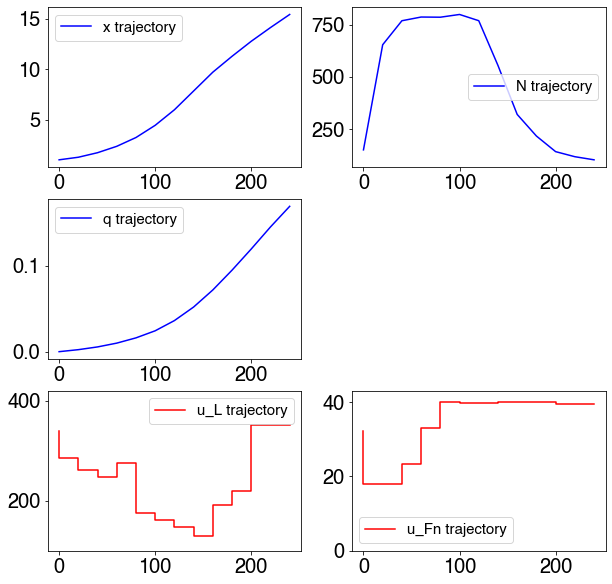

Score: 0.1686831170732341


In [26]:
# Run 1 episode
episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   g1_threshold = -3,
                                   g2_threshold = -0.001)
plot_episode(episode)

In [35]:
# # Save neural network
# torch.save(Q_net, './NN_models/CS1_Q_net_g1g2_2000_ep')
# # Save neural network
# torch.save(g1_net, './NN_models/CS1_g1_net_g1g2_2000_ep')
# # Save neural network
# torch.save(g2_net, './NN_models/CS1_g2_net_g1g2_2000_ep')


# # Load pre-trained neural network
# Q_net = torch.load('./NN_models/CS1_Q_net_g1g2_2000_ep')
# Q_net.eval()
# # Load pre-trained neural network
# g1_net = torch.load('./NN_models/CS1_g1_net_g1g2_2000_ep')
# g1_net.eval()
# # Load pre-trained neural network
# g2_net = torch.load('./NN_models/CS1_g2_net_g1g2_2000_ep')
# g2_net.eval()

## Plot objective score and Q-network loss

No handles with labels found to put in legend.


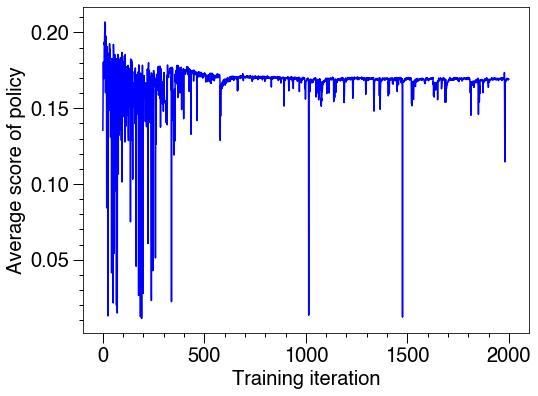

No handles with labels found to put in legend.


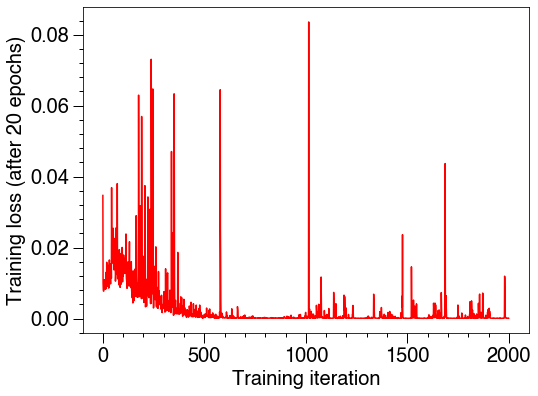

In [18]:
# Save data
# with open('./Data/CS1_score_g1g2_2000_ep', 'wb') as f:
#     pickle.dump(score_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_loss_g1g2_2000_ep', 'wb') as f:
#     pickle.dump(training_loss_list, f, pickle.HIGHEST_PROTOCOL)

# Load pre-run data
# with open('./Data/CS1_score_g1g2_2000_ep', 'rb') as f:
#     score_list = pickle.load(f)
# with open('./Data/CS1_loss_g1g2_2000_ep', 'rb') as f:
#     training_loss_list = pickle.load(f)

# Plot score vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list[:len(score_list)], score_list, color = 'b')
plt.legend(frameon =  0)
plt.ylabel('Average score of policy', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

# Plot training loss vs. training iteration
fig, ax = plt.subplots(figsize=(8,6))
ax.minorticks_on()
ax.xaxis.set_minor_locator(AutoMinorLocator(5))
ax.yaxis.set_minor_locator(AutoMinorLocator(5))
ax.tick_params(which='major', length=10, width=1, direction='out')
ax.tick_params(which='minor', length=4, width=1, direction='out')
plt.plot(iteration_list[:len(score_list)], training_loss_list, color = 'r')
plt.legend(frameon =  0)
plt.ylabel('Training loss (after 20 epochs)', fontsize = 20)
plt.xlabel('Training iteration', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

In [1017]:
# # Generate g1_threshold
# g1_threshold_list = []
# g1_threshold = 500
# g2_threshold_list = []
# g2_threshold = 0.05
# for i in range(2000):
#     g1_threshold_list += [g1_threshold]
#     g1_threshold *= 0.995
#     g2_threshold_list += [g2_threshold]
#     g2_threshold *= 0.995

## Plot MC episodes and explore state space

In [123]:
# # Save data to csv
# plotting_state_data.to_csv(r'./Data/CS1_state_space_g1g2_780_ep.csv', index = False)
# # Load data as pd.DataFrame
# plotting_state_data = pd.read_csv('./Data/CS1_state_space_g1g2_780_ep.csv')

In [24]:
# Generate data using random policy
plotting_state_data = []
for i in range(1000):
    try:
        episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                       g1_threshold = -3,
                                       g2_threshold = -0.001) # Generate 1 episode
    except KeyboardInterrupt:
        episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                       g1_threshold = -3,
                                       g2_threshold = -0.001) # Generate 1 episode
    data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
    for j in data:
        j = j[:-1]
        plotting_state_data += j  # Add datapoints to training set

# plotting_state_data
plotting_state_data = pd.DataFrame(plotting_state_data)

try:
    plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
    plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
    plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint
except:
    plotting_state_data_g1_violated = plotting_state_data[plotting_state_data['1'] - 800 > 0] # Conpath 1
    plotting_state_data_g2_violated = plotting_state_data[plotting_state_data['2'] - 0.011*plotting_state_data['0'] > 0] # Conpath 2
    plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data['3'] == 240.0) & (plotting_state_data['1'] - 150 > 0)] # Terminal constraint
    
print('No. of states visited:',len(plotting_state_data))
print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

try: 
    Cx_all = plotting_state_data[0]
    Cn_all = plotting_state_data[1]
    Cq_all = plotting_state_data[2]
    Cx_g1 = plotting_state_data_g1_violated[0]
    Cn_g1 = plotting_state_data_g1_violated[1]
    Cq_g1 = plotting_state_data_g1_violated[2]
    Cx_g2 = plotting_state_data_g2_violated[0]
    Cn_g2 = plotting_state_data_g2_violated[1]
    Cq_g2 = plotting_state_data_g2_violated[2]
    Cx_g3 = plotting_state_data_g3_violated[0]
    Cn_g3 = plotting_state_data_g3_violated[1]
    Cq_g3 = plotting_state_data_g3_violated[2]
except:
    Cx_all = plotting_state_data['0']
    Cn_all = plotting_state_data['1']
    Cq_all = plotting_state_data['2']
    Cx_g1 = plotting_state_data_g1_violated['0']
    Cn_g1 = plotting_state_data_g1_violated['1']
    Cq_g1 = plotting_state_data_g1_violated['2']
    Cx_g2 = plotting_state_data_g2_violated['0']
    Cn_g2 = plotting_state_data_g2_violated['1']
    Cq_g2 = plotting_state_data_g2_violated['2']
    Cx_g3 = plotting_state_data_g3_violated['0']
    Cn_g3 = plotting_state_data_g3_violated['1']
    Cq_g3 = plotting_state_data_g3_violated['2']

@interact(ns=(-90,90,0.1),ew=(-90,90,0.1))
def interact_poly(ns,ew):
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=30)
    plt.ylabel('$C_n$', labelpad=50)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    plt.xlim(0,16)
    plt.ylim(0,2200)
    ax.set_zlim(0, 0.25)
    ax.view_init(ns,ew)
    plt.show()

No. of states visited: 1300
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


interactive(children=(FloatSlider(value=0.0, description='ns', max=90.0, min=-90.0), FloatSlider(value=0.0, de…

## Plot evolution of state space into gif

In [74]:
init_g1_threshold = 500
init_g2_threshold = 0.05
g1_threshold_list = [500]
g2_threshold_list = [0.05]
for i in range(2000):
    init_g1_threshold *= 0.995
    init_g2_threshold *= 0.995
    g1_threshold_list += [init_g1_threshold]
    g2_threshold_list += [init_g2_threshold]
g1_threshold_list

[500,
 497.5,
 495.0125,
 492.5374375,
 490.0747503125,
 487.6243765609375,
 485.1862546781328,
 482.7603234047421,
 480.3465217877184,
 477.94478917877984,
 475.55506523288597,
 473.1772899067215,
 470.8114034571879,
 468.457346439902,
 466.11505970770247,
 463.78448440916395,
 461.4655619871181,
 459.1582341771825,
 456.8624430062966,
 454.5781307912651,
 452.3052401373088,
 450.0437139366222,
 447.7934953669391,
 445.5545278901044,
 443.3267552506539,
 441.1101214744006,
 438.9045708670286,
 436.71004801269345,
 434.52649777262997,
 432.3538652837668,
 430.192095957348,
 428.0411354775612,
 425.9009298001734,
 423.77142515117254,
 421.65256802541666,
 419.54430518528955,
 417.4465836593631,
 415.3593507410663,
 413.282553987361,
 411.2161412174242,
 409.16006051133706,
 407.11426020878037,
 405.0786889077365,
 403.0532954631978,
 401.0380289858818,
 399.03283884095237,
 397.0376746467476,
 395.05248627351386,
 393.0772238421463,
 391.11183772293555,
 389.15627853432085,
 387.2104971

No. of states visited: 130
No. of states where g1 violated: 41
No. of states where g2 violated: 0
No. of states where g3 violated: 0


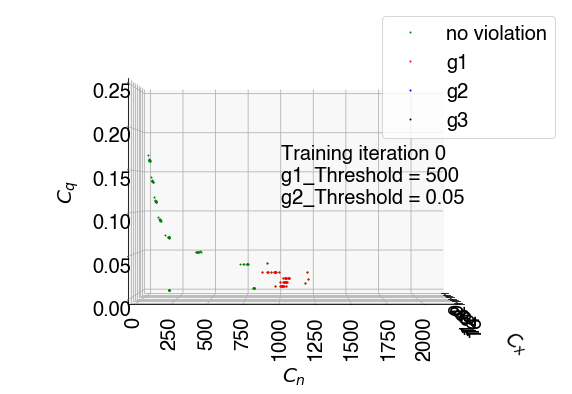

No. of states visited: 130
No. of states where g1 violated: 51
No. of states where g2 violated: 0
No. of states where g3 violated: 0


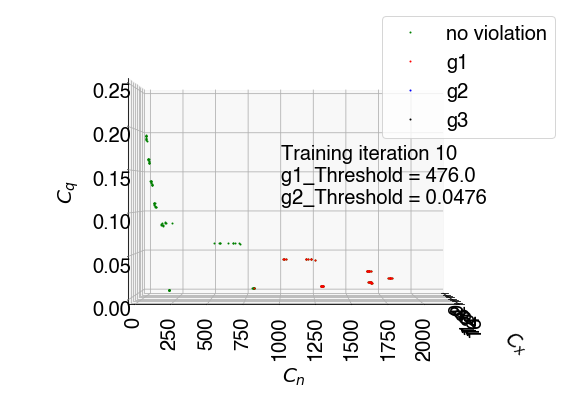

No. of states visited: 130
No. of states where g1 violated: 62
No. of states where g2 violated: 10
No. of states where g3 violated: 0


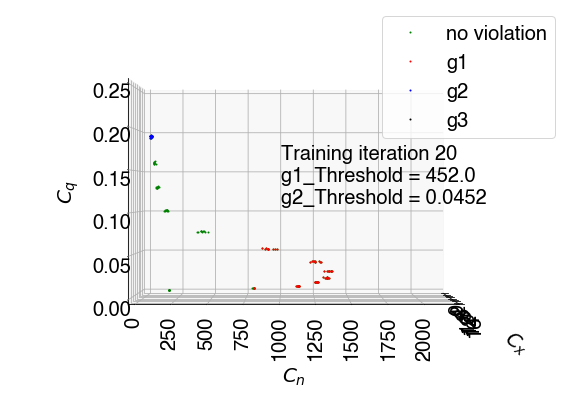

No. of states visited: 130
No. of states where g1 violated: 38
No. of states where g2 violated: 10
No. of states where g3 violated: 0


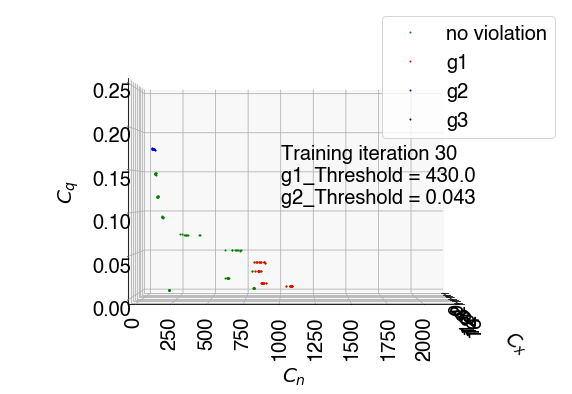

No. of states visited: 130
No. of states where g1 violated: 51
No. of states where g2 violated: 0
No. of states where g3 violated: 0


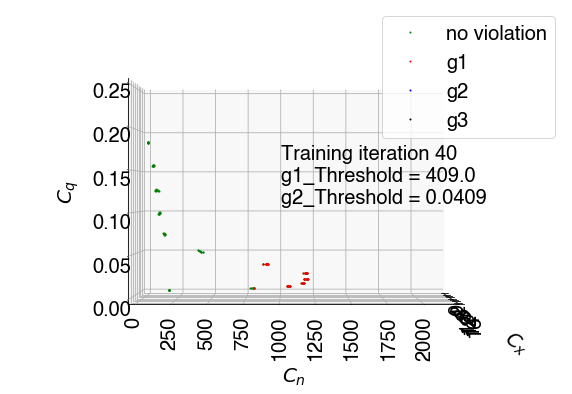

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


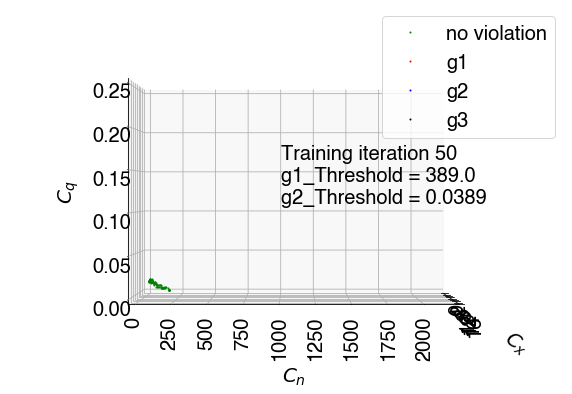

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 0
No. of states where g3 violated: 6


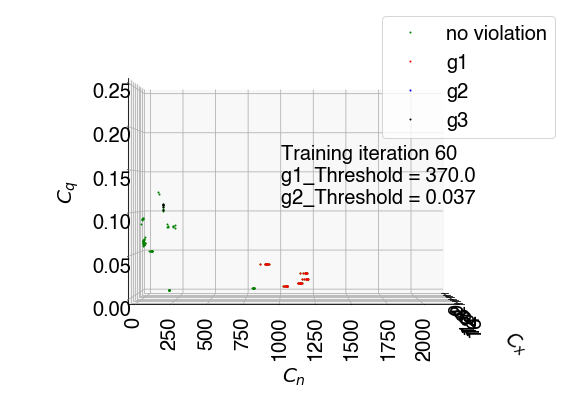

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 54
No. of states where g3 violated: 0


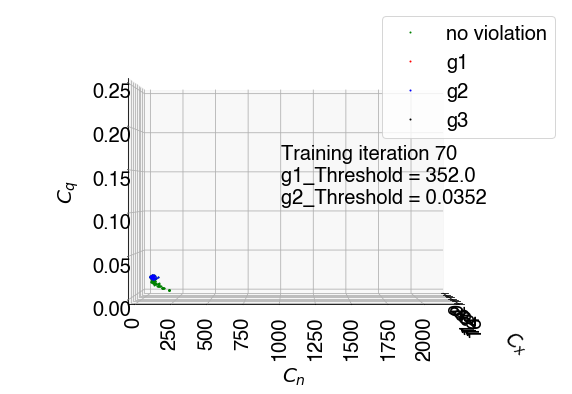

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 0
No. of states where g3 violated: 0


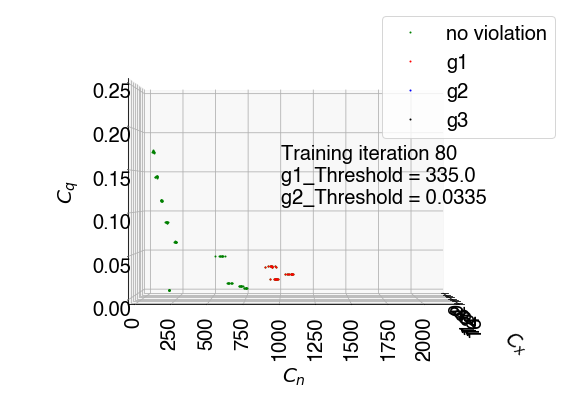

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 0
No. of states where g3 violated: 0


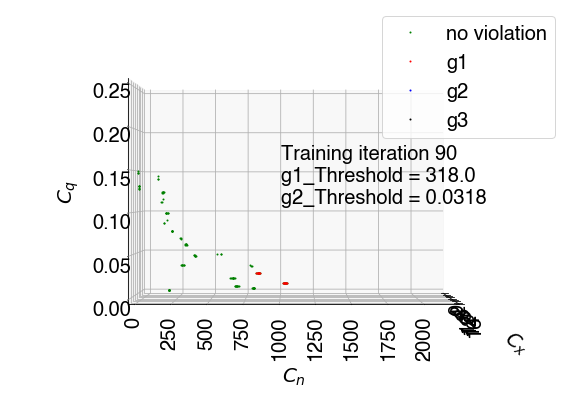

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 0
No. of states where g3 violated: 0


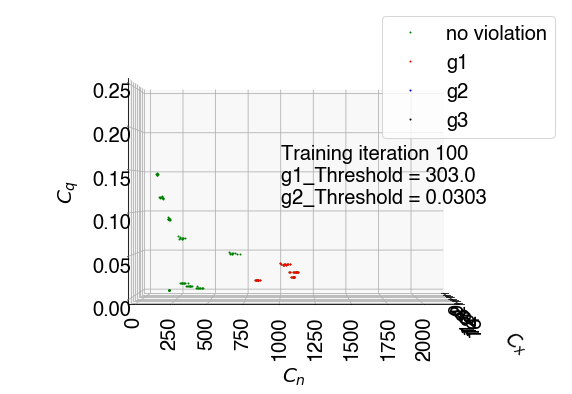

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


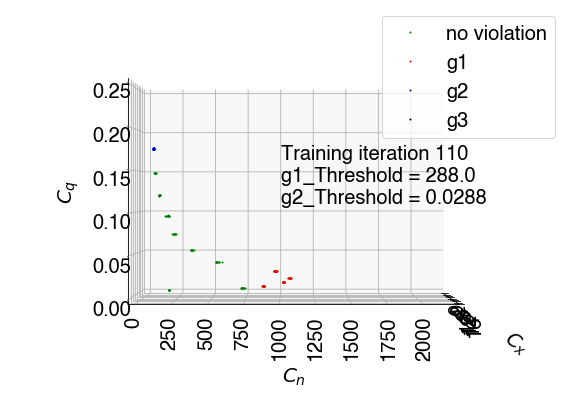

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


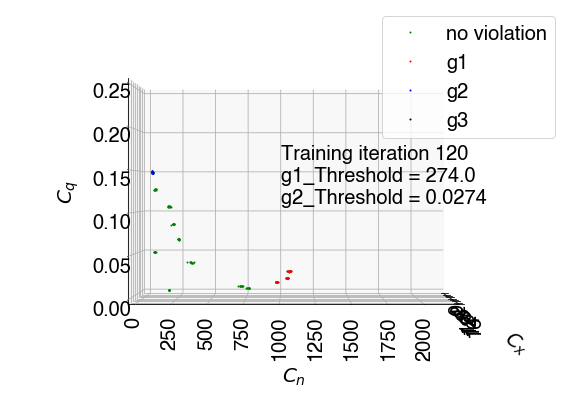

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


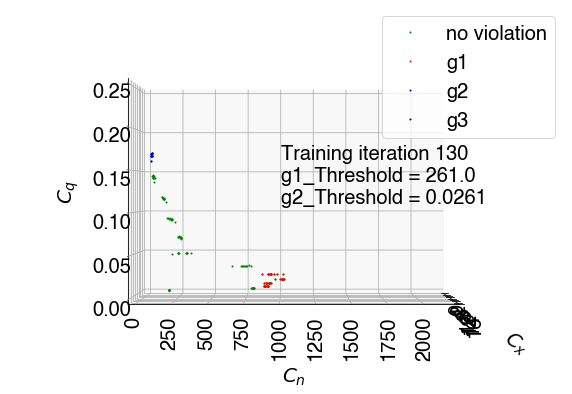

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 10
No. of states where g3 violated: 0


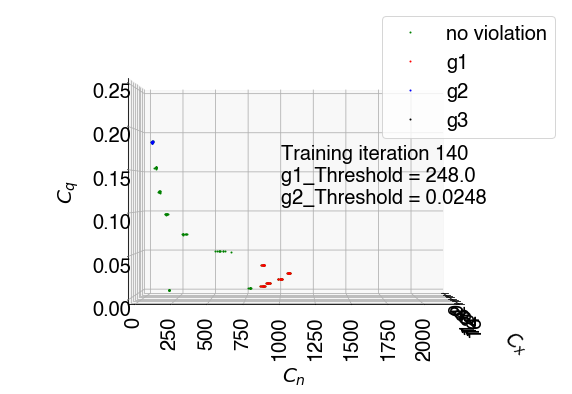

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 3


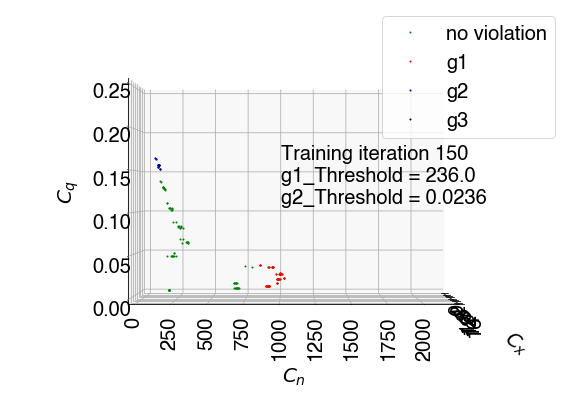

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 0
No. of states where g3 violated: 0


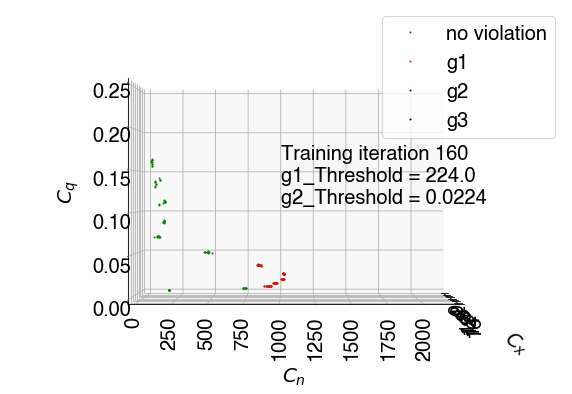

No. of states visited: 130
No. of states where g1 violated: 32
No. of states where g2 violated: 0
No. of states where g3 violated: 0


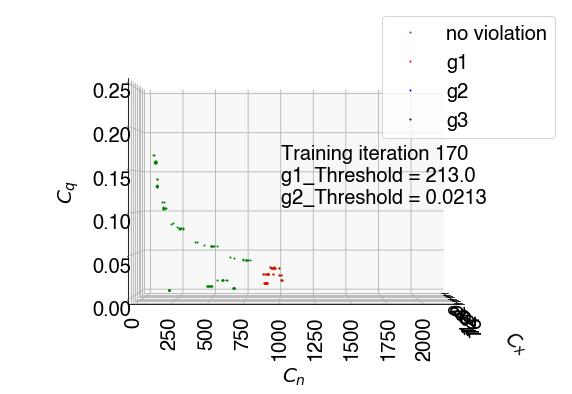

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 0
No. of states where g3 violated: 0


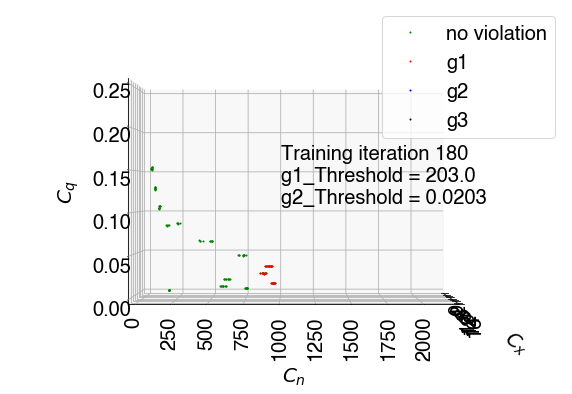

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


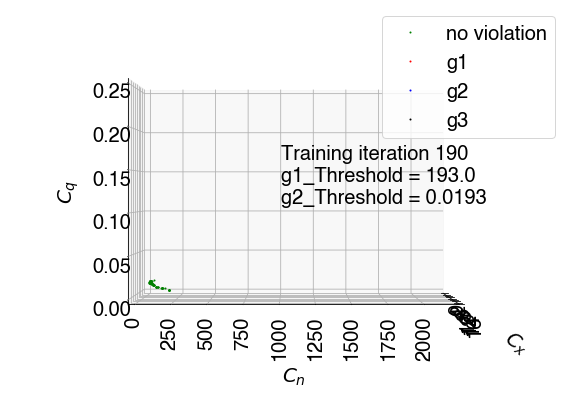

No. of states visited: 130
No. of states where g1 violated: 31
No. of states where g2 violated: 10
No. of states where g3 violated: 0


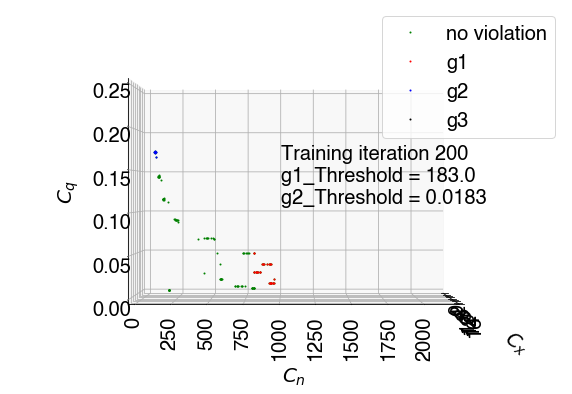

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 0
No. of states where g3 violated: 0


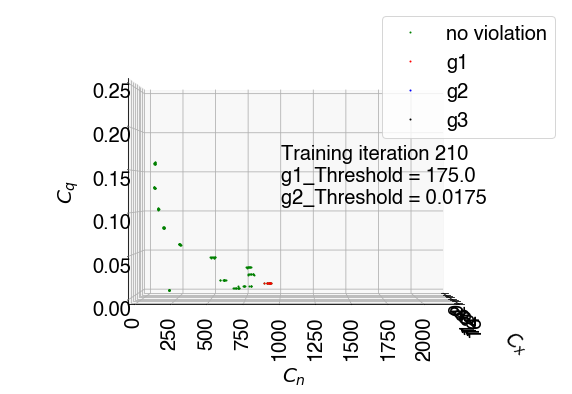

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 0
No. of states where g3 violated: 8


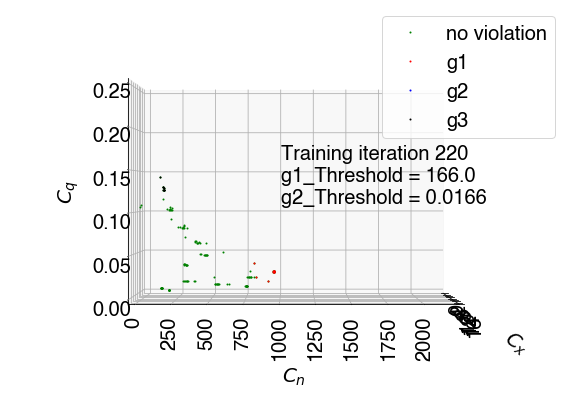

No. of states visited: 104
No. of states where g1 violated: 17
No. of states where g2 violated: 8
No. of states where g3 violated: 0


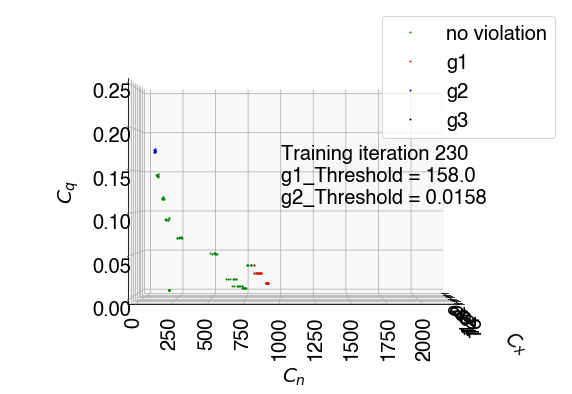

No. of states visited: 130
No. of states where g1 violated: 41
No. of states where g2 violated: 10
No. of states where g3 violated: 0


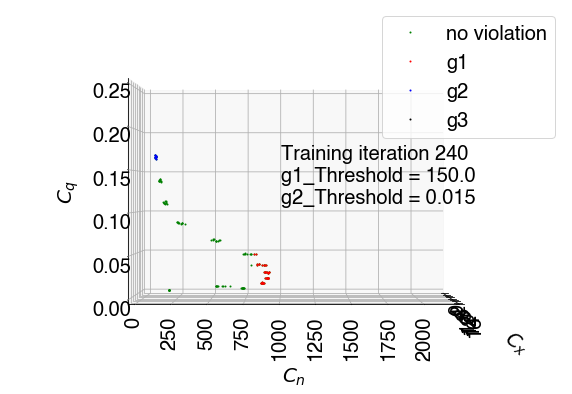

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


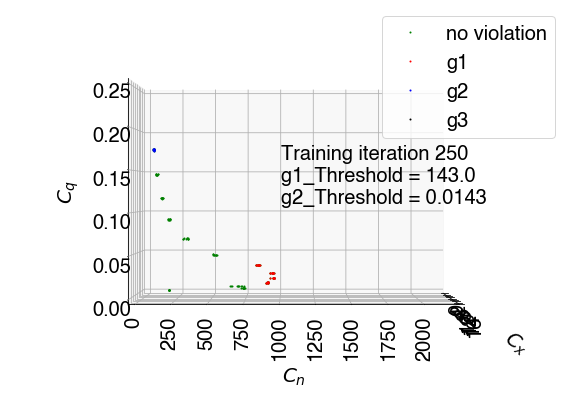

No. of states visited: 130
No. of states where g1 violated: 35
No. of states where g2 violated: 0
No. of states where g3 violated: 0


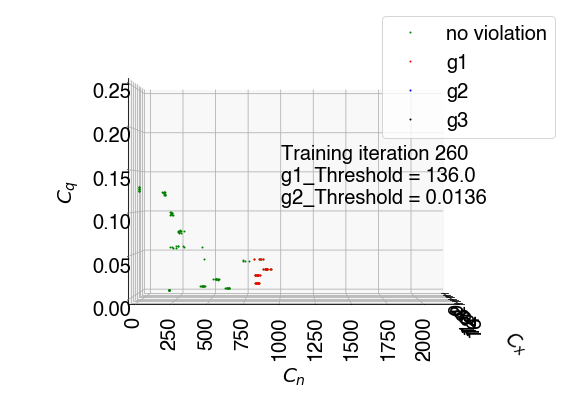

No. of states visited: 130
No. of states where g1 violated: 50
No. of states where g2 violated: 10
No. of states where g3 violated: 0


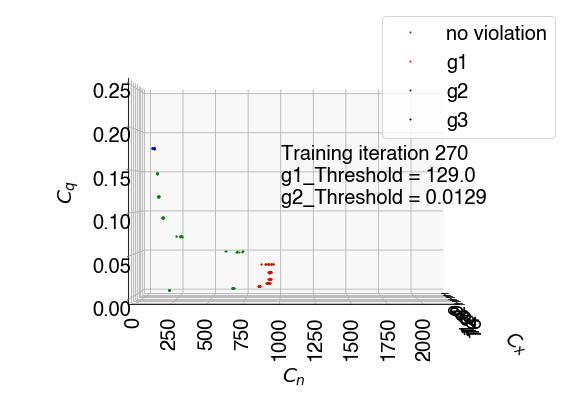

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


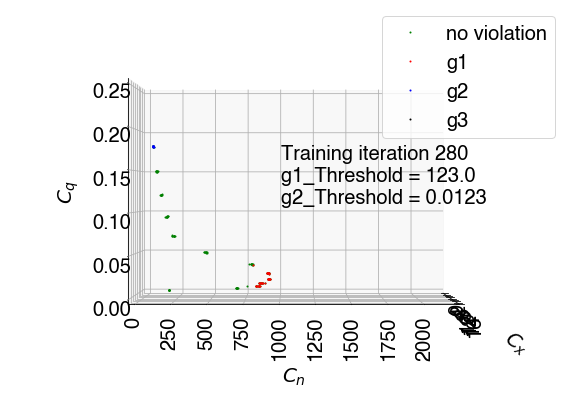

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 0
No. of states where g3 violated: 0


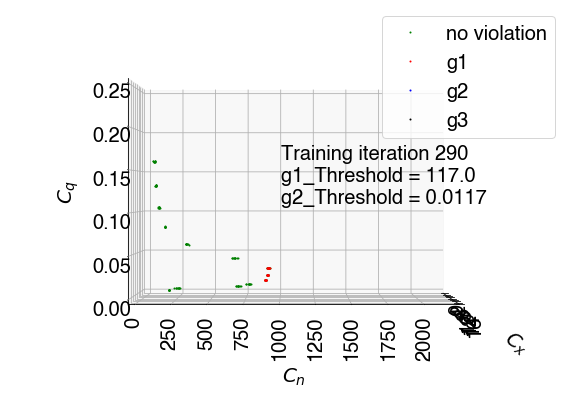

No. of states visited: 117
No. of states where g1 violated: 28
No. of states where g2 violated: 9
No. of states where g3 violated: 0


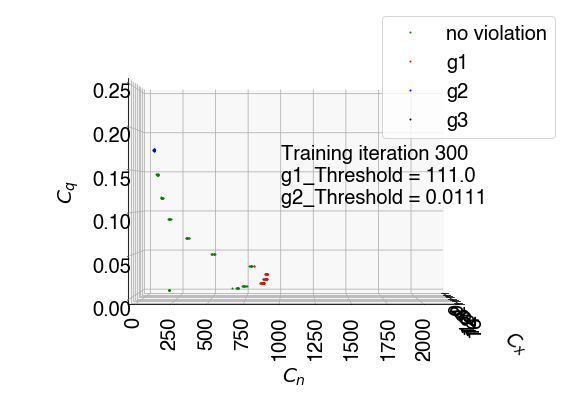

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 0
No. of states where g3 violated: 0


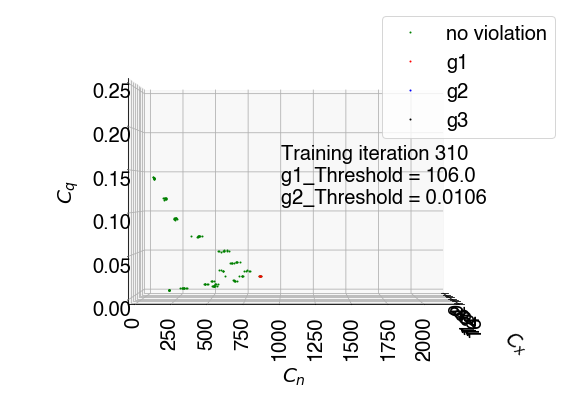

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


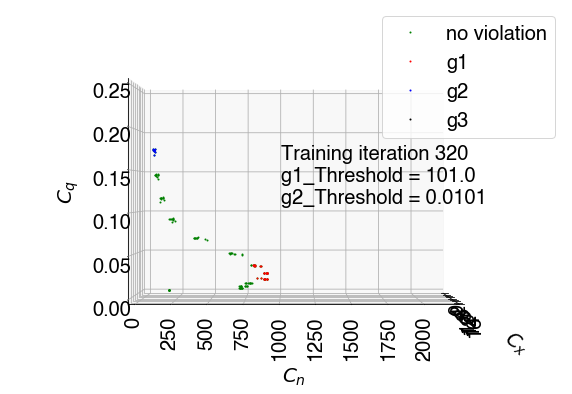

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


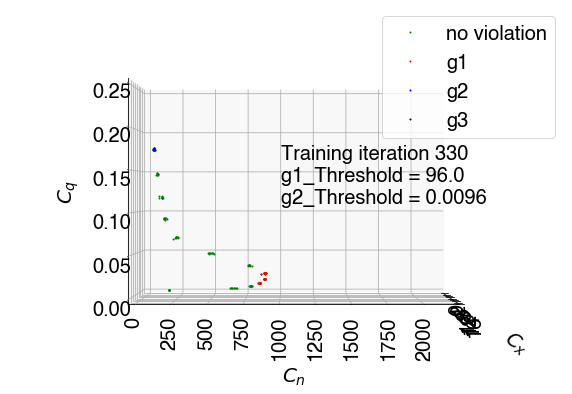

No. of states visited: 130
No. of states where g1 violated: 33
No. of states where g2 violated: 10
No. of states where g3 violated: 0


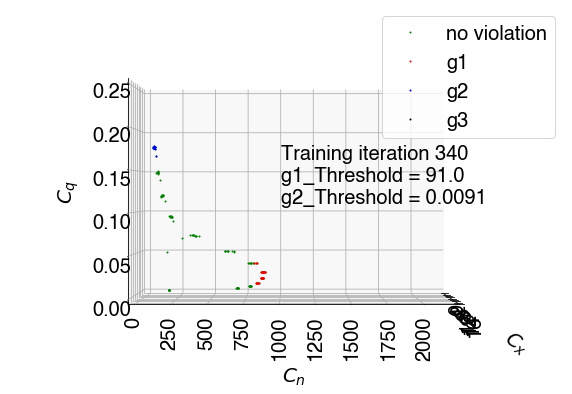

No. of states visited: 130
No. of states where g1 violated: 34
No. of states where g2 violated: 0
No. of states where g3 violated: 0


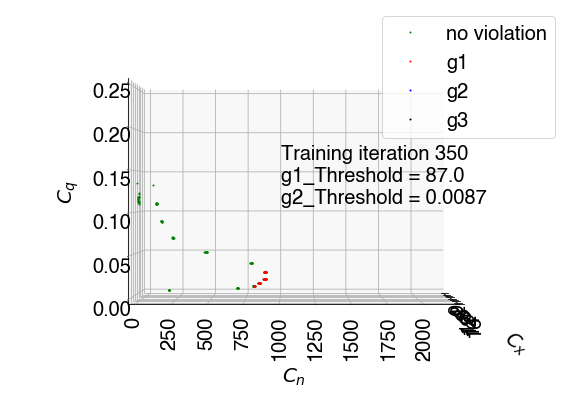

No. of states visited: 130
No. of states where g1 violated: 40
No. of states where g2 violated: 10
No. of states where g3 violated: 0


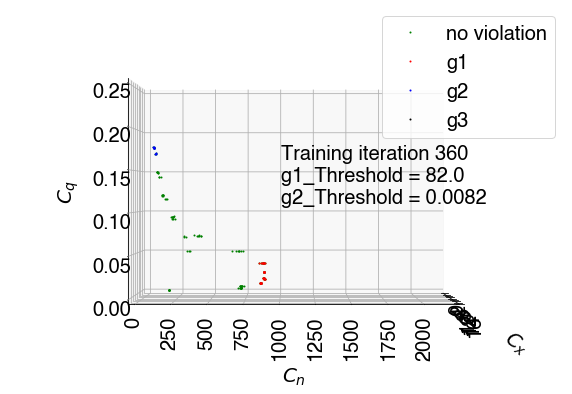

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


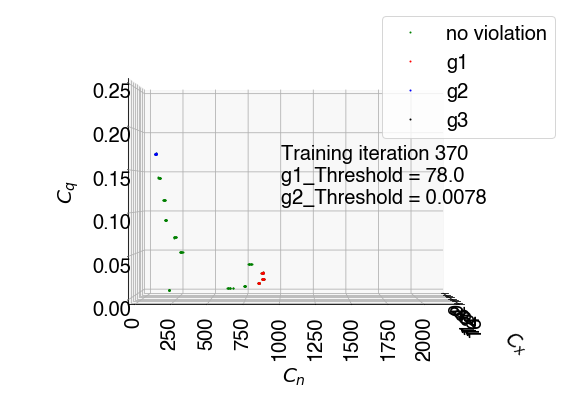

No. of states visited: 130
No. of states where g1 violated: 31
No. of states where g2 violated: 9
No. of states where g3 violated: 0


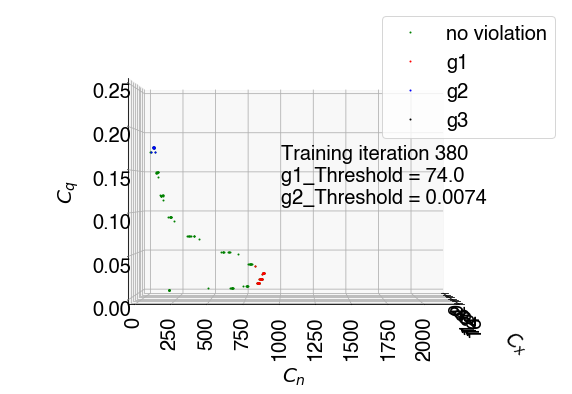

No. of states visited: 117
No. of states where g1 violated: 34
No. of states where g2 violated: 9
No. of states where g3 violated: 0


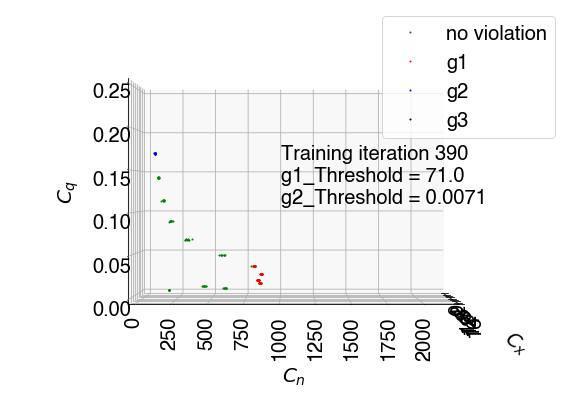

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


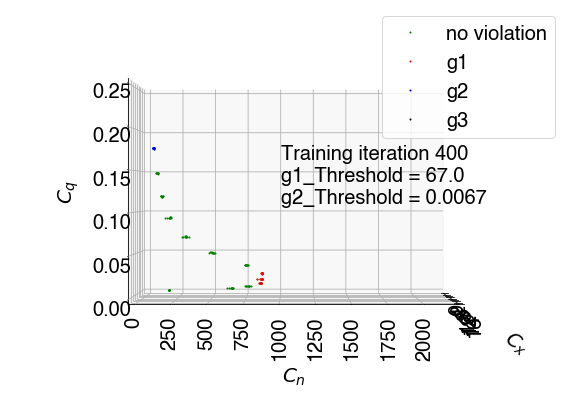

No. of states visited: 117
No. of states where g1 violated: 27
No. of states where g2 violated: 9
No. of states where g3 violated: 0


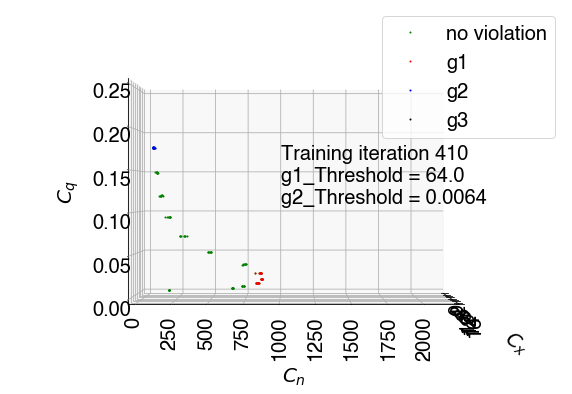

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


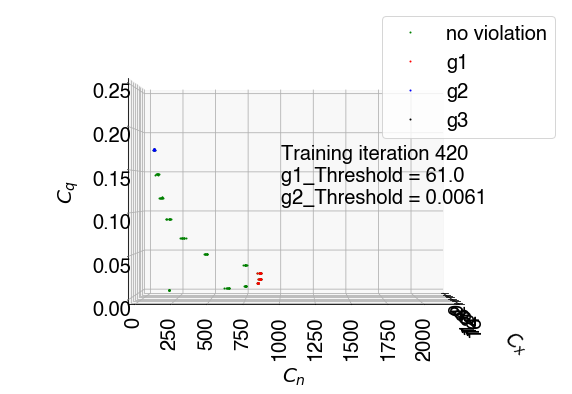

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


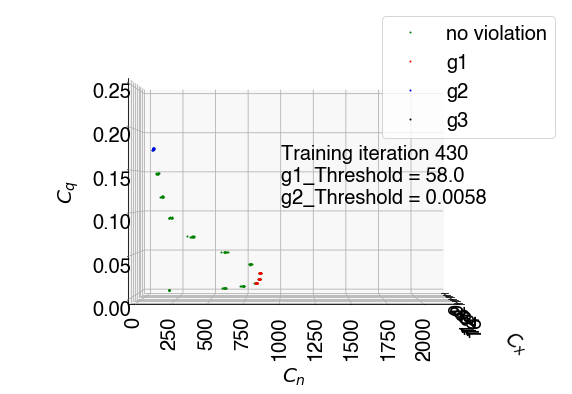

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


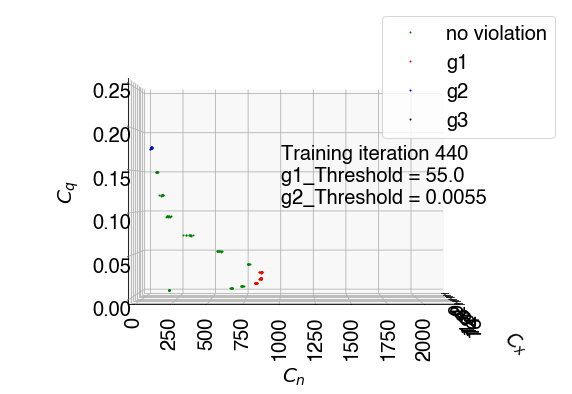

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


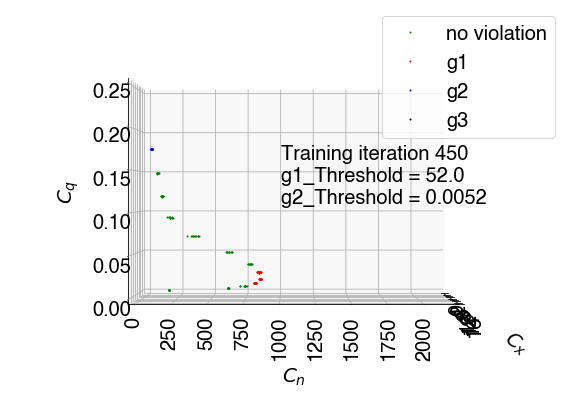

No. of states visited: 130
No. of states where g1 violated: 30
No. of states where g2 violated: 10
No. of states where g3 violated: 0


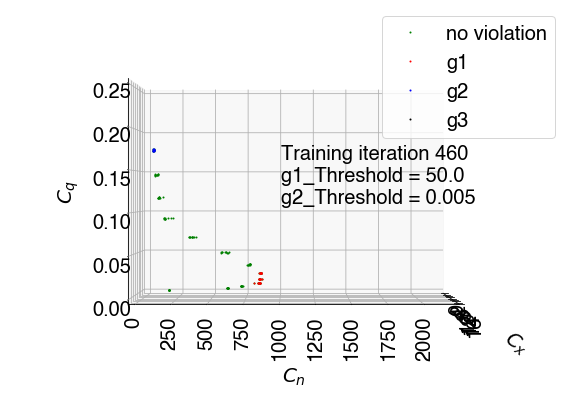

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


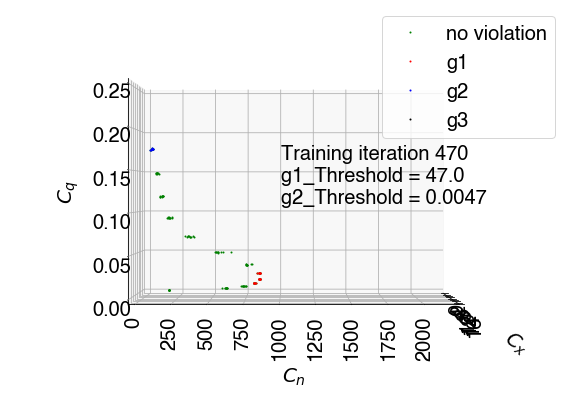

No. of states visited: 130
No. of states where g1 violated: 34
No. of states where g2 violated: 10
No. of states where g3 violated: 0


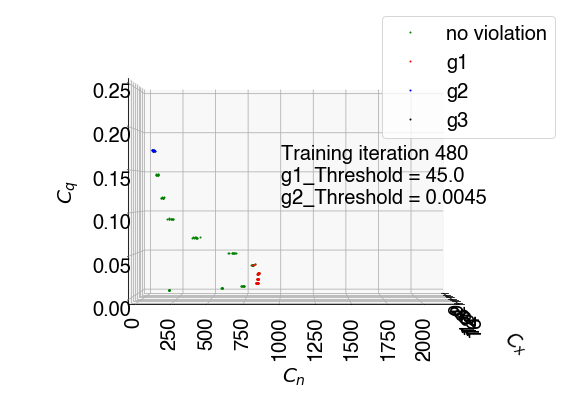

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 10
No. of states where g3 violated: 0


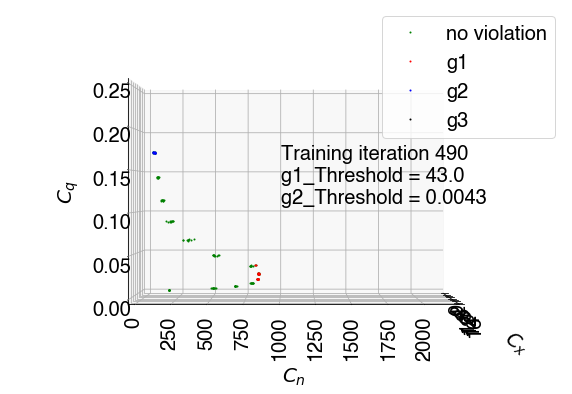

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


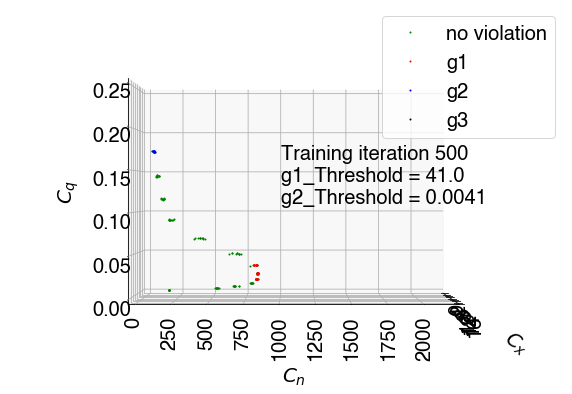

No. of states visited: 130
No. of states where g1 violated: 24
No. of states where g2 violated: 10
No. of states where g3 violated: 0


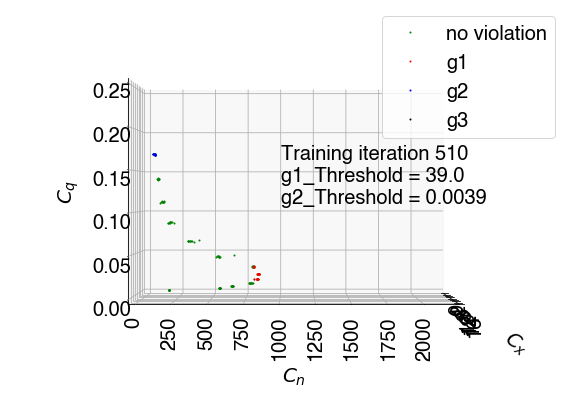

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 10
No. of states where g3 violated: 0


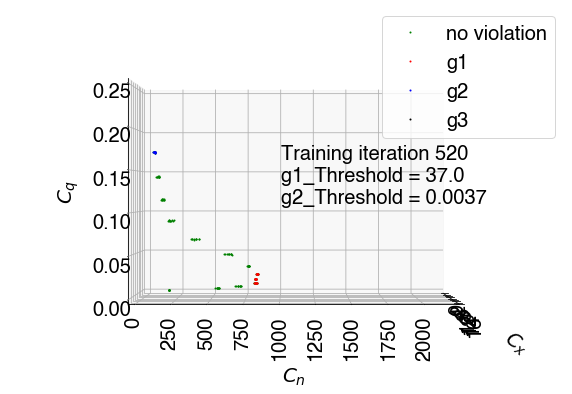

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


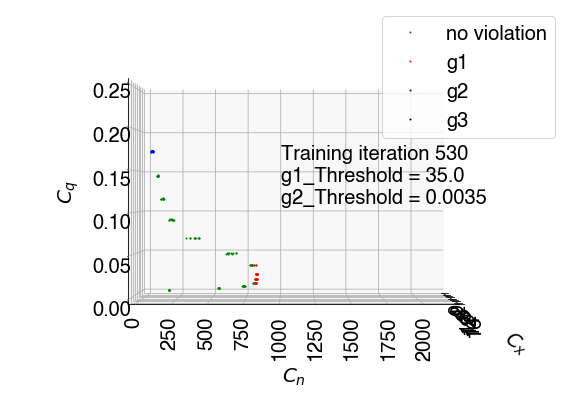

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


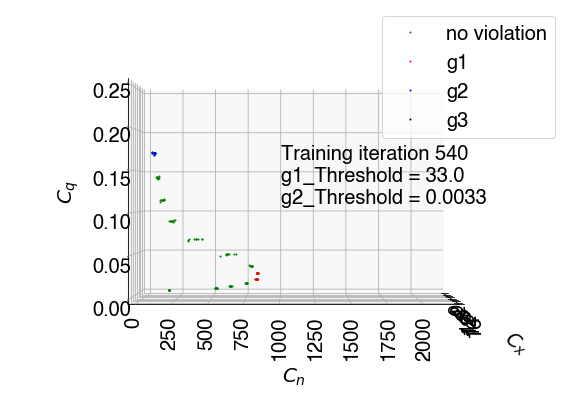

No. of states visited: 130
No. of states where g1 violated: 28
No. of states where g2 violated: 10
No. of states where g3 violated: 0


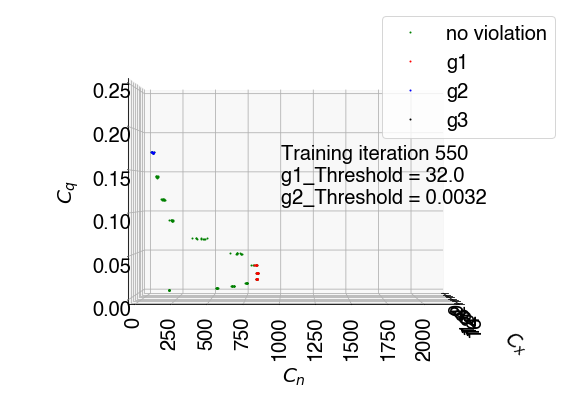

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 10
No. of states where g3 violated: 0


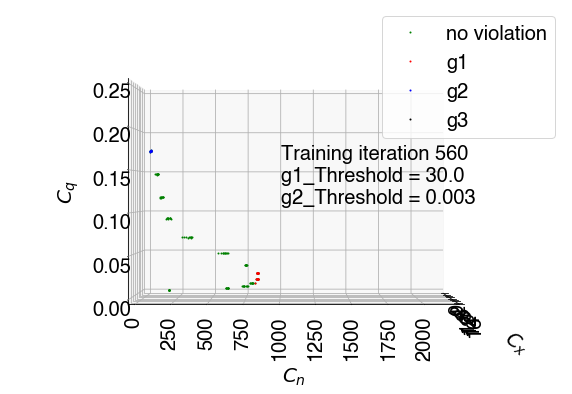

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 10
No. of states where g3 violated: 0


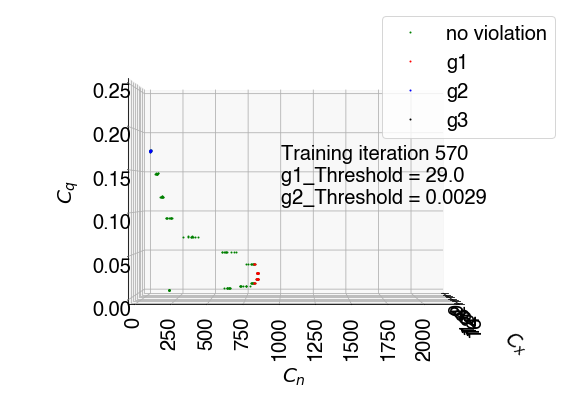

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 0
No. of states where g3 violated: 0


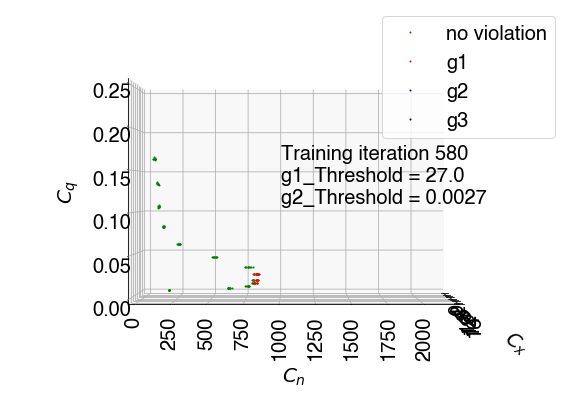

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 0
No. of states where g3 violated: 0


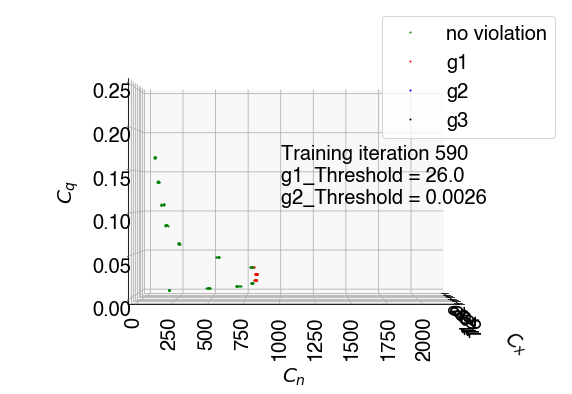

No. of states visited: 130
No. of states where g1 violated: 18
No. of states where g2 violated: 0
No. of states where g3 violated: 0


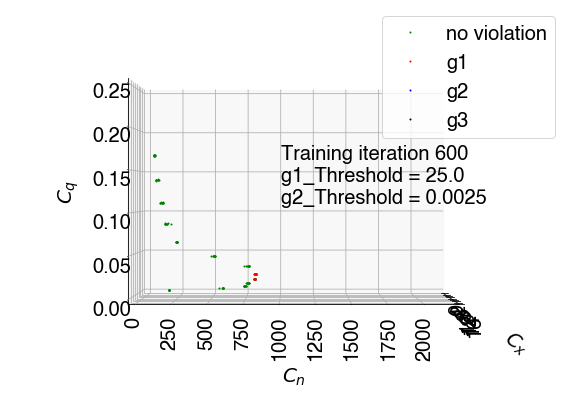

No. of states visited: 130
No. of states where g1 violated: 24
No. of states where g2 violated: 6
No. of states where g3 violated: 0


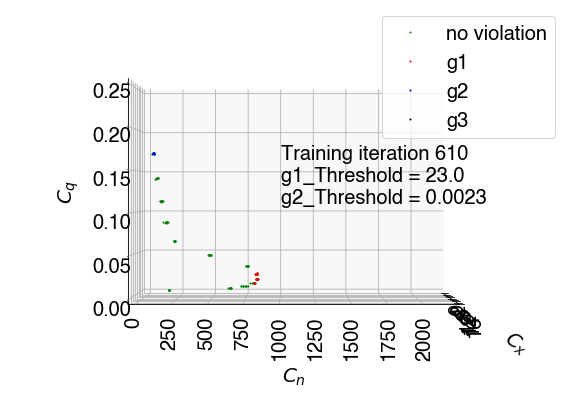

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 5
No. of states where g3 violated: 0


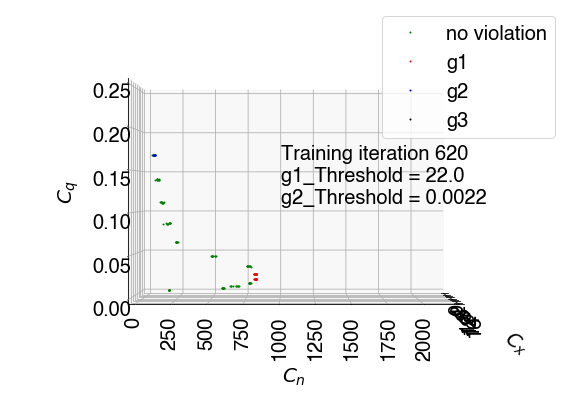

No. of states visited: 130
No. of states where g1 violated: 23
No. of states where g2 violated: 9
No. of states where g3 violated: 0


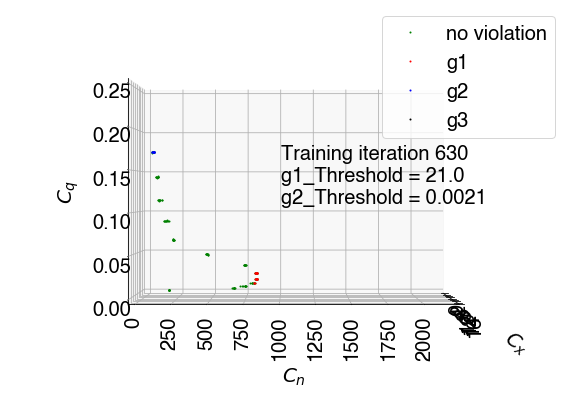

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


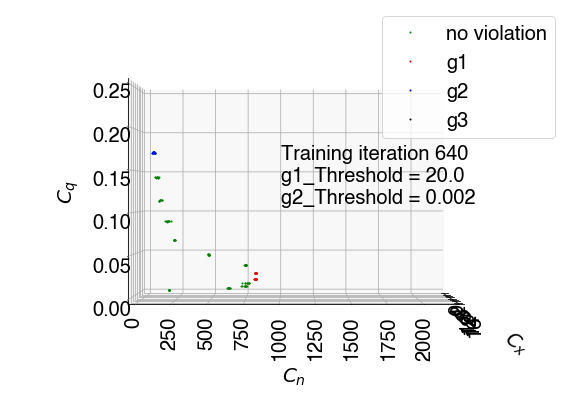

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 10
No. of states where g3 violated: 0


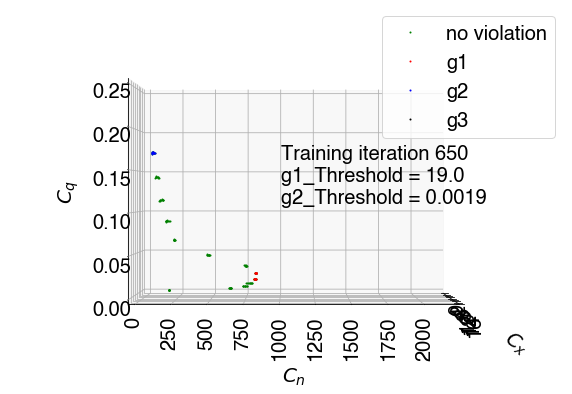

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 10
No. of states where g3 violated: 0


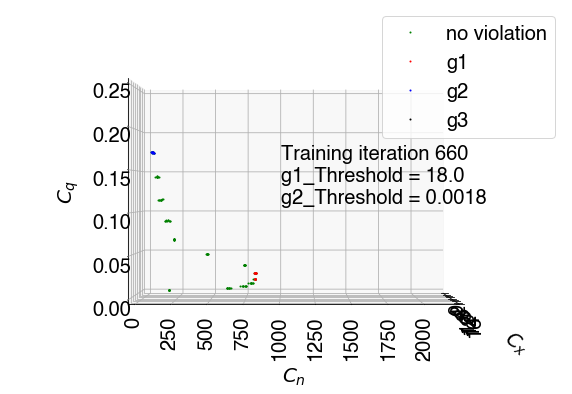

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 10
No. of states where g3 violated: 0


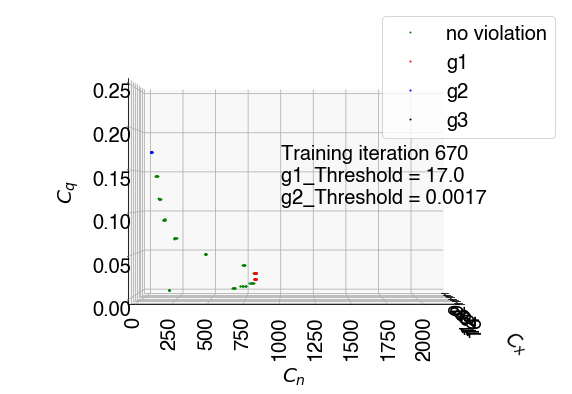

No. of states visited: 117
No. of states where g1 violated: 18
No. of states where g2 violated: 9
No. of states where g3 violated: 0


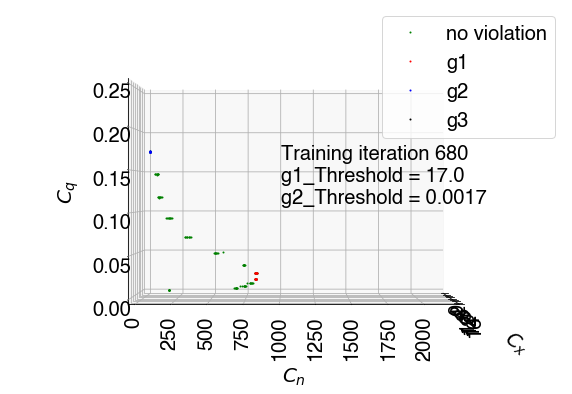

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


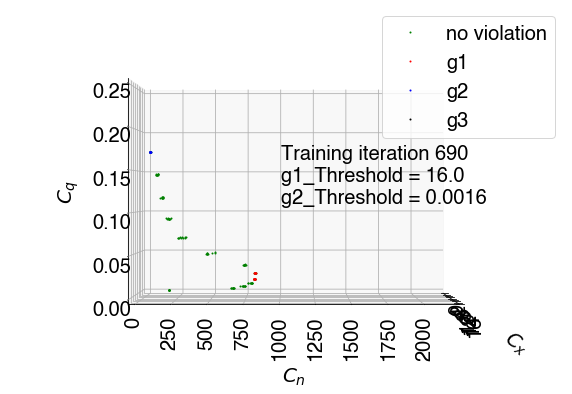

No. of states visited: 117
No. of states where g1 violated: 14
No. of states where g2 violated: 6
No. of states where g3 violated: 0


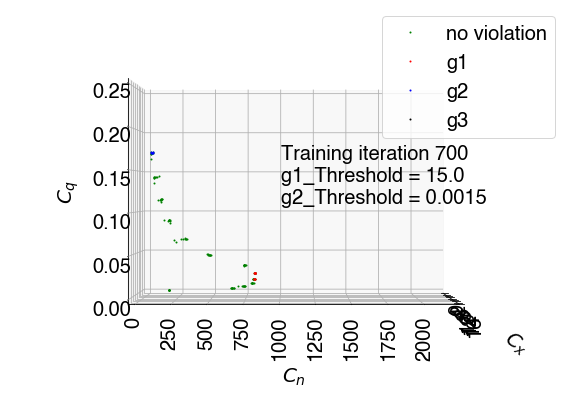

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 10
No. of states where g3 violated: 0


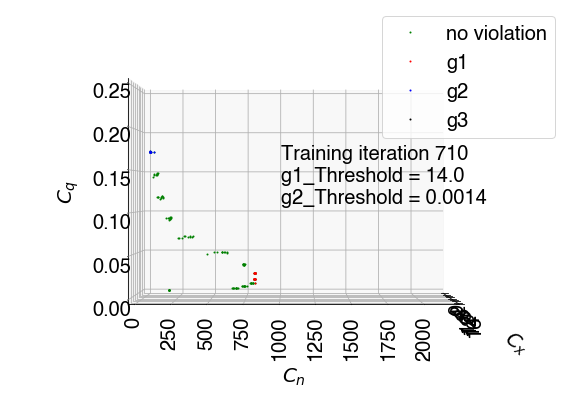

No. of states visited: 117
No. of states where g1 violated: 17
No. of states where g2 violated: 7
No. of states where g3 violated: 0


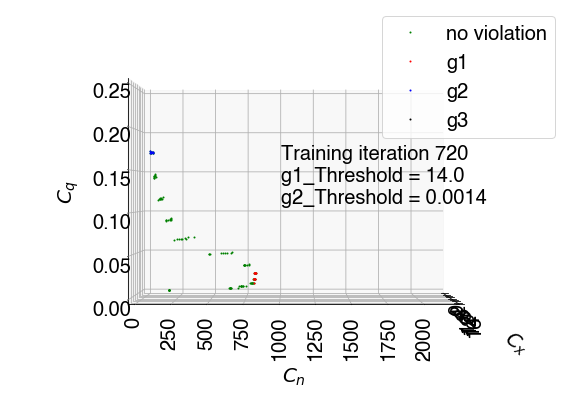

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 9
No. of states where g3 violated: 0


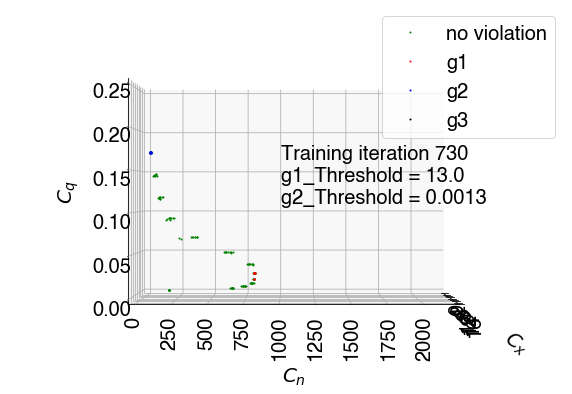

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 10
No. of states where g3 violated: 0


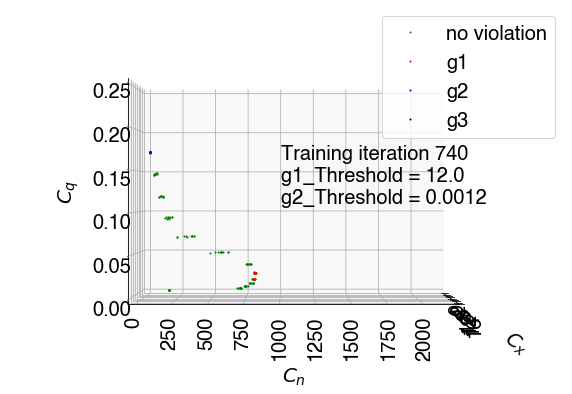

No. of states visited: 130
No. of states where g1 violated: 16
No. of states where g2 violated: 10
No. of states where g3 violated: 0


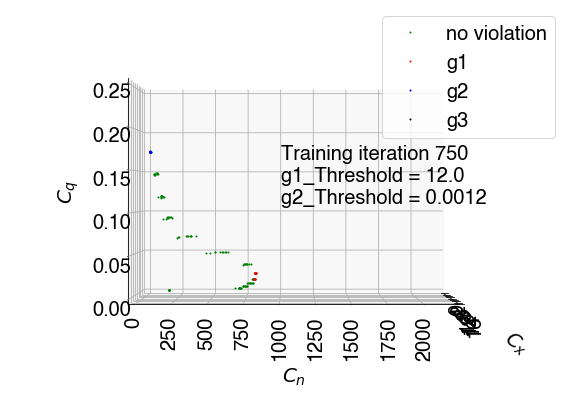

No. of states visited: 130
No. of states where g1 violated: 16
No. of states where g2 violated: 10
No. of states where g3 violated: 0


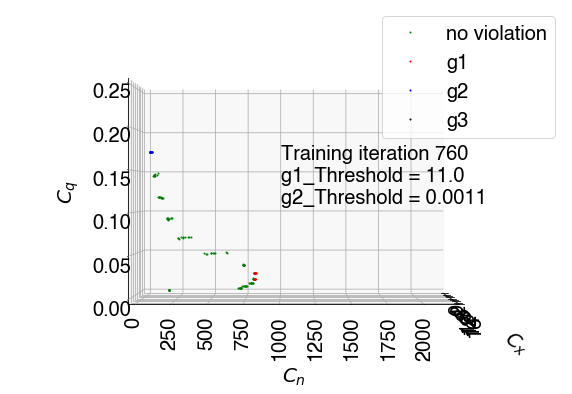

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 10
No. of states where g3 violated: 0


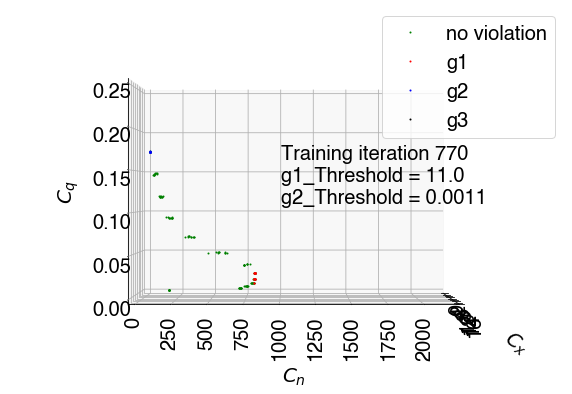

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 10
No. of states where g3 violated: 0


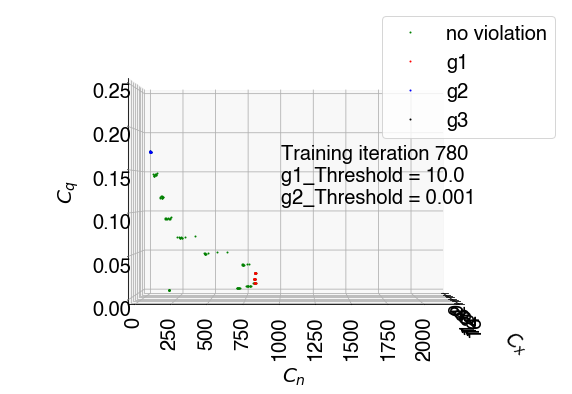

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 10
No. of states where g3 violated: 0


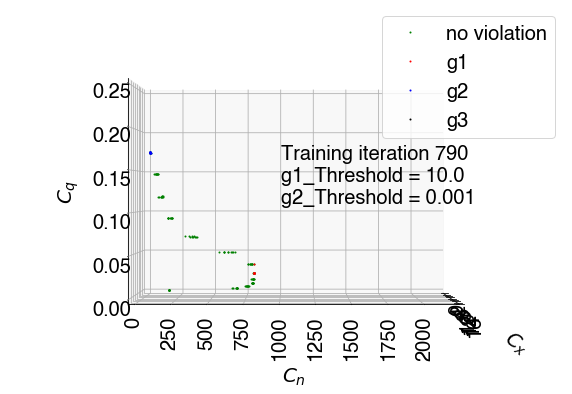

No. of states visited: 130
No. of states where g1 violated: 14
No. of states where g2 violated: 10
No. of states where g3 violated: 0


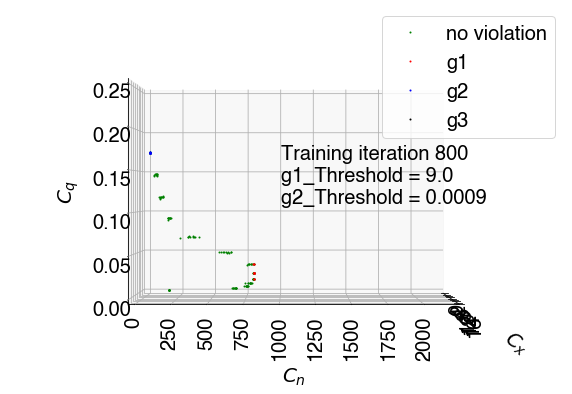

No. of states visited: 130
No. of states where g1 violated: 14
No. of states where g2 violated: 6
No. of states where g3 violated: 0


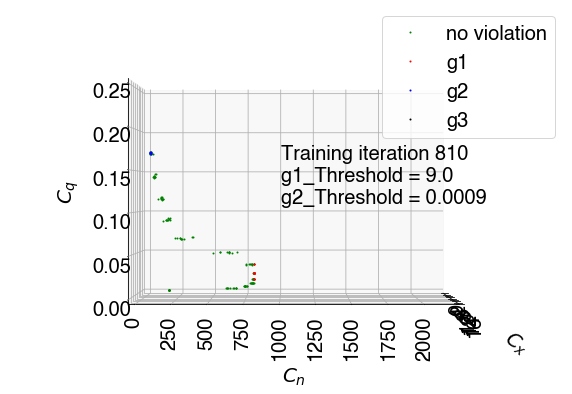

No. of states visited: 117
No. of states where g1 violated: 8
No. of states where g2 violated: 6
No. of states where g3 violated: 0


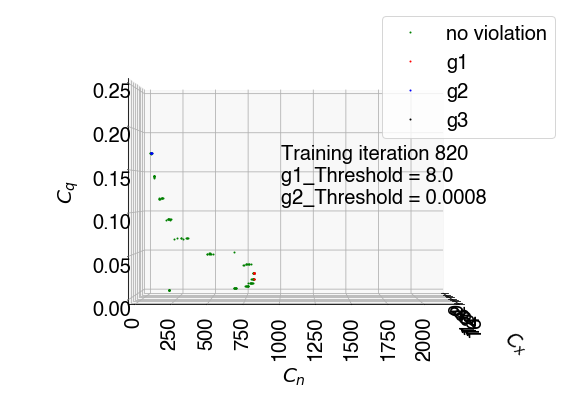

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 8
No. of states where g3 violated: 0


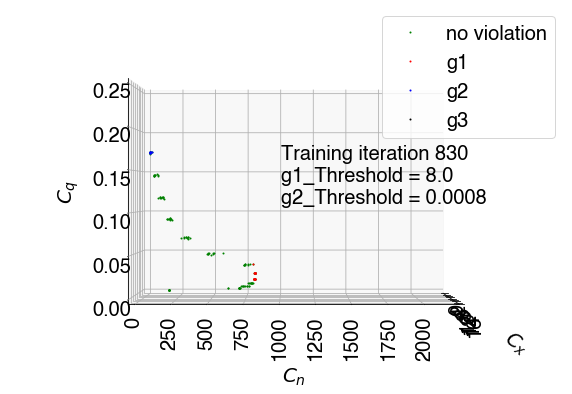

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 9
No. of states where g3 violated: 0


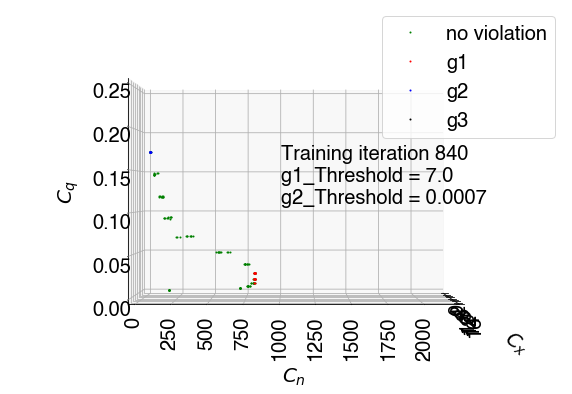

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 6
No. of states where g3 violated: 0


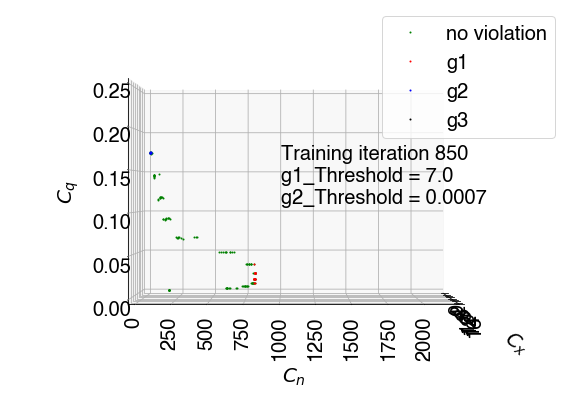

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 9
No. of states where g3 violated: 0


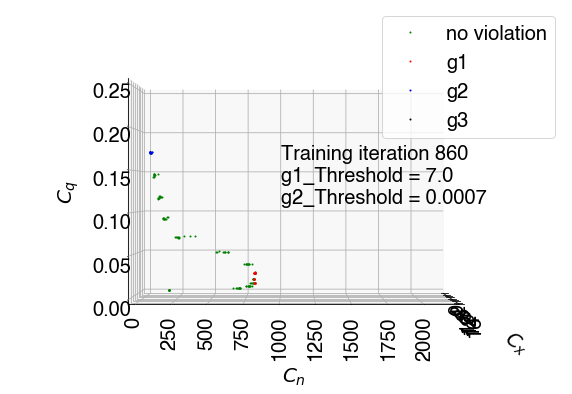

No. of states visited: 130
No. of states where g1 violated: 17
No. of states where g2 violated: 10
No. of states where g3 violated: 0


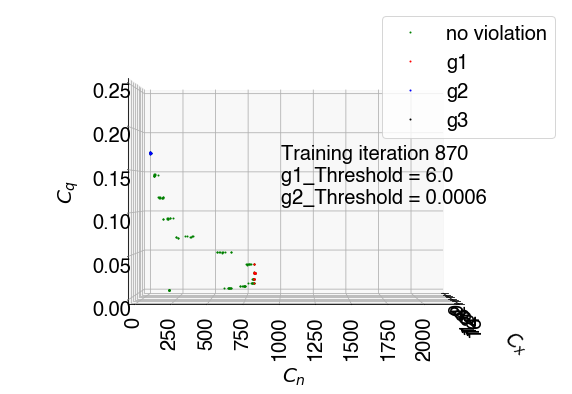

No. of states visited: 130
No. of states where g1 violated: 8
No. of states where g2 violated: 4
No. of states where g3 violated: 0


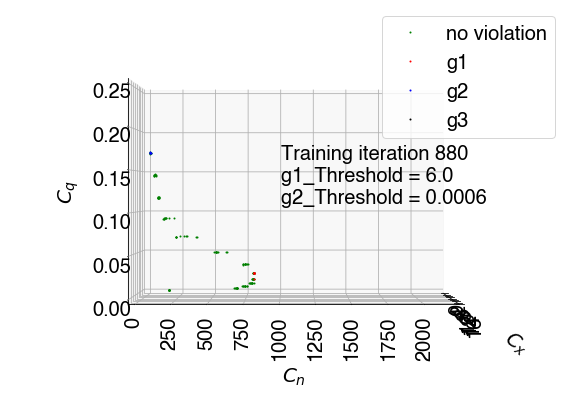

No. of states visited: 130
No. of states where g1 violated: 8
No. of states where g2 violated: 10
No. of states where g3 violated: 0


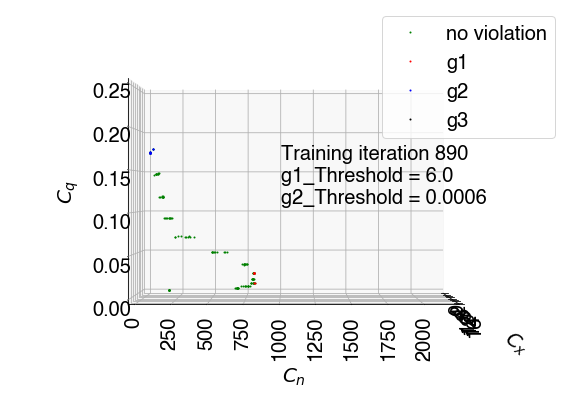

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 10
No. of states where g3 violated: 0


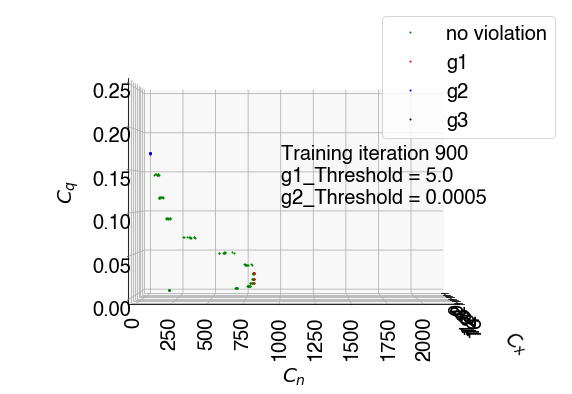

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 8
No. of states where g3 violated: 0


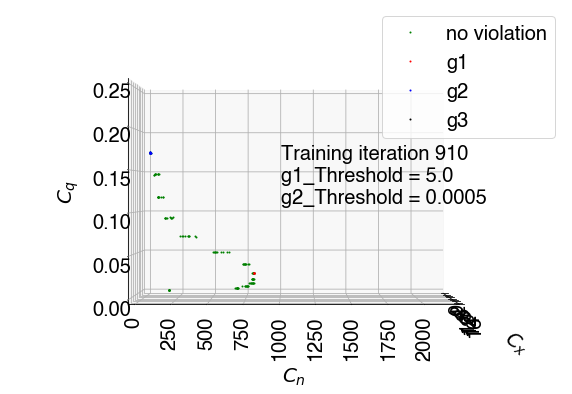

No. of states visited: 130
No. of states where g1 violated: 16
No. of states where g2 violated: 9
No. of states where g3 violated: 0


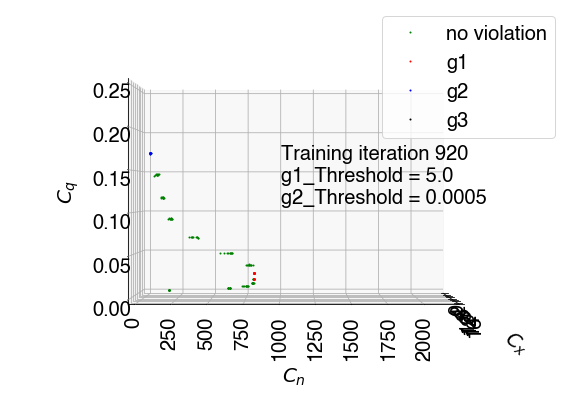

No. of states visited: 130
No. of states where g1 violated: 7
No. of states where g2 violated: 8
No. of states where g3 violated: 0


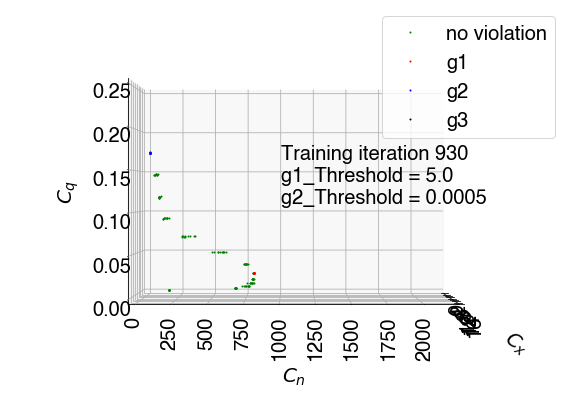

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 9
No. of states where g3 violated: 0


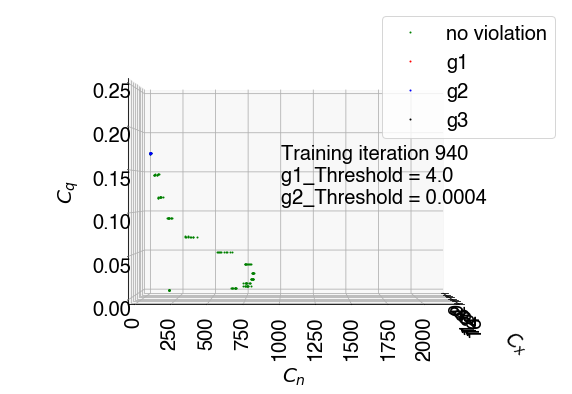

No. of states visited: 130
No. of states where g1 violated: 3
No. of states where g2 violated: 9
No. of states where g3 violated: 0


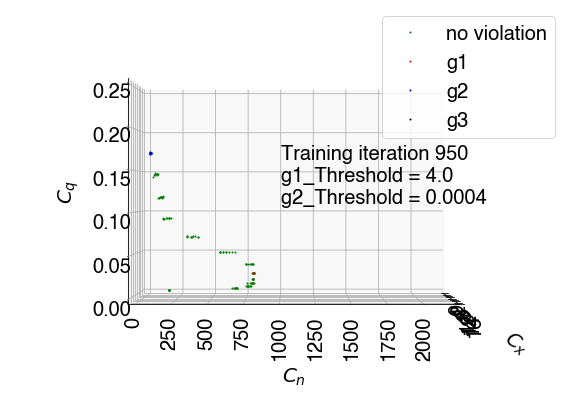

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 9
No. of states where g3 violated: 0


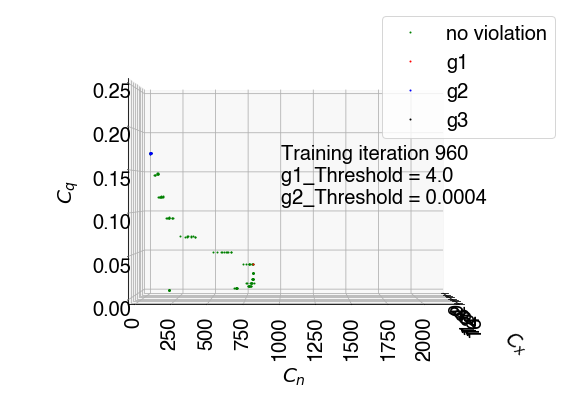

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 7
No. of states where g3 violated: 0


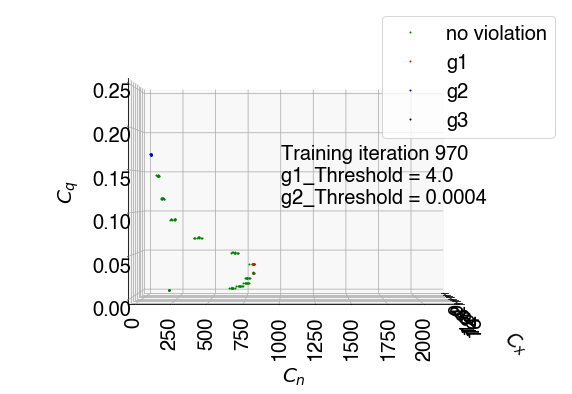

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 9
No. of states where g3 violated: 0


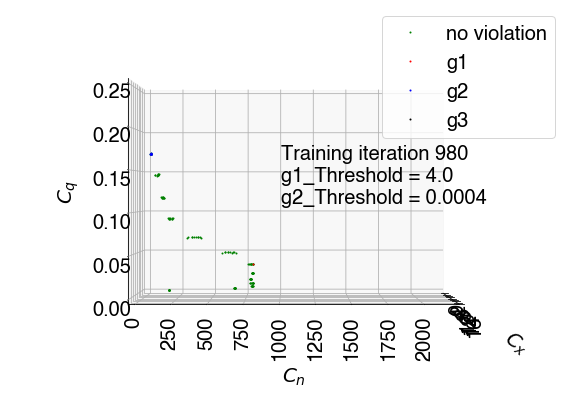

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 7
No. of states where g3 violated: 0


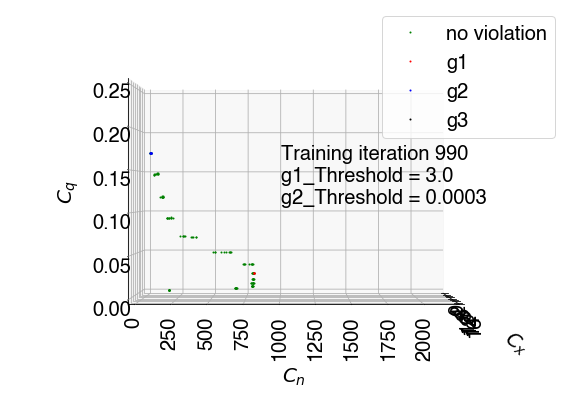

No. of states visited: 130
No. of states where g1 violated: 11
No. of states where g2 violated: 8
No. of states where g3 violated: 0


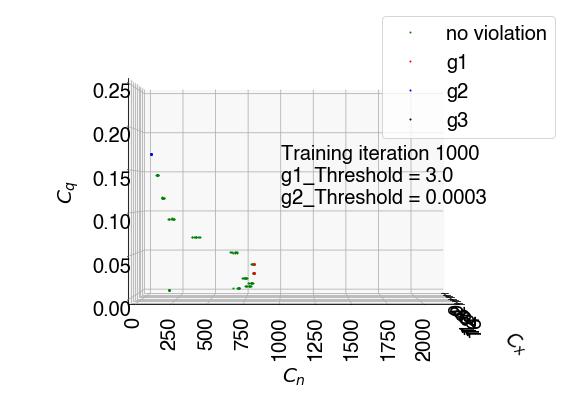

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 8
No. of states where g3 violated: 0


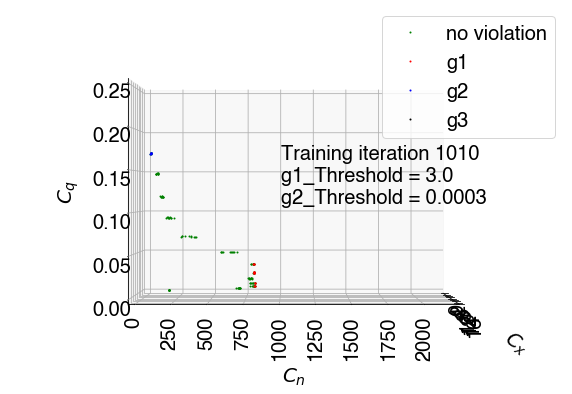

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 3
No. of states where g3 violated: 0


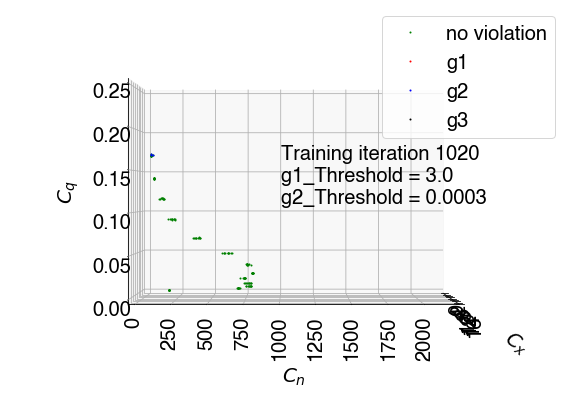

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 0
No. of states where g3 violated: 0


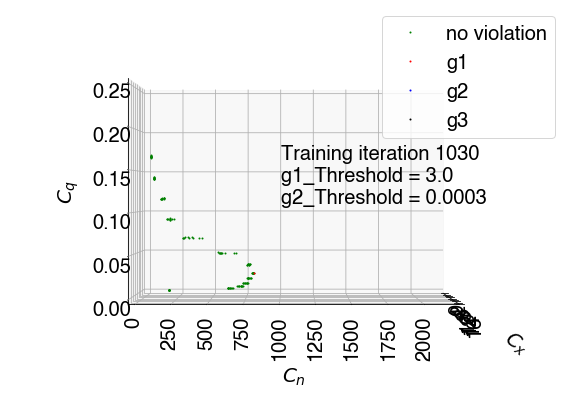

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 8
No. of states where g3 violated: 0


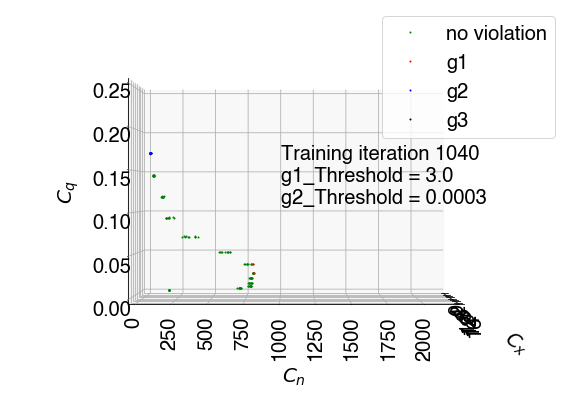

No. of states visited: 130
No. of states where g1 violated: 14
No. of states where g2 violated: 0
No. of states where g3 violated: 0


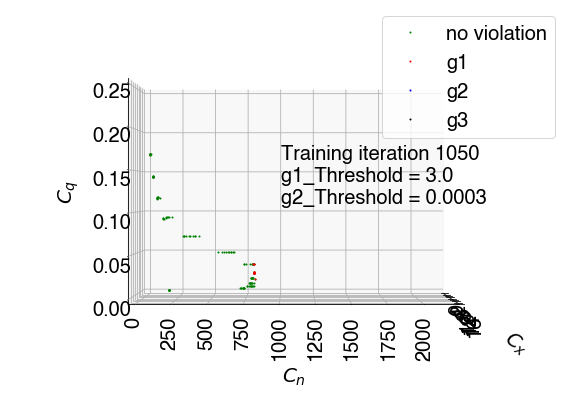

No. of states visited: 130
No. of states where g1 violated: 14
No. of states where g2 violated: 3
No. of states where g3 violated: 0


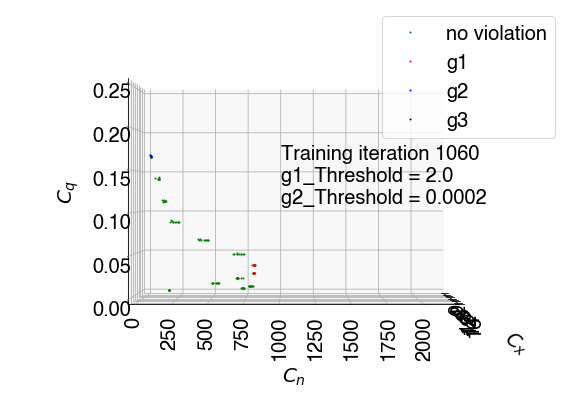

No. of states visited: 130
No. of states where g1 violated: 6
No. of states where g2 violated: 4
No. of states where g3 violated: 0


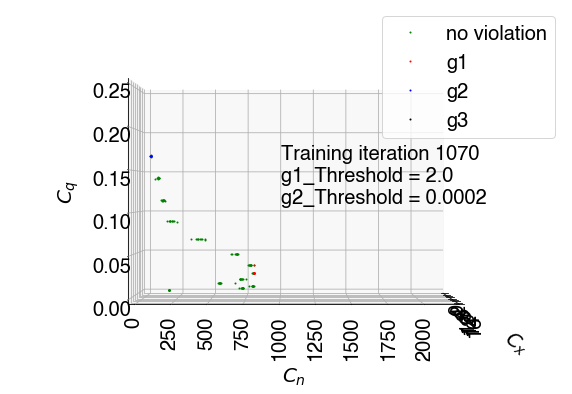

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 0
No. of states where g3 violated: 0


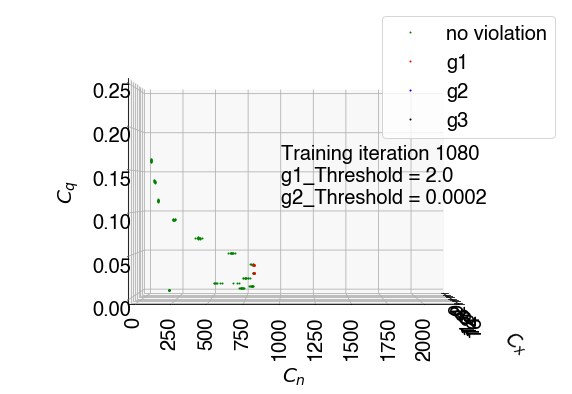

No. of states visited: 130
No. of states where g1 violated: 20
No. of states where g2 violated: 9
No. of states where g3 violated: 0


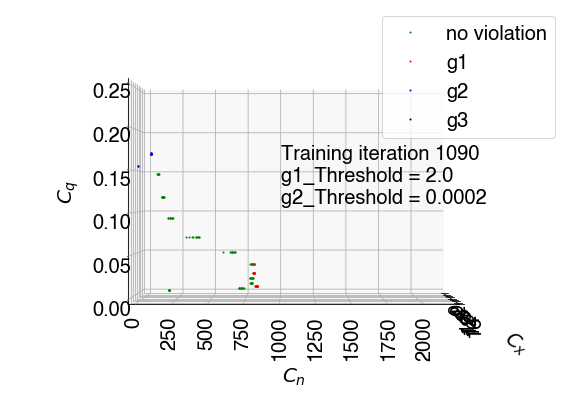

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 7
No. of states where g3 violated: 0


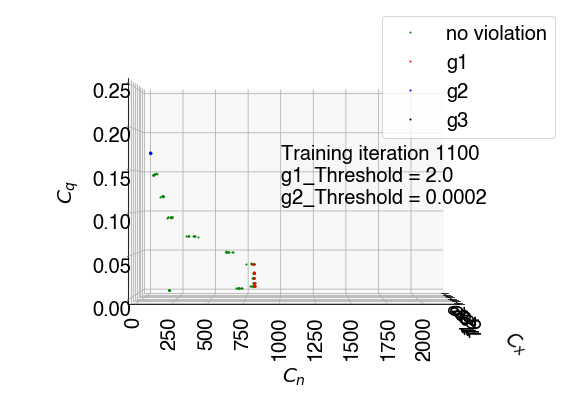

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 4
No. of states where g3 violated: 0


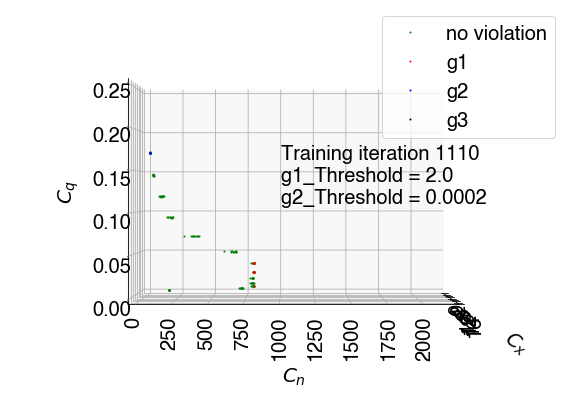

No. of states visited: 130
No. of states where g1 violated: 9
No. of states where g2 violated: 3
No. of states where g3 violated: 0


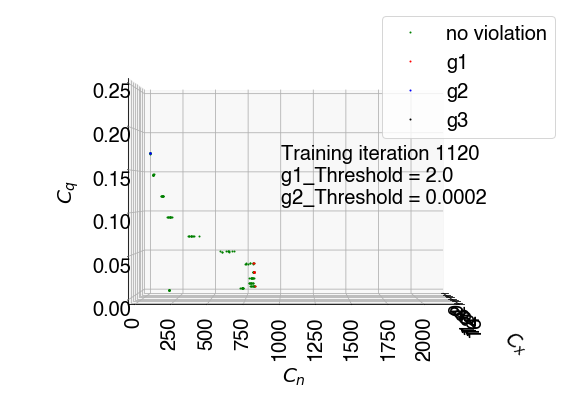

No. of states visited: 130
No. of states where g1 violated: 17
No. of states where g2 violated: 4
No. of states where g3 violated: 0


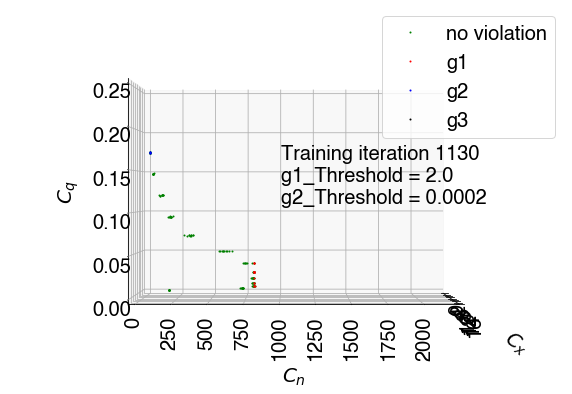

No. of states visited: 130
No. of states where g1 violated: 21
No. of states where g2 violated: 0
No. of states where g3 violated: 0


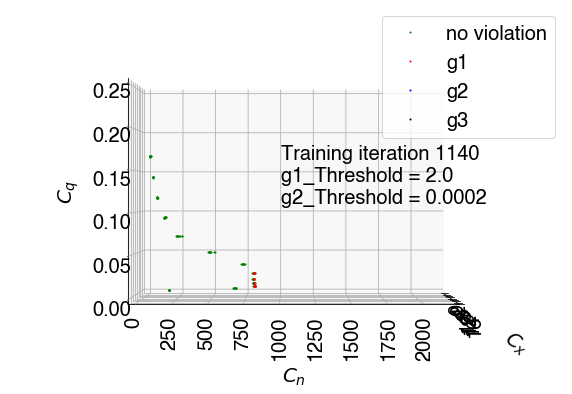

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 0
No. of states where g3 violated: 0


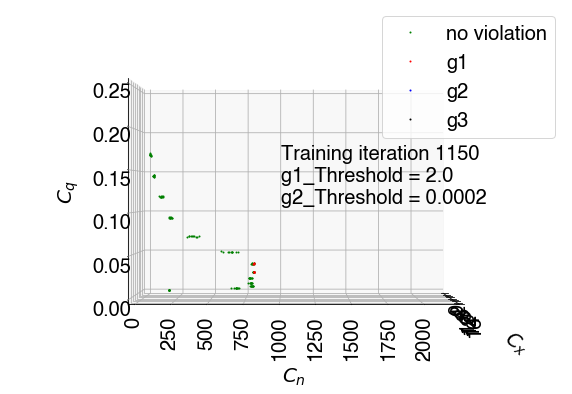

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 5
No. of states where g3 violated: 0


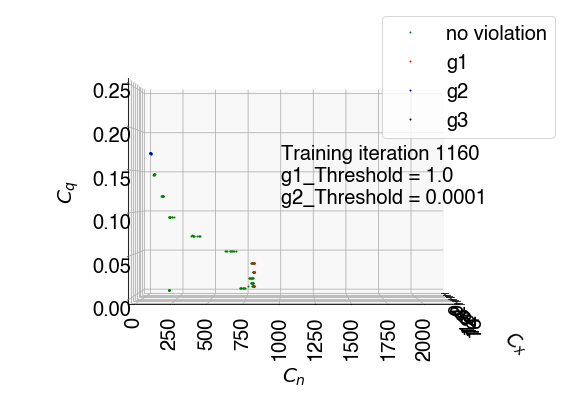

No. of states visited: 130
No. of states where g1 violated: 18
No. of states where g2 violated: 5
No. of states where g3 violated: 0


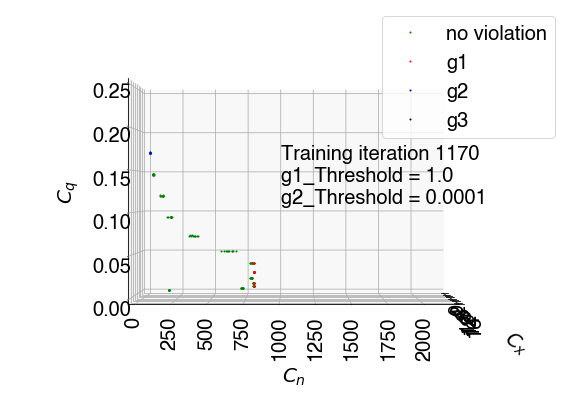

No. of states visited: 130
No. of states where g1 violated: 17
No. of states where g2 violated: 5
No. of states where g3 violated: 0


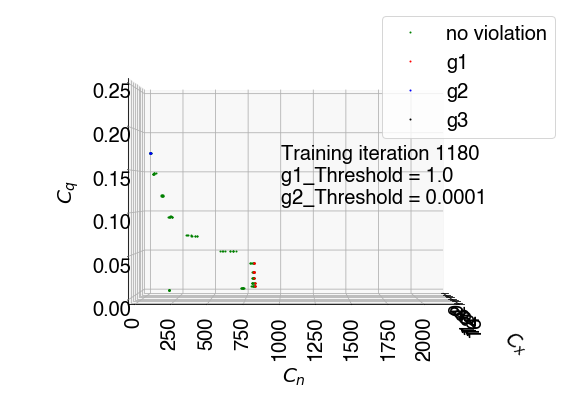

No. of states visited: 130
No. of states where g1 violated: 11
No. of states where g2 violated: 2
No. of states where g3 violated: 0


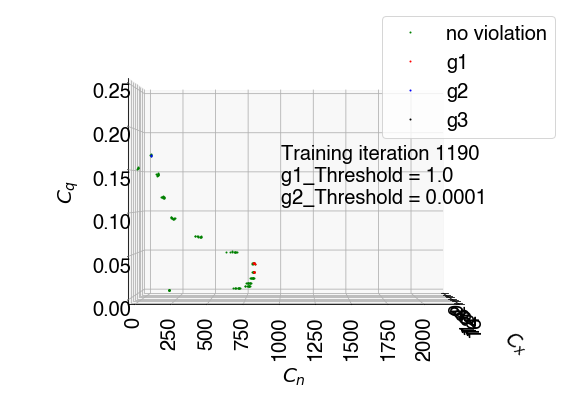

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 1
No. of states where g3 violated: 0


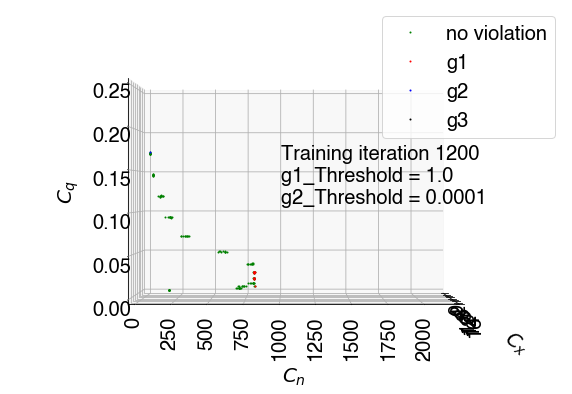

No. of states visited: 130
No. of states where g1 violated: 14
No. of states where g2 violated: 0
No. of states where g3 violated: 0


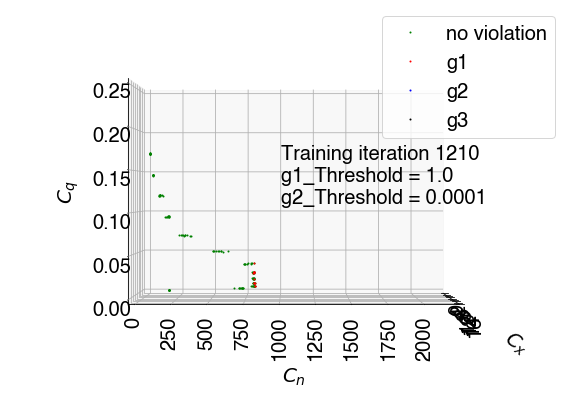

No. of states visited: 130
No. of states where g1 violated: 23
No. of states where g2 violated: 3
No. of states where g3 violated: 0


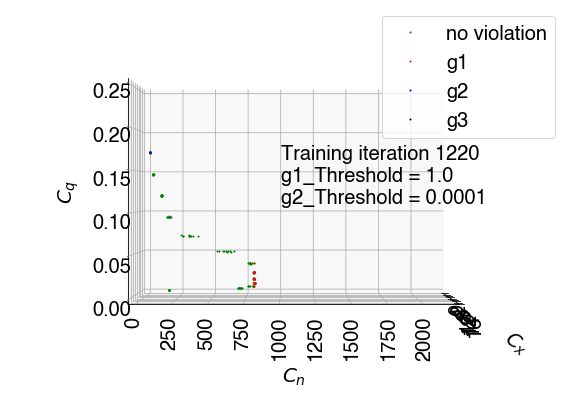

No. of states visited: 130
No. of states where g1 violated: 17
No. of states where g2 violated: 6
No. of states where g3 violated: 0


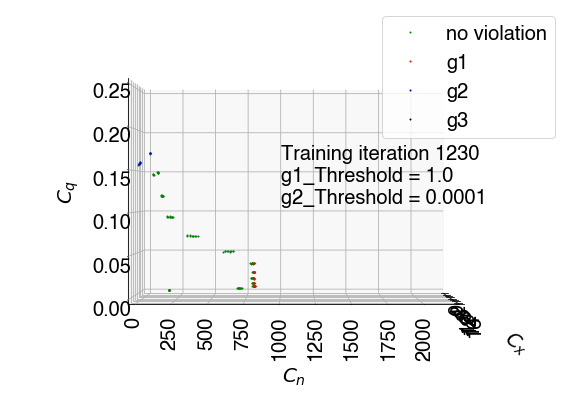

No. of states visited: 130
No. of states where g1 violated: 12
No. of states where g2 violated: 5
No. of states where g3 violated: 0


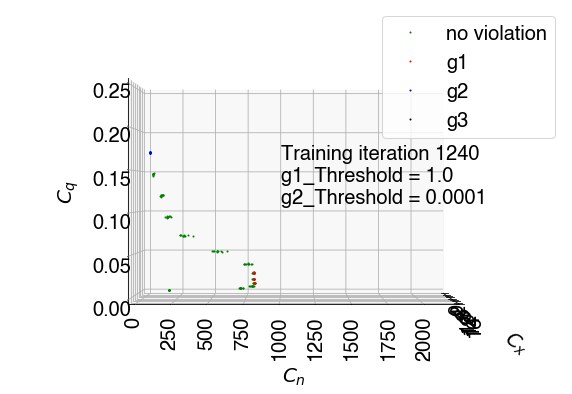

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 4
No. of states where g3 violated: 0


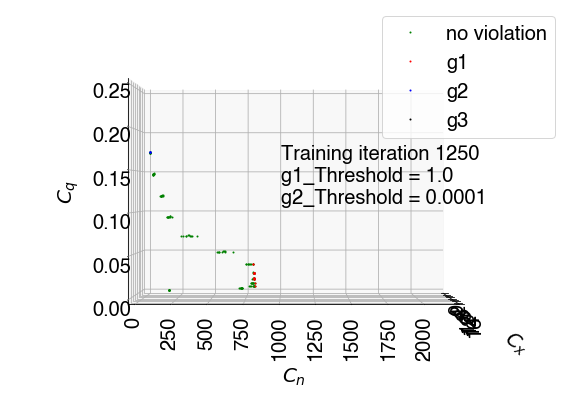

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 3
No. of states where g3 violated: 0


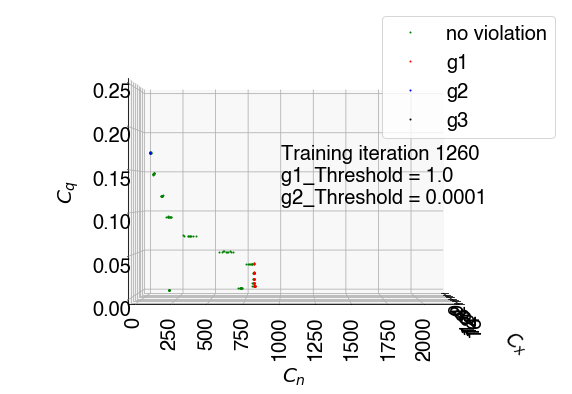

No. of states visited: 130
No. of states where g1 violated: 26
No. of states where g2 violated: 0
No. of states where g3 violated: 0


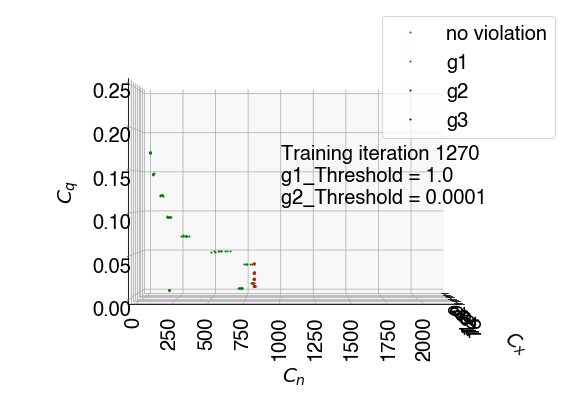

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 3
No. of states where g3 violated: 0


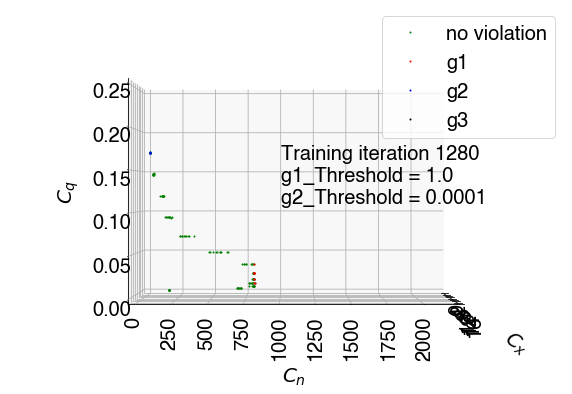

No. of states visited: 130
No. of states where g1 violated: 22
No. of states where g2 violated: 3
No. of states where g3 violated: 0


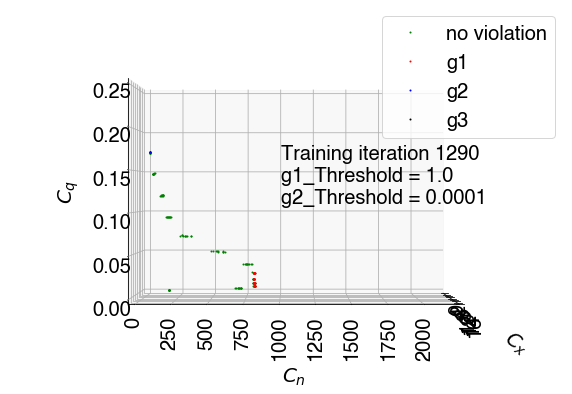

No. of states visited: 130
No. of states where g1 violated: 29
No. of states where g2 violated: 6
No. of states where g3 violated: 0


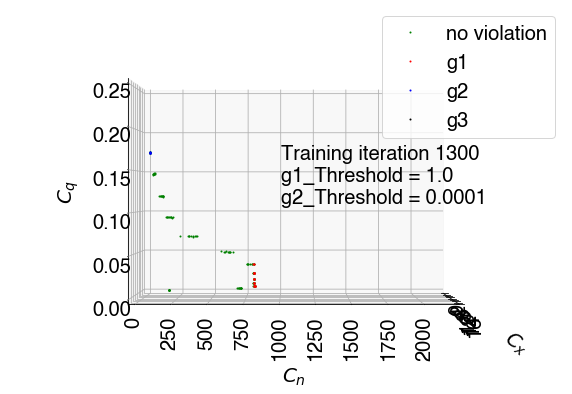

No. of states visited: 130
No. of states where g1 violated: 11
No. of states where g2 violated: 5
No. of states where g3 violated: 0


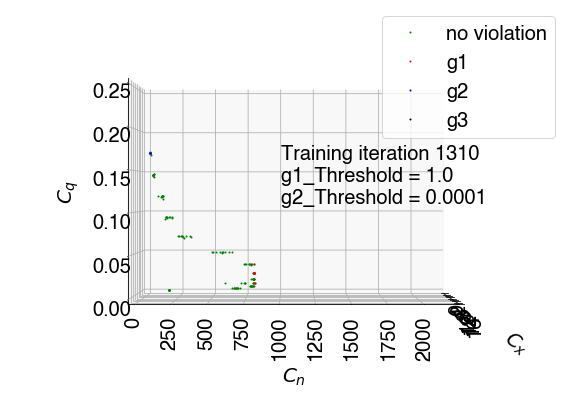

No. of states visited: 130
No. of states where g1 violated: 17
No. of states where g2 violated: 3
No. of states where g3 violated: 0


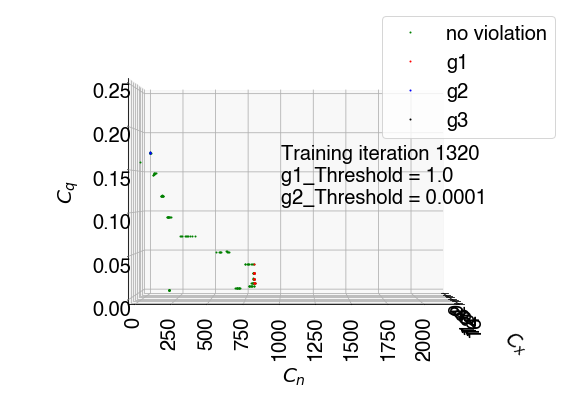

No. of states visited: 130
No. of states where g1 violated: 15
No. of states where g2 violated: 3
No. of states where g3 violated: 0


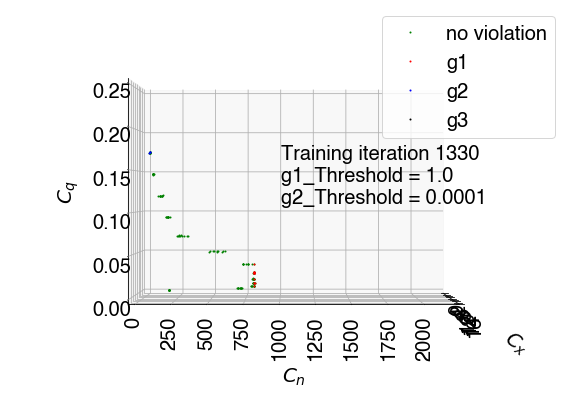

No. of states visited: 130
No. of states where g1 violated: 5
No. of states where g2 violated: 1
No. of states where g3 violated: 0


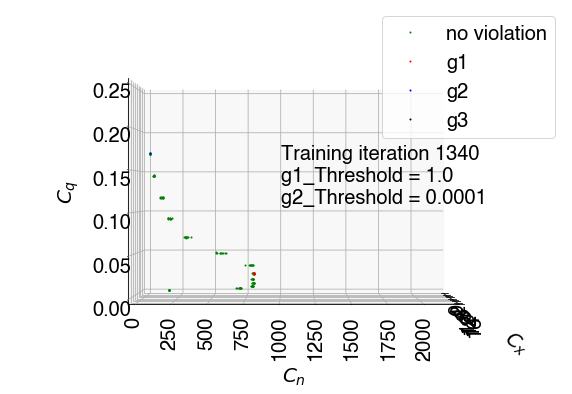

No. of states visited: 130
No. of states where g1 violated: 19
No. of states where g2 violated: 1
No. of states where g3 violated: 0


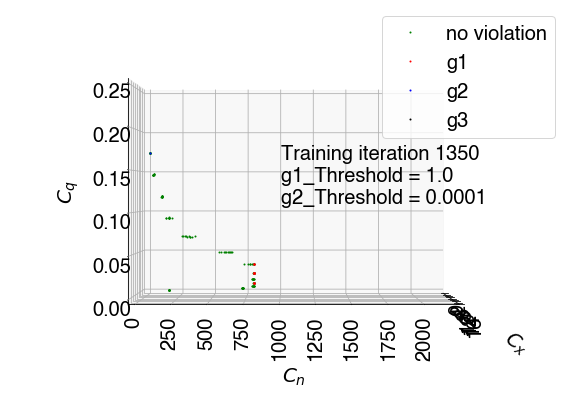

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


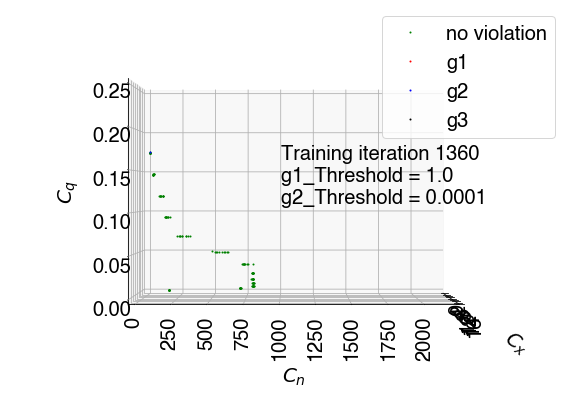

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 8
No. of states where g3 violated: 0


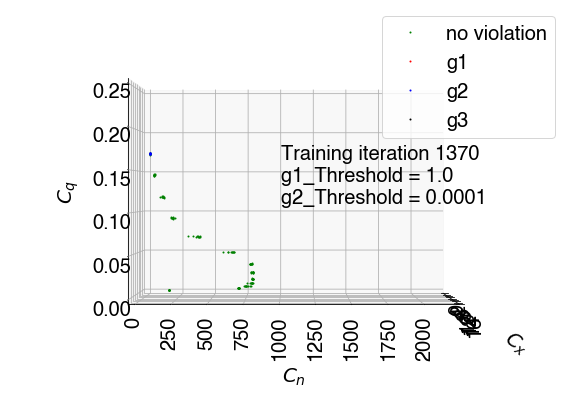

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 4
No. of states where g3 violated: 0


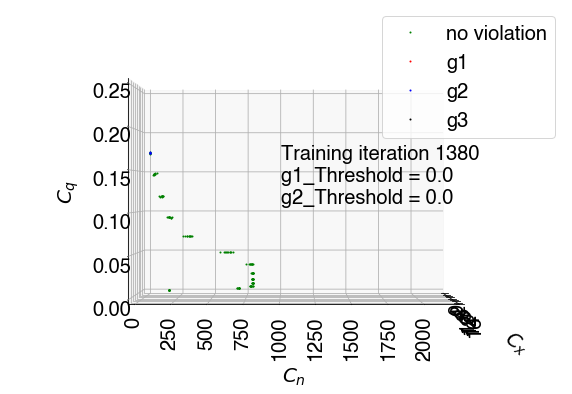

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


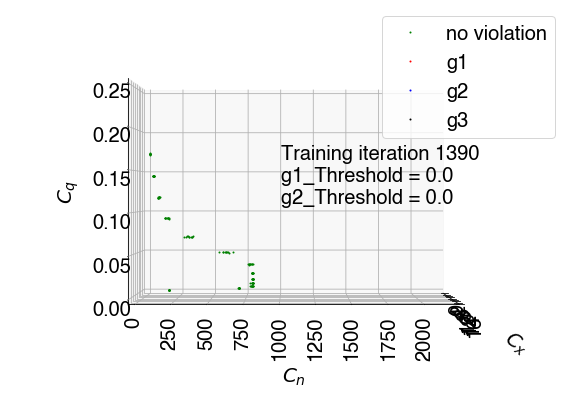

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 1
No. of states where g3 violated: 0


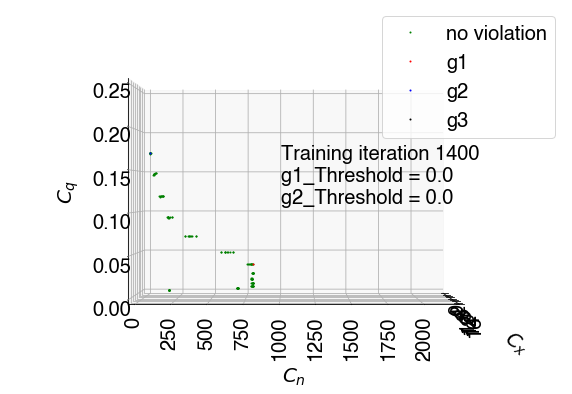

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 6
No. of states where g3 violated: 0


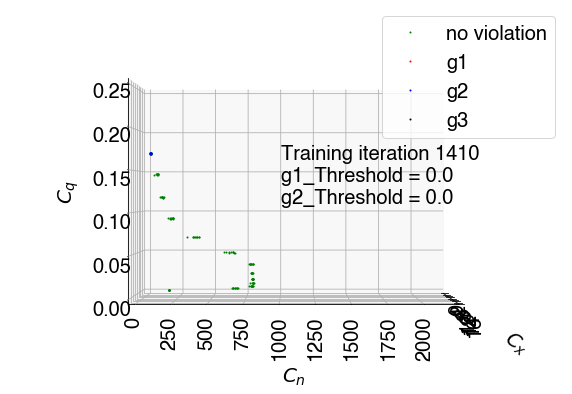

No. of states visited: 130
No. of states where g1 violated: 3
No. of states where g2 violated: 1
No. of states where g3 violated: 0


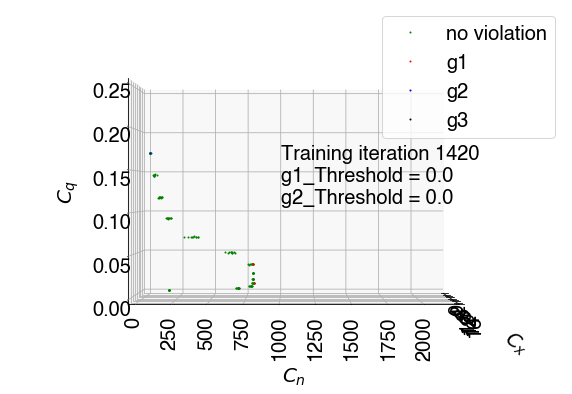

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 3
No. of states where g3 violated: 0


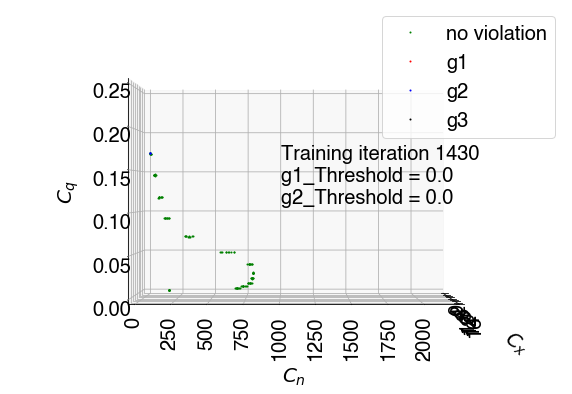

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


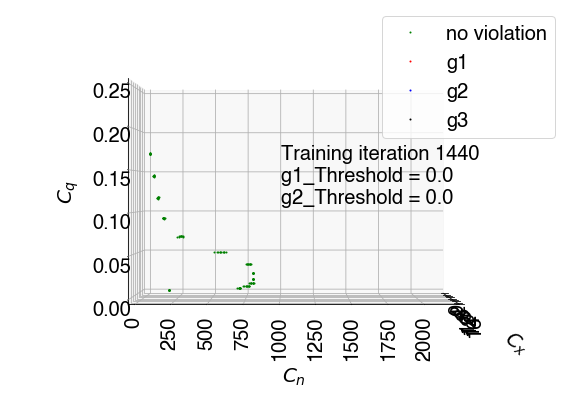

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


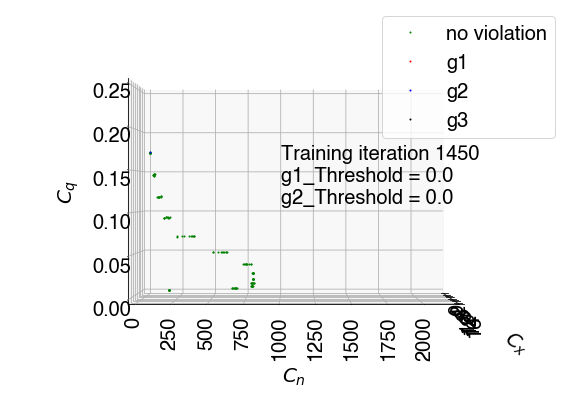

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


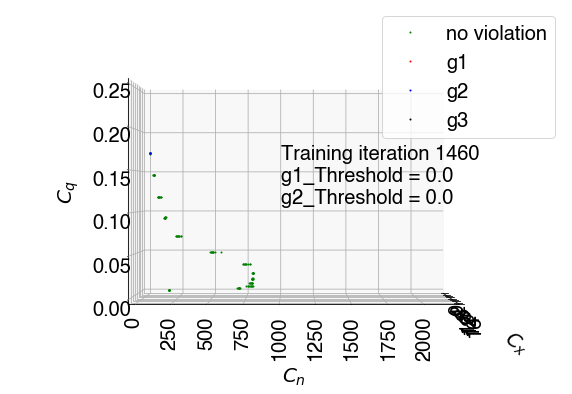

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


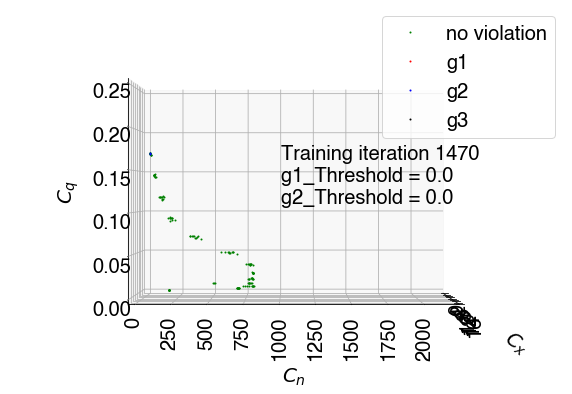

No. of states visited: 130
No. of states where g1 violated: 6
No. of states where g2 violated: 2
No. of states where g3 violated: 0


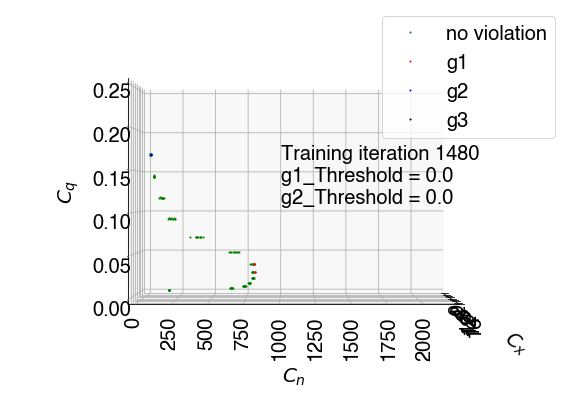

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


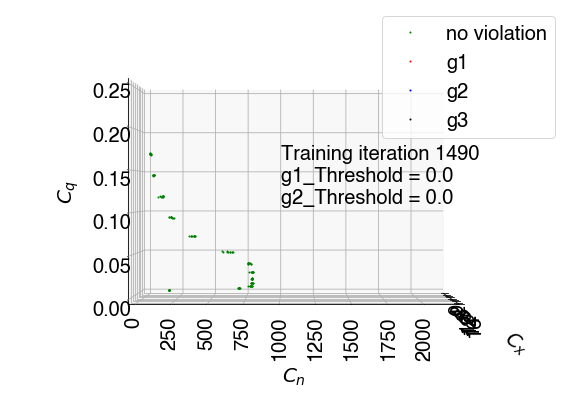

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


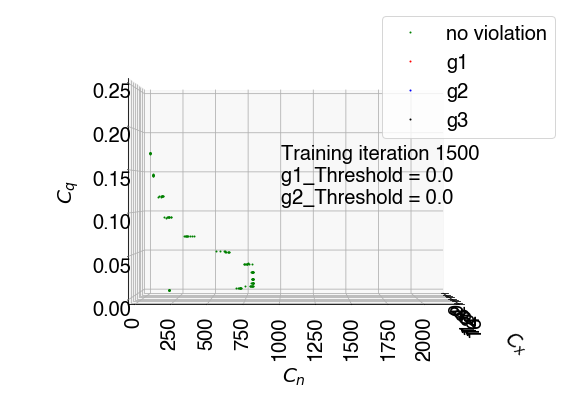

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 4
No. of states where g3 violated: 0


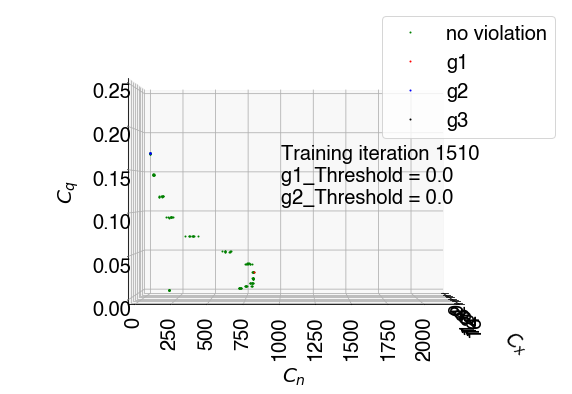

No. of states visited: 130
No. of states where g1 violated: 6
No. of states where g2 violated: 0
No. of states where g3 violated: 0


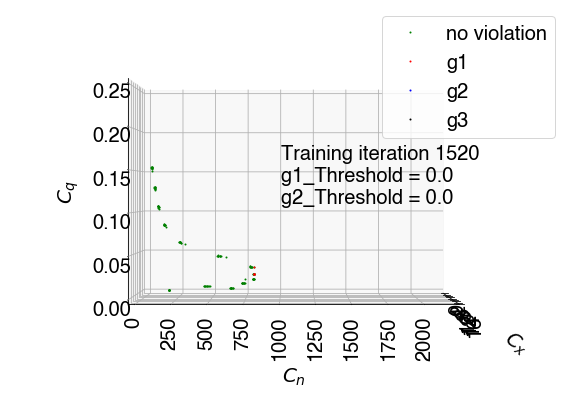

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


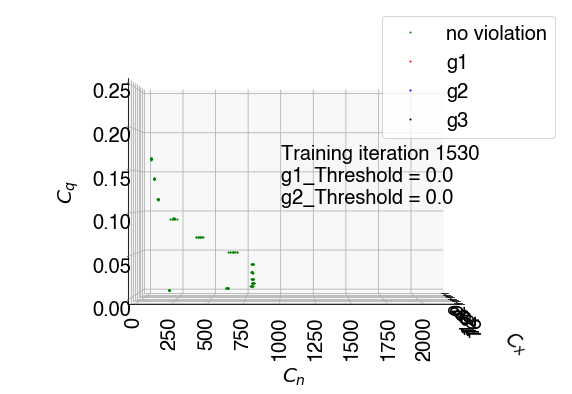

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


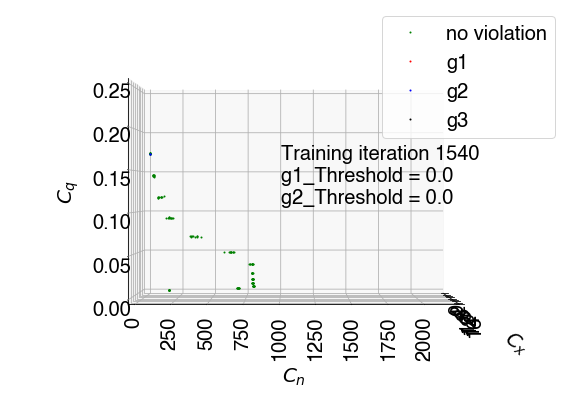

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


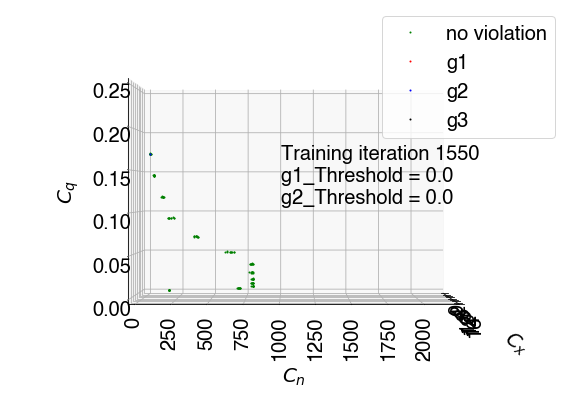

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


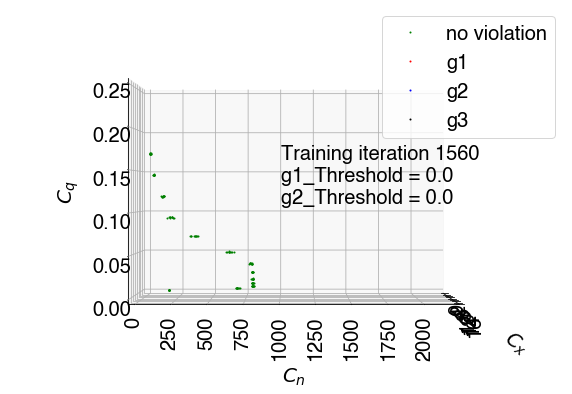

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 3
No. of states where g3 violated: 0


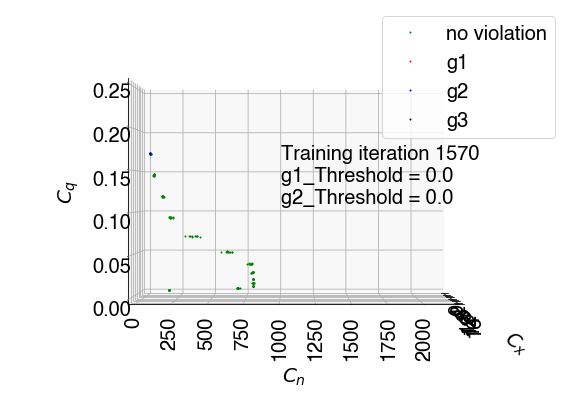

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 3
No. of states where g3 violated: 0


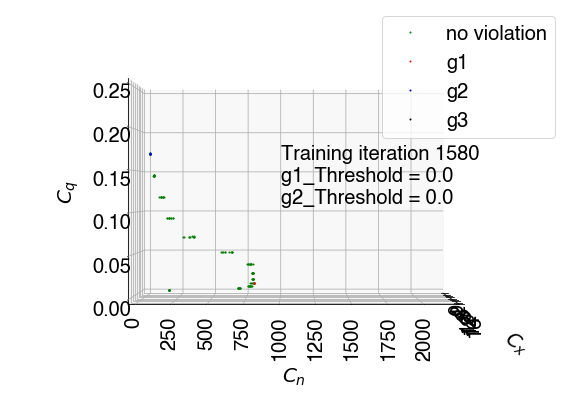

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 3
No. of states where g3 violated: 0


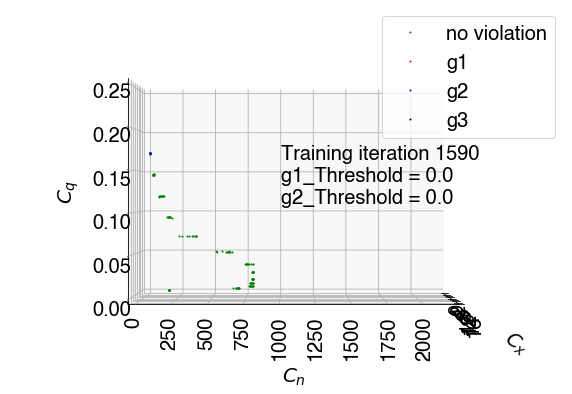

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


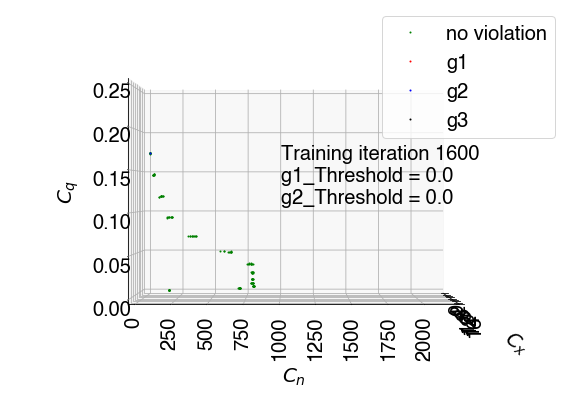

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


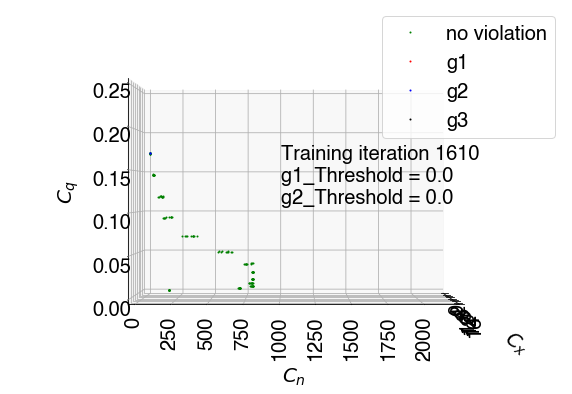

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


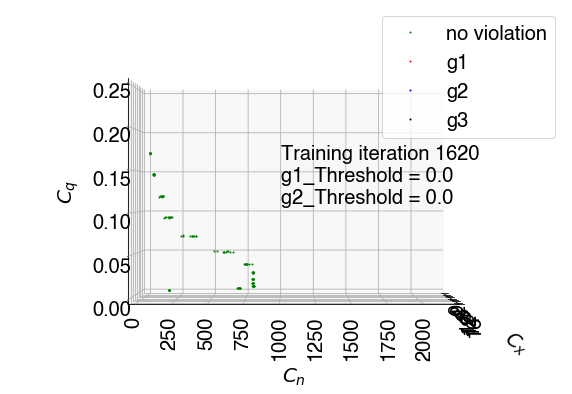

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


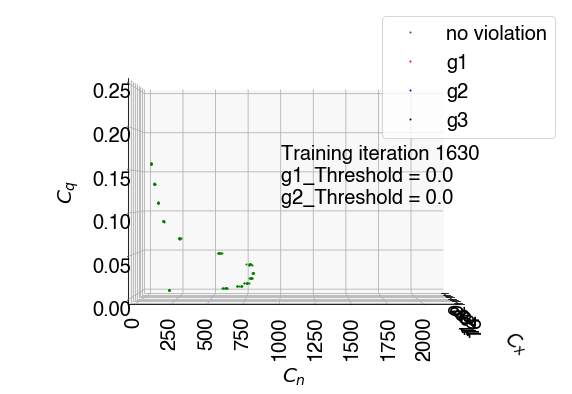

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


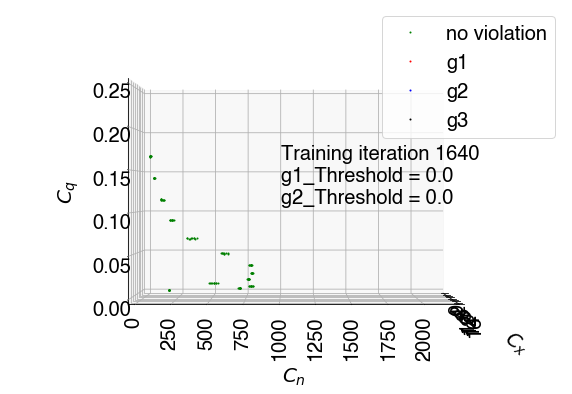

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 4
No. of states where g3 violated: 0


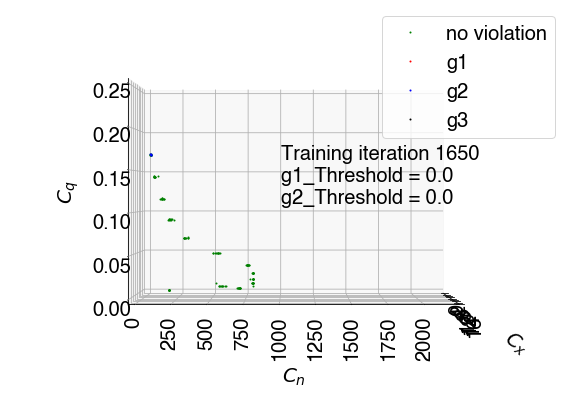

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 5
No. of states where g3 violated: 0


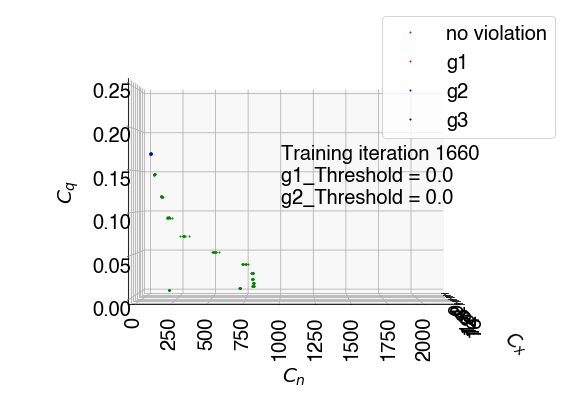

No. of states visited: 130
No. of states where g1 violated: 2
No. of states where g2 violated: 0
No. of states where g3 violated: 0


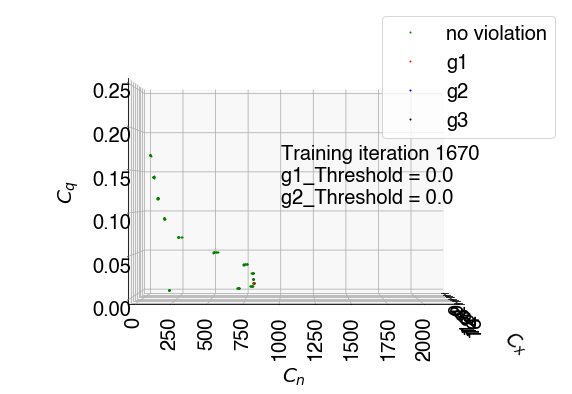

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 1
No. of states where g3 violated: 0


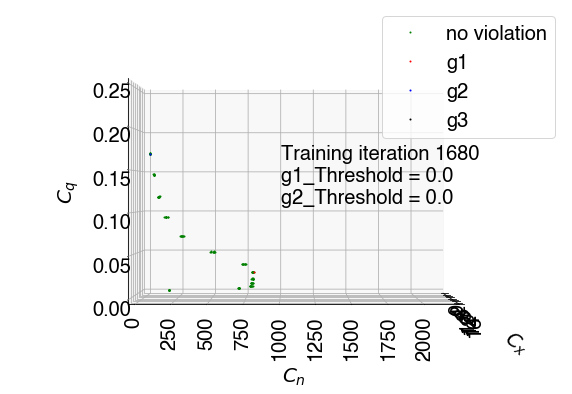

No. of states visited: 130
No. of states where g1 violated: 6
No. of states where g2 violated: 0
No. of states where g3 violated: 0


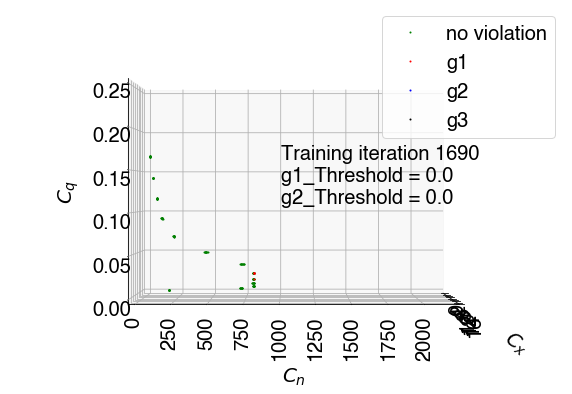

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


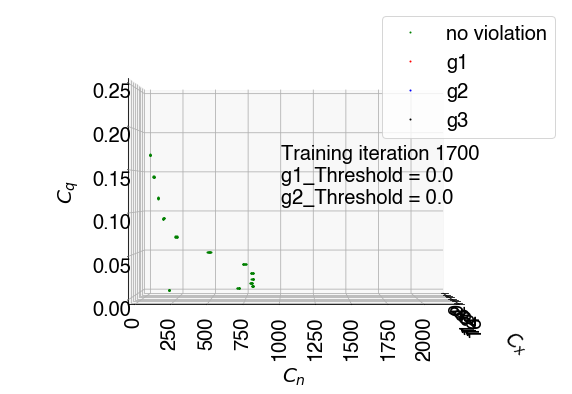

No. of states visited: 130
No. of states where g1 violated: 4
No. of states where g2 violated: 1
No. of states where g3 violated: 0


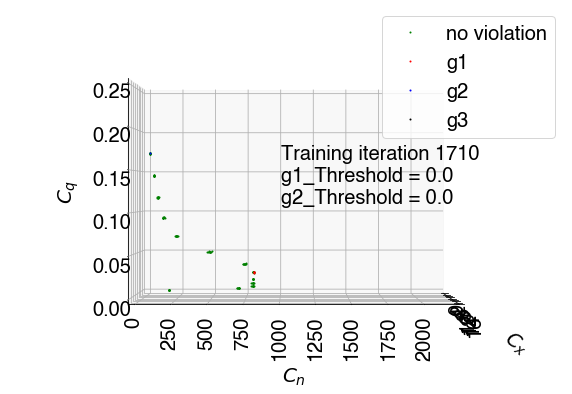

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


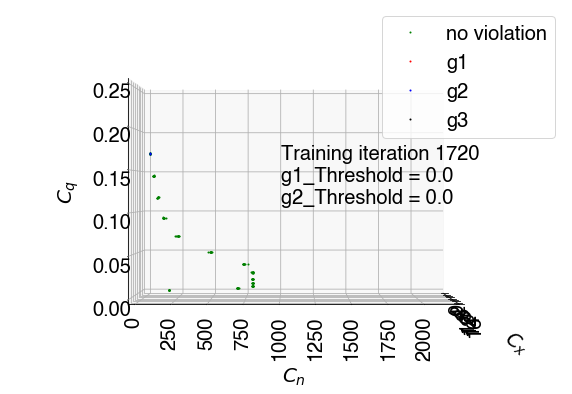

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


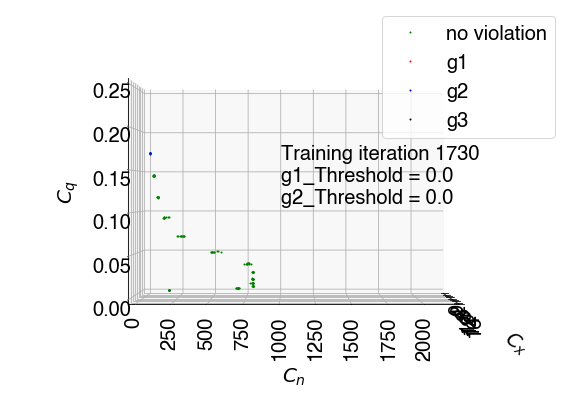

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


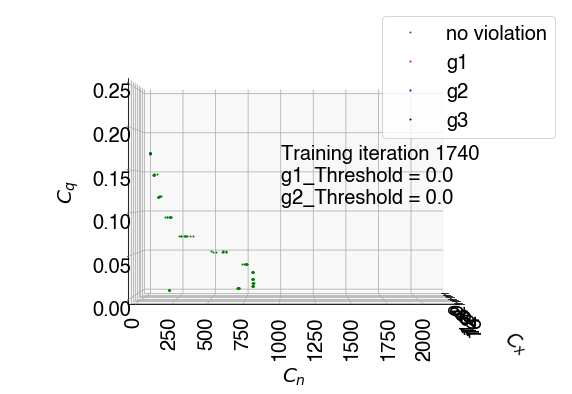

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


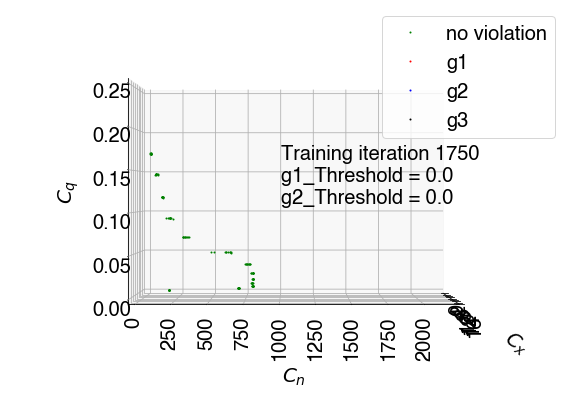

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


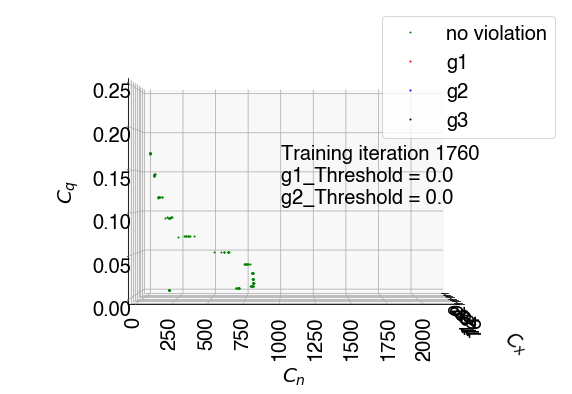

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 0
No. of states where g3 violated: 0


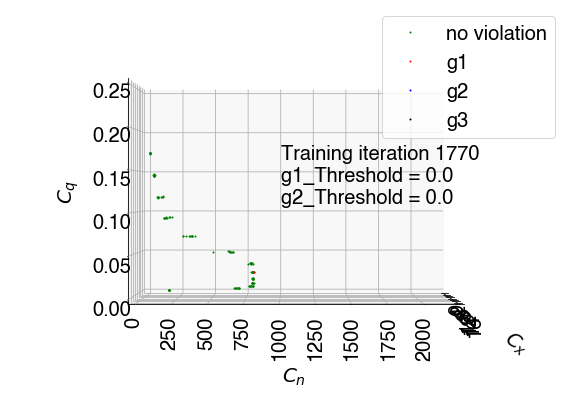

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 10
No. of states where g3 violated: 0


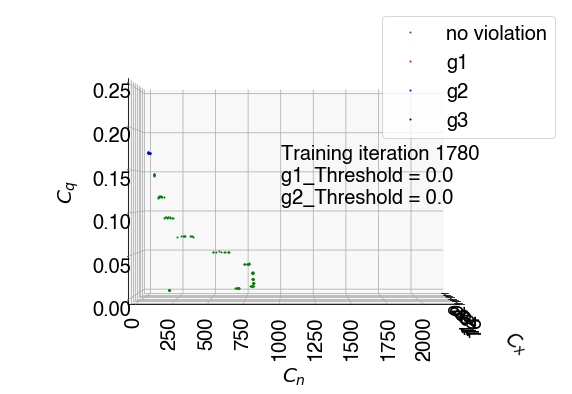

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 3
No. of states where g3 violated: 0


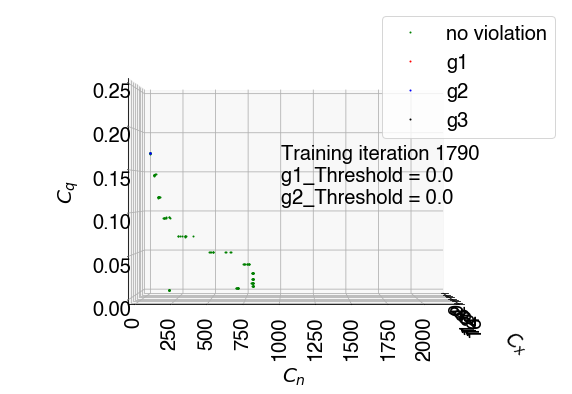

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 4
No. of states where g3 violated: 0


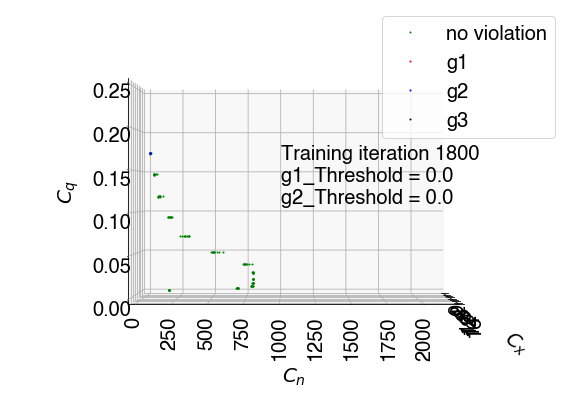

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 5
No. of states where g3 violated: 0


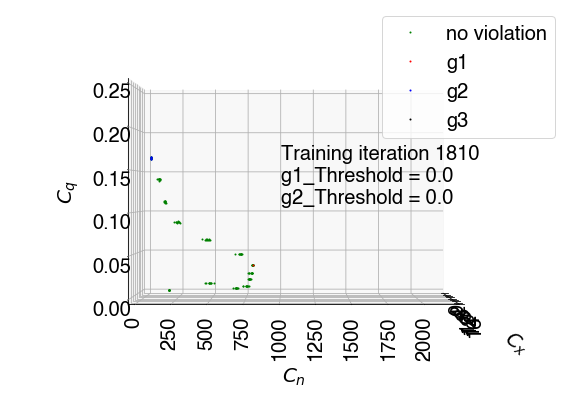

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


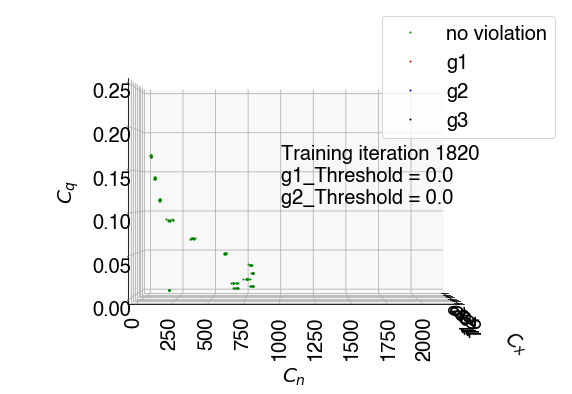

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


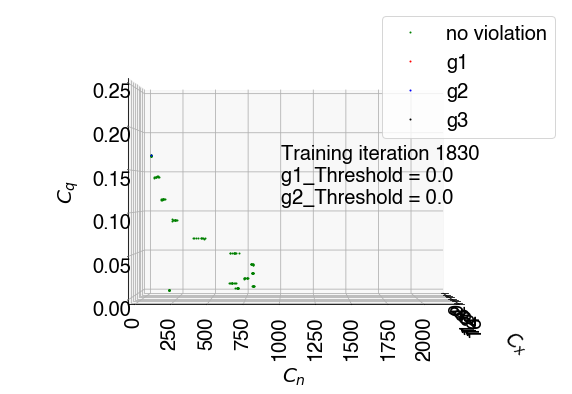

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


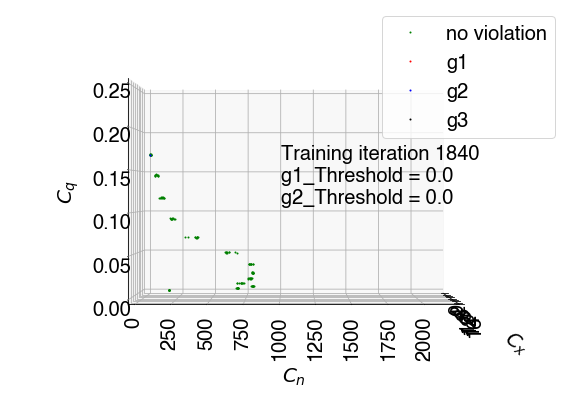

No. of states visited: 130
No. of states where g1 violated: 10
No. of states where g2 violated: 0
No. of states where g3 violated: 0


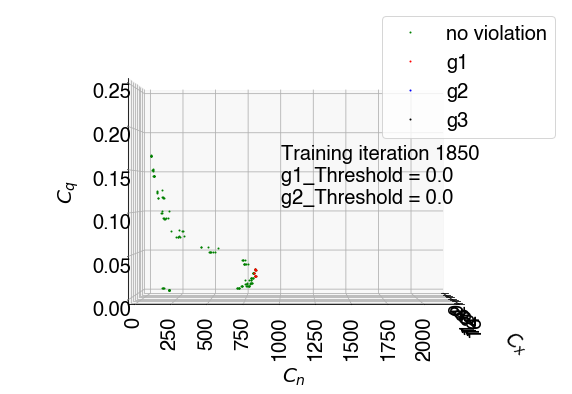

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


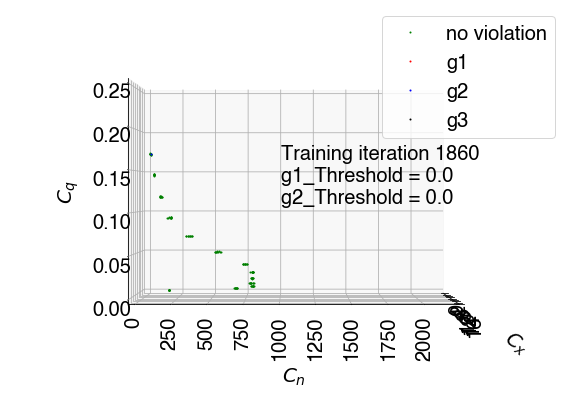

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


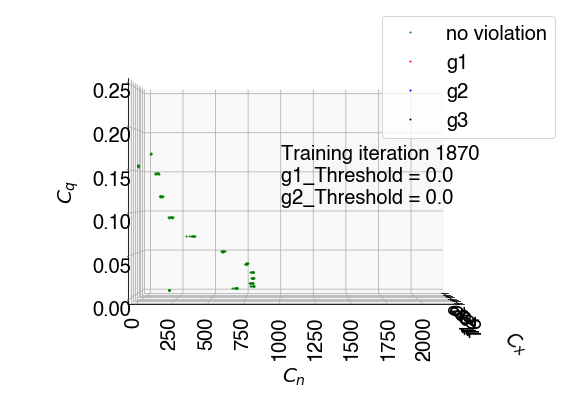

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 1
No. of states where g3 violated: 0


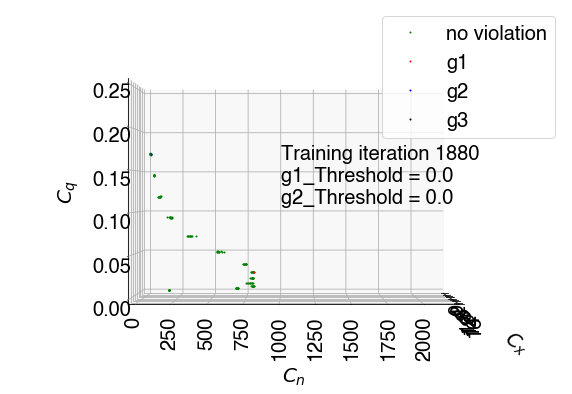

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


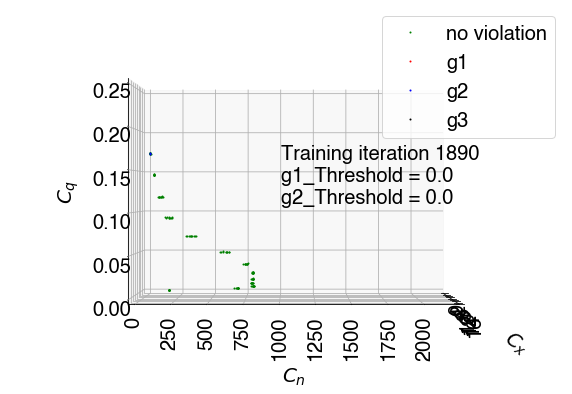

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 3
No. of states where g3 violated: 0


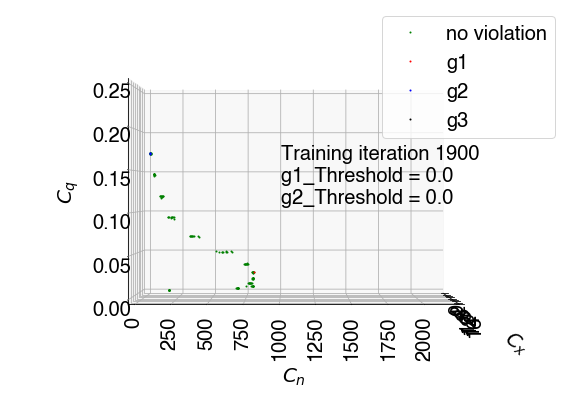

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


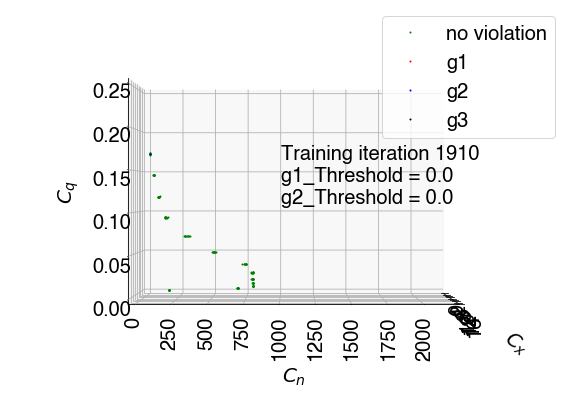

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 0
No. of states where g3 violated: 0


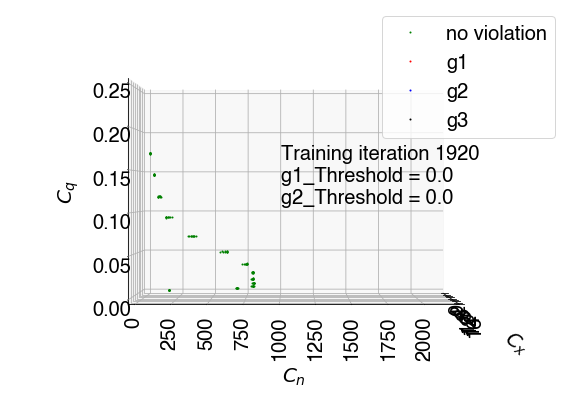

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 0
No. of states where g3 violated: 0


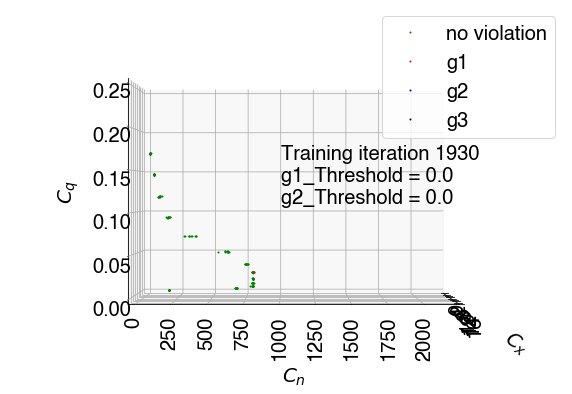

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 4
No. of states where g3 violated: 0


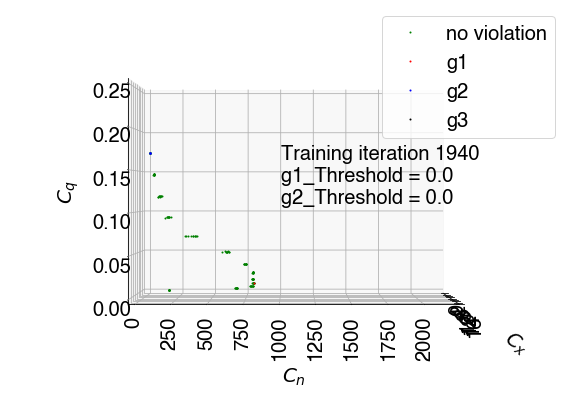

No. of states visited: 130
No. of states where g1 violated: 1
No. of states where g2 violated: 3
No. of states where g3 violated: 0


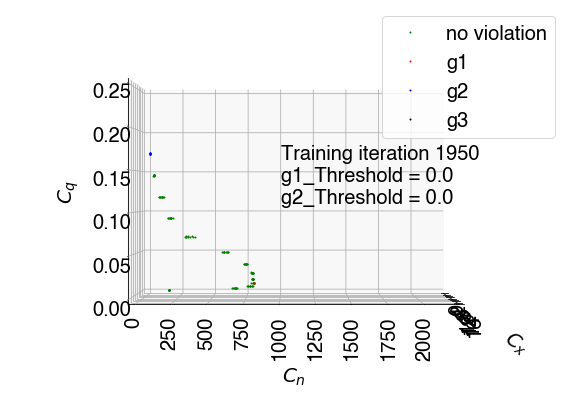

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


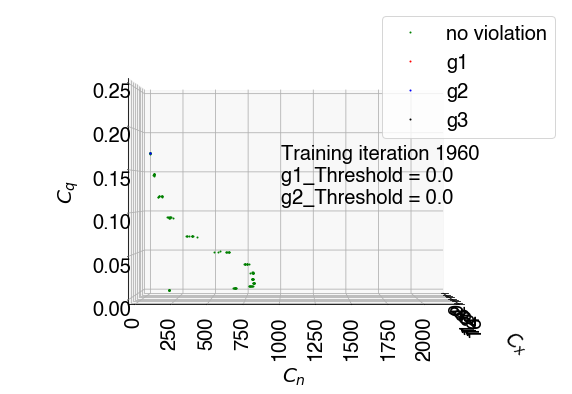

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 2
No. of states where g3 violated: 0


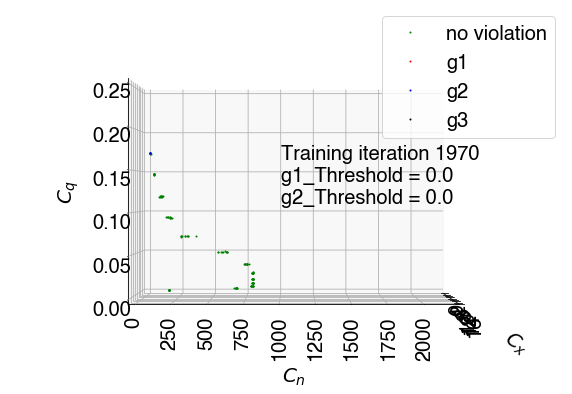

No. of states visited: 130
No. of states where g1 violated: 16
No. of states where g2 violated: 4
No. of states where g3 violated: 0


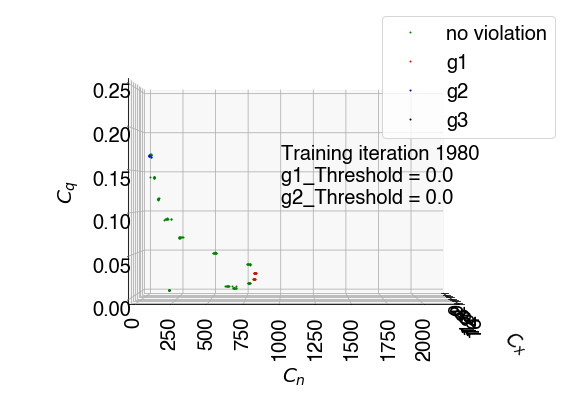

No. of states visited: 130
No. of states where g1 violated: 0
No. of states where g2 violated: 1
No. of states where g3 violated: 0


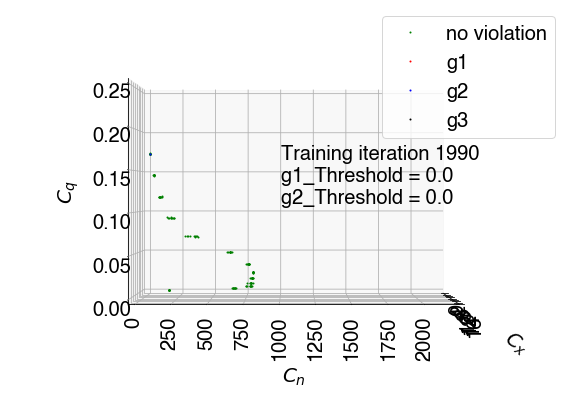

In [27]:
# Plot episode bank
my_images = []  # For saving into gif

for i in range(len(episode_bank)): # i is the index for iteration
    plotting_state_data = []
    
    for j in range(len(episode_bank[i])): # j is the index for different episodes
        episode = episode_bank[i][j]

        data = extract_data_from_episode(episode, discount_factor = 0.9)   # Extract datapoint from episode
        for z in data:
            z = z[:-1]
            plotting_state_data += z  # Add datapoints to training set
    iteration = iteration_list[::10][i] # Record training iteration
    g1_threshold = g1_threshold_list[::10][i] # Record g1_threshold
    g2_threshold = g2_threshold_list[::10][i] # Record g1_threshold
    # plotting_state_data
    plotting_state_data = pd.DataFrame(plotting_state_data)
    plotting_state_data_g1_violated = plotting_state_data[plotting_state_data[1] - 800 > 0] # Conpath 1
    plotting_state_data_g2_violated = plotting_state_data[plotting_state_data[2] - 0.011*plotting_state_data[0] > 0] # Conpath 2
    plotting_state_data_g3_violated = plotting_state_data[(plotting_state_data[3] == 240.0) & (plotting_state_data[1] - 150 > 0)] # Terminal constraint

    print('No. of states visited:',len(plotting_state_data))
    print('No. of states where g1 violated:',len(plotting_state_data_g1_violated))
    print('No. of states where g2 violated:',len(plotting_state_data_g2_violated))
    print('No. of states where g3 violated:',len(plotting_state_data_g3_violated))

    Cx_all = plotting_state_data[0]
    Cn_all = plotting_state_data[1]
    Cq_all = plotting_state_data[2]

    Cx_g1 = plotting_state_data_g1_violated[0]
    Cn_g1 = plotting_state_data_g1_violated[1]
    Cq_g1 = plotting_state_data_g1_violated[2]

    Cx_g2 = plotting_state_data_g2_violated[0]
    Cn_g2 = plotting_state_data_g2_violated[1]
    Cq_g2 = plotting_state_data_g2_violated[2]

    Cx_g3 = plotting_state_data_g3_violated[0]
    Cn_g3 = plotting_state_data_g3_violated[1]
    Cq_g3 = plotting_state_data_g3_violated[2]

    
    fig = plt.figure(figsize = (10,7))
    ax = plt.axes(projection='3d')

    # Data for a three-dimensional line
    ax.plot3D(Cx_all, Cn_all, Cq_all, 'g', label = 'no violation', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g1, Cn_g1, Cq_g1, 'r', label = 'g1', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g2, Cn_g2, Cq_g2, 'b', label = 'g2', linestyle = '', marker = 'o', markersize = 1)
    ax.plot3D(Cx_g3, Cn_g3, Cq_g3, 'black', label = 'g3', linestyle = '', marker = 'o', markersize = 1)
    plt.xlabel('$C_x$', labelpad=30)
    plt.ylabel('$C_n$', labelpad=50)
    ax.set_zlabel('$C_q$', fontsize=20, labelpad=20)
    plt.legend()
    plt.xticks(rotation=90)
    plt.yticks(rotation=90)
    plt.xlim(0,16)
    plt.ylim(0,2200)
    ax.set_zlim(0, 0.25)
    plt.legend()
    ax.text(0,1000,0.11,'Training iteration {} \ng1_Threshold = {} \ng2_Threshold = {}'.format(iteration, round(g1_threshold,0), round(g2_threshold,4)),None)
    ax.view_init(0,0)
    plt.show()
        
    # Used to return the plot as an image array 
    # (https://ndres.me/post/matplotlib-animated-gifs-easily/)
    fig.canvas.draw()       # draw the canvas, cache the renderer
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image  = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))
    my_images.append(image)

# save images as a gif    
imageio.mimsave('./Data/CS1_training_g1g2_2000_ep.gif', my_images, fps=10)

## Plot trajectory

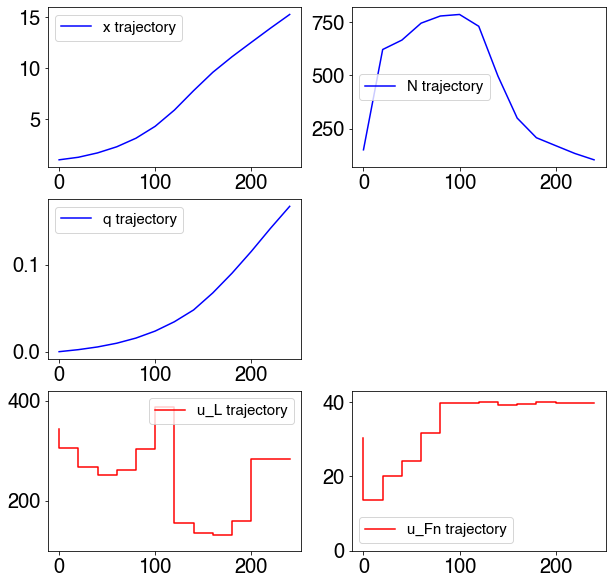

Score: 0.16683450084575152


In [82]:
# Plot 1 episode
episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   g1_threshold = 0, g2_threshold = 0)
plot_episode(episode)

In [30]:
# SAVING EPISODE POOL - JSON WORKS BUT NOT PICKLE BCOS NESTED LIST
import json
# open output file for writing
# with open('./Data/CS1_episode_pool_g1g2_2000_ep', 'w') as f:
#     json.dump(episode_pool, f)
# # open output file for reading
# with open('./Data/CS1_episode_pool_g1g2_2000_ep', 'r') as f:
#     episode_pool = json.load(f)

<ipython-input-1-ae360b80e254>:538: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3,2,1)
<ipython-input-1-ae360b80e254>:546: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(3,2,2)
<ipython-input-1-ae360b80e254>:553: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

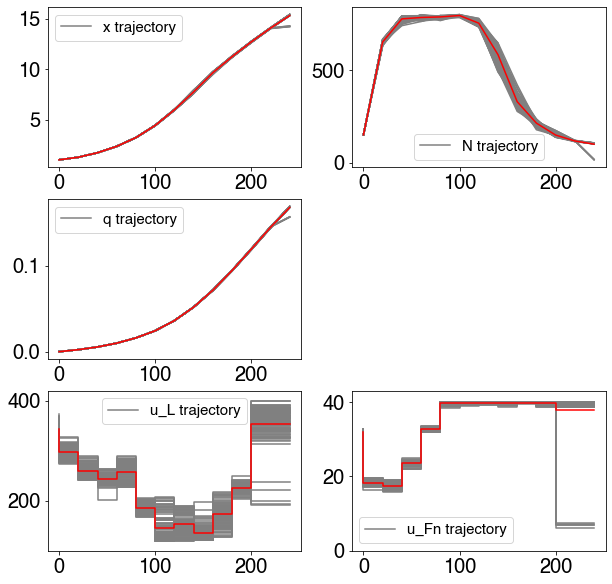

Score: 0.16840668098514738


In [29]:
# Plot average of 100 episodes
episode_pool = []
for i in range(100):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                   g1_threshold = -3, g2_threshold = -0.001) 
    episode_pool += [episode]
    
plot_episode_pool(episode_pool)

## Distribution of g values

In [31]:
max_g1_list = []
max_g2_list = []
max_g3_list = []
for i in range(100):
    episode = generate_episode_with_NN(GA_optimize_constrained, [1.0, 150.0, 0, 0], epsilon = 0, 
                                       g1_threshold = -3, g2_threshold = -0.001)
    # WORST violation of this episode
    max_g1 = max(extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150)[1])[0]
    max_g2 = max(extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150)[2])[0]
    max_g3 = max(extract_constraint_values_from_episode(episode, N_limit = 800, terminal_N_limit = 150)[3])[0]
    max_g1_list += [max_g1]
    max_g2_list += [max_g2]
    max_g3_list += [max_g3]

In [34]:
# # Save data
# with open('./Data/CS1_max_g1_g1g2_2000_ep', 'wb') as f:
#     pickle.dump(max_g1_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_max_g2_g1g2_2000_ep', 'wb') as f:
#     pickle.dump(max_g2_list, f, pickle.HIGHEST_PROTOCOL)
# with open('./Data/CS1_max_g3_g1g2_2000_ep', 'wb') as f:
#     pickle.dump(max_g3_list, f, pickle.HIGHEST_PROTOCOL)
    
# # Load pre-run data
# with open('./Data/CS1_max_g1_g1g2_2000_ep', 'rb') as f:
#     max_g1_list = pickle.load(f)
# with open('./Data/CS1_max_g2_g1g2_2000_ep', 'rb') as f:
#     max_g2_list = pickle.load(f)
# with open('./Data/CS1_max_g3_g1g2_2000_ep', 'rb') as f:
#     max_g3_list = pickle.load(f)

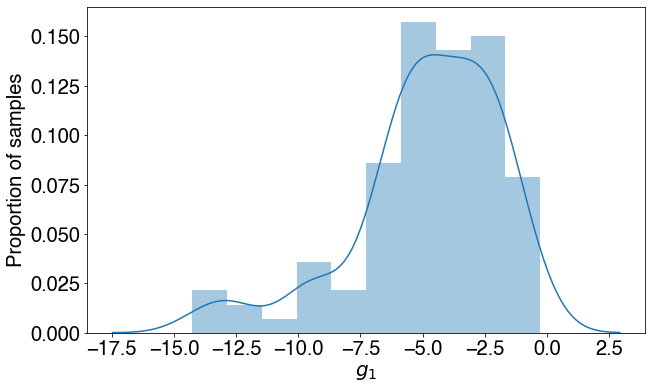

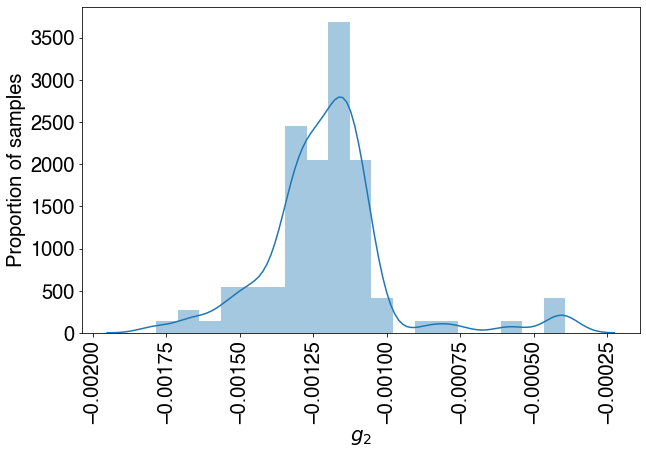

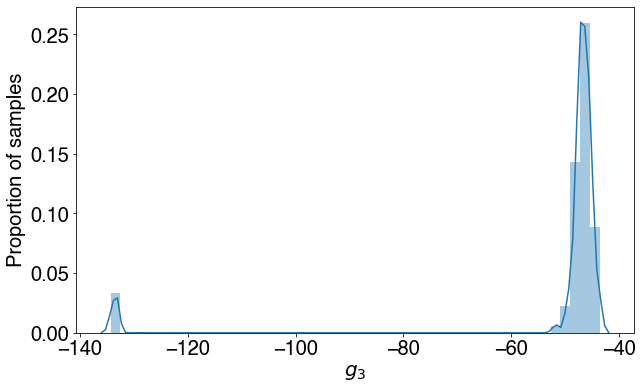

In [33]:
# Plot distribution of g1
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(max_g1_list)
ax.set(xlabel= '$g_1$', ylabel = 'Proportion of samples')
plt.show()
# Plot distribution of g2
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(max_g2_list)
ax.set(xlabel= '$g_2$', ylabel = 'Proportion of samples')
plt.xticks(rotation=90)
plt.show()
# Plot distribution of g1
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.distplot(max_g3_list)
ax.set(xlabel= '$g_3$', ylabel = 'Proportion of samples')
plt.show()